In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import seaborn as sns
import os
import scipy.stats as ss
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from contextlib import contextmanager
import joblib
import platform
import tensorflow as tf
import random
import shap
import lime
import lime.lime_tabular

import IPython
from IPython.display import display, HTML

IPython.core.display.display = display
IPython.core.display.HTML    = HTML

/opt/anaconda3/envs/dp-env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def set_global_determinism(seed=42):
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    tf.config.threading.set_inter_op_parallelism_threads(1)
    tf.config.threading.set_intra_op_parallelism_threads(1)
    tf.keras.utils.set_random_seed(seed)

# Call this function **immediately after imports** and before doing anything else
set_global_determinism(42)

In [3]:
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import brier_score_loss
from sklearn.calibration import calibration_curve
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import roc_curve, auc
from sklearn.utils import resample
from sklearn.utils.class_weight import compute_class_weight


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import to_categorical


import IPython
from IPython.display import display, HTML

IPython.core.display.display = display
IPython.core.display.HTML    = HTML

RANDOM_SEED = 2080
np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

In [4]:
from tensorflow_privacy.privacy.optimizers.dp_optimizer_keras import DPKerasAdamOptimizer
import dp_xgboost as dp_xgboost

In [5]:
df = pd.read_csv("../data/icu_train.csv")
df_test = pd.read_csv("../data/icu_test.csv")
print(df.shape)
df.columns

(73370, 141)


Index(['age', 'bmi', 'elective_surgery', 'gender', 'pre_icu_los_days',
       'apache_post_operative', 'arf_apache', 'bun_apache',
       'creatinine_apache', 'gcs_motor_apache',
       ...
       'apache_2_diagnosis_219.0', 'apache_2_diagnosis_301.0',
       'apache_2_diagnosis_302.0', 'apache_2_diagnosis_303.0',
       'apache_2_diagnosis_304.0', 'apache_2_diagnosis_305.0',
       'apache_2_diagnosis_306.0', 'apache_2_diagnosis_307.0',
       'apache_2_diagnosis_308.0', 'hospital_death'],
      dtype='object', length=141)

In [6]:
X_train = df.drop(columns=["hospital_death"])
y_train = df["hospital_death"].astype(int)
X_test = df_test.drop(columns=["hospital_death"])
y_test = df_test["hospital_death"].astype(int)

## Helper Functions

In [7]:
def evaluate(name, y_true, y_prob, threshold = .5):
    y_pred = (y_prob >= threshold).astype(int)

    acc = accuracy_score(y_true, y_pred)
    auc = roc_auc_score(y_true, y_prob)
    prec = precision_score(y_true, y_pred)
    rec = recall_score(y_true, y_pred)
    f1  = f1_score(y_true, y_pred, average='binary')
    f1_w = f1_score(y_true, y_pred, average='weighted')

    print(f"\n=== {name} ===")
    print(f"Accuracy : {acc:.4f}")
    print(f"AUROC : {auc:.4f}")
    print(f"Precision : {prec:.4f}")
    print(f"Recall : {rec:.4f}")
    print(f"F1 : {f1:.4f}")
    print(f"F1_weighted : {f1_w:.4f}")
    print("-" * 40)

    return {"model": name, "acc": acc, "auc": auc, "prec": prec, "rec": rec, "f1": f1, "f1_weighted": f1_w}

def plot_metric(results, metric='f1'):
    df = pd.DataFrame(results)
    
    df['run'] = df.groupby('model').cumcount() + 1
    df['label'] = df['model'] + ' #' + df['run'].astype(str)
    
    count = len(df)
    width = max(8, count * 0.4)
    _, ax = plt.subplots(figsize=(width, 6))
    
    ax.bar(df['label'], df[metric])
    ax.set_ylabel(metric.upper() + ' Score')
    ax.set_title(f'{metric.upper()} Score by Model and Run')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

@contextmanager
def safe_parallel_backend():
    system = platform.system()
    is_wsl = 'microsoft' in platform.uname().release.lower()

    if system == "Windows" or is_wsl:
        with joblib.parallel_backend('threading'):
            yield
    else:
        yield

classes = np.unique(y_train)
cw = compute_class_weight(class_weight='balanced', classes=classes, y=y_train)
class_weight_dict = dict(zip(classes, cw))
sample_weight_train = np.array([class_weight_dict[y] for y in y_train])

results = []

## Logistic Regression

In [8]:
X = X_train.copy()
y = y_train.copy()
X_majority = X[y == 0]
y_majority = y[y == 0]
X_minority = X[y == 1]
y_minority = y[y == 1]

X_majority_down, y_majority_down = resample(
    X_majority, y_majority,
    replace=False,
    n_samples=len(y_minority),
    random_state=RANDOM_SEED)

X_bal = pd.concat([X_minority, X_majority_down], axis=0)
y_bal = pd.concat([y_minority, y_majority_down], axis=0)

perm = np.random.RandomState(RANDOM_SEED).permutation(len(y_bal))
X_bal = X_bal.iloc[perm].reset_index(drop=True)
y_bal = y_bal.iloc[perm].reset_index(drop=True)

print("Balanced training set class counts:")
print(y_bal.value_counts())


log_clf_bal = LogisticRegression(
    max_iter=3000,
    penalty="l2",
    solver="lbfgs",
    n_jobs=1,
    random_state=RANDOM_SEED)
log_clf_bal.fit(X_bal, y_bal)

y_pred_bal = log_clf_bal.predict(X_test)
y_prob_lr = log_clf_bal.predict_proba(X_test)[:, 1]
print("=== Downsampled Logistic Regression ===")
print(classification_report(y_test, y_pred_bal, digits=4))

results.append(evaluate("Logistic Regression", y_test, y_pred_bal))

Balanced training set class counts:
hospital_death
0    6332
1    6332
Name: count, dtype: int64
=== Downsampled Logistic Regression ===
              precision    recall  f1-score   support

           0     0.9742    0.8032    0.8805     16760
           1     0.2712    0.7751    0.4018      1583

    accuracy                         0.8008     18343
   macro avg     0.6227    0.7892    0.6411     18343
weighted avg     0.9136    0.8008    0.8392     18343


=== Logistic Regression ===
Accuracy : 0.8008
AUROC : 0.7892
Precision : 0.2712
Recall : 0.7751
F1 : 0.4018
F1_weighted : 0.8392
----------------------------------------


## XGBoost

In [9]:
param_dist = {
    'n_estimators': [100,200,400,800],
    'learning_rate': [0.01,0.03,0.1],
    'max_depth': [3,5,7],
    'subsample': [0.6,0.8,1.0],
    'colsample_bytree': [0.6,0.8,1.0],
}

xgb = XGBClassifier(objective='binary:logistic', eval_metric='auc', random_state=42)
search_xgb = RandomizedSearchCV(
    xgb, param_distributions=param_dist,
    n_iter=30, cv=4, scoring='roc_auc',
    random_state=2080, n_jobs=1, verbose=1
)
with safe_parallel_backend():
    search_xgb.fit(X_bal, y_bal)
print("Best XGB params:", search_xgb.best_params_)
xgb_clf = search_xgb.best_estimator_


Fitting 4 folds for each of 30 candidates, totalling 120 fits
Best XGB params: {'subsample': 0.6, 'n_estimators': 400, 'max_depth': 7, 'learning_rate': 0.03, 'colsample_bytree': 1.0}


In [10]:
# xgb_clf = XGBClassifier(
#     n_estimators=800,
#     learning_rate=0.03,
#     max_depth=5,
#     subsample=0.8,
#     colsample_bytree=0.8,
#     scale_pos_weight = (y_train == 0).sum() / (y_train == 1).sum(),
#     objective="binary:logistic",
#     eval_metric="auc",
#     random_state=RANDOM_SEED,
#     n_jobs=-1)

xgb_clf.fit(X_bal, y_bal, verbose=False)
y_prob_xgb = xgb_clf.predict_proba(X_test)[:, 1]
y_pred_xgb = xgb_clf.predict(X_test)


results.append(evaluate("XGBoost", y_test, y_prob_xgb))


=== XGBoost ===
Accuracy : 0.8062
AUROC : 0.8916
Precision : 0.2828
Recall : 0.8105
F1 : 0.4193
F1_weighted : 0.8436
----------------------------------------


## MLP

In [11]:
X_train_np = X_train.to_numpy().astype("float32")
X_test_np  = X_test.to_numpy().astype("float32")

y_train_int = y_train.to_numpy().astype("int32")
y_test_int  = y_test.to_numpy().astype("int32")

y_train_cat = to_categorical(y_train_int, num_classes=2).astype("float32")
y_test_cat  = to_categorical(y_test_int,  num_classes=2).astype("float32")

model_mc = Sequential([
    Dense(512, activation='relu', input_shape=(X_train_np.shape[1],)),
    BatchNormalization(),
    Dropout(0.25),
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.25),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.25),
    Dense(64, activation='relu'),
    BatchNormalization(),
    Dropout(0.25),
    Dense(2, activation="softmax")])

model_mc.compile(
    optimizer=tf.keras.optimizers.Adam(1e-3),
    loss="categorical_crossentropy",
    metrics=["accuracy", tf.keras.metrics.AUC(name="auc")])

history_mc = model_mc.fit(
    X_train_np,
    y_train_cat,
    validation_split=0.15,
    epochs=50,
    batch_size=256)

loss, acc, auc_mc = model_mc.evaluate(X_test_np, y_test_cat, verbose=0)
print(f"Test loss: {loss:.4f}, Test acc: {acc:.4f}, Test AUC: {auc_mc:.4f}")

y_prob_mc = model_mc.predict(X_test_np, batch_size=256)
y_pred_mc = y_prob_mc.argmax(axis=1)

print(evaluate("MultiClass MLP", y_test_int, y_prob_mc[:,1]))
print(classification_report(y_test_int, y_pred_mc, digits=4))
print("ROC AUC (class-1):", roc_auc_score(y_test_int, y_prob_mc[:,1]))
results.append(evaluate("MultiClass MLP", y_test_int, y_prob_mc[:,1]))


Epoch 1/50
244/244 [==============================] - 2s 7ms/step - loss: 0.4430 - accuracy: 0.8360 - auc: 0.8847 - val_loss: 0.2130 - val_accuracy: 0.9310 - val_auc: 0.9704
Epoch 2/50
244/244 [==============================] - 2s 6ms/step - loss: 0.2435 - accuracy: 0.9170 - auc: 0.9605 - val_loss: 0.1897 - val_accuracy: 0.9322 - val_auc: 0.9773
Epoch 3/50
244/244 [==============================] - 2s 6ms/step - loss: 0.2167 - accuracy: 0.9219 - auc: 0.9700 - val_loss: 0.1828 - val_accuracy: 0.9340 - val_auc: 0.9785
Epoch 4/50
244/244 [==============================] - 2s 7ms/step - loss: 0.2039 - accuracy: 0.9258 - auc: 0.9736 - val_loss: 0.1808 - val_accuracy: 0.9332 - val_auc: 0.9793
Epoch 5/50
244/244 [==============================] - 2s 7ms/step - loss: 0.1978 - accuracy: 0.9264 - auc: 0.9754 - val_loss: 0.1815 - val_accuracy: 0.9330 - val_auc: 0.9788
Epoch 6/50
244/244 [==============================] - 2s 6ms/step - loss: 0.1942 - accuracy: 0.9272 - auc: 0.9764 - val_loss: 0.18

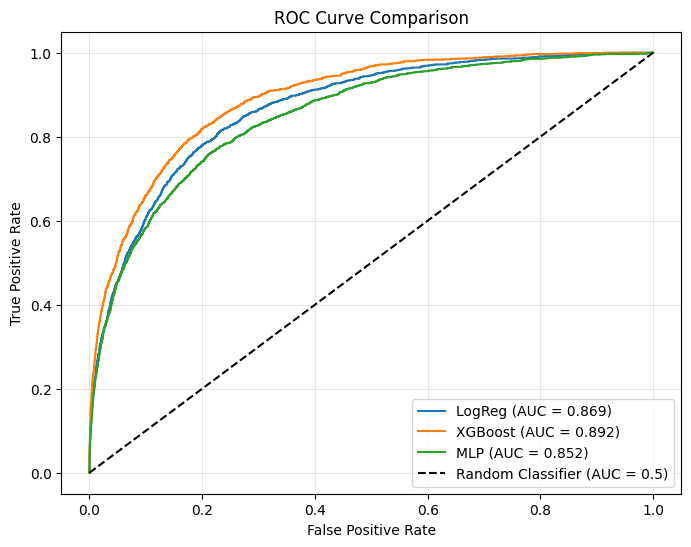

In [12]:
fpr_lr,  tpr_lr,  _ = roc_curve(y_test, y_prob_lr)
fpr_xgb, tpr_xgb, _ = roc_curve(y_test, y_prob_xgb)
fpr_mlp, tpr_mlp, _ = roc_curve(y_test, y_prob_mc[:,1])

auc_lr  = auc(fpr_lr,  tpr_lr)
auc_xgb = auc(fpr_xgb, tpr_xgb)
auc_mlp = auc(fpr_mlp, tpr_mlp)

plt.figure(figsize=(8, 6))
plt.plot(fpr_lr,  tpr_lr,  label=f'LogReg (AUC = {auc_lr:.3f})')
plt.plot(fpr_xgb, tpr_xgb, label=f'XGBoost (AUC = {auc_xgb:.3f})')
plt.plot(fpr_mlp, tpr_mlp, label=f'MLP (AUC = {auc_mlp:.3f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier (AUC = 0.5)')

plt.title('ROC Curve Comparison')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid(alpha=0.3)


## Brier Score

In [14]:
y_prob_lr = log_clf_bal.predict_proba(X_test)[:,1]
y_pred_lr = (y_prob_lr  >= 0.5).astype(int)

y_prob_xgb = xgb_clf.predict_proba(X_test)[:,1]
y_pred_xgb = (y_prob_xgb >= 0.5).astype(int)

y_prob_mlp = model_mc.predict(X_test_np, batch_size=256)
y_pred_mlp = y_prob_mlp.argmax(axis=1)

brier_lr = brier_score_loss(y_test, y_prob_lr)
brier_xgb = brier_score_loss(y_test, y_prob_xgb)
brier_mlp = brier_score_loss(y_test, y_prob_mlp[:,1])  # assuming model_mc outputs softmax

print(f"Brier Scores:\n  Logistic Regression: {brier_lr:.4f}\n  XGBoost: {brier_xgb:.4f}\n  MLP: {brier_mlp:.4f}")


72/72 [==============================] - 0s 3ms/step
Brier Scores:
  Logistic Regression: 0.1430
  XGBoost: 0.1349
  MLP: 0.0700


## Calibration Curve Plot

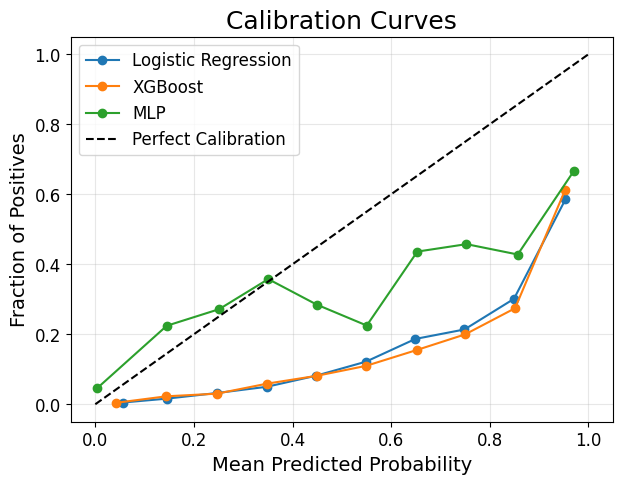

In [48]:
plt.figure(figsize=(7, 5))

# Logistic Regression
prob_true_lr, prob_pred_lr = calibration_curve(y_test, y_prob_lr, n_bins=10)
plt.plot(prob_pred_lr, prob_true_lr, marker='o', label='Logistic Regression')

# XGBoost
prob_true_xgb, prob_pred_xgb = calibration_curve(y_test, y_prob_xgb, n_bins=10)
plt.plot(prob_pred_xgb, prob_true_xgb, marker='o', label='XGBoost')

# MLP
prob_true_mlp, prob_pred_mlp = calibration_curve(y_test, y_prob_mlp[:,1], n_bins=10)
plt.plot(prob_pred_mlp, prob_true_mlp, marker='o', label='MLP')

# Reference line for perfect calibration
plt.plot([0, 1], [0, 1], linestyle='--', color='black', label='Perfect Calibration')

plt.title('Calibration Curves', fontsize=18)
plt.xlabel('Mean Predicted Probability', fontsize=14)
plt.ylabel('Fraction of Positives', fontsize=14)
plt.legend(loc='upper left', fontsize=12)
plt.grid(alpha=0.3)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

## Subgroup Analysis

/var/folders/wp/t4hgc9nx4s90xpch3k5c7kqr0000gn/T/ipykernel_89271/3597834849.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  prevalence = df_test.groupby(axis)['hospital_death'].mean().loc[counts.index]


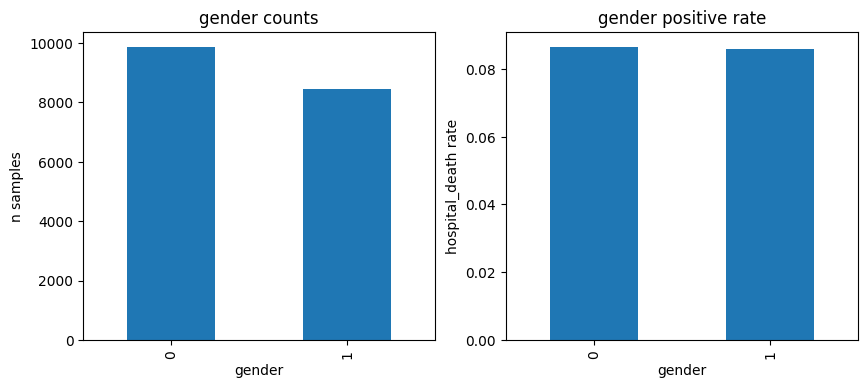

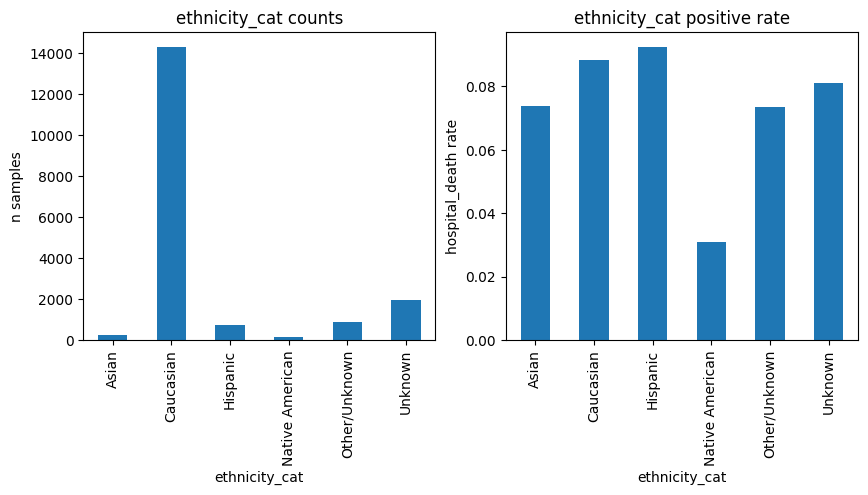

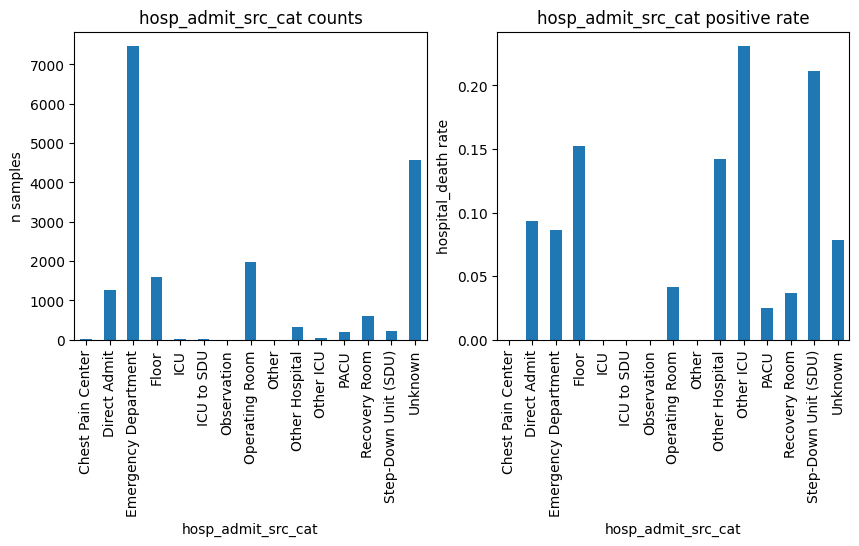

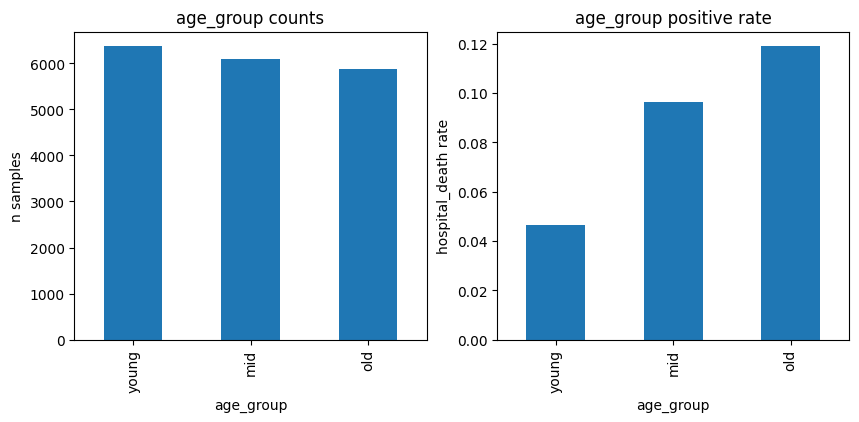

In [17]:
eth_cols = ['ethnicity_Asian', 'ethnicity_Caucasian', 'ethnicity_Hispanic', 'ethnicity_Native American', 'ethnicity_Other/Unknown']

def decode_onehot(df, cols, prefix):
    def pick(row):
        ones = [c for c in cols if row[c] == 1]
        if len(ones) == 1:
            return ones[0].split(prefix,1)[1]
        else:
            return 'Unknown'
    return df.apply(pick, axis=1)

df_test = df_test.copy()
df_test['ethnicity_cat'] = decode_onehot(df_test, eth_cols, 'ethnicity_')

hosp_cols = [c for c in df_test.columns if c.startswith('hospital_admit_source_')]

df_test['hosp_admit_src_cat'] = decode_onehot(df_test, hosp_cols, 'hospital_admit_source_')

df_test['age_group'] = pd.qcut(df_test['age'], q=[0, 0.33, 0.66, 1.0], labels=['young','mid','old'])

demo_axes = {
    'gender' : df_test['gender'].unique(),
    'ethnicity_cat' : df_test['ethnicity_cat'].unique(),
    'hosp_admit_src_cat': df_test['hosp_admit_src_cat'].unique(),
    'age_group' : ['young','mid','old']}

models = [
    ('LogReg', y_pred_bal,  y_prob_lr),
    ('XGBoost', y_pred_xgb, y_prob_xgb),
    ('MLP', y_pred_mc, y_prob_mc[:,1]),]


for axis in ['gender','ethnicity_cat','hosp_admit_src_cat','age_group']:
    counts = df_test[axis].value_counts().sort_index()
    prevalence = df_test.groupby(axis)['hospital_death'].mean().loc[counts.index]
    fig, (ax1,ax2) = plt.subplots(1,2,figsize=(10,4))
    counts.plot.bar(ax=ax1); ax1.set_title(f'{axis} counts'); ax1.set_xlabel(axis); ax1.set_ylabel('n samples')
    prevalence.plot.bar(ax=ax2); ax2.set_title(f'{axis} positive rate'); ax2.set_xlabel(axis); ax2.set_ylabel('hospital_death rate')

In [18]:
records = []
for model_name, y_pred, y_prob in models:
    for axis, groups in demo_axes.items():
        for grp in groups:
            mask = df_test[axis] == grp
            if mask.sum() < 30:
                continue
            yt = y_test[mask]
            yp = y_pred[mask]
            yp_prob = y_prob[mask]

            records.append({
                'model' : model_name,
                'demographic': axis,
                'group': grp,
                'n_samples': int(mask.sum()),
                'accuracy': accuracy_score(yt, yp),
                'auc': roc_auc_score(yt, yp_prob) if yt.nunique()>1 else float('nan'),
                'precision': precision_score(yt, yp, zero_division=0),
                'recall': recall_score(yt, yp, zero_division=0),
                'f1': f1_score(yt, yp, zero_division=0)})

df_subgroup = pd.DataFrame(records)

table = df_subgroup.pivot_table(index=['demographic','group'], columns='model', values=['accuracy','auc','f1'], aggfunc='first')

print(table)

                                         accuracy                      \
model                                      LogReg       MLP   XGBoost   
demographic        group                                                
age_group          mid                   0.804134  0.908136  0.794127   
                   old                   0.701277  0.883574  0.723234   
                   young                 0.889360  0.954488  0.894382   
ethnicity_cat      Asian                 0.795082  0.934426  0.782787   
                   Caucasian             0.800488  0.913887  0.806211   
                   Hispanic              0.742857  0.911565  0.771429   
                   Native American       0.820988  0.956790  0.827160   
                   Other/Unknown         0.818687  0.938821  0.844271   
                   Unknown               0.815509  0.920426  0.803345   
gender             0                     0.800728  0.915031  0.812968   
                   1                     0.800875  

### Balanced Accuracy per Groups

72/72 [==============================] - 0s 3ms/step


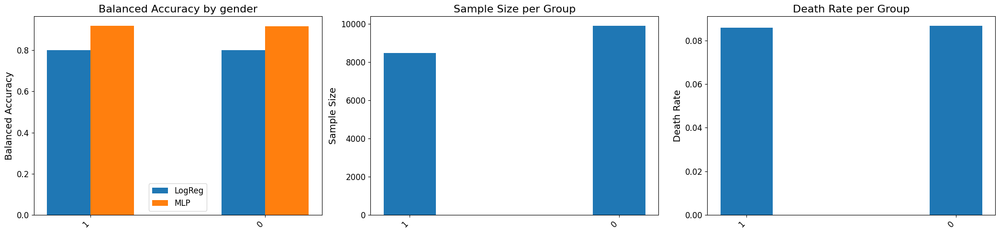

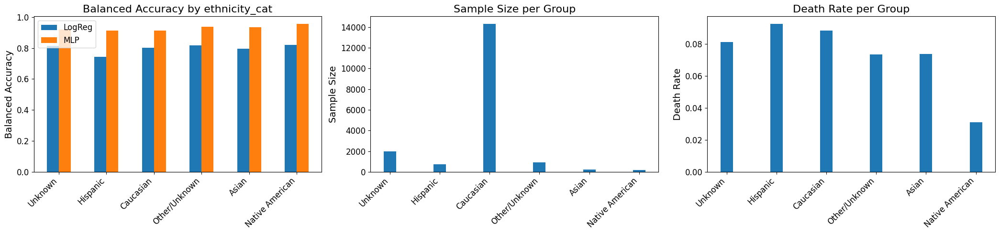

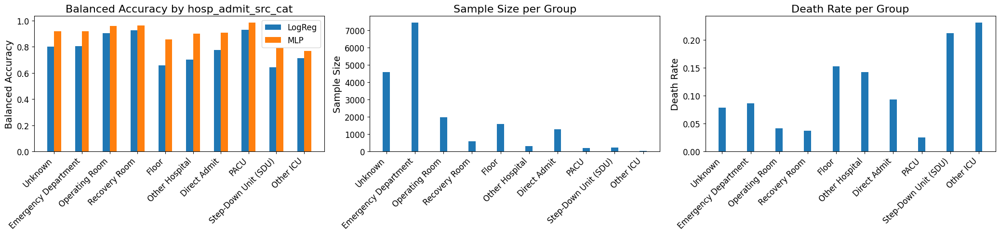

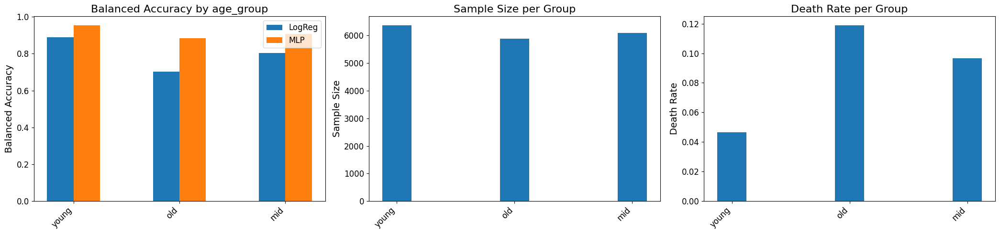

In [65]:
from sklearn.metrics import accuracy_score

y_prob_lr = log_clf_bal.predict_proba(X_test)[:,1]
y_pred_lr = (y_prob_lr  >= 0.5).astype(int)

y_prob_xgb = xgb_clf.predict_proba(X_test)[:,1]
y_pred_xgb = (y_prob_xgb >= 0.5).astype(int)

y_prob_mlp = model_mc.predict(X_test_np, batch_size=256)
y_pred_mlp = y_prob_mlp.argmax(axis=1)

# models = [("LogReg", y_pred_lr), ("XGBoost", y_pred_xgb), ("MLP", y_pred_mlp)]
models = [("LogReg", y_pred_lr), ("MLP", y_pred_mlp)]
demographics = ['gender', 'ethnicity_cat', 'hosp_admit_src_cat', 'age_group']

records = []
for name, y_pred in models:
    for axis in demographics:
        for grp in df_test[axis].unique():
            mask = df_test[axis] == grp
            if mask.sum() < 30:
                continue
            ba = accuracy_score(y_test[mask], y_pred[mask])
            records.append({
                'model': name,
                'demographic': axis,
                'group': grp,
                'balanced_accuracy': ba,
                'n_samples': mask.sum(),
                'prevalence': df_test.loc[mask, 'hospital_death'].mean()
            })

df_bal = pd.DataFrame(records)

for axis in demographics:
    df_axis = df_bal[df_bal['demographic'] == axis]
    groups = list(df_axis['group'].unique())
    x = np.arange(len(groups))
    width = 0.25

    fig, (ax_ba, ax_n, ax_p) = plt.subplots(1, 3, figsize=(21, 5))

    for i, (name, _) in enumerate(models):
        vals = [df_axis[(df_axis['model'] == name) & (df_axis['group'] == g)]['balanced_accuracy'].iloc[0]
                for g in groups]
        ax_ba.bar(x + i * width, vals, width, label=name)

    ax_ba.set_xticks(x + width * (len(models) - 1) / 2)
    ax_ba.set_xticklabels(groups, rotation=45, ha='right', fontsize=12)
    ax_ba.set_title(f'Balanced Accuracy by {axis}', fontsize=16)
    ax_ba.set_ylabel('Balanced Accuracy', fontsize=14)
    ax_ba.legend(loc='best', fontsize=12)
    ax_ba.tick_params(axis='y', labelsize=12)

    counts = [df_axis[df_axis['group'] == g]['n_samples'].iloc[0] for g in groups]
    ax_n.bar(x, counts, width)
    ax_n.set_xticks(x)
    ax_n.set_xticklabels(groups, rotation=45, ha='right', fontsize=12)
    ax_n.set_title('Sample Size per Group', fontsize=16)
    ax_n.set_ylabel('Sample Size', fontsize=14)
    ax_n.tick_params(axis='y', labelsize=12)

    prevs = [df_axis[df_axis['group'] == g]['prevalence'].iloc[0] for g in groups]
    ax_p.bar(x, prevs, width)
    ax_p.set_xticks(x)
    ax_p.set_xticklabels(groups, rotation=45, ha='right', fontsize=12)
    ax_p.set_title('Death Rate per Group', fontsize=16)
    ax_p.set_ylabel('Death Rate', fontsize=14)
    ax_p.tick_params(axis='y', labelsize=12)

    plt.tight_layout()
    plt.show()

### AUC per Groups

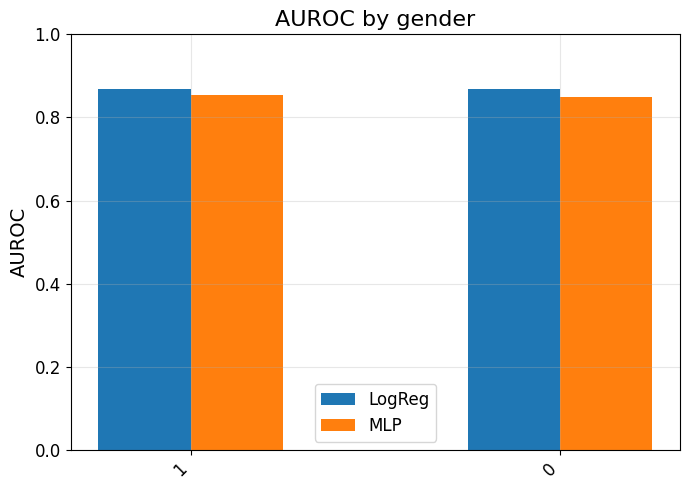

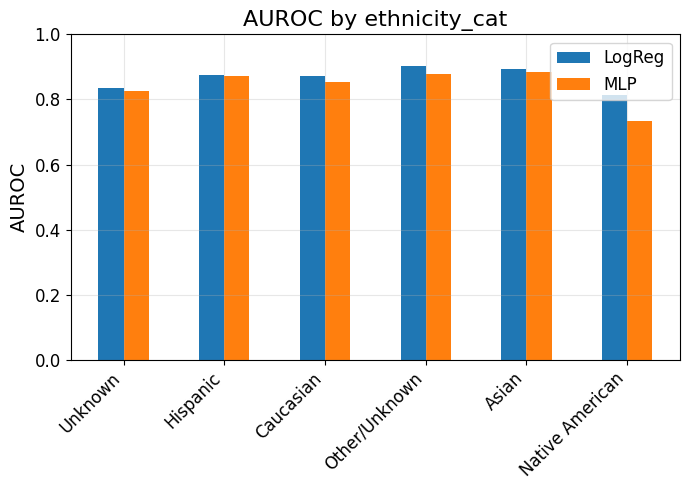

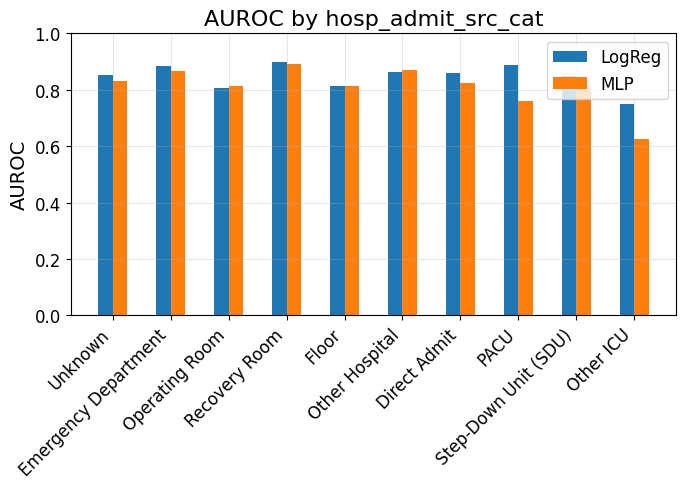

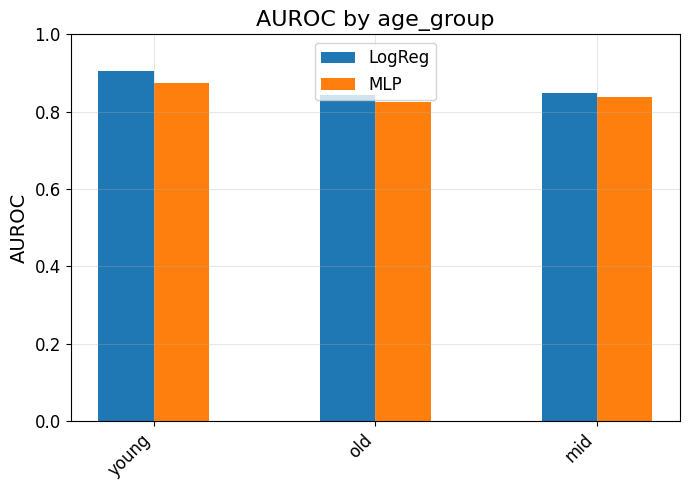

In [66]:
records = []
for name, y_pred in models:
    y_prob = None
    if name == 'LogReg':
        y_prob = y_prob_lr
    elif name == 'XGBoost':
        y_prob = y_prob_xgb
    elif name == 'MLP':
        y_prob = y_prob_mlp[:, 1]  # Probability for positive class

    for axis in demographics:
        for grp in df_test[axis].unique():
            mask = df_test[axis] == grp
            if mask.sum() < 30:
                continue
            y_true_grp = y_test[mask]
            y_pred_grp = y_pred[mask]
            y_prob_grp = y_prob[mask]
            
            ba = accuracy_score(y_true_grp, y_pred_grp)
            precision = precision_score(y_true_grp, y_pred_grp, zero_division=0)
            recall = recall_score(y_true_grp, y_pred_grp, zero_division=0)
            f1 = f1_score(y_true_grp, y_pred_grp, zero_division=0)
            
            try:
                auc = roc_auc_score(y_true_grp, y_prob_grp)
            except ValueError:
                auc = np.nan

            records.append({
                'model': name,
                'demographic': axis,
                'group': grp,
                'balanced_accuracy': ba,
                'precision': precision,
                'recall': recall,
                'f1_score': f1,
                'subgroup_auc': auc,
                'n_samples': mask.sum(),
                'prevalence': df_test.loc[mask, 'hospital_death'].mean()
            })

df_bal = pd.DataFrame(records)

for axis in demographics:
    df_axis = df_bal[df_bal['demographic'] == axis]
    groups = list(df_axis['group'].unique())
    x = np.arange(len(groups))
    width = 0.25

    fig, ax_auc = plt.subplots(1, 1, figsize=(7, 5))
    for i, (name, _) in enumerate(models):
        auc_vals = [df_axis[(df_axis['model'] == name) & (df_axis['group'] == g)]['subgroup_auc'].iloc[0]
                    for g in groups]
        
        ax_auc.bar(x + i * width, auc_vals, width, label=name)

    ax_auc.set_xticks(x + width * (len(models) - 1) / 2)
    ax_auc.set_xticklabels(groups, rotation=45, ha='right', fontsize=12)
    ax_auc.set_title(f'AUROC by {axis}', fontsize=16)
    ax_auc.set_ylabel('AUROC', fontsize=14)
    ax_auc.set_ylim(0.0, 1.0)
    ax_auc.legend(loc='best', fontsize=12)
    ax_auc.tick_params(axis='y', labelsize=12)

    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()


### Calibration by Subgroup

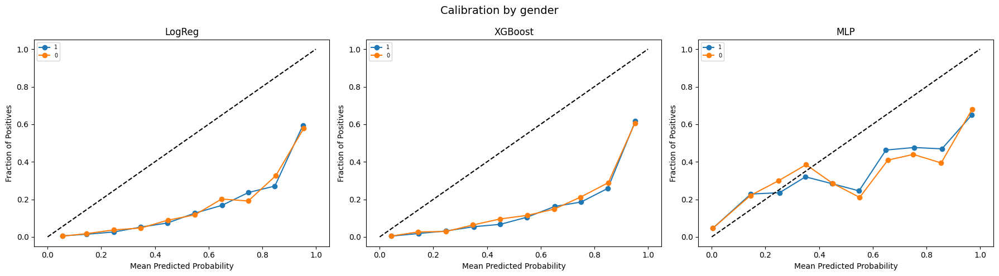

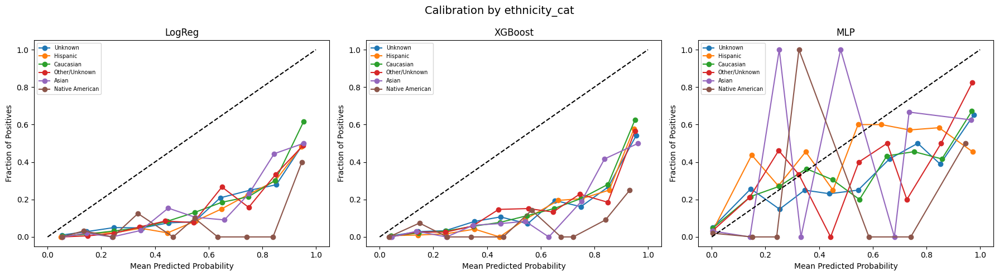

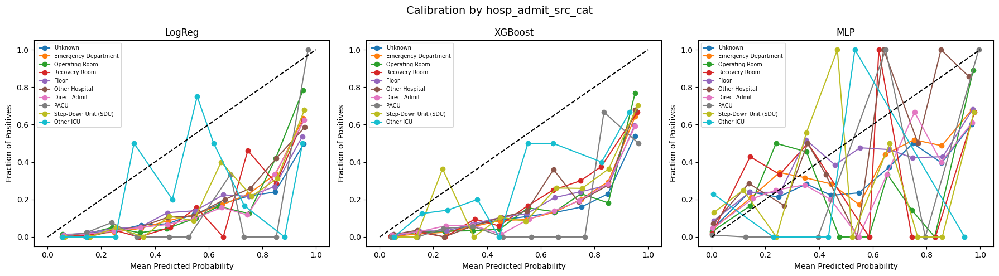

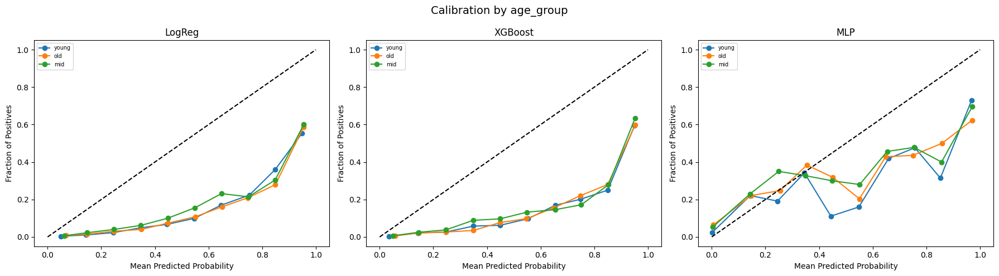

In [27]:
# Prepare a place to store group-wise calibration metrics
cal_records = []

for name, y_pred in models:
    # pick the right probability vector
    y_prob = {'LogReg': y_prob_lr, 'XGBoost': y_prob_xgb, 'MLP': y_prob_mlp[:,1]}[name]

    # y_prob = {'LogReg': y_prob_lr, 'MLP': y_prob_mlp[:,1]}[name]

    for axis in demographics:
        for grp in df_test[axis].unique():
            mask = df_test[axis] == grp
            if mask.sum() < 30:
                continue

            y_true_grp = y_test[mask]
            y_prob_grp = y_prob[mask]

            # Brier score per group
            brier = brier_score_loss(y_true_grp, y_prob_grp)

            # calibration_curve returns (fraction_of_positives, mean_predicted_value)
            frac_pos, mean_pred = calibration_curve(y_true_grp, y_prob_grp, n_bins=10)

            cal_records.append({
                'model': name,
                'demographic': axis,
                'group': grp,
                'brier_score': brier,
                'frac_pos': frac_pos,
                'mean_pred': mean_pred,
                'n_samples': mask.sum()
            })

# convert to DataFrame for tabular reporting if you like
df_cal = pd.DataFrame(cal_records)

for axis in demographics:
    fig, axs = plt.subplots(1, 3, figsize=(18, 5))  # 3 plots side-by-side
    model_names = [m[0] for m in models]
    
    for idx, name in enumerate(model_names):
        ax = axs[idx]
        subset = df_cal[(df_cal['demographic'] == axis) & (df_cal['model'] == name)]
        for row in subset.itertuples():
            ax.plot(row.mean_pred, row.frac_pos, marker='o', label=row.group)
        ax.plot([0,1], [0,1], 'k--')
        ax.set_title(f'{name}')
        ax.set_xlabel('Mean Predicted Probability')
        ax.set_ylabel('Fraction of Positives')
        ax.legend(fontsize='x-small')

    fig.suptitle(f'Calibration by {axis}', fontsize=14)
    plt.tight_layout()
    plt.show()

### Equality of Opportunity & Demographic Parity

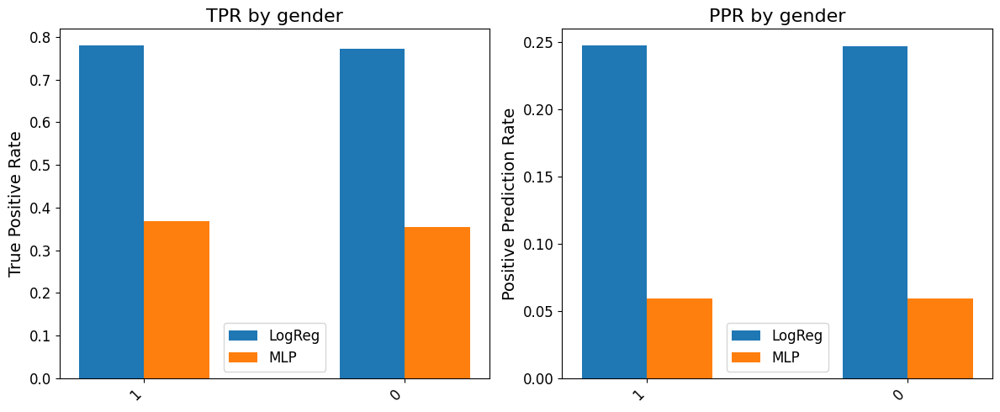

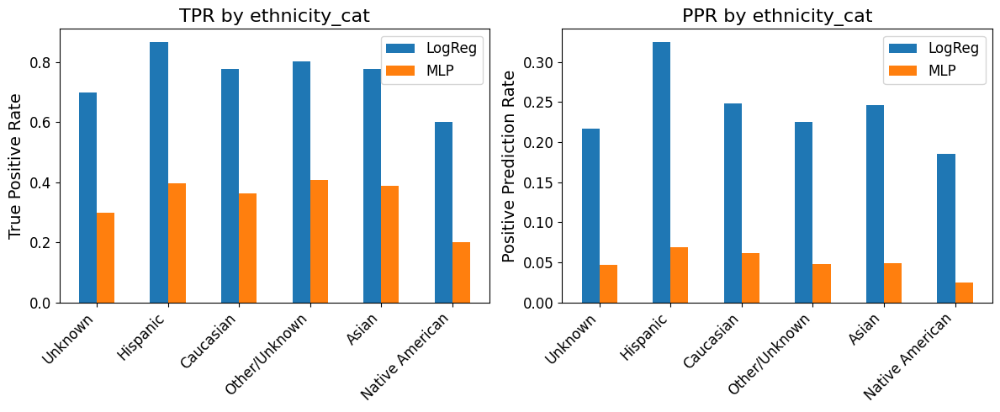

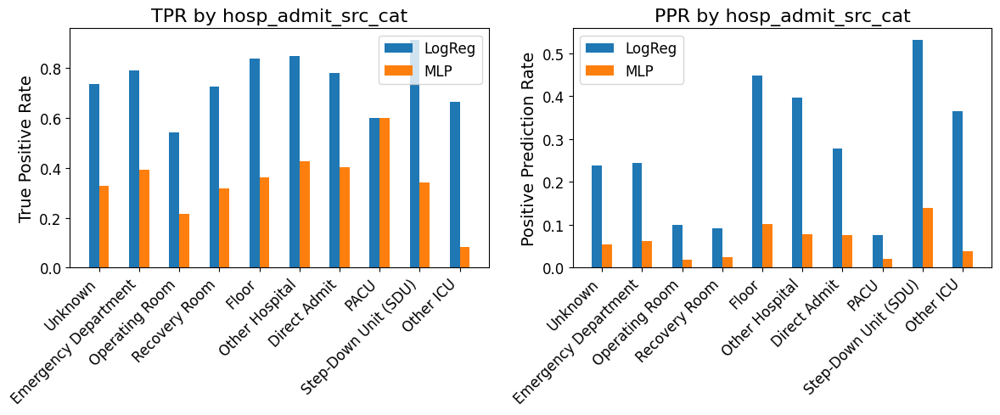

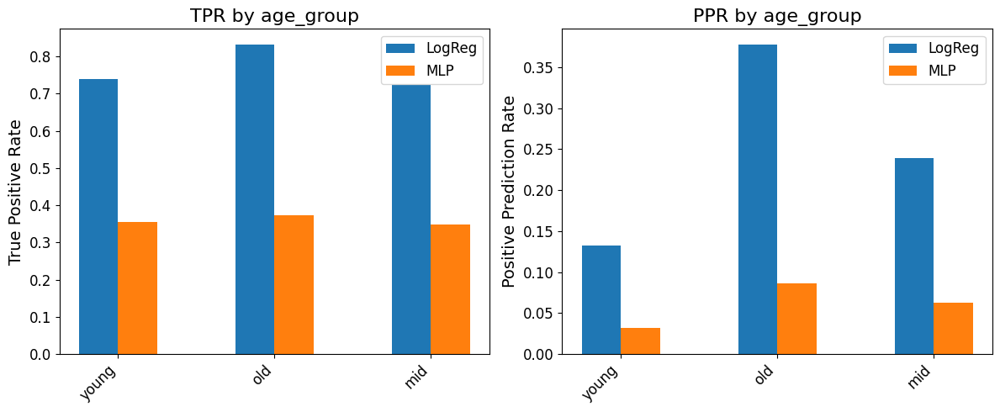

In [67]:
fair_records = []

for name, y_pred in models:
    # y_prob = {'LogReg': y_prob_lr, 'XGBoost': y_prob_xgb, 'MLP': y_prob_mlp[:,1]}[name]
    y_prob = {'LogReg': y_prob_lr, 'MLP': y_prob_mlp[:,1]}[name]

    for axis in demographics:
        for grp in df_test[axis].unique():
            mask = df_test[axis] == grp
            if mask.sum() < 30:
                continue

            y_true_grp = y_test[mask]
            y_pred_grp = y_pred[mask]

            # True Positive Rate
            tp = ((y_true_grp == 1) & (y_pred_grp == 1)).sum()
            fn = ((y_true_grp == 1) & (y_pred_grp == 0)).sum()
            tpr = tp / (tp + fn) if (tp + fn) > 0 else np.nan

            # Positive Prediction Rate
            pp = (y_pred_grp == 1).sum()
            ppr = pp / mask.sum()

            fair_records.append({
                'model': name,
                'demographic': axis,
                'group': grp,
                'tpr': tpr,
                'ppr': ppr,
                'n_samples': mask.sum()
            })

df_fair = pd.DataFrame(fair_records)

# get the list of group labels and model names
demogs   = df_fair['demographic'].unique()
models_l = df_fair['model'].unique()

for axis in demogs:
    df_ax = df_fair[df_fair['demographic'] == axis]
    groups = list(df_ax['group'].unique())
    x = np.arange(len(groups))
    width = 0.25
    n_mod = len(models_l)

    fig, (ax_tpr, ax_ppr) = plt.subplots(1, 2, figsize=(12, 5))  # fixed size

    # 1) True Positive Rate
    for i, m in enumerate(models_l):
        vals = df_ax[df_ax['model'] == m]['tpr'].values
        ax_tpr.bar(x + i * width, vals, width, label=m)
    ax_tpr.set_xticks(x + (n_mod - 1) * width / 2)
    ax_tpr.set_xticklabels(groups, rotation=45, ha='right', fontsize=12)
    ax_tpr.set_ylabel('True Positive Rate', fontsize=14)
    ax_tpr.set_title(f'TPR by {axis}', fontsize=16)
    ax_tpr.legend(loc='best', fontsize=12)
    ax_tpr.tick_params(axis='y', labelsize=12)

    # 2) Positive Prediction Rate
    for i, m in enumerate(models_l):
        vals = df_ax[df_ax['model'] == m]['ppr'].values
        ax_ppr.bar(x + i * width, vals, width, label=m)
    ax_ppr.set_xticks(x + (n_mod - 1) * width / 2)
    ax_ppr.set_xticklabels(groups, rotation=45, ha='right', fontsize=12)
    ax_ppr.set_ylabel('Positive Prediction Rate', fontsize=14)
    ax_ppr.set_title(f'PPR by {axis}', fontsize=16)
    ax_ppr.legend(loc='best', fontsize=12)
    ax_ppr.tick_params(axis='y', labelsize=12)

    plt.tight_layout()
    plt.show()

## Feature Importance - Logistic Regression + XGBoost

In [31]:
log_coefs = pd.Series(log_clf_bal.coef_.ravel(), index=X_train.columns)
top10_log = log_coefs.abs().sort_values(ascending=False).head(10)
print("=== Top 10 Logistic Regression Coefficients (abs) ===")
print(top10_log.to_string(), "\n")

xgb_imp = pd.Series(xgb_clf.feature_importances_, index=X_train.columns)
top10_xgb = xgb_imp.sort_values(ascending=False).head(10)
print("=== Top 10 XGBoost Feature Importances ===")
print(top10_xgb.to_string(), "\n")

=== Top 10 Logistic Regression Coefficients (abs) ===
apache_2_diagnosis_123.0       1.819107
icu_admit_source_Other ICU     1.329518
apache_2_diagnosis_208.0       1.254416
apache_2_diagnosis_217.0       0.949920
apache_2_diagnosis_114.0       0.879612
ventilated_apache              0.847378
solid_tumor_with_metastasis    0.812705
apache_2_diagnosis_124.0       0.805920
apache_2_diagnosis_219.0       0.802351
gcs_unable_apache              0.791865 

=== Top 10 XGBoost Feature Importances ===
apache_4a_hospital_death_prob           0.094063
ventilated_apache                       0.019787
hospital_admit_source_Other Hospital    0.014018
icu_admit_source_Other ICU              0.012795
d1_spo2_min                             0.012627
d1_sysbp_min                            0.011325
apache_2_diagnosis_114.0                0.010777
gcs_motor_apache                        0.010368
solid_tumor_with_metastasis             0.010259
icu_type_CSICU                          0.010042 



## Feature Importance - MLP

In [32]:
y_prob_mlp = model_mc.predict(X_test_np)
y_prob_mlp1 = y_prob_mlp[:,1]

baseline_auc = roc_auc_score(y_test_int, y_prob_mlp1)

importances = {}
for col in X_test.columns:
    X_perm = X_test.copy()
    X_perm[col] = np.random.permutation(X_perm[col].values)
    X_perm_np = X_perm.to_numpy().astype("float32")
    y_prob_perm = model_mc.predict(X_perm_np)[:, 1]
    perm_auc = roc_auc_score(y_test_int, y_prob_perm)
    importances[col] = baseline_auc - perm_auc

imp = pd.Series(importances).sort_values(ascending=False)
print("Top 10 MLP features (manual permutation importance):")
print(imp.head(10).to_string())

574/574 [==============================] - 0s 477us/step
Top 10 MLP features (manual permutation importance):
apache_4a_hospital_death_prob    0.028080
age                              0.013037
gcs_motor_apache                 0.010531
d1_heartrate_min                 0.010377
ventilated_apache                0.008529
wbc_apache                       0.006666
bun_apache                       0.006428
d1_spo2_min                      0.006350
d1_temp_max                      0.005350
d1_mbp_min                       0.004573


## Gradient Norm Analysis

# Differential Privacy

## Logistic Regression + MLP

In [33]:
def evaluate(name, y_true, y_prob, threshold=0.5):
    y_pred = (y_prob >= threshold).astype(int)
    acc = accuracy_score(y_true, y_pred)
    auc = roc_auc_score(y_true, y_prob)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)

    print(f"\n=== {name} ===")
    print(f"Accuracy : {acc:.4f}")
    print(f"AUROC    : {auc:.4f}")
    print(f"Precision: {prec:.4f}")
    print(f"Recall   : {rec:.4f}")
    print(f"F1 Score : {f1:.4f}")
    print("-" * 40)

    return {"model": name, "acc": acc, "auc": auc, "prec": prec, "rec": rec, "f1": f1}


def get_noise_multiplier(target_epsilon):
    """ Rough mapping: higher epsilon → lower noise. """
    noise_multiplier = max(0.5, 2.0 / target_epsilon)
    return noise_multiplier


def train_and_evaluate_dp_models(target_epsilon, X_train, y_train, X_test, y_test, RANDOM_SEED=42):
    results = []

    X_train_np = X_train.to_numpy().astype("float32")
    X_test_np  = X_test.to_numpy().astype("float32")
    y_train_np = y_train.to_numpy().astype("int32")
    y_test_np  = y_test.to_numpy().astype("int32")
    y_train_cat = tf.keras.utils.to_categorical(y_train_np, num_classes=2).astype("float32")

    row_norms_train = np.linalg.norm(X_train_np, axis=1)
    X_train_clipped = X_train_np / np.maximum(1.0, row_norms_train).reshape(-1, 1)
    
    row_norms_test = np.linalg.norm(X_test_np, axis=1)
    X_test_clipped = X_test_np / np.maximum(1.0, row_norms_test).reshape(-1, 1)

    base_clf = LogisticRegression(
        penalty='l2',
        solver='lbfgs',
        C=1.0,
        max_iter=3000,
        random_state=RANDOM_SEED)
    base_clf.fit(X_train_clipped, y_train_np)

    sensitivity = 2.0 / (X_train_clipped.shape[0] * 1.0)
    delta = 1e-5

    sigma = sensitivity * np.sqrt(2 * np.log(1.25 / delta)) / target_epsilon
    print(f"LogReg Output Perturbation = {sigma:.6f}")

    base_clf.coef_ += np.random.normal(0, sigma, size=base_clf.coef_.shape)
    base_clf.intercept_ += np.random.normal(0, sigma, size=base_clf.intercept_.shape)

    y_prob_dp_logreg = base_clf.predict_proba(X_test_clipped)[:, 1]
    results.append(evaluate(f"DP Logistic ε={target_epsilon:.2f}", y_test_np, y_prob_dp_logreg))

    noise_multiplier = get_noise_multiplier(target_epsilon)
    batch_size = 256
    epochs = 25

    model_dp = Sequential([
        Dense(512, activation='relu', input_shape=(X_train_np.shape[1],)),
        BatchNormalization(),
        Dropout(0.25),
        Dense(256, activation='relu'),
        BatchNormalization(),
        Dropout(0.25),
        Dense(128, activation='relu'),
        BatchNormalization(),
        Dropout(0.25),
        Dense(64, activation='relu'),
        BatchNormalization(),
        Dropout(0.25),
        Dense(2, activation="softmax")])

    optimizer = DPKerasAdamOptimizer(
        l2_norm_clip=np.percentile(np.linalg.norm(X_train_np, axis=1), 80),
        noise_multiplier=noise_multiplier,
        num_microbatches=1,
        learning_rate=1e-3)

    model_dp.compile( optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy", tf.keras.metrics.AUC(name="auc")])

    model_dp.fit(X_train_np, y_train_cat, validation_split=0.15, epochs=epochs, batch_size=batch_size,verbose=2)

    dp_y_prob_mlp = model_dp.predict(X_test_np, batch_size=batch_size)[:, 1]
    results.append(evaluate(f"DP MLP ε={target_epsilon:.2f}", y_test_np, dp_y_prob_mlp))

    return results

def sweep_epsilons(epsilon_list, X_train, y_train, X_test, y_test):
    all_results = []

    for eps in epsilon_list:
        print(f"\n====== Running for ε = {eps} ======")
        results = train_and_evaluate_dp_models(eps, X_train, y_train, X_test, y_test)
        all_results.extend(results)
    return all_results


In [34]:
epsilon_list = [.01, 0.5, 1.0, 2.0, 5.0, 10.0]

all_dp_results = sweep_epsilons(epsilon_list, X_bal, y_bal, X_test, y_test)

baseline_results = []
baseline_results.append(evaluate("Baseline Logistic", y_test, y_prob_lr))
baseline_results.append(evaluate("Baseline XGBoost", y_test, y_prob_xgb))
baseline_results.append(evaluate("Baseline MLP", y_test, y_prob_mlp[:,1]))

final_results = baseline_results + all_dp_results

# plot_metric(final_results, metric='acc')
# plot_metric(final_results, metric='auc')



====== Running for ε = 0.01 ======
LogReg Output Perturbation = 0.076513

=== DP Logistic ε=0.01 ===
Accuracy : 0.7865
AUROC    : 0.8657
Precision: 0.2577
Recall   : 0.7840
F1 Score : 0.3879
----------------------------------------
Epoch 1/25
43/43 - 2s - loss: 1.0010 - accuracy: 0.5321 - auc: 0.5466 - val_loss: 0.6766 - val_accuracy: 0.5789 - val_auc: 0.6066 - 2s/epoch - 41ms/step
Epoch 2/25
43/43 - 0s - loss: 1.0173 - accuracy: 0.5332 - auc: 0.5438 - val_loss: 0.7071 - val_accuracy: 0.5574 - val_auc: 0.5628 - 378ms/epoch - 9ms/step
Epoch 3/25
43/43 - 0s - loss: 1.0063 - accuracy: 0.5318 - auc: 0.5441 - val_loss: 0.7368 - val_accuracy: 0.5447 - val_auc: 0.5499 - 389ms/epoch - 9ms/step
Epoch 4/25
43/43 - 0s - loss: 1.0204 - accuracy: 0.5283 - auc: 0.5391 - val_loss: 0.7517 - val_accuracy: 0.5511 - val_auc: 0.5501 - 402ms/epoch - 9ms/step
Epoch 5/25
43/43 - 0s - loss: 0.9962 - accuracy: 0.5361 - auc: 0.5556 - val_loss: 0.7558 - val_accuracy: 0.5626 - val_auc: 0.5649 - 410ms/epoch - 10m

## XGBoost

In [49]:
def compute_dp_per_tree(target_total_epsilon, n_trees, subsample):
    return np.log(1 + (np.exp(target_total_epsilon / n_trees) - 1) / subsample)

def train_and_evaluate_dp_xgb_models(target_epsilons, X_train, y_train, X_test, y_test, RANDOM_SEED=42):
    import dp_xgboost

    results = []

    X_train_np = X_train.to_numpy().astype(np.float32)
    X_test_np = X_test.to_numpy().astype(np.float32)
    y_train_np = y_train.to_numpy()
    y_test_np = y_test.to_numpy()

    # For DP-XGB training: Subsample train data (optional, or adjust here)
    X_train_np = X_train_np[:5000]
    y_train_np = y_train_np[:5000]

    feature_min = np.min(X_train_np, axis=0).tolist()
    feature_max = np.max(X_train_np, axis=0).tolist()

    dtrain = dp_xgboost.DMatrix(
        X_train_np, 
        label=y_train_np, 
        feature_min=feature_min,
        feature_max=feature_max
    )

    dtest = dp_xgboost.DMatrix(
        X_test_np,
        feature_min=feature_min,  
        feature_max=feature_max
    )

    fixed_params = {
        "objective": "binary:logistic",
        'tree_method': 'approxDP',
        "eval_metric": "auc",
        "learning_rate": 0.03,
        "max_depth": 4,
        "subsample": 0.6,
        "colsample_bytree": 1.0,
        "verbosity": 1,
    }

    n_trees = 200
    subsample = 0.4

    for target_total_epsilon in target_epsilons:
        dp_per_tree = compute_dp_per_tree(target_total_epsilon, n_trees=n_trees, subsample=subsample)

        param_dp = fixed_params.copy()
        param_dp.update({
            "dp_epsilon_per_tree": dp_per_tree,
            "max_depth": 5,  # update if you want different depths
        })

        print(f"\nTraining DP-XGBoost with total epsilon ≈ {target_total_epsilon:.2f} (per-tree epsilon {dp_per_tree:.4f})")

        bst_dp = dp_xgboost.train(param_dp, dtrain, num_boost_round=n_trees, evals=[(dtrain, 'train')], verbose_eval=False)

        y_prob_dp = bst_dp.predict(dtest)
        results.append(evaluate(f"DP-XGBoost ε={target_total_epsilon:.2f}", y_test_np, y_prob_dp))


    return results


In [50]:
epsilon_list = [0.1, 0.5, 1.0, 2.0, 5.0, 10.0, 20.0, 50.0, 100.0]

dp_xgb_results = train_and_evaluate_dp_xgb_models(epsilon_list, X_train, y_train, X_test, y_test)



Training DP-XGBoost with total epsilon ≈ 0.10 (per-tree epsilon 0.0012)

=== DP-XGBoost ε=0.10 ===
Accuracy : 0.0863
AUROC    : 0.5000
Precision: 0.0863
Recall   : 1.0000
F1 Score : 0.1589
----------------------------------------

Training DP-XGBoost with total epsilon ≈ 0.50 (per-tree epsilon 0.0062)

=== DP-XGBoost ε=0.50 ===
Accuracy : 0.0863
AUROC    : 0.5000
Precision: 0.0863
Recall   : 1.0000
F1 Score : 0.1589
----------------------------------------

Training DP-XGBoost with total epsilon ≈ 1.00 (per-tree epsilon 0.0125)

=== DP-XGBoost ε=1.00 ===
Accuracy : 0.0863
AUROC    : 0.5000
Precision: 0.0863
Recall   : 1.0000
F1 Score : 0.1589
----------------------------------------

Training DP-XGBoost with total epsilon ≈ 2.00 (per-tree epsilon 0.0248)

=== DP-XGBoost ε=2.00 ===
Accuracy : 0.2272
AUROC    : 0.3458
Precision: 0.0611
Recall   : 0.5540
F1 Score : 0.1101
----------------------------------------

Training DP-XGBoost with total epsilon ≈ 5.00 (per-tree epsilon 0.0614)

==

## Accuracy and AUC Across Models - IMPLEMENT XGBoost DP above this and run after

In [51]:
# Your baselines (non-private models)
baseline_results = []
baseline_results.append(evaluate("Baseline Logistic", y_test, y_prob_lr))
baseline_results.append(evaluate("Baseline XGBoost", y_test, y_prob_xgb))
baseline_results.append(evaluate("Baseline MLP", y_test, y_prob_mlp[:,1]))

# Combine everything
final_results = baseline_results + all_dp_results + dp_xgb_results
# final_results = baseline_results + all_dp_results 

def plot_metric(results, metric='acc'):
    model_categories = []
    for r in results:
        name = r['model']
        if "Logistic" in name:
            model_categories.append('Logistic')
        elif "XGBoost" in name:
            model_categories.append('XGBoost')
        elif "MLP" in name:
            model_categories.append('MLP')
        else:
            raise ValueError(f"Unknown model name: {name}")

    metric_vals = [r[metric] for r in results]
    labels = [r['model'] for r in results]

    # Color map
    color_map = {'Logistic': 'tab:blue', 'XGBoost': 'tab:orange', 'MLP': 'tab:green'}
    colors = [color_map[cat] for cat in model_categories]

    # Reorder models by group
    group_order = ['Logistic', 'XGBoost', 'MLP']
    group_idx = []
    for group in group_order:
        idx = [i for i, cat in enumerate(model_categories) if cat == group]
        group_idx.extend(idx)

    metric_vals = [metric_vals[i] for i in group_idx]
    labels = [labels[i] for i in group_idx]
    colors = [colors[i] for i in group_idx]
    model_categories = [model_categories[i] for i in group_idx]

    # Clean labels for x-axis
    clean_labels = []
    for lbl in labels:
        if 'Baseline' in lbl:
            clean_labels.append('non-DP')
        else:
            eps_value = lbl.split('ε=')[-1]
            clean_labels.append(f'ε={eps_value}')

    # Insert gaps between model families
    sep_indices = []
    prev_group = None
    for i, cat in enumerate(model_categories):
        if prev_group is not None and cat != prev_group:
            sep_indices.append(i)
        prev_group = cat

    for offset, idx in enumerate(sep_indices):
        metric_vals.insert(idx + offset, np.nan)
        clean_labels.insert(idx + offset, '')
        colors.insert(idx + offset, 'white')

    # Now plot
    x = np.arange(len(metric_vals))
    fig, ax = plt.subplots(figsize=(14, 6))  # Increased width slightly for cleaner spacing
    ax.bar(x, metric_vals, color=colors, edgecolor='black')

    ax.set_xticks(x)
    ax.set_xticklabels(clean_labels, rotation=45, ha='right', fontsize=12)
    ax.set_ylabel(metric.upper(), fontsize=14)
    ax.set_title(f'Model Performance ({metric.upper()}) vs Epsilon (Privacy Level)', fontsize=16)
    ax.tick_params(axis='y', labelsize=12)

    legend_elements = [Patch(facecolor=color_map[g], edgecolor='black', label=g) for g in group_order]
    ax.legend(handles=legend_elements, title="Model Type", loc='best', fontsize=12, title_fontsize=14)

    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


=== Baseline Logistic ===
Accuracy : 0.8008
AUROC    : 0.8692
Precision: 0.2712
Recall   : 0.7751
F1 Score : 0.4018
----------------------------------------

=== Baseline XGBoost ===
Accuracy : 0.8062
AUROC    : 0.8916
Precision: 0.2828
Recall   : 0.8105
F1 Score : 0.4193
----------------------------------------

=== Baseline MLP ===
Accuracy : 0.9164
AUROC    : 0.8518
Precision: 0.5224
Recall   : 0.3607
F1 Score : 0.4268
----------------------------------------


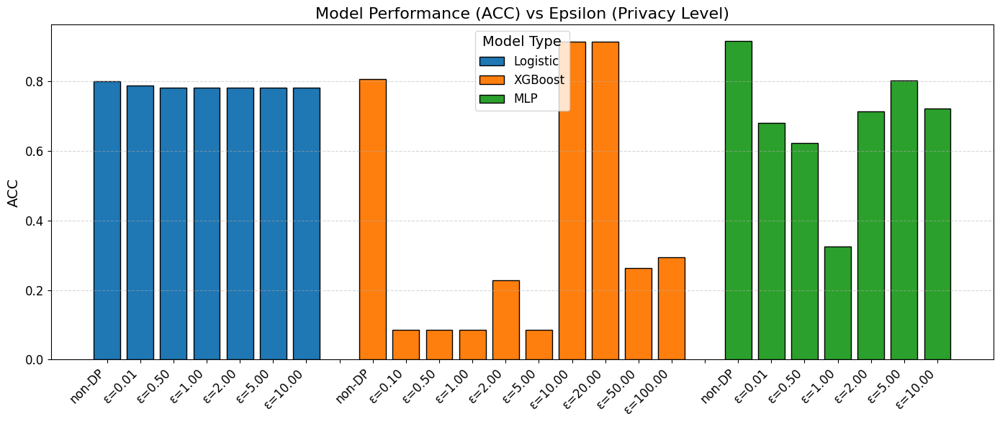

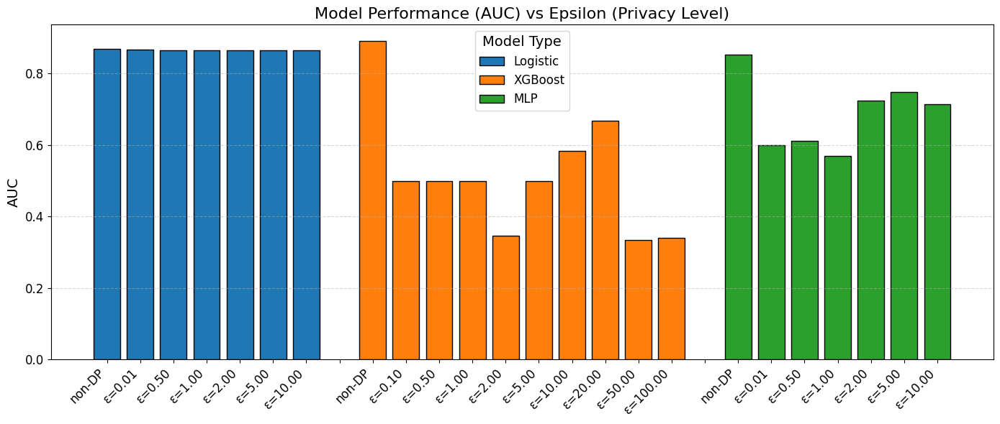

In [52]:
# Finally, make the plots
plot_metric(final_results, metric='acc')
plot_metric(final_results, metric='auc')

In [53]:
# After training and evaluating all_epsilons
dp_logreg_results = train_and_evaluate_dp_models(2.0, X_bal, y_bal, X_test, y_test)

# Grab the probability outputs manually:
# dp_logreg_results[0] → logistic regression results
# dp_logreg_results[1] → mlp results

# You must rerun this slightly differently to also capture the actual predicted probabilities.

# def train_and_return_dp_preds(target_epsilon, X_train, y_train, X_test, y_test, RANDOM_SEED=42):
#     X_train_np = X_train.to_numpy().astype("float32")
#     X_test_np = X_test.to_numpy().astype("float32")
#     y_train_np = y_train.to_numpy().astype("int32")
#     y_test_np = y_test.to_numpy().astype("int32")
#     y_train_cat = tf.keras.utils.to_categorical(y_train_np, num_classes=2).astype("float32")

#     row_norms_train = np.linalg.norm(X_train_np, axis=1)
#     X_train_clipped = X_train_np / np.maximum(1.0, row_norms_train).reshape(-1, 1)

#     row_norms_test = np.linalg.norm(X_test_np, axis=1)
#     X_test_clipped = X_test_np / np.maximum(1.0, row_norms_test).reshape(-1, 1)

#     # DP Logistic Regression
#     base_clf = LogisticRegression(
#         penalty='l2',
#         solver='lbfgs',
#         C=1.0,
#         max_iter=3000,
#         random_state=RANDOM_SEED)
#     base_clf.fit(X_train_clipped, y_train_np)

#     sensitivity = 2.0 / (X_train_clipped.shape[0] * 1.0)
#     delta = 1e-5
#     sigma = sensitivity * np.sqrt(2 * np.log(1.25 / delta)) / target_epsilon

#     base_clf.coef_ += np.random.normal(0, sigma, size=base_clf.coef_.shape)
#     base_clf.intercept_ += np.random.normal(0, sigma, size=base_clf.intercept_.shape)

#     y_prob_logreg_dp = base_clf.predict_proba(X_test_clipped)[:, 1]

#     # DP MLP
#     noise_multiplier = get_noise_multiplier(target_epsilon)
#     batch_size = 256
#     epochs = 25

#     model_dp = Sequential([
#         Dense(512, activation='relu', input_shape=(X_train_np.shape[1],)),
#         BatchNormalization(),
#         Dropout(0.25),
#         Dense(256, activation='relu'),
#         BatchNormalization(),
#         Dropout(0.25),
#         Dense(128, activation='relu'),
#         BatchNormalization(),
#         Dropout(0.25),
#         Dense(64, activation='relu'),
#         BatchNormalization(),
#         Dropout(0.25),
#         Dense(2, activation="softmax")
#     ])

#     optimizer = DPKerasAdamOptimizer(
#         l2_norm_clip=np.percentile(np.linalg.norm(X_train_np, axis=1), 80),
#         noise_multiplier=noise_multiplier,
#         num_microbatches=1,
#         learning_rate=1e-3)

#     model_dp.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy", tf.keras.metrics.AUC(name="auc")])

#     model_dp.fit(X_train_np, y_train_cat, validation_split=0.15, epochs=epochs, batch_size=batch_size, verbose=2)

#     y_prob_mlp_dp = model_dp.predict(X_test_np, batch_size=batch_size)[:, 1]

#     return y_prob_logreg_dp, y_prob_mlp_dp


def train_and_return_dp_preds(target_epsilon, X_train, y_train, X_test, y_test,
                              RANDOM_SEED=42, xgb_subsample_size=5000,
                              xgb_n_trees=200, xgb_subsample=0.4):
    import dp_xgboost

    # ——— Prep numpy arrays ———
    X_train_np = X_train.to_numpy().astype("float32")
    X_test_np  = X_test.to_numpy().astype("float32")
    y_train_np = y_train.to_numpy().astype("int32")
    y_test_np  = y_test.to_numpy().astype("int32")
    y_train_cat = tf.keras.utils.to_categorical(y_train_np, num_classes=2).astype("float32")

    # ——— 1) DP Logistic Regression ———
    row_norms = np.linalg.norm(X_train_np, axis=1)
    X_train_clipped = X_train_np / np.maximum(1.0, row_norms).reshape(-1,1)
    row_norms_test = np.linalg.norm(X_test_np, axis=1)
    X_test_clipped  = X_test_np  / np.maximum(1.0, row_norms_test).reshape(-1,1)

    base_clf = LogisticRegression(
        penalty='l2', solver='lbfgs', C=1.0,
        max_iter=3000, random_state=RANDOM_SEED)
    base_clf.fit(X_train_clipped, y_train_np)

    sensitivity = 2.0 / X_train_clipped.shape[0]
    delta = 1e-5
    sigma = sensitivity * np.sqrt(2 * np.log(1.25 / delta)) / target_epsilon

    base_clf.coef_      += np.random.normal(0, sigma, base_clf.coef_.shape)
    base_clf.intercept_ += np.random.normal(0, sigma, base_clf.intercept_.shape)

    y_prob_logreg_dp = base_clf.predict_proba(X_test_clipped)[:,1]

    # ——— 2) DP MLP ———
    noise_multiplier = get_noise_multiplier(target_epsilon)
    batch_size, epochs = 256, 25

    model_dp = Sequential([
        Dense(512, activation='relu', input_shape=(X_train_np.shape[1],)),
        BatchNormalization(), Dropout(0.25),
        Dense(256, activation='relu'),
        BatchNormalization(), Dropout(0.25),
        Dense(128, activation='relu'),
        BatchNormalization(), Dropout(0.25),
        Dense(64, activation='relu'),
        BatchNormalization(), Dropout(0.25),
        Dense(2, activation="softmax"),
    ])

    optimizer = DPKerasAdamOptimizer(
        l2_norm_clip=np.percentile(np.linalg.norm(X_train_np, axis=1), 80),
        noise_multiplier=noise_multiplier,
        num_microbatches=1,
        learning_rate=1e-3)

    model_dp.compile(
        optimizer=optimizer,
        loss="categorical_crossentropy",
        metrics=["accuracy", tf.keras.metrics.AUC(name="auc")]
    )

    model_dp.fit(
        X_train_np, y_train_cat,
        validation_split=0.15,
        epochs=epochs,
        batch_size=batch_size,
        verbose=2
    )

    y_prob_mlp_dp = model_dp.predict(X_test_np, batch_size=batch_size)[:,1]

    # ——— 3) DP-XGBoost ———
    # (subsample to keep consistent with your earlier XGB code)
    Xx = X_train_np[:xgb_subsample_size]
    yy = y_train_np[:xgb_subsample_size]

    feature_min = Xx.min(axis=0).tolist()
    feature_max = Xx.max(axis=0).tolist()

    dtrain = dp_xgboost.DMatrix(
        Xx,
        label=yy,
        feature_min=feature_min,
        feature_max=feature_max
    )
    dtest = dp_xgboost.DMatrix(
        X_test_np,
        feature_min=feature_min,
        feature_max=feature_max
    )

    def compute_dp_per_tree(eps, n_trees, subsamp):
        return np.log(1 + (np.exp(eps / n_trees) - 1) / subsamp)

    dp_eps_per_tree = compute_dp_per_tree(
        target_epsilon, n_trees=xgb_n_trees, subsamp=xgb_subsample
    )

    xgb_params = {
        "objective": "binary:logistic",
        "tree_method": "approxDP",
        "eval_metric": "auc",
        "learning_rate": 0.03,
        "max_depth": 5,
        "subsample": 0.6,
        "colsample_bytree": 1.0,
        "verbosity": 1,
        "dp_epsilon_per_tree": dp_eps_per_tree
    }

    bst_dp = dp_xgboost.train(
        xgb_params,
        dtrain,
        num_boost_round=xgb_n_trees,
        evals=[(dtrain, "train")],
        verbose_eval=False
    )

    y_prob_xgb_dp = bst_dp.predict(dtest)

    return y_prob_logreg_dp, y_prob_mlp_dp, y_prob_xgb_dp

LogReg Output Perturbation = 0.000383

=== DP Logistic ε=2.00 ===
Accuracy : 0.7817
AUROC    : 0.8655
Precision: 0.2540
Recall   : 0.7896
F1 Score : 0.3843
----------------------------------------
Epoch 1/25
43/43 - 2s - loss: 1.3381 - accuracy: 0.4592 - auc: 0.4343 - val_loss: 0.7466 - val_accuracy: 0.4311 - val_auc: 0.4235 - 2s/epoch - 46ms/step
Epoch 2/25
43/43 - 0s - loss: 1.3520 - accuracy: 0.4480 - auc: 0.4297 - val_loss: 0.8215 - val_accuracy: 0.4647 - val_auc: 0.4413 - 390ms/epoch - 9ms/step
Epoch 3/25
43/43 - 0s - loss: 1.2764 - accuracy: 0.4736 - auc: 0.4597 - val_loss: 0.8859 - val_accuracy: 0.4695 - val_auc: 0.4511 - 377ms/epoch - 9ms/step
Epoch 4/25
43/43 - 0s - loss: 1.2639 - accuracy: 0.4687 - auc: 0.4593 - val_loss: 0.9156 - val_accuracy: 0.4626 - val_auc: 0.4623 - 376ms/epoch - 9ms/step
Epoch 5/25
43/43 - 0s - loss: 1.2216 - accuracy: 0.4857 - auc: 0.4797 - val_loss: 0.9294 - val_accuracy: 0.4611 - val_auc: 0.4748 - 373ms/epoch - 9ms/step
Epoch 6/25
43/43 - 0s - loss: 

In [54]:
# y_prob_logreg_dp2, y_prob_mlp_dp2 = train_and_return_dp_preds(2.0, X_bal, y_bal, X_test, y_test)

# for ε = 2.0
y_prob_logreg_dp2, y_prob_mlp_dp2, y_prob_xgb_dp2 = train_and_return_dp_preds(
    2.0, X_bal, y_bal, X_test, y_test
)


Epoch 1/25
43/43 - 2s - loss: 1.0037 - accuracy: 0.5268 - auc: 0.5374 - val_loss: 0.6929 - val_accuracy: 0.5553 - val_auc: 0.5591 - 2s/epoch - 40ms/step
Epoch 2/25
43/43 - 0s - loss: 0.9968 - accuracy: 0.5320 - auc: 0.5429 - val_loss: 0.7289 - val_accuracy: 0.5347 - val_auc: 0.5533 - 400ms/epoch - 9ms/step
Epoch 3/25
43/43 - 0s - loss: 0.9574 - accuracy: 0.5522 - auc: 0.5676 - val_loss: 0.7622 - val_accuracy: 0.5363 - val_auc: 0.5550 - 380ms/epoch - 9ms/step
Epoch 4/25
43/43 - 0s - loss: 0.9543 - accuracy: 0.5466 - auc: 0.5651 - val_loss: 0.7857 - val_accuracy: 0.5421 - val_auc: 0.5652 - 392ms/epoch - 9ms/step
Epoch 5/25
43/43 - 0s - loss: 0.9514 - accuracy: 0.5501 - auc: 0.5712 - val_loss: 0.8061 - val_accuracy: 0.5516 - val_auc: 0.5788 - 379ms/epoch - 9ms/step
Epoch 6/25
43/43 - 0s - loss: 0.9213 - accuracy: 0.5613 - auc: 0.5872 - val_loss: 0.8073 - val_accuracy: 0.5616 - val_auc: 0.5988 - 384ms/epoch - 9ms/step
Epoch 7/25
43/43 - 0s - loss: 0.8934 - accuracy: 0.5795 - auc: 0.6052 - 

## Brier Score

In [55]:
brier_logreg_dp2 = brier_score_loss(y_test, y_prob_logreg_dp2)
brier_mlp_dp2 = brier_score_loss(y_test, y_prob_mlp_dp2)
brier_xgb_dp2 = brier_score_loss(y_test, y_prob_xgb_dp2)

print(f"DP Logistic (ε=2.0) Brier Score: {brier_logreg_dp2:.4f}")
print(f"DP MLP (ε=2.0) Brier Score: {brier_mlp_dp2:.4f}")
print(f"DP XGB (ε=2.0) Brier Score: {brier_xgb_dp2:.4f}")


DP Logistic (ε=2.0) Brier Score: 0.1496
DP MLP (ε=2.0) Brier Score: 0.1128
DP XGB (ε=2.0) Brier Score: 0.7786


## Calibration Curve

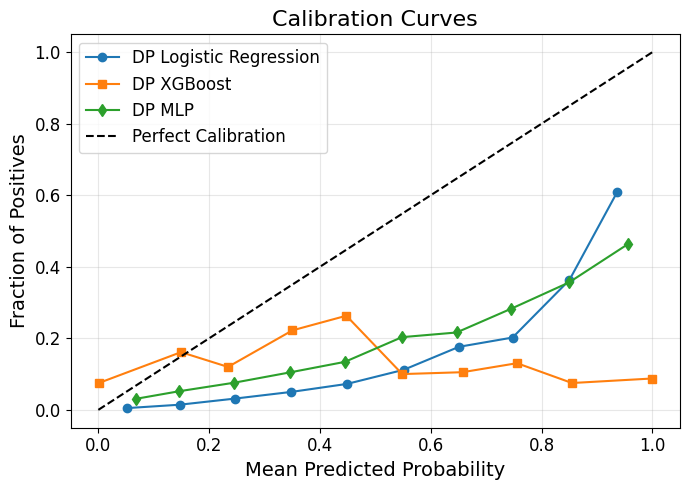

In [57]:
# plt.figure(figsize=(8,6))

# for name, y_prob in [('DP Logistic', y_prob_logreg_dp2), ('DP MLP', y_prob_mlp_dp2)]:
#     prob_true, prob_pred = calibration_curve(y_test, y_prob, n_bins=10)
#     plt.plot(prob_pred, prob_true, marker='o', label=name)

# plt.plot([0,1],[0,1],'k--')
# plt.xlabel('Mean Predicted Probability')
# plt.ylabel('Fraction of Positives')
# plt.title('Calibration Curves (ε=2.0)')
# plt.legend()
# plt.grid(alpha=0.3)
# plt.tight_layout()
# plt.show()

# plt.figure(figsize=(8, 6))

# # Logistic Regression
# prob_true_lr, prob_pred_lr = calibration_curve(y_test, y_prob_logreg_dp2, n_bins=10)
# plt.plot(prob_pred_lr, prob_true_lr, marker='o', label='Logistic Regression')

# # XGBoost
# prob_true_xgb, prob_pred_xgb = calibration_curve(y_test, y_prob_xgb_dp2, n_bins=10)
# plt.plot(prob_pred_xgb, prob_true_xgb, marker='o', label='XGBoost')

# # MLP
# prob_true_mlp, prob_pred_mlp = calibration_curve(y_test, y_prob_mlp_dp2, n_bins=10)
# plt.plot(prob_pred_mlp, prob_true_mlp, marker='o', label='MLP')

# # Reference line for perfect calibration
# plt.plot([0, 1], [0, 1], linestyle='--', color='black', label='Perfect Calibration')

# plt.title('Calibration Curves')
# plt.xlabel('Mean Predicted Probability')
# plt.ylabel('Fraction of Positives')
# plt.legend(loc='upper left')
# plt.grid(alpha=0.3)
# plt.show()

# debug: make sure shapes match
# print("y_test    :", y_test.shape)
# print("logreg dp:", y_prob_logreg_dp2.shape)
# print("xgb   dp:", y_prob_xgb_dp2.shape)
# print("mlp   dp:", y_prob_mlp_dp2.shape)

# now calibration curves
plt.figure(figsize=(7, 5)) 
frac_lr, mean_lr = calibration_curve(y_test, y_prob_logreg_dp2, n_bins=10)
plt.plot(mean_lr, frac_lr, 'o-', label='DP Logistic Regression')

frac_xgb, mean_xgb = calibration_curve(y_test, y_prob_xgb_dp2, n_bins=10)
plt.plot(mean_xgb, frac_xgb, 's-', label='DP XGBoost')

frac_mlp, mean_mlp = calibration_curve(y_test, y_prob_mlp_dp2, n_bins=10)
plt.plot(mean_mlp, frac_mlp, 'd-', label='DP MLP')

plt.plot([0,1], [0,1], '--', color='black', label='Perfect Calibration')

plt.title('Calibration Curves', fontsize=16)
plt.xlabel('Mean Predicted Probability', fontsize=14)
plt.ylabel('Fraction of Positives', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(loc='best', fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


## Subgroup Analysis

In [58]:
def subgroup_analysis(y_true, y_prob, model_name):
    records = []
    demographics = ['gender', 'ethnicity_cat', 'hosp_admit_src_cat', 'age_group']
    for axis in demographics:
        for group in df_test[axis].unique():
            mask = df_test[axis] == group
            if mask.sum() < 30:
                continue
            y_true_grp = y_true[mask]
            y_prob_grp = y_prob[mask]
            y_pred_grp = (y_prob_grp >= 0.5).astype(int)

            ba = accuracy_score(y_true_grp, y_pred_grp)
            try:
                auc = roc_auc_score(y_true_grp, y_prob_grp)
            except:
                auc = np.nan

            # True Positive Rate (Equality of Opportunity)
            tp = ((y_true_grp == 1) & (y_pred_grp == 1)).sum()
            fn = ((y_true_grp == 1) & (y_pred_grp == 0)).sum()
            tpr = tp / (tp + fn) if (tp + fn) > 0 else np.nan

            # Positive Prediction Rate (Demographic Parity)
            ppr = (y_pred_grp == 1).sum() / mask.sum()

            records.append({
                'model': model_name,
                'demographic': axis,
                'group': group,
                'balanced_accuracy': ba,
                'auc': auc,
                'tpr': tpr,
                'ppr': ppr,
                'n_samples': mask.sum()
            })
    return records
    
logreg_subgroups = subgroup_analysis(y_test, y_prob_logreg_dp2, 'DP Logistic (ε=2.0)')
mlp_subgroups = subgroup_analysis(y_test, y_prob_mlp_dp2, 'DP MLP (ε=2.0)')

df_subgroup_dp2 = pd.DataFrame(logreg_subgroups + mlp_subgroups)

In [59]:
def subgroup_balanced_accuracy_auc(y_true, y_prob, model_name):
    records = []
    demographics = ['gender', 'ethnicity_cat', 'hosp_admit_src_cat', 'age_group']
    for axis in demographics:
        for group in df_test[axis].unique():
            mask = df_test[axis] == group
            if mask.sum() < 30:
                continue
            y_true_grp = y_true[mask]
            y_prob_grp = y_prob[mask]
            y_pred_grp = (y_prob_grp >= 0.5).astype(int)

            # Calculate Balanced Accuracy
            ba = balanced_accuracy_score(y_true_grp, y_pred_grp)
            
            # Calculate AUC (only if both classes exist)
            try:
                auc = roc_auc_score(y_true_grp, y_prob_grp)
            except ValueError:
                auc = np.nan  # Not defined if only one class present

            records.append({
                'model': model_name,
                'demographic': axis,
                'group': group,
                'balanced_accuracy': ba,
                'auc': auc,
                'n_samples': mask.sum()
            })
    return records

logreg_group_metrics = subgroup_balanced_accuracy_auc(y_test, y_prob_logreg_dp2, 'DP Logistic (ε=2.0)')
mlp_group_metrics = subgroup_balanced_accuracy_auc(y_test, y_prob_mlp_dp2, 'DP MLP (ε=2.0)')
df_group_metrics_dp2 = pd.DataFrame(logreg_group_metrics + mlp_group_metrics)

### Balanced Accuracy per Groups

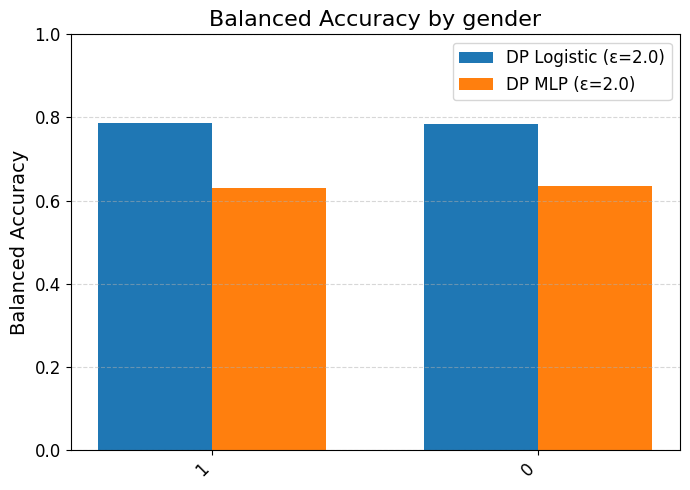

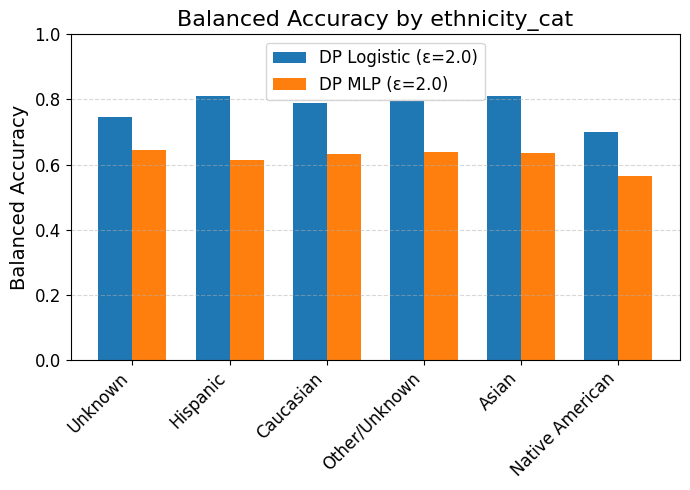

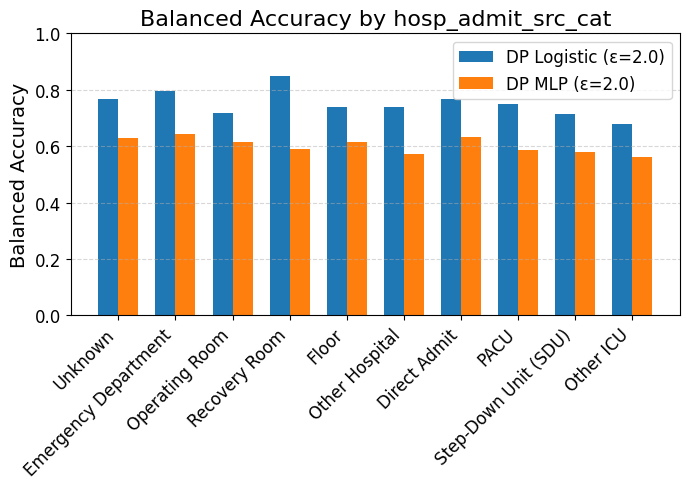

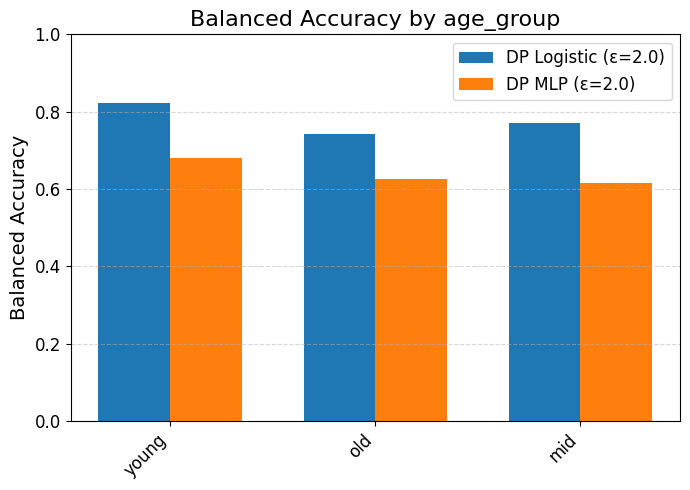

In [61]:
for axis in ['gender', 'ethnicity_cat', 'hosp_admit_src_cat', 'age_group']:
    df_axis = df_group_metrics_dp2[df_group_metrics_dp2['demographic'] == axis]
    groups = df_axis['group'].unique()
    x = np.arange(len(groups))
    width = 0.35

    fig, ax = plt.subplots(figsize=(7, 5))  # slightly wider for long group names

    for i, model_name in enumerate(df_axis['model'].unique()):
        vals = df_axis[df_axis['model'] == model_name]['balanced_accuracy']
        ax.bar(x + i * width, vals, width, label=model_name)

    ax.set_xticks(x + width / 2)
    ax.set_xticklabels(groups, rotation=45, ha='right', fontsize=12)
    ax.set_ylabel('Balanced Accuracy', fontsize=14)
    ax.set_ylim(0, 1)
    ax.set_title(f'Balanced Accuracy by {axis}', fontsize=16)
    ax.legend(loc='best', fontsize=12)
    ax.tick_params(axis='y', labelsize=12)
    ax.grid(axis='y', linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.show()

### AUC per Groups

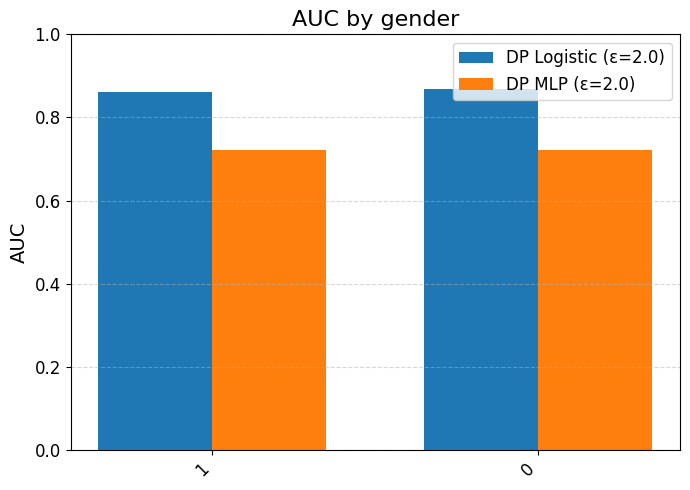

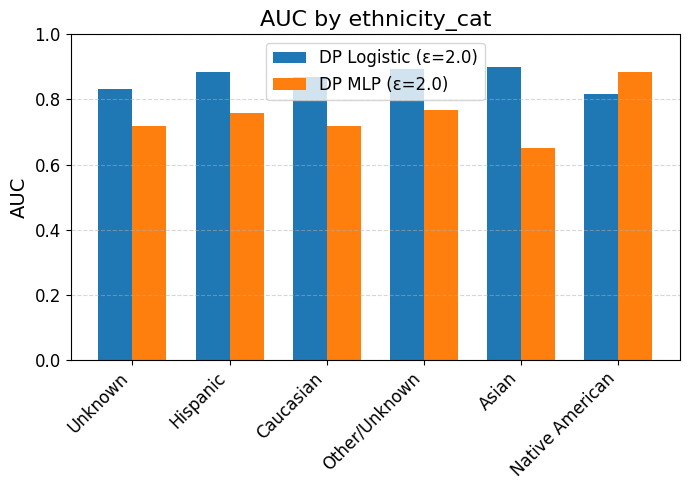

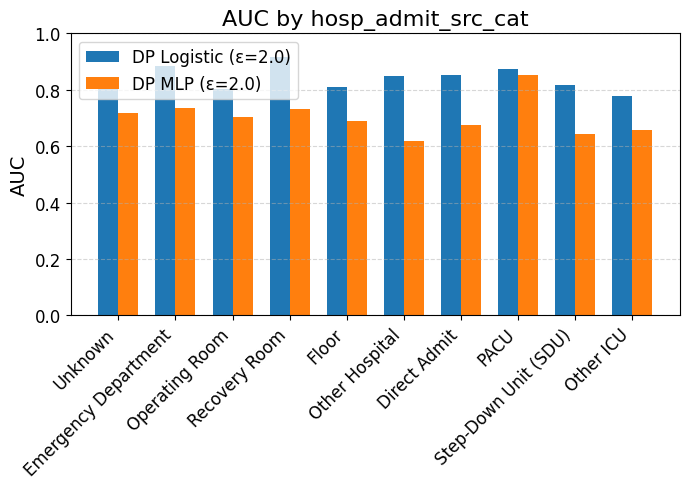

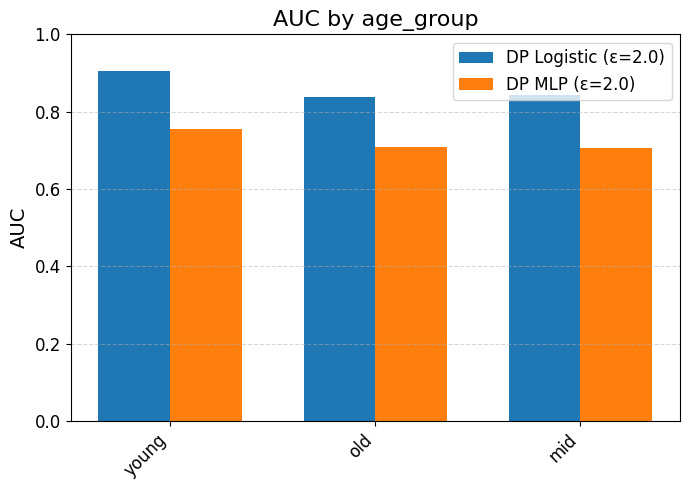

In [63]:
for axis in ['gender', 'ethnicity_cat', 'hosp_admit_src_cat', 'age_group']:
    df_axis = df_group_metrics_dp2[df_group_metrics_dp2['demographic'] == axis]
    groups = df_axis['group'].unique()
    x = np.arange(len(groups))
    width = 0.35

    fig, ax = plt.subplots(figsize=(7, 5))  # slightly wider for better x-label spacing

    for i, model_name in enumerate(df_axis['model'].unique()):
        vals = df_axis[df_axis['model'] == model_name]['auc']
        ax.bar(x + i * width, vals, width, label=model_name)

    ax.set_xticks(x + width / 2)
    ax.set_xticklabels(groups, rotation=45, ha='right', fontsize=12)
    ax.set_ylabel('AUC', fontsize=14)
    ax.set_ylim(0, 1)
    ax.set_title(f'AUC by {axis}', fontsize=16)
    ax.legend(loc='best', fontsize=12)
    ax.tick_params(axis='y', labelsize=12)
    ax.grid(axis='y', linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.show()


### Calibration by Subgroup

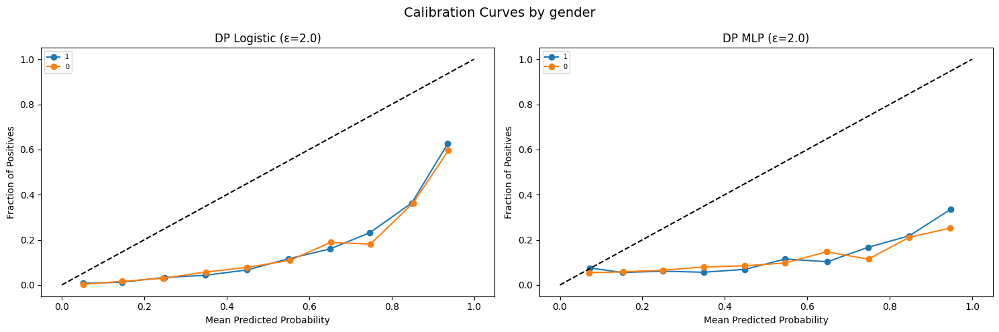

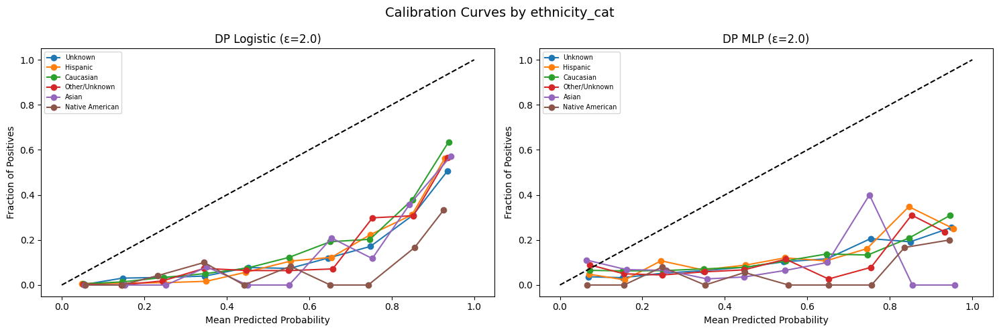

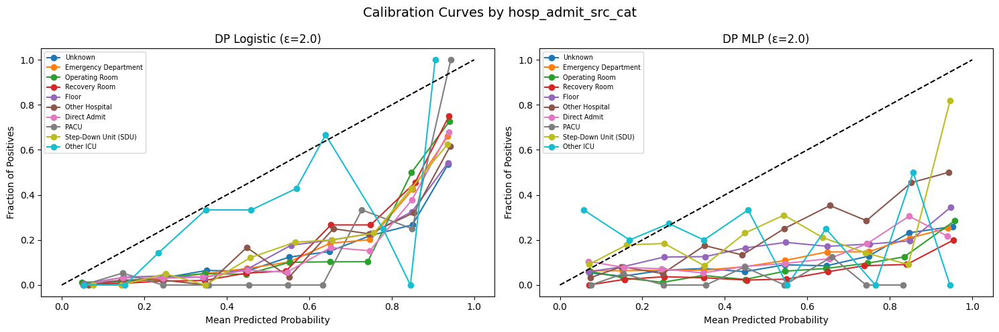

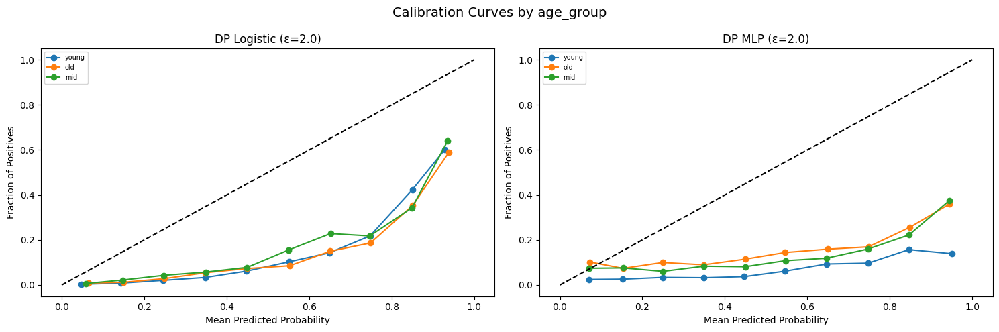

In [46]:
def calibration_by_subgroup(y_true, y_prob, model_name):
    records = []
    demographics = ['gender', 'ethnicity_cat', 'hosp_admit_src_cat', 'age_group']
    for axis in demographics:
        for group in df_test[axis].unique():
            mask = df_test[axis] == group
            if mask.sum() < 30:
                continue
            y_true_grp = y_true[mask]
            y_prob_grp = y_prob[mask]

            try:
                frac_pos, mean_pred = calibration_curve(y_true_grp, y_prob_grp, n_bins=10)
                records.append({
                    'model': model_name,
                    'demographic': axis,
                    'group': group,
                    'frac_pos': frac_pos,
                    'mean_pred': mean_pred
                })
            except:
                pass  # ignore groups where calibration can't be computed
    return records

calib_logreg = calibration_by_subgroup(y_test, y_prob_logreg_dp2, 'DP Logistic (ε=2.0)')
calib_mlp = calibration_by_subgroup(y_test, y_prob_mlp_dp2, 'DP MLP (ε=2.0)')

df_calib_dp2 = calib_logreg + calib_mlp

demographics = ['gender', 'ethnicity_cat', 'hosp_admit_src_cat', 'age_group']

# If needed: define model names (you have only two here)
model_names = ['DP Logistic (ε=2.0)', 'DP MLP (ε=2.0)']

for axis in demographics:
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))  # 2 plots side-by-side
    for idx, model_name in enumerate(model_names):
        ax = axs[idx]
        subset = [entry for entry in df_calib_dp2 if (entry['demographic'] == axis and entry['model'] == model_name)]
        for entry in subset:
            ax.plot(entry['mean_pred'], entry['frac_pos'], marker='o', label=entry['group'])
        ax.plot([0,1], [0,1], 'k--')
        ax.set_title(f'{model_name}')
        ax.set_xlabel('Mean Predicted Probability')
        ax.set_ylabel('Fraction of Positives')
        ax.legend(fontsize='x-small')

    fig.suptitle(f'Calibration Curves by {axis}', fontsize=14)
    plt.tight_layout()
    plt.show()




### Equality of Opportunity & Demographic Parity

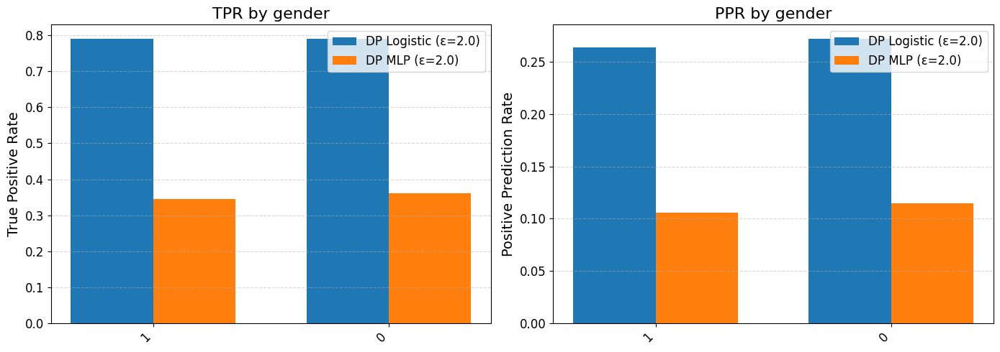

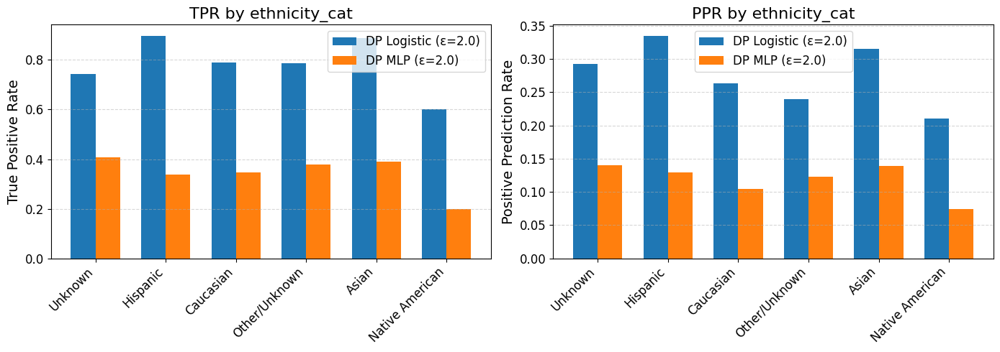

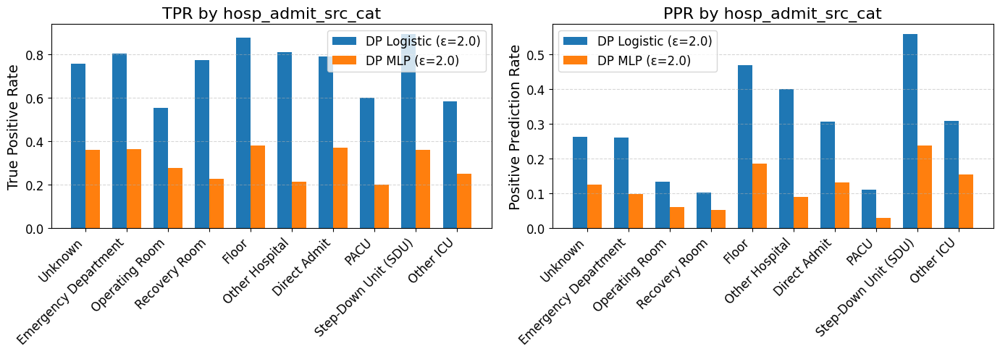

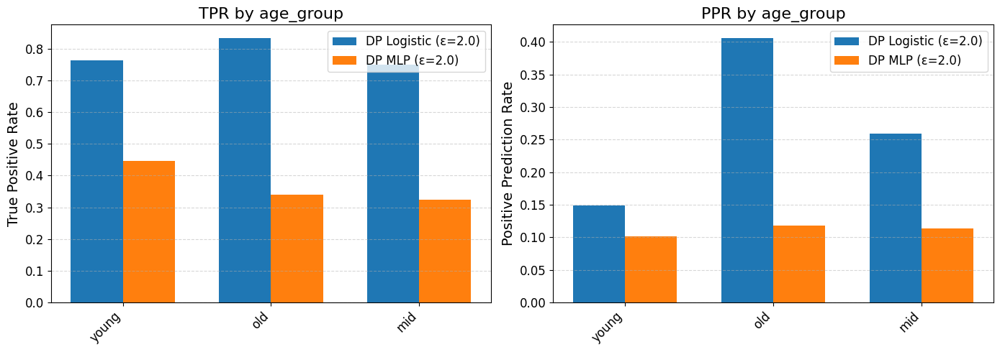

In [64]:
demographics = ['gender', 'ethnicity_cat', 'hosp_admit_src_cat', 'age_group']

for axis in demographics:
    df_ax = df_subgroup_dp2[df_subgroup_dp2['demographic'] == axis]
    groups = df_ax['group'].unique()
    x = np.arange(len(groups))
    width = 0.35

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))  # 1 row, 2 plots

    # TPR plot
    for i, model_name in enumerate(df_ax['model'].unique()):
        vals = df_ax[df_ax['model'] == model_name]['tpr']
        ax1.bar(x + i * width, vals, width, label=model_name)
    ax1.set_title(f'TPR by {axis}', fontsize=16)
    ax1.set_ylabel('True Positive Rate', fontsize=14)
    ax1.set_xticks(x + (width * (len(df_ax['model'].unique())-1)) / 2)
    ax1.set_xticklabels(groups, rotation=45, ha='right', fontsize=12)
    ax1.tick_params(axis='y', labelsize=12)
    ax1.legend(loc='best', fontsize=12)
    ax1.grid(axis='y', linestyle='--', alpha=0.5)

    # PPR plot
    for i, model_name in enumerate(df_ax['model'].unique()):
        vals = df_ax[df_ax['model'] == model_name]['ppr']
        ax2.bar(x + i * width, vals, width, label=model_name)
    ax2.set_title(f'PPR by {axis}', fontsize=16)
    ax2.set_ylabel('Positive Prediction Rate', fontsize=14)
    ax2.set_xticks(x + (width * (len(df_ax['model'].unique())-1)) / 2)
    ax2.set_xticklabels(groups, rotation=45, ha='right', fontsize=12)
    ax2.tick_params(axis='y', labelsize=12)
    ax2.legend(loc='best', fontsize=12)
    ax2.grid(axis='y', linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.show()


# SHAP

## Logistic Regression

In [50]:
# Changed from LinearExplainer to KernelExplainer
# KernelExplainer -> valid post-processing method for DP

def model_predict(X):
    if not isinstance(X, pd.DataFrame):
        X = pd.DataFrame(X, columns=X_train.columns)
    return log_clf_bal.predict_proba(X)[:, 1]

background = shap.sample(X_train, 50, random_state=2080)
explainer = shap.KernelExplainer(model_predict, background)
X_test_small = shap.sample(X_test, 1000, random_state=2080)
shap_values = explainer.shap_values(X_test_small, nsamples=200)

100%|██████████████████████████████████████████████████████| 1000/1000 [00:55<00:00, 18.00it/s]


/var/folders/wp/t4hgc9nx4s90xpch3k5c7kqr0000gn/T/ipykernel_63038/3338003245.py:2: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_small)


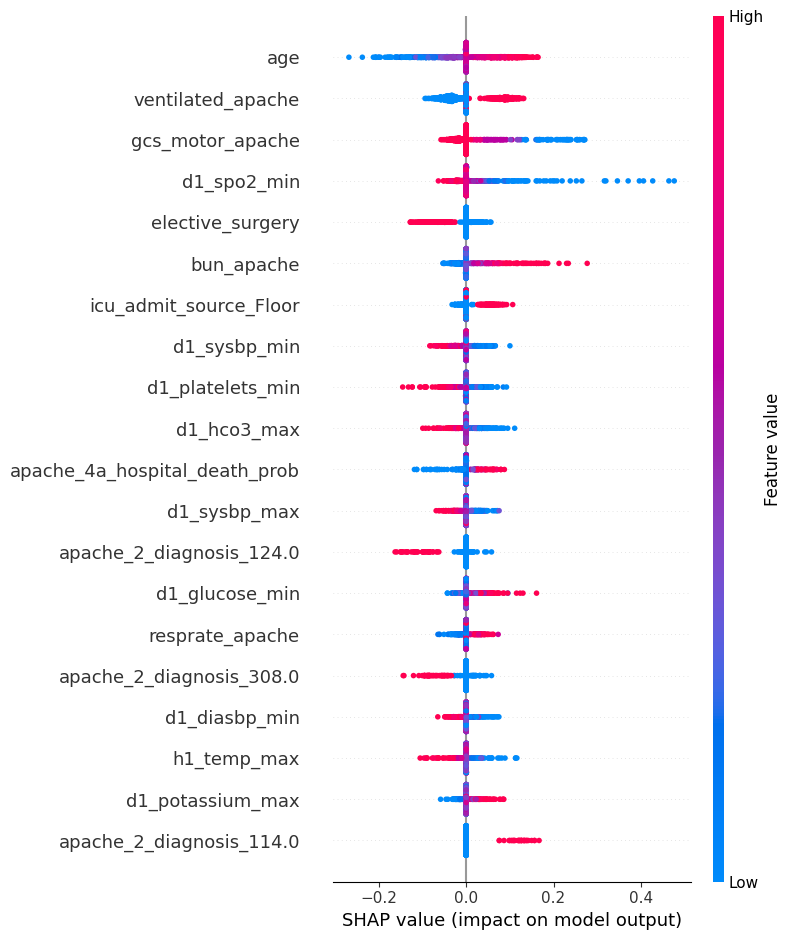

In [51]:
# Beeswarm (features sorted by importance)
shap.summary_plot(shap_values, X_test_small)

/var/folders/wp/t4hgc9nx4s90xpch3k5c7kqr0000gn/T/ipykernel_63038/2002056050.py:2: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, plot_type='bar', feature_names = X_train.columns)


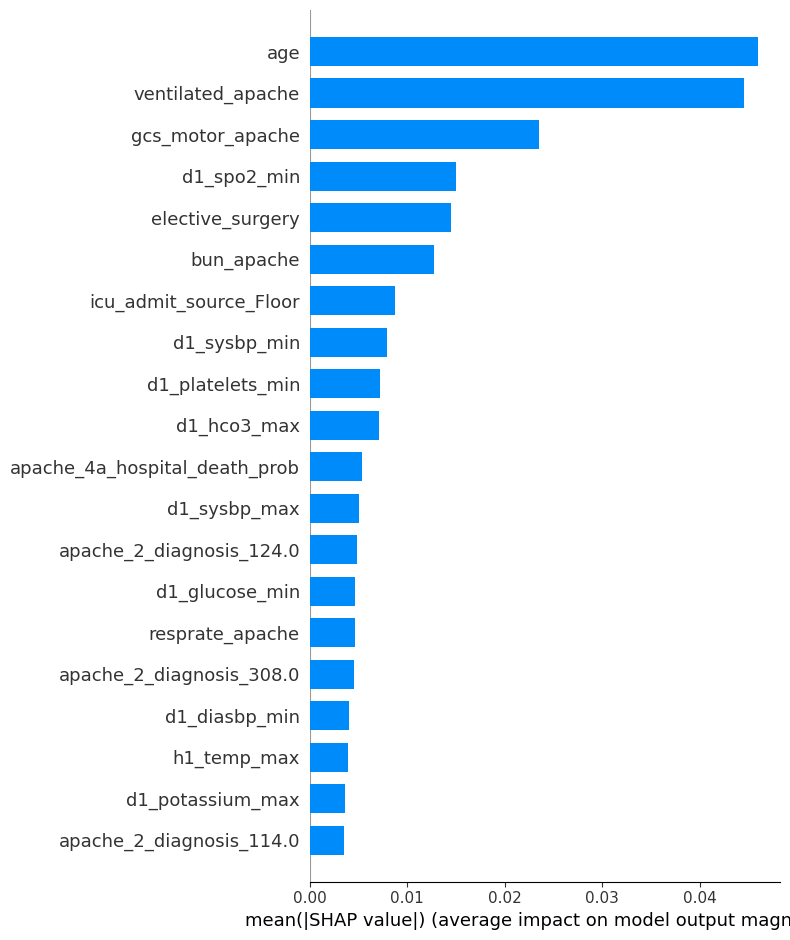

In [52]:
# Bar (mean absolute value per feature)
shap.summary_plot(shap_values, plot_type='bar', feature_names = X_train.columns)

In [53]:
explainer.expected_value

0.28986327974213466

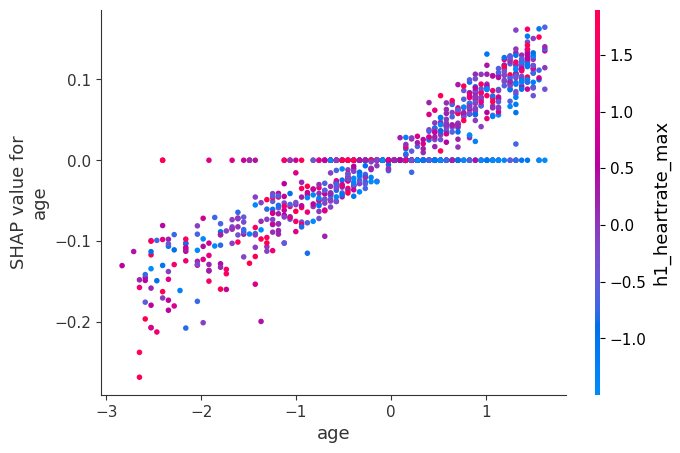

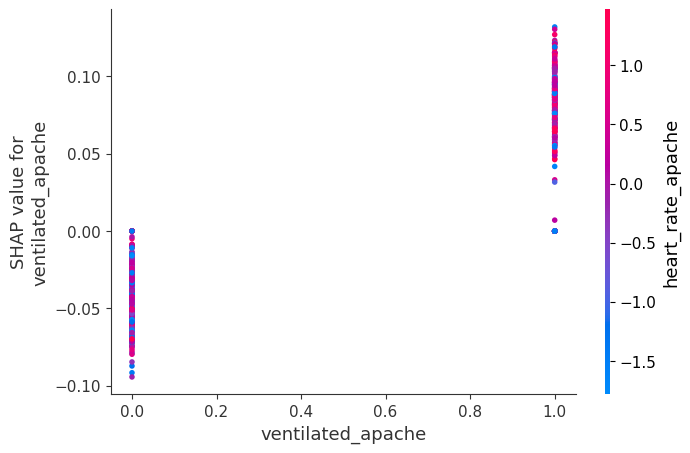

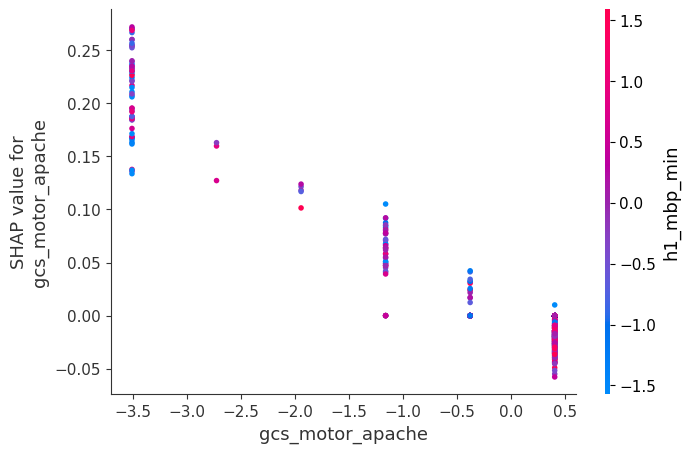

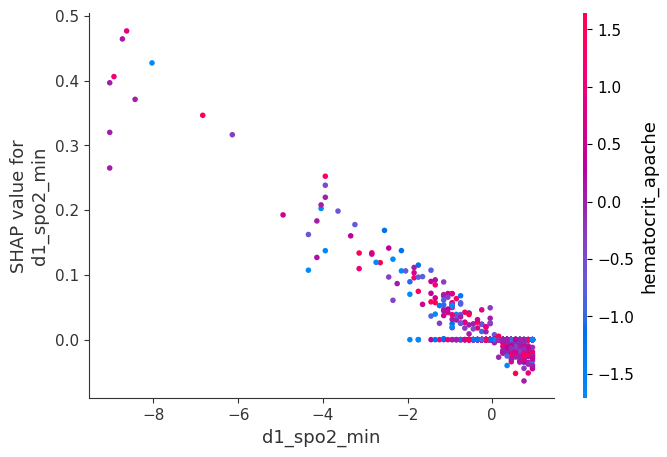

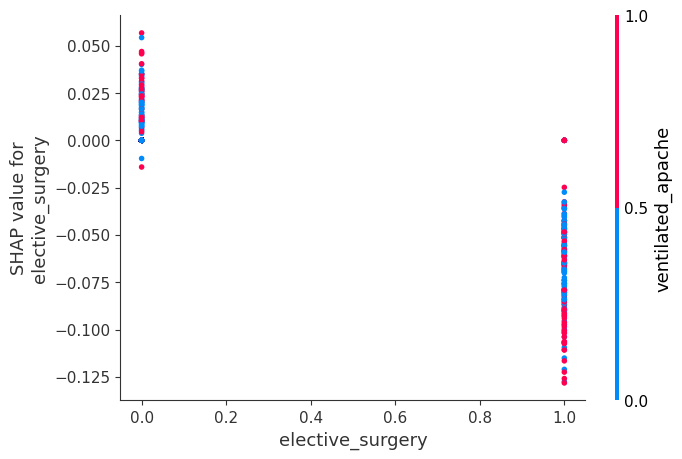

In [54]:
# Dependence plots 
# One per feature. Shows how that feature’s value vs. its SHAP effect, colored by a second feature.
# # Sort features by importance
mean_abs_shap = np.abs(shap_values).mean(axis=0)
top_idx = np.argsort(mean_abs_shap)[::-1]  
top_features = X_train.columns[top_idx[:5]] 
for feat in top_features:
    shap.dependence_plot(feat, shap_values, X_test_small)

100%|████████████████████████████████████████████████████████| 100/100 [00:41<00:00,  2.39it/s]


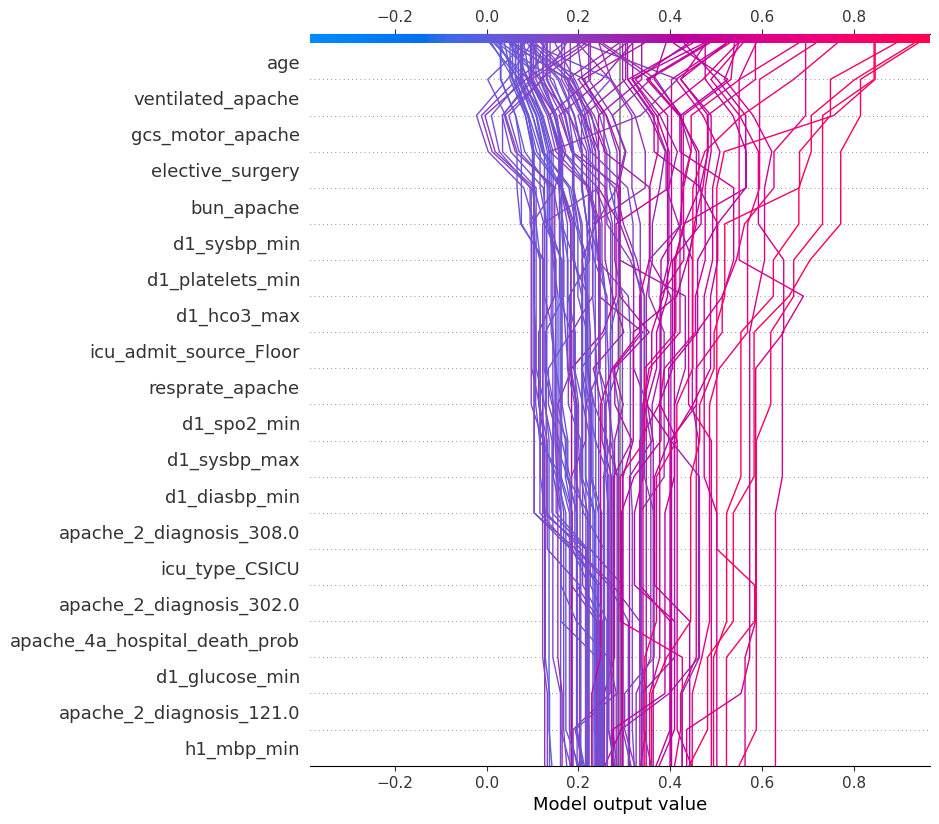

In [55]:
# Decision plot 
# Tracks cumulative impact of features for each sample
# pick 50 random test rows
X_small = shap.sample(X_test_small, 100, random_state=2080)

shap_exp = explainer(X_small)
shap.decision_plot(
    explainer.expected_value,
    shap_exp.values,
    X_small,
    ignore_warnings=True     
)

## XGBoost

In [57]:
def predict_fn(X):
    if not hasattr(X, "columns"):
        X = pd.DataFrame(X, columns=X_train.columns)
    return xgb_clf.predict_proba(X)[:, 1]

# ensure every column is float64
background = background.astype(np.float64)
X_test_small = X_test_small.astype(np.float64)

# Use the same background as above
explainer2 = shap.TreeExplainer(xgb_clf, background)

# Use the same X_test_small as above
shap_values2 = explainer2.shap_values(X_test_small)

/var/folders/wp/t4hgc9nx4s90xpch3k5c7kqr0000gn/T/ipykernel_63038/1035318981.py:2: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values2, X_test_small)


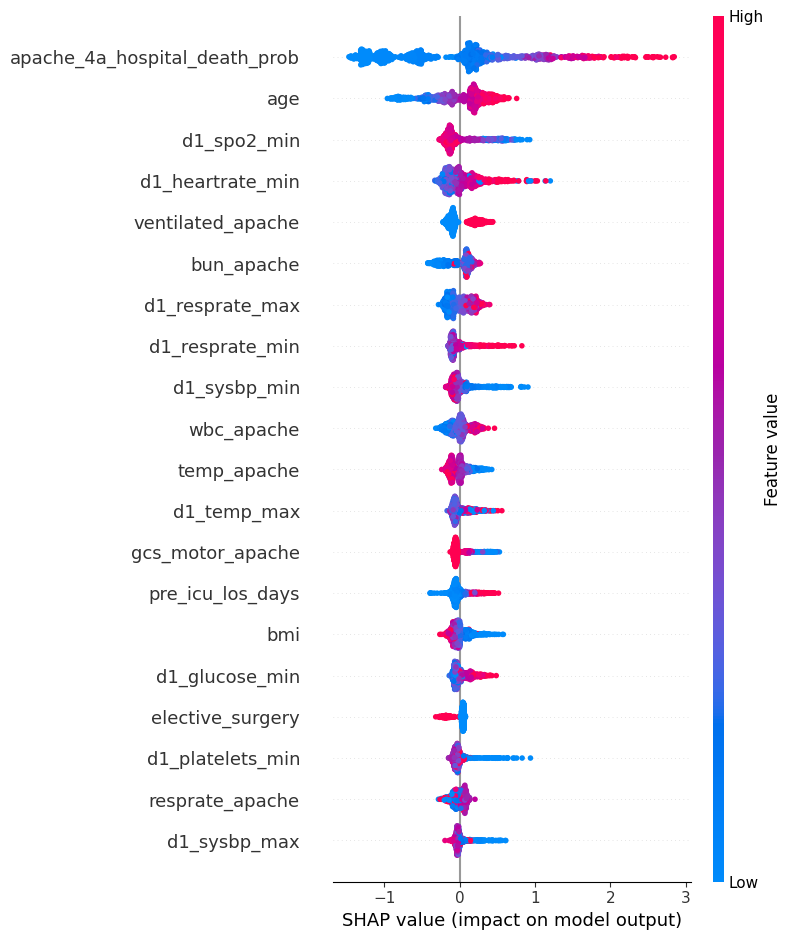

In [58]:
# Beeswarm (features sorted by importance)
shap.summary_plot(shap_values2, X_test_small)

/var/folders/wp/t4hgc9nx4s90xpch3k5c7kqr0000gn/T/ipykernel_63038/789285579.py:2: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values2, plot_type='bar', feature_names = X_train.columns)


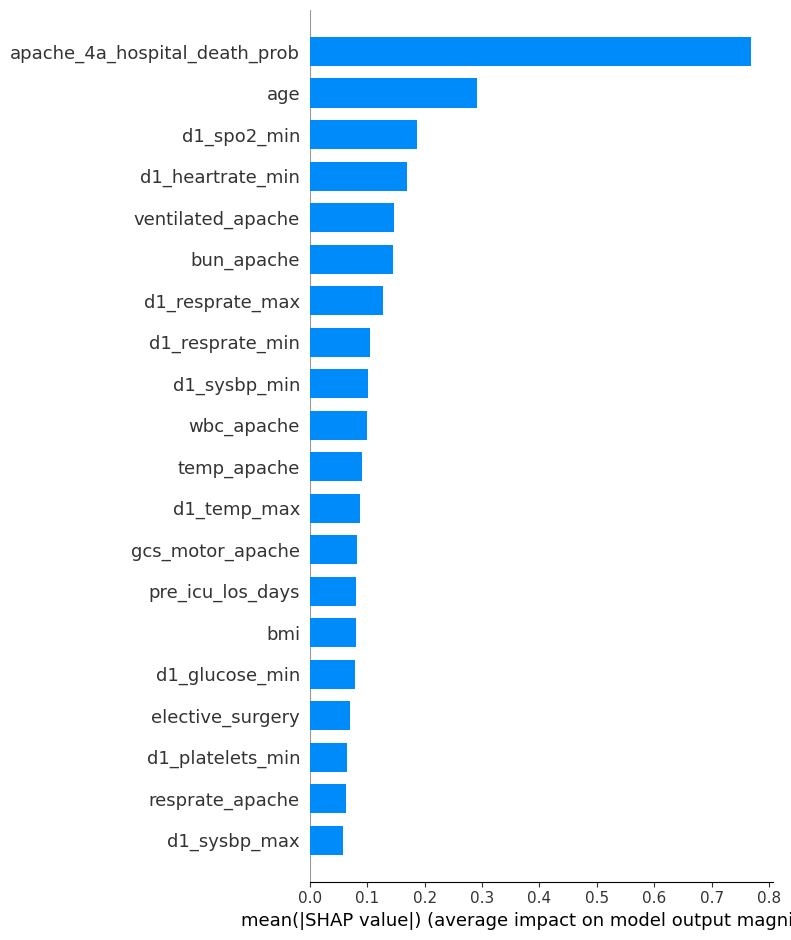

In [59]:
# Bar (mean absolute value per feature)
shap.summary_plot(shap_values2, plot_type='bar', feature_names = X_train.columns)

In [60]:
explainer2.expected_value

-1.4735461758212067

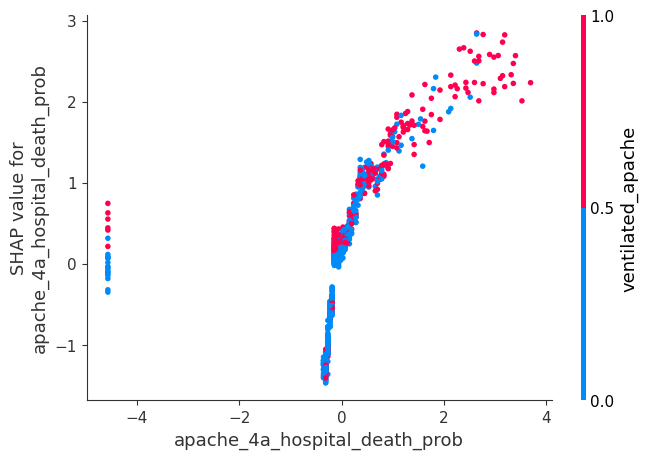

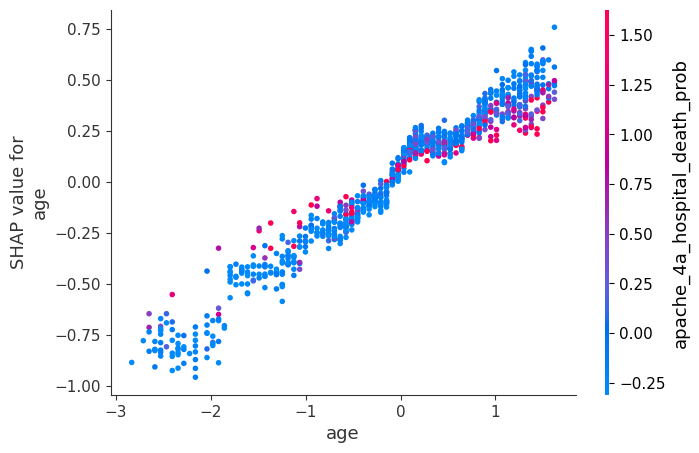

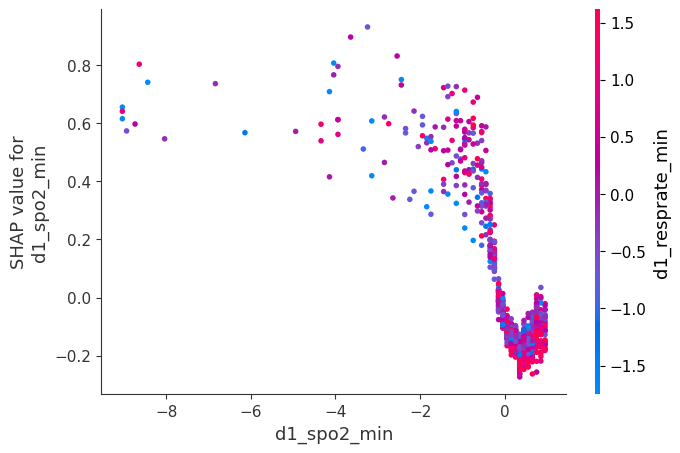

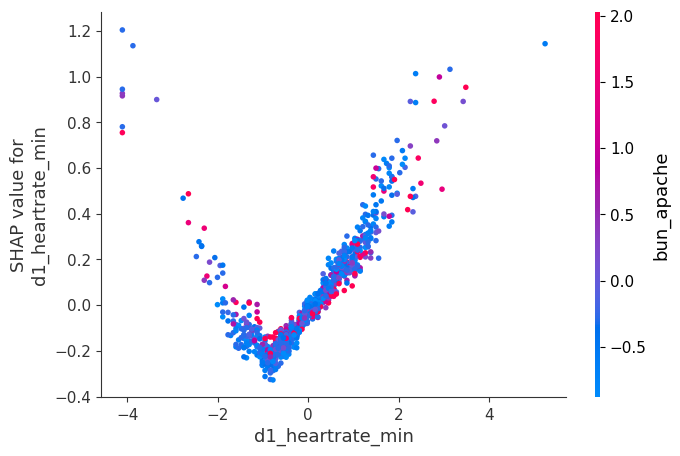

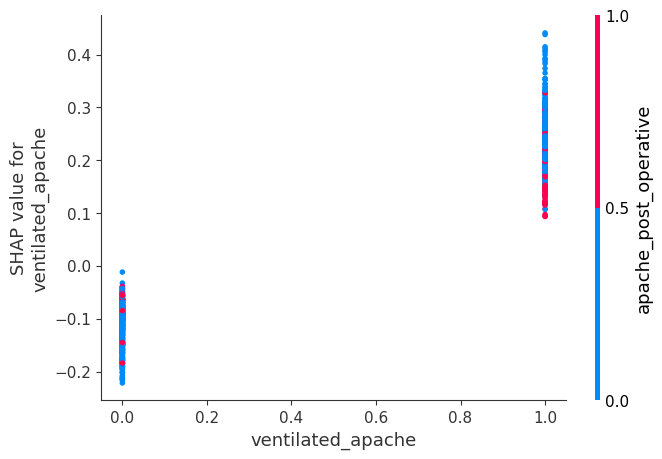

In [61]:
# Dependence plots 
# One per feature. Shows how that feature’s value vs. its SHAP effect, colored by a second feature.
# # Sort features by importance
mean_abs_shap2 = np.abs(shap_values2).mean(axis=0)
top_idx2 = np.argsort(mean_abs_shap2)[::-1]  
top_features2 = X_train.columns[top_idx2[:5]] 
for feat in top_features2:
    shap.dependence_plot(feat, shap_values2, X_test_small)

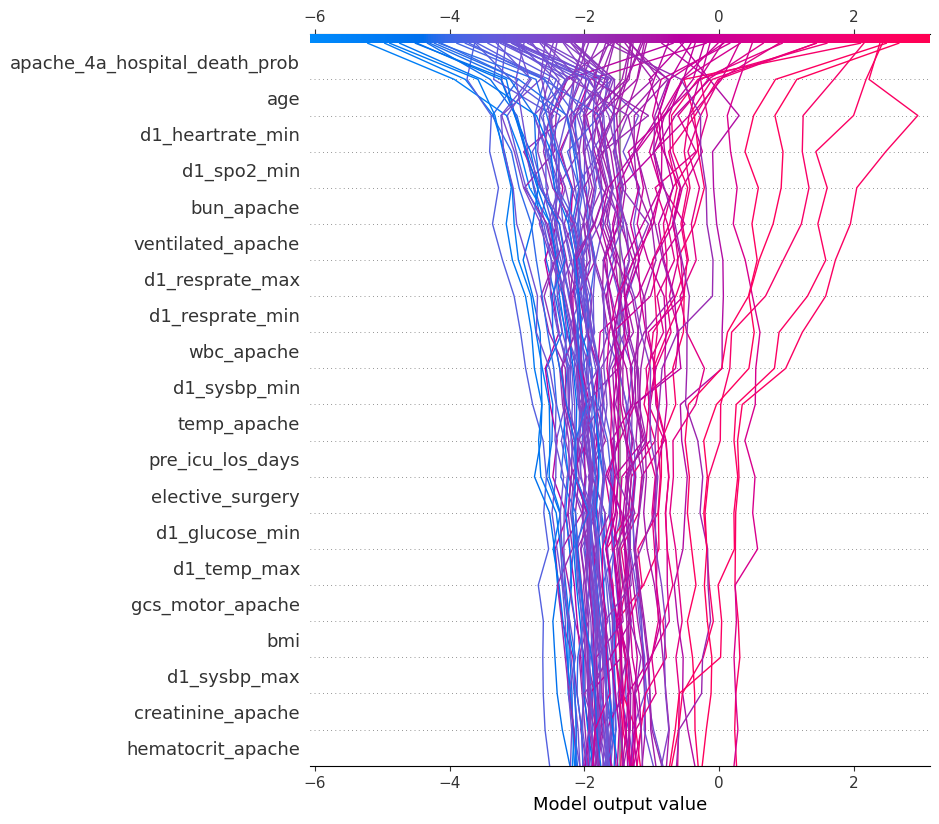

In [62]:
# Decision plot 
# Tracks cumulative impact of features for each sample
# pick 50 random test rows

# use the same X_small as above
shap_exp2 = explainer2(X_small)
shap.decision_plot(
    explainer2.expected_value,
    shap_exp2.values,
    X_small,
    ignore_warnings=True     
)

## MLP

In [64]:
bg_array = background.to_numpy(dtype=float)
test_array = X_test_small.to_numpy(dtype=float)
def predict_fn_mlp(X):
    if not hasattr(X, "columns"):
        X = pd.DataFrame(X, columns=X_train.columns)
    probs = model_mc.predict(X)               
   
    if probs.ndim == 2 and probs.shape[1] == 2:
        # softmax: second column is P(class=1)
        return probs[:, 1]
    elif probs.ndim == 2 and probs.shape[1] == 1:
        # sigmoid: single-column output is P(class=1)
        return probs[:, 0]

# Use the same background as above
explainer3 = shap.KernelExplainer(predict_fn_mlp, bg_array)

# Use the same X_test_small as above
shap_values3 = explainer3.shap_values(test_array, nsamples=200)

2/2 [==============================] - 0s 1ms/step


  0%|                                                                 | 0/1000 [00:00<?, ?it/s]

313/313 [==============================] - 0s 448us/step


  0%|                                                         | 1/1000 [00:00<04:22,  3.81it/s]

313/313 [==============================] - 0s 676us/step


  0%|                                                         | 2/1000 [00:00<05:34,  2.98it/s]

313/313 [==============================] - 0s 875us/step


  0%|▏                                                        | 3/1000 [00:01<05:51,  2.84it/s]

313/313 [==============================] - 0s 904us/step


  0%|▏                                                        | 4/1000 [00:01<06:00,  2.76it/s]

313/313 [==============================] - 0s 898us/step


  0%|▎                                                        | 5/1000 [00:01<06:06,  2.72it/s]

313/313 [==============================] - 0s 876us/step


  1%|▎                                                        | 6/1000 [00:02<06:09,  2.69it/s]

313/313 [==============================] - 0s 915us/step


  1%|▍                                                        | 7/1000 [00:02<06:08,  2.70it/s]

313/313 [==============================] - 0s 842us/step


  1%|▍                                                        | 8/1000 [00:02<06:05,  2.71it/s]

313/313 [==============================] - 0s 826us/step


  1%|▌                                                        | 9/1000 [00:03<06:08,  2.69it/s]

313/313 [==============================] - 0s 829us/step


  1%|▌                                                       | 10/1000 [00:03<06:17,  2.62it/s]

313/313 [==============================] - 0s 915us/step


  1%|▌                                                       | 11/1000 [00:04<06:23,  2.58it/s]

313/313 [==============================] - 0s 876us/step


  1%|▋                                                       | 12/1000 [00:04<06:21,  2.59it/s]

313/313 [==============================] - 0s 860us/step


  1%|▋                                                       | 13/1000 [00:04<06:18,  2.61it/s]

313/313 [==============================] - 0s 812us/step


  1%|▊                                                       | 14/1000 [00:05<06:14,  2.63it/s]

313/313 [==============================] - 0s 749us/step


  2%|▊                                                       | 15/1000 [00:05<06:20,  2.59it/s]

313/313 [==============================] - 0s 832us/step


  2%|▉                                                       | 16/1000 [00:05<06:19,  2.60it/s]

313/313 [==============================] - 0s 927us/step


  2%|▉                                                       | 17/1000 [00:06<06:24,  2.56it/s]

313/313 [==============================] - 0s 855us/step


  2%|█                                                       | 18/1000 [00:06<06:19,  2.59it/s]

313/313 [==============================] - 0s 907us/step


  2%|█                                                       | 19/1000 [00:07<06:18,  2.59it/s]

313/313 [==============================] - 0s 951us/step


  2%|█                                                       | 20/1000 [00:07<06:36,  2.47it/s]

313/313 [==============================] - 0s 898us/step


  2%|█▏                                                      | 21/1000 [00:07<06:34,  2.48it/s]

313/313 [==============================] - 0s 810us/step


  2%|█▏                                                      | 22/1000 [00:08<06:26,  2.53it/s]

313/313 [==============================] - 0s 864us/step


  2%|█▎                                                      | 23/1000 [00:08<06:35,  2.47it/s]

313/313 [==============================] - 0s 826us/step


  2%|█▎                                                      | 24/1000 [00:09<06:25,  2.53it/s]

313/313 [==============================] - 0s 861us/step


  2%|█▍                                                      | 25/1000 [00:09<06:15,  2.60it/s]

313/313 [==============================] - 0s 917us/step


  3%|█▍                                                      | 26/1000 [00:09<06:11,  2.62it/s]

313/313 [==============================] - 0s 853us/step


  3%|█▌                                                      | 27/1000 [00:10<06:04,  2.67it/s]

313/313 [==============================] - 0s 810us/step


  3%|█▌                                                      | 28/1000 [00:10<06:05,  2.66it/s]

313/313 [==============================] - 0s 915us/step


  3%|█▌                                                      | 29/1000 [00:11<06:05,  2.66it/s]

313/313 [==============================] - 0s 931us/step


  3%|█▋                                                      | 30/1000 [00:11<06:06,  2.64it/s]

313/313 [==============================] - 0s 913us/step


  3%|█▋                                                      | 31/1000 [00:11<06:09,  2.62it/s]

313/313 [==============================] - 0s 866us/step


  3%|█▊                                                      | 32/1000 [00:12<06:02,  2.67it/s]

313/313 [==============================] - 0s 802us/step


  3%|█▊                                                      | 33/1000 [00:12<05:57,  2.70it/s]

313/313 [==============================] - 0s 879us/step


  3%|█▉                                                      | 34/1000 [00:12<05:54,  2.72it/s]

313/313 [==============================] - 0s 859us/step


  4%|█▉                                                      | 35/1000 [00:13<05:53,  2.73it/s]

313/313 [==============================] - 0s 848us/step


  4%|██                                                      | 36/1000 [00:13<05:52,  2.74it/s]

313/313 [==============================] - 0s 833us/step


  4%|██                                                      | 37/1000 [00:13<05:50,  2.74it/s]

313/313 [==============================] - 0s 829us/step


  4%|██▏                                                     | 38/1000 [00:14<05:50,  2.75it/s]

313/313 [==============================] - 0s 849us/step


  4%|██▏                                                     | 39/1000 [00:14<05:49,  2.75it/s]

313/313 [==============================] - 0s 846us/step


  4%|██▏                                                     | 40/1000 [00:15<05:48,  2.75it/s]

313/313 [==============================] - 0s 886us/step


  4%|██▎                                                     | 41/1000 [00:15<05:46,  2.77it/s]

313/313 [==============================] - 0s 828us/step


  4%|██▎                                                     | 42/1000 [00:15<05:46,  2.77it/s]

313/313 [==============================] - 0s 857us/step


  4%|██▍                                                     | 43/1000 [00:16<05:44,  2.78it/s]

313/313 [==============================] - 0s 846us/step


  4%|██▍                                                     | 44/1000 [00:16<05:43,  2.78it/s]

313/313 [==============================] - 0s 846us/step


  4%|██▌                                                     | 45/1000 [00:16<05:43,  2.78it/s]

313/313 [==============================] - 0s 1ms/step


  5%|██▌                                                     | 46/1000 [00:17<06:02,  2.63it/s]

313/313 [==============================] - 0s 803us/step


  5%|██▋                                                     | 47/1000 [00:17<05:59,  2.65it/s]

313/313 [==============================] - 0s 851us/step


  5%|██▋                                                     | 48/1000 [00:18<05:56,  2.67it/s]

313/313 [==============================] - 0s 848us/step


  5%|██▋                                                     | 49/1000 [00:18<05:55,  2.68it/s]

313/313 [==============================] - 0s 850us/step


  5%|██▊                                                     | 50/1000 [00:18<05:51,  2.70it/s]

313/313 [==============================] - 0s 869us/step


  5%|██▊                                                     | 51/1000 [00:19<05:49,  2.71it/s]

313/313 [==============================] - 0s 878us/step


  5%|██▉                                                     | 52/1000 [00:19<05:52,  2.69it/s]

313/313 [==============================] - 0s 853us/step


  5%|██▉                                                     | 53/1000 [00:19<05:48,  2.72it/s]

313/313 [==============================] - 0s 881us/step


  5%|███                                                     | 54/1000 [00:20<05:48,  2.72it/s]

313/313 [==============================] - 0s 852us/step


  6%|███                                                     | 55/1000 [00:20<05:48,  2.71it/s]

313/313 [==============================] - 0s 801us/step


  6%|███▏                                                    | 56/1000 [00:20<05:48,  2.71it/s]

313/313 [==============================] - 0s 844us/step


  6%|███▏                                                    | 57/1000 [00:21<05:44,  2.73it/s]

313/313 [==============================] - 0s 868us/step


  6%|███▏                                                    | 58/1000 [00:21<05:40,  2.77it/s]

313/313 [==============================] - 0s 858us/step


  6%|███▎                                                    | 59/1000 [00:22<05:40,  2.77it/s]

313/313 [==============================] - 0s 772us/step


  6%|███▎                                                    | 60/1000 [00:22<05:42,  2.75it/s]

313/313 [==============================] - 0s 847us/step


  6%|███▍                                                    | 61/1000 [00:22<05:40,  2.76it/s]

313/313 [==============================] - 0s 851us/step


  6%|███▍                                                    | 62/1000 [00:23<05:39,  2.76it/s]

313/313 [==============================] - 0s 843us/step


  6%|███▌                                                    | 63/1000 [00:23<05:38,  2.76it/s]

313/313 [==============================] - 0s 854us/step


  6%|███▌                                                    | 64/1000 [00:23<05:37,  2.77it/s]

313/313 [==============================] - 0s 822us/step


  6%|███▋                                                    | 65/1000 [00:24<05:39,  2.76it/s]

313/313 [==============================] - 0s 849us/step


  7%|███▋                                                    | 66/1000 [00:24<05:37,  2.77it/s]

313/313 [==============================] - 0s 887us/step


  7%|███▊                                                    | 67/1000 [00:24<05:36,  2.77it/s]

313/313 [==============================] - 0s 832us/step


  7%|███▊                                                    | 68/1000 [00:25<05:38,  2.75it/s]

313/313 [==============================] - 0s 890us/step


  7%|███▊                                                    | 69/1000 [00:25<06:01,  2.57it/s]

313/313 [==============================] - 0s 869us/step


  7%|███▉                                                    | 70/1000 [00:26<05:57,  2.60it/s]

313/313 [==============================] - 0s 899us/step


  7%|███▉                                                    | 71/1000 [00:26<06:01,  2.57it/s]

313/313 [==============================] - 0s 890us/step


  7%|████                                                    | 72/1000 [00:26<05:56,  2.61it/s]

313/313 [==============================] - 0s 880us/step


  7%|████                                                    | 73/1000 [00:27<05:52,  2.63it/s]

313/313 [==============================] - 0s 906us/step


  7%|████▏                                                   | 74/1000 [00:27<05:52,  2.62it/s]

313/313 [==============================] - 0s 880us/step


  8%|████▏                                                   | 75/1000 [00:28<05:52,  2.62it/s]

313/313 [==============================] - 0s 810us/step


  8%|████▎                                                   | 76/1000 [00:28<05:51,  2.63it/s]

313/313 [==============================] - 0s 903us/step


  8%|████▎                                                   | 77/1000 [00:28<05:55,  2.60it/s]

313/313 [==============================] - 0s 795us/step


  8%|████▎                                                   | 78/1000 [00:29<05:55,  2.59it/s]

313/313 [==============================] - 0s 894us/step


  8%|████▍                                                   | 79/1000 [00:29<05:51,  2.62it/s]

313/313 [==============================] - 0s 765us/step


  8%|████▍                                                   | 80/1000 [00:29<06:00,  2.55it/s]

313/313 [==============================] - 0s 826us/step


  8%|████▌                                                   | 81/1000 [00:30<06:01,  2.54it/s]

313/313 [==============================] - 0s 861us/step


  8%|████▌                                                   | 82/1000 [00:30<06:12,  2.47it/s]

313/313 [==============================] - 0s 868us/step


  8%|████▋                                                   | 83/1000 [00:31<06:03,  2.52it/s]

313/313 [==============================] - 0s 886us/step


  8%|████▋                                                   | 84/1000 [00:31<05:58,  2.55it/s]

313/313 [==============================] - 0s 1ms/step


  8%|████▊                                                   | 85/1000 [00:31<06:05,  2.50it/s]

313/313 [==============================] - 0s 793us/step


  9%|████▊                                                   | 86/1000 [00:32<05:58,  2.55it/s]

313/313 [==============================] - 0s 848us/step


  9%|████▊                                                   | 87/1000 [00:32<05:53,  2.58it/s]

313/313 [==============================] - 0s 904us/step


  9%|████▉                                                   | 88/1000 [00:33<05:55,  2.57it/s]

313/313 [==============================] - 0s 876us/step


  9%|████▉                                                   | 89/1000 [00:33<05:52,  2.59it/s]

313/313 [==============================] - 0s 886us/step


  9%|█████                                                   | 90/1000 [00:33<05:49,  2.60it/s]

313/313 [==============================] - 0s 871us/step


  9%|█████                                                   | 91/1000 [00:34<05:45,  2.63it/s]

313/313 [==============================] - 0s 879us/step


  9%|█████▏                                                  | 92/1000 [00:34<05:46,  2.62it/s]

313/313 [==============================] - 0s 832us/step


  9%|█████▏                                                  | 93/1000 [00:35<05:45,  2.63it/s]

313/313 [==============================] - 0s 928us/step


  9%|█████▎                                                  | 94/1000 [00:35<05:54,  2.56it/s]

313/313 [==============================] - 0s 855us/step


 10%|█████▎                                                  | 95/1000 [00:35<05:49,  2.59it/s]

313/313 [==============================] - 0s 853us/step


 10%|█████▍                                                  | 96/1000 [00:36<05:44,  2.62it/s]

313/313 [==============================] - 0s 892us/step


 10%|█████▍                                                  | 97/1000 [00:36<05:40,  2.65it/s]

313/313 [==============================] - 0s 835us/step


 10%|█████▍                                                  | 98/1000 [00:36<05:35,  2.69it/s]

313/313 [==============================] - 0s 843us/step


 10%|█████▌                                                  | 99/1000 [00:37<05:32,  2.71it/s]

313/313 [==============================] - 0s 818us/step


 10%|█████▌                                                 | 100/1000 [00:37<05:33,  2.70it/s]

313/313 [==============================] - 0s 812us/step


 10%|█████▌                                                 | 101/1000 [00:38<05:34,  2.69it/s]

313/313 [==============================] - 0s 817us/step


 10%|█████▌                                                 | 102/1000 [00:38<05:36,  2.67it/s]

313/313 [==============================] - 0s 783us/step


 10%|█████▋                                                 | 103/1000 [00:38<05:43,  2.61it/s]

313/313 [==============================] - 0s 855us/step


 10%|█████▋                                                 | 104/1000 [00:39<05:42,  2.61it/s]

313/313 [==============================] - 0s 856us/step


 10%|█████▊                                                 | 105/1000 [00:39<05:40,  2.62it/s]

313/313 [==============================] - 0s 865us/step


 11%|█████▊                                                 | 106/1000 [00:39<05:37,  2.65it/s]

313/313 [==============================] - 0s 860us/step


 11%|█████▉                                                 | 107/1000 [00:40<05:38,  2.64it/s]

313/313 [==============================] - 0s 876us/step


 11%|█████▉                                                 | 108/1000 [00:40<05:36,  2.65it/s]

313/313 [==============================] - 0s 858us/step


 11%|█████▉                                                 | 109/1000 [00:41<05:32,  2.68it/s]

313/313 [==============================] - 0s 879us/step


 11%|██████                                                 | 110/1000 [00:41<05:31,  2.69it/s]

313/313 [==============================] - 0s 880us/step


 11%|██████                                                 | 111/1000 [00:41<05:30,  2.69it/s]

313/313 [==============================] - 0s 848us/step


 11%|██████▏                                                | 112/1000 [00:42<05:29,  2.70it/s]

313/313 [==============================] - 0s 819us/step


 11%|██████▏                                                | 113/1000 [00:42<05:26,  2.72it/s]

313/313 [==============================] - 0s 850us/step


 11%|██████▎                                                | 114/1000 [00:42<05:27,  2.71it/s]

313/313 [==============================] - 0s 879us/step


 12%|██████▎                                                | 115/1000 [00:43<05:26,  2.71it/s]

313/313 [==============================] - 0s 851us/step


 12%|██████▍                                                | 116/1000 [00:43<05:25,  2.71it/s]

313/313 [==============================] - 0s 928us/step


 12%|██████▍                                                | 117/1000 [00:44<05:28,  2.69it/s]

313/313 [==============================] - 0s 833us/step


 12%|██████▍                                                | 118/1000 [00:44<05:26,  2.70it/s]

313/313 [==============================] - 0s 850us/step


 12%|██████▌                                                | 119/1000 [00:44<05:33,  2.64it/s]

313/313 [==============================] - 0s 873us/step


 12%|██████▌                                                | 120/1000 [00:45<05:33,  2.64it/s]

313/313 [==============================] - 0s 882us/step


 12%|██████▋                                                | 121/1000 [00:45<05:32,  2.64it/s]

313/313 [==============================] - 0s 870us/step


 12%|██████▋                                                | 122/1000 [00:45<05:34,  2.63it/s]

313/313 [==============================] - 0s 829us/step


 12%|██████▊                                                | 123/1000 [00:46<05:29,  2.66it/s]

313/313 [==============================] - 0s 862us/step


 12%|██████▊                                                | 124/1000 [00:46<05:26,  2.68it/s]

313/313 [==============================] - 0s 850us/step


 12%|██████▉                                                | 125/1000 [00:47<05:27,  2.67it/s]

313/313 [==============================] - 0s 810us/step


 13%|██████▉                                                | 126/1000 [00:47<05:34,  2.61it/s]

313/313 [==============================] - 0s 929us/step


 13%|██████▉                                                | 127/1000 [00:47<05:41,  2.56it/s]

313/313 [==============================] - 0s 943us/step


 13%|███████                                                | 128/1000 [00:48<05:42,  2.55it/s]

313/313 [==============================] - 0s 939us/step


 13%|███████                                                | 129/1000 [00:48<05:42,  2.54it/s]

313/313 [==============================] - 0s 891us/step


 13%|███████▏                                               | 130/1000 [00:49<05:54,  2.46it/s]

313/313 [==============================] - 0s 839us/step


 13%|███████▏                                               | 131/1000 [00:49<05:47,  2.50it/s]

313/313 [==============================] - 0s 903us/step


 13%|███████▎                                               | 132/1000 [00:49<05:46,  2.51it/s]

313/313 [==============================] - 0s 837us/step


 13%|███████▎                                               | 133/1000 [00:50<05:39,  2.56it/s]

313/313 [==============================] - 0s 898us/step


 13%|███████▎                                               | 134/1000 [00:50<05:43,  2.52it/s]

313/313 [==============================] - 0s 830us/step


 14%|███████▍                                               | 135/1000 [00:51<05:39,  2.55it/s]

313/313 [==============================] - 0s 873us/step


 14%|███████▍                                               | 136/1000 [00:51<05:36,  2.57it/s]

313/313 [==============================] - 0s 898us/step


 14%|███████▌                                               | 137/1000 [00:51<05:37,  2.56it/s]

313/313 [==============================] - 0s 825us/step


 14%|███████▌                                               | 138/1000 [00:52<05:35,  2.57it/s]

313/313 [==============================] - 0s 872us/step


 14%|███████▋                                               | 139/1000 [00:52<05:36,  2.56it/s]

313/313 [==============================] - 0s 938us/step


 14%|███████▋                                               | 140/1000 [00:52<05:32,  2.59it/s]

313/313 [==============================] - 0s 878us/step


 14%|███████▊                                               | 141/1000 [00:53<05:28,  2.62it/s]

313/313 [==============================] - 0s 956us/step


 14%|███████▊                                               | 142/1000 [00:53<05:33,  2.57it/s]

313/313 [==============================] - 0s 941us/step


 14%|███████▊                                               | 143/1000 [00:54<05:34,  2.56it/s]

313/313 [==============================] - 0s 811us/step


 14%|███████▉                                               | 144/1000 [00:54<05:49,  2.45it/s]

313/313 [==============================] - 0s 806us/step


 14%|███████▉                                               | 145/1000 [00:54<05:44,  2.48it/s]

313/313 [==============================] - 0s 924us/step


 15%|████████                                               | 146/1000 [00:55<05:46,  2.47it/s]

313/313 [==============================] - 0s 805us/step


 15%|████████                                               | 147/1000 [00:55<05:37,  2.53it/s]

313/313 [==============================] - 0s 854us/step


 15%|████████▏                                              | 148/1000 [00:56<05:32,  2.57it/s]

313/313 [==============================] - 0s 972us/step


 15%|████████▏                                              | 149/1000 [00:56<05:38,  2.51it/s]

313/313 [==============================] - 0s 673us/step


 15%|████████▎                                              | 150/1000 [00:56<05:41,  2.49it/s]

313/313 [==============================] - 0s 861us/step


 15%|████████▎                                              | 151/1000 [00:57<05:37,  2.52it/s]

313/313 [==============================] - 0s 897us/step


 15%|████████▎                                              | 152/1000 [00:57<05:32,  2.55it/s]

313/313 [==============================] - 0s 908us/step


 15%|████████▍                                              | 153/1000 [00:58<05:29,  2.57it/s]

313/313 [==============================] - 0s 881us/step


 15%|████████▍                                              | 154/1000 [00:58<05:28,  2.58it/s]

313/313 [==============================] - 0s 933us/step


 16%|████████▌                                              | 155/1000 [00:58<05:29,  2.56it/s]

313/313 [==============================] - 0s 844us/step


 16%|████████▌                                              | 156/1000 [00:59<05:28,  2.57it/s]

313/313 [==============================] - 0s 854us/step


 16%|████████▋                                              | 157/1000 [00:59<05:30,  2.55it/s]

313/313 [==============================] - 0s 955us/step


 16%|████████▋                                              | 158/1000 [01:00<05:35,  2.51it/s]

313/313 [==============================] - 0s 801us/step


 16%|████████▋                                              | 159/1000 [01:00<05:28,  2.56it/s]

313/313 [==============================] - 0s 872us/step


 16%|████████▊                                              | 160/1000 [01:00<05:25,  2.58it/s]

313/313 [==============================] - 0s 851us/step


 16%|████████▊                                              | 161/1000 [01:01<05:20,  2.62it/s]

313/313 [==============================] - 0s 833us/step


 16%|████████▉                                              | 162/1000 [01:01<05:18,  2.63it/s]

313/313 [==============================] - 0s 878us/step


 16%|████████▉                                              | 163/1000 [01:01<05:19,  2.62it/s]

313/313 [==============================] - 0s 889us/step


 16%|█████████                                              | 164/1000 [01:02<05:19,  2.62it/s]

313/313 [==============================] - 0s 805us/step


 16%|█████████                                              | 165/1000 [01:02<05:24,  2.57it/s]

313/313 [==============================] - 0s 877us/step


 17%|█████████▏                                             | 166/1000 [01:03<05:20,  2.60it/s]

313/313 [==============================] - 0s 827us/step


 17%|█████████▏                                             | 167/1000 [01:03<05:20,  2.60it/s]

313/313 [==============================] - 0s 673us/step


 17%|█████████▏                                             | 168/1000 [01:03<05:25,  2.56it/s]

313/313 [==============================] - 0s 884us/step


 17%|█████████▎                                             | 169/1000 [01:04<05:22,  2.58it/s]

313/313 [==============================] - 0s 856us/step


 17%|█████████▎                                             | 170/1000 [01:04<05:22,  2.58it/s]

313/313 [==============================] - 0s 961us/step


 17%|█████████▍                                             | 171/1000 [01:05<05:28,  2.52it/s]

313/313 [==============================] - 0s 888us/step


 17%|█████████▍                                             | 172/1000 [01:05<05:24,  2.55it/s]

313/313 [==============================] - 0s 862us/step


 17%|█████████▌                                             | 173/1000 [01:05<05:18,  2.60it/s]

313/313 [==============================] - 0s 866us/step


 17%|█████████▌                                             | 174/1000 [01:06<05:19,  2.59it/s]

313/313 [==============================] - 0s 851us/step


 18%|█████████▋                                             | 175/1000 [01:06<05:22,  2.56it/s]

313/313 [==============================] - 0s 918us/step


 18%|█████████▋                                             | 176/1000 [01:07<05:33,  2.47it/s]

313/313 [==============================] - 0s 768us/step


 18%|█████████▋                                             | 177/1000 [01:07<05:38,  2.43it/s]

313/313 [==============================] - 0s 874us/step


 18%|█████████▊                                             | 178/1000 [01:07<05:47,  2.36it/s]

313/313 [==============================] - 0s 839us/step


 18%|█████████▊                                             | 179/1000 [01:08<05:35,  2.45it/s]

313/313 [==============================] - 0s 832us/step


 18%|█████████▉                                             | 180/1000 [01:08<05:27,  2.50it/s]

313/313 [==============================] - 0s 879us/step


 18%|█████████▉                                             | 181/1000 [01:09<05:19,  2.56it/s]

313/313 [==============================] - 0s 955us/step


 18%|██████████                                             | 182/1000 [01:09<05:21,  2.55it/s]

313/313 [==============================] - 0s 895us/step


 18%|██████████                                             | 183/1000 [01:09<05:14,  2.59it/s]

313/313 [==============================] - 0s 894us/step


 18%|██████████                                             | 184/1000 [01:10<05:16,  2.58it/s]

313/313 [==============================] - 0s 941us/step


 18%|██████████▏                                            | 185/1000 [01:10<05:18,  2.55it/s]

313/313 [==============================] - 0s 885us/step


 19%|██████████▏                                            | 186/1000 [01:11<05:26,  2.50it/s]

313/313 [==============================] - 0s 886us/step


 19%|██████████▎                                            | 187/1000 [01:11<05:32,  2.45it/s]

313/313 [==============================] - 0s 928us/step


 19%|██████████▎                                            | 188/1000 [01:11<05:28,  2.48it/s]

313/313 [==============================] - 0s 811us/step


 19%|██████████▍                                            | 189/1000 [01:12<05:21,  2.52it/s]

313/313 [==============================] - 0s 831us/step


 19%|██████████▍                                            | 190/1000 [01:12<05:14,  2.58it/s]

313/313 [==============================] - 0s 890us/step


 19%|██████████▌                                            | 191/1000 [01:12<05:07,  2.63it/s]

313/313 [==============================] - 0s 868us/step


 19%|██████████▌                                            | 192/1000 [01:13<05:10,  2.60it/s]

313/313 [==============================] - 0s 911us/step


 19%|██████████▌                                            | 193/1000 [01:13<05:10,  2.60it/s]

313/313 [==============================] - 0s 922us/step


 19%|██████████▋                                            | 194/1000 [01:14<05:11,  2.59it/s]

313/313 [==============================] - 0s 902us/step


 20%|██████████▋                                            | 195/1000 [01:14<05:14,  2.56it/s]

313/313 [==============================] - 0s 722us/step


 20%|██████████▊                                            | 196/1000 [01:14<05:14,  2.56it/s]

313/313 [==============================] - 0s 862us/step


 20%|██████████▊                                            | 197/1000 [01:15<05:13,  2.56it/s]

313/313 [==============================] - 0s 840us/step


 20%|██████████▉                                            | 198/1000 [01:15<05:06,  2.62it/s]

313/313 [==============================] - 0s 862us/step


 20%|██████████▉                                            | 199/1000 [01:16<05:00,  2.66it/s]

313/313 [==============================] - 0s 892us/step


 20%|███████████                                            | 200/1000 [01:16<05:04,  2.63it/s]

313/313 [==============================] - 0s 739us/step


 20%|███████████                                            | 201/1000 [01:16<05:10,  2.57it/s]

313/313 [==============================] - 0s 912us/step


 20%|███████████                                            | 202/1000 [01:17<05:11,  2.56it/s]

313/313 [==============================] - 0s 938us/step


 20%|███████████▏                                           | 203/1000 [01:17<05:15,  2.52it/s]

313/313 [==============================] - 0s 896us/step


 20%|███████████▏                                           | 204/1000 [01:18<05:16,  2.51it/s]

313/313 [==============================] - 0s 851us/step


 20%|███████████▎                                           | 205/1000 [01:18<05:14,  2.52it/s]

313/313 [==============================] - 0s 943us/step


 21%|███████████▎                                           | 206/1000 [01:18<05:14,  2.52it/s]

313/313 [==============================] - 0s 892us/step


 21%|███████████▍                                           | 207/1000 [01:19<05:10,  2.56it/s]

313/313 [==============================] - 0s 894us/step


 21%|███████████▍                                           | 208/1000 [01:19<05:06,  2.58it/s]

313/313 [==============================] - 0s 838us/step


 21%|███████████▍                                           | 209/1000 [01:19<05:02,  2.62it/s]

313/313 [==============================] - 0s 931us/step


 21%|███████████▌                                           | 210/1000 [01:20<05:00,  2.63it/s]

313/313 [==============================] - 0s 978us/step


 21%|███████████▌                                           | 211/1000 [01:20<05:07,  2.57it/s]

313/313 [==============================] - 0s 883us/step


 21%|███████████▋                                           | 212/1000 [01:21<05:07,  2.56it/s]

313/313 [==============================] - 0s 888us/step


 21%|███████████▋                                           | 213/1000 [01:21<05:15,  2.50it/s]

313/313 [==============================] - 0s 923us/step


 21%|███████████▊                                           | 214/1000 [01:22<05:20,  2.45it/s]

313/313 [==============================] - 0s 745us/step


 22%|███████████▊                                           | 215/1000 [01:22<05:14,  2.49it/s]

313/313 [==============================] - 0s 913us/step


 22%|███████████▉                                           | 216/1000 [01:22<05:12,  2.51it/s]

313/313 [==============================] - 0s 892us/step


 22%|███████████▉                                           | 217/1000 [01:23<05:06,  2.55it/s]

313/313 [==============================] - 0s 806us/step


 22%|███████████▉                                           | 218/1000 [01:23<05:05,  2.56it/s]

313/313 [==============================] - 0s 850us/step


 22%|████████████                                           | 219/1000 [01:23<05:11,  2.51it/s]

313/313 [==============================] - 0s 909us/step


 22%|████████████                                           | 220/1000 [01:24<05:11,  2.50it/s]

313/313 [==============================] - 0s 885us/step


 22%|████████████▏                                          | 221/1000 [01:24<05:11,  2.50it/s]

313/313 [==============================] - 0s 808us/step


 22%|████████████▏                                          | 222/1000 [01:25<05:10,  2.50it/s]

313/313 [==============================] - 0s 829us/step


 22%|████████████▎                                          | 223/1000 [01:25<05:08,  2.52it/s]

313/313 [==============================] - 0s 825us/step


 22%|████████████▎                                          | 224/1000 [01:25<05:04,  2.55it/s]

313/313 [==============================] - 0s 866us/step


 22%|████████████▍                                          | 225/1000 [01:26<04:57,  2.61it/s]

313/313 [==============================] - 0s 861us/step


 23%|████████████▍                                          | 226/1000 [01:26<04:51,  2.65it/s]

313/313 [==============================] - 0s 877us/step


 23%|████████████▍                                          | 227/1000 [01:27<04:50,  2.66it/s]

313/313 [==============================] - 0s 886us/step


 23%|████████████▌                                          | 228/1000 [01:27<04:54,  2.62it/s]

313/313 [==============================] - 0s 829us/step


 23%|████████████▌                                          | 229/1000 [01:27<04:56,  2.60it/s]

313/313 [==============================] - 0s 887us/step


 23%|████████████▋                                          | 230/1000 [01:28<05:09,  2.49it/s]

313/313 [==============================] - 0s 889us/step


 23%|████████████▋                                          | 231/1000 [01:28<05:08,  2.49it/s]

313/313 [==============================] - 0s 916us/step


 23%|████████████▊                                          | 232/1000 [01:29<05:04,  2.52it/s]

313/313 [==============================] - 0s 895us/step


 23%|████████████▊                                          | 233/1000 [01:29<05:02,  2.53it/s]

313/313 [==============================] - 0s 833us/step


 23%|████████████▊                                          | 234/1000 [01:29<05:08,  2.48it/s]

313/313 [==============================] - 0s 883us/step


 24%|████████████▉                                          | 235/1000 [01:30<05:08,  2.48it/s]

313/313 [==============================] - 0s 826us/step


 24%|████████████▉                                          | 236/1000 [01:30<05:17,  2.41it/s]

313/313 [==============================] - 0s 876us/step


 24%|█████████████                                          | 237/1000 [01:31<05:07,  2.49it/s]

313/313 [==============================] - 0s 922us/step


 24%|█████████████                                          | 238/1000 [01:31<05:04,  2.50it/s]

313/313 [==============================] - 0s 878us/step


 24%|█████████████▏                                         | 239/1000 [01:31<04:56,  2.56it/s]

313/313 [==============================] - 0s 872us/step


 24%|█████████████▏                                         | 240/1000 [01:32<04:50,  2.61it/s]

313/313 [==============================] - 0s 873us/step


 24%|█████████████▎                                         | 241/1000 [01:32<04:49,  2.62it/s]

313/313 [==============================] - 0s 874us/step


 24%|█████████████▎                                         | 242/1000 [01:32<04:48,  2.63it/s]

313/313 [==============================] - 0s 771us/step


 24%|█████████████▎                                         | 243/1000 [01:33<04:38,  2.71it/s]

313/313 [==============================] - 0s 869us/step


 24%|█████████████▍                                         | 244/1000 [01:33<04:38,  2.71it/s]

313/313 [==============================] - 0s 905us/step


 24%|█████████████▍                                         | 245/1000 [01:34<04:38,  2.71it/s]

313/313 [==============================] - 0s 852us/step


 25%|█████████████▌                                         | 246/1000 [01:34<04:43,  2.66it/s]

313/313 [==============================] - 0s 902us/step


 25%|█████████████▌                                         | 247/1000 [01:34<04:42,  2.66it/s]

313/313 [==============================] - 0s 881us/step


 25%|█████████████▋                                         | 248/1000 [01:35<04:44,  2.64it/s]

313/313 [==============================] - 0s 877us/step


 25%|█████████████▋                                         | 249/1000 [01:35<04:47,  2.61it/s]

313/313 [==============================] - 0s 908us/step


 25%|█████████████▊                                         | 250/1000 [01:35<04:46,  2.62it/s]

313/313 [==============================] - 0s 860us/step


 25%|█████████████▊                                         | 251/1000 [01:36<04:42,  2.65it/s]

313/313 [==============================] - 0s 841us/step


 25%|█████████████▊                                         | 252/1000 [01:36<04:42,  2.65it/s]

313/313 [==============================] - 0s 883us/step


 25%|█████████████▉                                         | 253/1000 [01:37<04:40,  2.67it/s]

313/313 [==============================] - 0s 860us/step


 25%|█████████████▉                                         | 254/1000 [01:37<04:40,  2.66it/s]

313/313 [==============================] - 0s 892us/step


 26%|██████████████                                         | 255/1000 [01:37<04:43,  2.62it/s]

313/313 [==============================] - 0s 858us/step


 26%|██████████████                                         | 256/1000 [01:38<04:40,  2.66it/s]

313/313 [==============================] - 0s 813us/step


 26%|██████████████▏                                        | 257/1000 [01:38<04:39,  2.66it/s]

313/313 [==============================] - 0s 886us/step


 26%|██████████████▏                                        | 258/1000 [01:38<04:40,  2.64it/s]

313/313 [==============================] - 0s 882us/step


 26%|██████████████▏                                        | 259/1000 [01:39<04:42,  2.63it/s]

313/313 [==============================] - 0s 848us/step


 26%|██████████████▎                                        | 260/1000 [01:39<04:39,  2.65it/s]

313/313 [==============================] - 0s 923us/step


 26%|██████████████▎                                        | 261/1000 [01:40<04:42,  2.62it/s]

313/313 [==============================] - 0s 885us/step


 26%|██████████████▍                                        | 262/1000 [01:40<04:39,  2.64it/s]

313/313 [==============================] - 0s 911us/step


 26%|██████████████▍                                        | 263/1000 [01:40<04:39,  2.63it/s]

313/313 [==============================] - 0s 902us/step


 26%|██████████████▌                                        | 264/1000 [01:41<04:38,  2.65it/s]

313/313 [==============================] - 0s 904us/step


 26%|██████████████▌                                        | 265/1000 [01:41<04:38,  2.64it/s]

313/313 [==============================] - 0s 905us/step


 27%|██████████████▋                                        | 266/1000 [01:42<04:35,  2.66it/s]

313/313 [==============================] - 0s 862us/step


 27%|██████████████▋                                        | 267/1000 [01:42<04:34,  2.67it/s]

313/313 [==============================] - 0s 843us/step


 27%|██████████████▋                                        | 268/1000 [01:42<04:35,  2.66it/s]

313/313 [==============================] - 0s 969us/step


 27%|██████████████▊                                        | 269/1000 [01:43<04:43,  2.58it/s]

313/313 [==============================] - 0s 883us/step


 27%|██████████████▊                                        | 270/1000 [01:43<04:42,  2.58it/s]

313/313 [==============================] - 0s 878us/step


 27%|██████████████▉                                        | 271/1000 [01:43<04:45,  2.56it/s]

313/313 [==============================] - 0s 838us/step


 27%|██████████████▉                                        | 272/1000 [01:44<04:46,  2.54it/s]

313/313 [==============================] - 0s 841us/step


 27%|███████████████                                        | 273/1000 [01:44<04:42,  2.58it/s]

313/313 [==============================] - 0s 926us/step


 27%|███████████████                                        | 274/1000 [01:45<04:39,  2.59it/s]

313/313 [==============================] - 0s 919us/step


 28%|███████████████▏                                       | 275/1000 [01:45<04:38,  2.61it/s]

313/313 [==============================] - 0s 894us/step


 28%|███████████████▏                                       | 276/1000 [01:45<04:42,  2.56it/s]

313/313 [==============================] - 0s 928us/step


 28%|███████████████▏                                       | 277/1000 [01:46<04:47,  2.51it/s]

313/313 [==============================] - 0s 778us/step


 28%|███████████████▎                                       | 278/1000 [01:46<04:45,  2.53it/s]

313/313 [==============================] - 0s 854us/step


 28%|███████████████▎                                       | 279/1000 [01:47<04:49,  2.49it/s]

313/313 [==============================] - 0s 850us/step


 28%|███████████████▍                                       | 280/1000 [01:47<04:47,  2.50it/s]

313/313 [==============================] - 0s 1ms/step


 28%|███████████████▍                                       | 281/1000 [01:47<04:56,  2.43it/s]

313/313 [==============================] - 0s 910us/step


 28%|███████████████▌                                       | 282/1000 [01:48<04:51,  2.46it/s]

313/313 [==============================] - 0s 859us/step


 28%|███████████████▌                                       | 283/1000 [01:48<04:48,  2.48it/s]

313/313 [==============================] - 0s 799us/step


 28%|███████████████▌                                       | 284/1000 [01:49<04:50,  2.47it/s]

313/313 [==============================] - 0s 765us/step


 28%|███████████████▋                                       | 285/1000 [01:49<04:49,  2.47it/s]

313/313 [==============================] - 0s 870us/step


 29%|███████████████▋                                       | 286/1000 [01:49<04:45,  2.50it/s]

313/313 [==============================] - 0s 890us/step


 29%|███████████████▊                                       | 287/1000 [01:50<04:43,  2.51it/s]

313/313 [==============================] - 0s 917us/step


 29%|███████████████▊                                       | 288/1000 [01:50<04:38,  2.56it/s]

313/313 [==============================] - 0s 873us/step


 29%|███████████████▉                                       | 289/1000 [01:51<04:34,  2.59it/s]

313/313 [==============================] - 0s 897us/step


 29%|███████████████▉                                       | 290/1000 [01:51<04:31,  2.61it/s]

313/313 [==============================] - 0s 871us/step


 29%|████████████████                                       | 291/1000 [01:51<04:29,  2.63it/s]

313/313 [==============================] - 0s 923us/step


 29%|████████████████                                       | 292/1000 [01:52<04:31,  2.61it/s]

313/313 [==============================] - 0s 919us/step


 29%|████████████████                                       | 293/1000 [01:52<04:34,  2.58it/s]

313/313 [==============================] - 0s 911us/step


 29%|████████████████▏                                      | 294/1000 [01:53<04:34,  2.57it/s]

313/313 [==============================] - 0s 888us/step


 30%|████████████████▏                                      | 295/1000 [01:53<04:29,  2.62it/s]

313/313 [==============================] - 0s 910us/step


 30%|████████████████▎                                      | 296/1000 [01:53<04:34,  2.57it/s]

313/313 [==============================] - 0s 878us/step


 30%|████████████████▎                                      | 297/1000 [01:54<04:47,  2.45it/s]

313/313 [==============================] - 0s 883us/step


 30%|████████████████▍                                      | 298/1000 [01:54<04:45,  2.46it/s]

313/313 [==============================] - 0s 977us/step


 30%|████████████████▍                                      | 299/1000 [01:55<04:46,  2.44it/s]

313/313 [==============================] - 0s 885us/step


 30%|████████████████▌                                      | 300/1000 [01:55<04:53,  2.39it/s]

313/313 [==============================] - 0s 798us/step


 30%|████████████████▌                                      | 301/1000 [01:55<04:53,  2.38it/s]

313/313 [==============================] - 0s 901us/step


 30%|████████████████▌                                      | 302/1000 [01:56<04:49,  2.41it/s]

313/313 [==============================] - 0s 899us/step


 30%|████████████████▋                                      | 303/1000 [01:56<04:40,  2.48it/s]

313/313 [==============================] - 0s 841us/step


 30%|████████████████▋                                      | 304/1000 [01:57<04:32,  2.56it/s]

313/313 [==============================] - 0s 970us/step


 30%|████████████████▊                                      | 305/1000 [01:57<04:33,  2.54it/s]

313/313 [==============================] - 0s 874us/step


 31%|████████████████▊                                      | 306/1000 [01:57<04:29,  2.58it/s]

313/313 [==============================] - 0s 857us/step


 31%|████████████████▉                                      | 307/1000 [01:58<04:24,  2.62it/s]

313/313 [==============================] - 0s 912us/step


 31%|████████████████▉                                      | 308/1000 [01:58<04:23,  2.63it/s]

313/313 [==============================] - 0s 899us/step


 31%|████████████████▉                                      | 309/1000 [01:58<04:22,  2.63it/s]

313/313 [==============================] - 0s 841us/step


 31%|█████████████████                                      | 310/1000 [01:59<04:21,  2.64it/s]

313/313 [==============================] - 0s 813us/step


 31%|█████████████████                                      | 311/1000 [01:59<04:22,  2.63it/s]

313/313 [==============================] - 0s 898us/step


 31%|█████████████████▏                                     | 312/1000 [02:00<04:20,  2.64it/s]

313/313 [==============================] - 0s 831us/step


 31%|█████████████████▏                                     | 313/1000 [02:00<04:18,  2.66it/s]

313/313 [==============================] - 0s 878us/step


 31%|█████████████████▎                                     | 314/1000 [02:00<04:16,  2.67it/s]

313/313 [==============================] - 0s 844us/step


 32%|█████████████████▎                                     | 315/1000 [02:01<04:14,  2.69it/s]

313/313 [==============================] - 0s 883us/step


 32%|█████████████████▍                                     | 316/1000 [02:01<04:16,  2.66it/s]

313/313 [==============================] - 0s 913us/step


 32%|█████████████████▍                                     | 317/1000 [02:01<04:16,  2.66it/s]

313/313 [==============================] - 0s 836us/step


 32%|█████████████████▍                                     | 318/1000 [02:02<04:14,  2.68it/s]

313/313 [==============================] - 0s 857us/step


 32%|█████████████████▌                                     | 319/1000 [02:02<04:11,  2.70it/s]

313/313 [==============================] - 0s 881us/step


 32%|█████████████████▌                                     | 320/1000 [02:03<04:11,  2.70it/s]

313/313 [==============================] - 0s 840us/step


 32%|█████████████████▋                                     | 321/1000 [02:03<04:09,  2.72it/s]

313/313 [==============================] - 0s 856us/step


 32%|█████████████████▋                                     | 322/1000 [02:03<04:08,  2.73it/s]

313/313 [==============================] - 0s 868us/step


 32%|█████████████████▊                                     | 323/1000 [02:04<04:08,  2.72it/s]

313/313 [==============================] - 0s 963us/step


 32%|█████████████████▊                                     | 324/1000 [02:04<04:11,  2.69it/s]

313/313 [==============================] - 0s 825us/step


 32%|█████████████████▉                                     | 325/1000 [02:04<04:11,  2.69it/s]

313/313 [==============================] - 0s 892us/step


 33%|█████████████████▉                                     | 326/1000 [02:05<04:08,  2.71it/s]

313/313 [==============================] - 0s 919us/step


 33%|█████████████████▉                                     | 327/1000 [02:05<04:12,  2.67it/s]

313/313 [==============================] - 0s 889us/step


 33%|██████████████████                                     | 328/1000 [02:06<04:11,  2.67it/s]

313/313 [==============================] - 0s 858us/step


 33%|██████████████████                                     | 329/1000 [02:06<04:12,  2.65it/s]

313/313 [==============================] - 0s 790us/step


 33%|██████████████████▏                                    | 330/1000 [02:06<04:17,  2.60it/s]

313/313 [==============================] - 0s 827us/step


 33%|██████████████████▏                                    | 331/1000 [02:07<04:15,  2.61it/s]

313/313 [==============================] - 0s 859us/step


 33%|██████████████████▎                                    | 332/1000 [02:07<04:12,  2.65it/s]

313/313 [==============================] - 0s 819us/step


 33%|██████████████████▎                                    | 333/1000 [02:07<04:12,  2.64it/s]

313/313 [==============================] - 0s 844us/step


 33%|██████████████████▎                                    | 334/1000 [02:08<04:11,  2.65it/s]

313/313 [==============================] - 0s 830us/step


 34%|██████████████████▍                                    | 335/1000 [02:08<04:07,  2.68it/s]

313/313 [==============================] - 0s 873us/step


 34%|██████████████████▍                                    | 336/1000 [02:09<04:06,  2.69it/s]

313/313 [==============================] - 0s 859us/step


 34%|██████████████████▌                                    | 337/1000 [02:09<04:06,  2.69it/s]

313/313 [==============================] - 0s 860us/step


 34%|██████████████████▌                                    | 338/1000 [02:09<04:03,  2.71it/s]

313/313 [==============================] - 0s 899us/step


 34%|██████████████████▋                                    | 339/1000 [02:10<04:03,  2.71it/s]

313/313 [==============================] - 0s 900us/step


 34%|██████████████████▋                                    | 340/1000 [02:10<04:06,  2.68it/s]

313/313 [==============================] - 0s 883us/step


 34%|██████████████████▊                                    | 341/1000 [02:10<04:03,  2.70it/s]

313/313 [==============================] - 0s 871us/step


 34%|██████████████████▊                                    | 342/1000 [02:11<04:02,  2.72it/s]

313/313 [==============================] - 0s 904us/step


 34%|██████████████████▊                                    | 343/1000 [02:11<04:02,  2.71it/s]

313/313 [==============================] - 0s 827us/step


 34%|██████████████████▉                                    | 344/1000 [02:12<04:01,  2.72it/s]

313/313 [==============================] - 0s 900us/step


 34%|██████████████████▉                                    | 345/1000 [02:12<04:01,  2.71it/s]

313/313 [==============================] - 0s 877us/step


 35%|███████████████████                                    | 346/1000 [02:12<04:02,  2.70it/s]

313/313 [==============================] - 0s 865us/step


 35%|███████████████████                                    | 347/1000 [02:13<04:02,  2.69it/s]

313/313 [==============================] - 0s 847us/step


 35%|███████████████████▏                                   | 348/1000 [02:13<04:02,  2.68it/s]

313/313 [==============================] - 0s 439us/step


 35%|███████████████████▏                                   | 349/1000 [02:14<04:47,  2.27it/s]

313/313 [==============================] - 0s 872us/step


 35%|███████████████████▎                                   | 350/1000 [02:14<04:32,  2.39it/s]

313/313 [==============================] - 0s 895us/step


 35%|███████████████████▎                                   | 351/1000 [02:14<04:22,  2.47it/s]

313/313 [==============================] - 0s 909us/step


 35%|███████████████████▎                                   | 352/1000 [02:15<04:21,  2.48it/s]

313/313 [==============================] - 0s 755us/step


 35%|███████████████████▍                                   | 353/1000 [02:15<04:29,  2.40it/s]

313/313 [==============================] - 0s 871us/step


 35%|███████████████████▍                                   | 354/1000 [02:16<04:27,  2.41it/s]

313/313 [==============================] - 0s 847us/step


 36%|███████████████████▌                                   | 355/1000 [02:16<04:27,  2.41it/s]

313/313 [==============================] - 0s 953us/step


 36%|███████████████████▌                                   | 356/1000 [02:16<04:29,  2.39it/s]

313/313 [==============================] - 0s 809us/step


 36%|███████████████████▋                                   | 357/1000 [02:17<04:23,  2.44it/s]

313/313 [==============================] - 0s 846us/step


 36%|███████████████████▋                                   | 358/1000 [02:17<04:20,  2.47it/s]

313/313 [==============================] - 0s 925us/step


 36%|███████████████████▋                                   | 359/1000 [02:18<04:36,  2.32it/s]

313/313 [==============================] - 0s 834us/step


 36%|███████████████████▊                                   | 360/1000 [02:18<04:31,  2.36it/s]

313/313 [==============================] - 0s 836us/step


 36%|███████████████████▊                                   | 361/1000 [02:19<04:35,  2.32it/s]

313/313 [==============================] - 0s 726us/step


 36%|███████████████████▉                                   | 362/1000 [02:19<04:29,  2.37it/s]

313/313 [==============================] - 0s 782us/step


 36%|███████████████████▉                                   | 363/1000 [02:19<04:26,  2.39it/s]

313/313 [==============================] - 0s 893us/step


 36%|████████████████████                                   | 364/1000 [02:20<04:18,  2.46it/s]

313/313 [==============================] - 0s 833us/step


 36%|████████████████████                                   | 365/1000 [02:20<04:13,  2.50it/s]

313/313 [==============================] - 0s 624us/step


 37%|████████████████████▏                                  | 366/1000 [02:21<04:29,  2.35it/s]

313/313 [==============================] - 0s 737us/step


 37%|████████████████████▏                                  | 367/1000 [02:21<04:21,  2.42it/s]

313/313 [==============================] - 0s 885us/step


 37%|████████████████████▏                                  | 368/1000 [02:21<04:16,  2.46it/s]

313/313 [==============================] - 0s 944us/step


 37%|████████████████████▎                                  | 369/1000 [02:22<04:16,  2.46it/s]

313/313 [==============================] - 0s 901us/step


 37%|████████████████████▎                                  | 370/1000 [02:22<04:09,  2.52it/s]

313/313 [==============================] - 0s 923us/step


 37%|████████████████████▍                                  | 371/1000 [02:23<04:06,  2.55it/s]

313/313 [==============================] - 0s 962us/step


 37%|████████████████████▍                                  | 372/1000 [02:23<04:11,  2.50it/s]

313/313 [==============================] - 0s 920us/step


 37%|████████████████████▌                                  | 373/1000 [02:23<04:09,  2.52it/s]

313/313 [==============================] - 0s 915us/step


 37%|████████████████████▌                                  | 374/1000 [02:24<04:12,  2.48it/s]

313/313 [==============================] - 0s 919us/step


 38%|████████████████████▋                                  | 375/1000 [02:24<04:12,  2.47it/s]

313/313 [==============================] - 0s 709us/step


 38%|████████████████████▋                                  | 376/1000 [02:25<04:10,  2.49it/s]

313/313 [==============================] - 0s 886us/step


 38%|████████████████████▋                                  | 377/1000 [02:25<04:06,  2.53it/s]

313/313 [==============================] - 0s 860us/step


 38%|████████████████████▊                                  | 378/1000 [02:25<04:07,  2.51it/s]

313/313 [==============================] - 0s 969us/step


 38%|████████████████████▊                                  | 379/1000 [02:26<04:09,  2.49it/s]

313/313 [==============================] - 0s 921us/step


 38%|████████████████████▉                                  | 380/1000 [02:26<04:12,  2.46it/s]

313/313 [==============================] - 0s 768us/step


 38%|████████████████████▉                                  | 381/1000 [02:27<04:21,  2.37it/s]

313/313 [==============================] - 0s 892us/step


 38%|█████████████████████                                  | 382/1000 [02:27<04:24,  2.34it/s]

313/313 [==============================] - 0s 848us/step


 38%|█████████████████████                                  | 383/1000 [02:28<04:28,  2.30it/s]

313/313 [==============================] - 0s 1ms/step


 38%|█████████████████████                                  | 384/1000 [02:28<04:31,  2.27it/s]

313/313 [==============================] - 0s 801us/step


 38%|█████████████████████▏                                 | 385/1000 [02:28<04:31,  2.27it/s]

313/313 [==============================] - 0s 956us/step


 39%|█████████████████████▏                                 | 386/1000 [02:29<04:33,  2.25it/s]

313/313 [==============================] - 0s 938us/step


 39%|█████████████████████▎                                 | 387/1000 [02:29<04:33,  2.24it/s]

313/313 [==============================] - 0s 807us/step


 39%|█████████████████████▎                                 | 388/1000 [02:30<04:33,  2.24it/s]

313/313 [==============================] - 0s 903us/step


 39%|█████████████████████▍                                 | 389/1000 [02:30<04:25,  2.30it/s]

313/313 [==============================] - 0s 813us/step


 39%|█████████████████████▍                                 | 390/1000 [02:31<04:17,  2.37it/s]

313/313 [==============================] - 0s 852us/step


 39%|█████████████████████▌                                 | 391/1000 [02:31<04:12,  2.41it/s]

313/313 [==============================] - 0s 950us/step


 39%|█████████████████████▌                                 | 392/1000 [02:31<04:12,  2.41it/s]

313/313 [==============================] - 0s 914us/step


 39%|█████████████████████▌                                 | 393/1000 [02:32<04:11,  2.41it/s]

313/313 [==============================] - 0s 795us/step


 39%|█████████████████████▋                                 | 394/1000 [02:32<04:09,  2.43it/s]

313/313 [==============================] - 0s 849us/step


 40%|█████████████████████▋                                 | 395/1000 [02:33<04:04,  2.47it/s]

313/313 [==============================] - 0s 879us/step


 40%|█████████████████████▊                                 | 396/1000 [02:33<04:03,  2.48it/s]

313/313 [==============================] - 0s 867us/step


 40%|█████████████████████▊                                 | 397/1000 [02:33<04:00,  2.51it/s]

313/313 [==============================] - 0s 988us/step


 40%|█████████████████████▉                                 | 398/1000 [02:34<04:06,  2.44it/s]

313/313 [==============================] - 0s 925us/step


 40%|█████████████████████▉                                 | 399/1000 [02:34<04:08,  2.42it/s]

313/313 [==============================] - 0s 900us/step


 40%|██████████████████████                                 | 400/1000 [02:35<04:00,  2.49it/s]

313/313 [==============================] - 0s 898us/step


 40%|██████████████████████                                 | 401/1000 [02:35<03:57,  2.52it/s]

313/313 [==============================] - 0s 835us/step


 40%|██████████████████████                                 | 402/1000 [02:35<03:55,  2.54it/s]

313/313 [==============================] - 0s 893us/step


 40%|██████████████████████▏                                | 403/1000 [02:36<03:53,  2.56it/s]

313/313 [==============================] - 0s 884us/step


 40%|██████████████████████▏                                | 404/1000 [02:36<03:52,  2.57it/s]

313/313 [==============================] - 0s 887us/step


 40%|██████████████████████▎                                | 405/1000 [02:37<03:48,  2.61it/s]

313/313 [==============================] - 0s 926us/step


 41%|██████████████████████▎                                | 406/1000 [02:37<03:50,  2.58it/s]

313/313 [==============================] - 0s 902us/step


 41%|██████████████████████▍                                | 407/1000 [02:37<03:52,  2.55it/s]

313/313 [==============================] - 0s 775us/step


 41%|██████████████████████▍                                | 408/1000 [02:38<03:55,  2.52it/s]

313/313 [==============================] - 0s 859us/step


 41%|██████████████████████▍                                | 409/1000 [02:38<03:52,  2.54it/s]

313/313 [==============================] - 0s 838us/step


 41%|██████████████████████▌                                | 410/1000 [02:39<03:49,  2.57it/s]

313/313 [==============================] - 0s 870us/step


 41%|██████████████████████▌                                | 411/1000 [02:39<03:47,  2.58it/s]

313/313 [==============================] - 0s 831us/step


 41%|██████████████████████▋                                | 412/1000 [02:39<03:47,  2.59it/s]

313/313 [==============================] - 0s 891us/step


 41%|██████████████████████▋                                | 413/1000 [02:40<03:48,  2.57it/s]

313/313 [==============================] - 0s 971us/step


 41%|██████████████████████▊                                | 414/1000 [02:40<03:50,  2.55it/s]

313/313 [==============================] - 0s 1ms/step


 42%|██████████████████████▊                                | 415/1000 [02:41<04:05,  2.38it/s]

313/313 [==============================] - 0s 773us/step


 42%|██████████████████████▉                                | 416/1000 [02:41<04:05,  2.38it/s]

313/313 [==============================] - 0s 905us/step


 42%|██████████████████████▉                                | 417/1000 [02:41<03:59,  2.43it/s]

313/313 [==============================] - 0s 944us/step


 42%|██████████████████████▉                                | 418/1000 [02:42<03:58,  2.44it/s]

313/313 [==============================] - 0s 904us/step


 42%|███████████████████████                                | 419/1000 [02:42<03:57,  2.45it/s]

313/313 [==============================] - 0s 862us/step


 42%|███████████████████████                                | 420/1000 [02:43<03:59,  2.42it/s]

313/313 [==============================] - 0s 751us/step


 42%|███████████████████████▏                               | 421/1000 [02:43<04:01,  2.40it/s]

313/313 [==============================] - 0s 883us/step


 42%|███████████████████████▏                               | 422/1000 [02:43<03:57,  2.43it/s]

313/313 [==============================] - 0s 873us/step


 42%|███████████████████████▎                               | 423/1000 [02:44<03:51,  2.49it/s]

313/313 [==============================] - 0s 932us/step


 42%|███████████████████████▎                               | 424/1000 [02:44<03:51,  2.49it/s]

313/313 [==============================] - 0s 857us/step


 42%|███████████████████████▍                               | 425/1000 [02:45<03:49,  2.51it/s]

313/313 [==============================] - 0s 997us/step


 43%|███████████████████████▍                               | 426/1000 [02:45<03:57,  2.42it/s]

313/313 [==============================] - 0s 1ms/step


 43%|███████████████████████▍                               | 427/1000 [02:46<04:07,  2.31it/s]

313/313 [==============================] - 0s 826us/step


 43%|███████████████████████▌                               | 428/1000 [02:46<04:07,  2.31it/s]

313/313 [==============================] - 0s 811us/step


 43%|███████████████████████▌                               | 429/1000 [02:46<04:05,  2.32it/s]

313/313 [==============================] - 0s 862us/step


 43%|███████████████████████▋                               | 430/1000 [02:47<04:05,  2.32it/s]

313/313 [==============================] - 0s 1ms/step


 43%|███████████████████████▋                               | 431/1000 [02:47<04:09,  2.28it/s]

313/313 [==============================] - 0s 979us/step


 43%|███████████████████████▊                               | 432/1000 [02:48<04:11,  2.26it/s]

313/313 [==============================] - 0s 893us/step


 43%|███████████████████████▊                               | 433/1000 [02:48<04:12,  2.25it/s]

313/313 [==============================] - 0s 931us/step


 43%|███████████████████████▊                               | 434/1000 [02:49<04:13,  2.24it/s]

313/313 [==============================] - 0s 871us/step


 44%|███████████████████████▉                               | 435/1000 [02:49<04:12,  2.24it/s]

313/313 [==============================] - 0s 873us/step


 44%|███████████████████████▉                               | 436/1000 [02:49<04:03,  2.32it/s]

313/313 [==============================] - 0s 879us/step


 44%|████████████████████████                               | 437/1000 [02:50<03:56,  2.38it/s]

313/313 [==============================] - 0s 867us/step


 44%|████████████████████████                               | 438/1000 [02:50<03:52,  2.42it/s]

313/313 [==============================] - 0s 850us/step


 44%|████████████████████████▏                              | 439/1000 [02:51<03:47,  2.47it/s]

313/313 [==============================] - 0s 896us/step


 44%|████████████████████████▏                              | 440/1000 [02:51<03:42,  2.51it/s]

313/313 [==============================] - 0s 893us/step


 44%|████████████████████████▎                              | 441/1000 [02:51<03:37,  2.57it/s]

313/313 [==============================] - 0s 812us/step


 44%|████████████████████████▎                              | 442/1000 [02:52<03:35,  2.58it/s]

313/313 [==============================] - 0s 898us/step


 44%|████████████████████████▎                              | 443/1000 [02:52<03:31,  2.63it/s]

313/313 [==============================] - 0s 753us/step


 44%|████████████████████████▍                              | 444/1000 [02:53<03:32,  2.61it/s]

313/313 [==============================] - 0s 903us/step


 44%|████████████████████████▍                              | 445/1000 [02:53<03:32,  2.61it/s]

313/313 [==============================] - 0s 904us/step


 45%|████████████████████████▌                              | 446/1000 [02:53<03:31,  2.62it/s]

313/313 [==============================] - 0s 877us/step


 45%|████████████████████████▌                              | 447/1000 [02:54<03:30,  2.63it/s]

313/313 [==============================] - 0s 893us/step


 45%|████████████████████████▋                              | 448/1000 [02:54<03:30,  2.62it/s]

313/313 [==============================] - 0s 892us/step


 45%|████████████████████████▋                              | 449/1000 [02:54<03:27,  2.65it/s]

313/313 [==============================] - 0s 905us/step


 45%|████████████████████████▊                              | 450/1000 [02:55<03:28,  2.64it/s]

313/313 [==============================] - 0s 967us/step


 45%|████████████████████████▊                              | 451/1000 [02:55<03:30,  2.60it/s]

313/313 [==============================] - 0s 1ms/step


 45%|████████████████████████▊                              | 452/1000 [02:56<03:33,  2.57it/s]

313/313 [==============================] - 0s 1ms/step


 45%|████████████████████████▉                              | 453/1000 [02:56<03:40,  2.49it/s]

313/313 [==============================] - 0s 1ms/step


 45%|████████████████████████▉                              | 454/1000 [02:57<03:49,  2.38it/s]

313/313 [==============================] - 0s 783us/step


 46%|█████████████████████████                              | 455/1000 [02:57<03:44,  2.43it/s]

313/313 [==============================] - 0s 895us/step


 46%|█████████████████████████                              | 456/1000 [02:57<03:37,  2.50it/s]

313/313 [==============================] - 0s 903us/step


 46%|█████████████████████████▏                             | 457/1000 [02:58<03:39,  2.47it/s]

313/313 [==============================] - 0s 694us/step


 46%|█████████████████████████▏                             | 458/1000 [02:58<03:39,  2.46it/s]

313/313 [==============================] - 0s 875us/step


 46%|█████████████████████████▏                             | 459/1000 [02:59<03:40,  2.45it/s]

313/313 [==============================] - 0s 924us/step


 46%|█████████████████████████▎                             | 460/1000 [02:59<03:42,  2.42it/s]

313/313 [==============================] - 0s 834us/step


 46%|█████████████████████████▎                             | 461/1000 [02:59<03:40,  2.44it/s]

313/313 [==============================] - 0s 860us/step


 46%|█████████████████████████▍                             | 462/1000 [03:00<03:40,  2.44it/s]

313/313 [==============================] - 0s 837us/step


 46%|█████████████████████████▍                             | 463/1000 [03:00<03:42,  2.42it/s]

313/313 [==============================] - 0s 901us/step


 46%|█████████████████████████▌                             | 464/1000 [03:01<03:42,  2.41it/s]

313/313 [==============================] - 0s 924us/step


 46%|█████████████████████████▌                             | 465/1000 [03:01<03:46,  2.37it/s]

313/313 [==============================] - 0s 840us/step


 47%|█████████████████████████▋                             | 466/1000 [03:01<03:44,  2.38it/s]

313/313 [==============================] - 0s 812us/step


 47%|█████████████████████████▋                             | 467/1000 [03:02<03:44,  2.37it/s]

313/313 [==============================] - 0s 838us/step


 47%|█████████████████████████▋                             | 468/1000 [03:02<03:45,  2.36it/s]

313/313 [==============================] - 0s 877us/step


 47%|█████████████████████████▊                             | 469/1000 [03:03<03:48,  2.33it/s]

313/313 [==============================] - 0s 824us/step


 47%|█████████████████████████▊                             | 470/1000 [03:03<03:47,  2.33it/s]

313/313 [==============================] - 0s 962us/step


 47%|█████████████████████████▉                             | 471/1000 [03:04<03:51,  2.29it/s]

313/313 [==============================] - 0s 795us/step


 47%|█████████████████████████▉                             | 472/1000 [03:04<03:51,  2.28it/s]

313/313 [==============================] - 0s 766us/step


 47%|██████████████████████████                             | 473/1000 [03:04<03:47,  2.32it/s]

313/313 [==============================] - 0s 904us/step


 47%|██████████████████████████                             | 474/1000 [03:05<03:39,  2.40it/s]

313/313 [==============================] - 0s 1ms/step


 48%|██████████████████████████▏                            | 475/1000 [03:05<03:40,  2.38it/s]

313/313 [==============================] - 0s 749us/step


 48%|██████████████████████████▏                            | 476/1000 [03:06<03:42,  2.35it/s]

313/313 [==============================] - 0s 845us/step


 48%|██████████████████████████▏                            | 477/1000 [03:06<03:46,  2.31it/s]

313/313 [==============================] - 0s 919us/step


 48%|██████████████████████████▎                            | 478/1000 [03:07<03:43,  2.34it/s]

313/313 [==============================] - 0s 923us/step


 48%|██████████████████████████▎                            | 479/1000 [03:07<03:42,  2.34it/s]

313/313 [==============================] - 0s 818us/step


 48%|██████████████████████████▍                            | 480/1000 [03:07<03:40,  2.36it/s]

313/313 [==============================] - 0s 847us/step


 48%|██████████████████████████▍                            | 481/1000 [03:08<03:31,  2.46it/s]

313/313 [==============================] - 0s 896us/step


 48%|██████████████████████████▌                            | 482/1000 [03:08<03:25,  2.52it/s]

313/313 [==============================] - 0s 895us/step


 48%|██████████████████████████▌                            | 483/1000 [03:09<03:21,  2.56it/s]

313/313 [==============================] - 0s 934us/step


 48%|██████████████████████████▌                            | 484/1000 [03:09<03:20,  2.57it/s]

313/313 [==============================] - 0s 890us/step


 48%|██████████████████████████▋                            | 485/1000 [03:09<03:18,  2.60it/s]

313/313 [==============================] - 0s 857us/step


 49%|██████████████████████████▋                            | 486/1000 [03:10<03:17,  2.60it/s]

313/313 [==============================] - 0s 877us/step


 49%|██████████████████████████▊                            | 487/1000 [03:10<03:14,  2.64it/s]

313/313 [==============================] - 0s 805us/step


 49%|██████████████████████████▊                            | 488/1000 [03:10<03:13,  2.64it/s]

313/313 [==============================] - 0s 870us/step


 49%|██████████████████████████▉                            | 489/1000 [03:11<03:15,  2.61it/s]

313/313 [==============================] - 0s 919us/step


 49%|██████████████████████████▉                            | 490/1000 [03:11<03:14,  2.63it/s]

313/313 [==============================] - 0s 895us/step


 49%|███████████████████████████                            | 491/1000 [03:12<03:12,  2.64it/s]

313/313 [==============================] - 0s 887us/step


 49%|███████████████████████████                            | 492/1000 [03:12<03:10,  2.67it/s]

313/313 [==============================] - 0s 880us/step


 49%|███████████████████████████                            | 493/1000 [03:12<03:11,  2.65it/s]

313/313 [==============================] - 0s 890us/step


 49%|███████████████████████████▏                           | 494/1000 [03:13<03:10,  2.66it/s]

313/313 [==============================] - 0s 841us/step


 50%|███████████████████████████▏                           | 495/1000 [03:13<03:10,  2.65it/s]

313/313 [==============================] - 0s 865us/step


 50%|███████████████████████████▎                           | 496/1000 [03:13<03:08,  2.67it/s]

313/313 [==============================] - 0s 814us/step


 50%|███████████████████████████▎                           | 497/1000 [03:14<03:07,  2.68it/s]

313/313 [==============================] - 0s 875us/step


 50%|███████████████████████████▍                           | 498/1000 [03:14<03:05,  2.70it/s]

313/313 [==============================] - 0s 863us/step


 50%|███████████████████████████▍                           | 499/1000 [03:15<03:05,  2.70it/s]

313/313 [==============================] - 0s 879us/step


 50%|███████████████████████████▌                           | 500/1000 [03:15<03:03,  2.72it/s]

313/313 [==============================] - 0s 894us/step


 50%|███████████████████████████▌                           | 501/1000 [03:15<03:04,  2.70it/s]

313/313 [==============================] - 0s 858us/step


 50%|███████████████████████████▌                           | 502/1000 [03:16<03:03,  2.71it/s]

313/313 [==============================] - 0s 853us/step


 50%|███████████████████████████▋                           | 503/1000 [03:16<03:04,  2.69it/s]

313/313 [==============================] - 0s 869us/step


 50%|███████████████████████████▋                           | 504/1000 [03:16<03:03,  2.70it/s]

313/313 [==============================] - 0s 969us/step


 50%|███████████████████████████▊                           | 505/1000 [03:17<03:10,  2.60it/s]

313/313 [==============================] - 0s 852us/step


 51%|███████████████████████████▊                           | 506/1000 [03:17<03:10,  2.59it/s]

313/313 [==============================] - 0s 995us/step


 51%|███████████████████████████▉                           | 507/1000 [03:18<03:15,  2.52it/s]

313/313 [==============================] - 0s 818us/step


 51%|███████████████████████████▉                           | 508/1000 [03:18<03:11,  2.57it/s]

313/313 [==============================] - 0s 976us/step


 51%|███████████████████████████▉                           | 509/1000 [03:18<03:15,  2.51it/s]

313/313 [==============================] - 0s 898us/step


 51%|████████████████████████████                           | 510/1000 [03:19<03:19,  2.46it/s]

313/313 [==============================] - 0s 962us/step


 51%|████████████████████████████                           | 511/1000 [03:19<03:19,  2.46it/s]

313/313 [==============================] - 0s 862us/step


 51%|████████████████████████████▏                          | 512/1000 [03:20<03:14,  2.51it/s]

313/313 [==============================] - 0s 851us/step


 51%|████████████████████████████▏                          | 513/1000 [03:20<03:12,  2.54it/s]

313/313 [==============================] - 0s 785us/step


 51%|████████████████████████████▎                          | 514/1000 [03:20<03:10,  2.55it/s]

313/313 [==============================] - 0s 887us/step


 52%|████████████████████████████▎                          | 515/1000 [03:21<03:14,  2.49it/s]

313/313 [==============================] - 0s 856us/step


 52%|████████████████████████████▍                          | 516/1000 [03:21<03:10,  2.54it/s]

313/313 [==============================] - 0s 860us/step


 52%|████████████████████████████▍                          | 517/1000 [03:22<03:10,  2.54it/s]

313/313 [==============================] - 0s 850us/step


 52%|████████████████████████████▍                          | 518/1000 [03:22<03:09,  2.54it/s]

313/313 [==============================] - 0s 1ms/step


 52%|████████████████████████████▌                          | 519/1000 [03:22<03:10,  2.52it/s]

313/313 [==============================] - 0s 844us/step


 52%|████████████████████████████▌                          | 520/1000 [03:23<03:07,  2.56it/s]

313/313 [==============================] - 0s 909us/step


 52%|████████████████████████████▋                          | 521/1000 [03:23<03:09,  2.52it/s]

313/313 [==============================] - 0s 856us/step


 52%|████████████████████████████▋                          | 522/1000 [03:24<03:10,  2.51it/s]

313/313 [==============================] - 0s 884us/step


 52%|████████████████████████████▊                          | 523/1000 [03:24<03:08,  2.54it/s]

313/313 [==============================] - 0s 938us/step


 52%|████████████████████████████▊                          | 524/1000 [03:24<03:12,  2.48it/s]

313/313 [==============================] - 0s 832us/step


 52%|████████████████████████████▉                          | 525/1000 [03:25<03:12,  2.46it/s]

313/313 [==============================] - 0s 848us/step


 53%|████████████████████████████▉                          | 526/1000 [03:25<03:08,  2.52it/s]

313/313 [==============================] - 0s 887us/step


 53%|████████████████████████████▉                          | 527/1000 [03:26<03:08,  2.51it/s]

313/313 [==============================] - 0s 885us/step


 53%|█████████████████████████████                          | 528/1000 [03:26<03:05,  2.54it/s]

313/313 [==============================] - 0s 857us/step


 53%|█████████████████████████████                          | 529/1000 [03:26<03:04,  2.56it/s]

313/313 [==============================] - 0s 1ms/step


 53%|█████████████████████████████▏                         | 530/1000 [03:27<03:05,  2.54it/s]

313/313 [==============================] - 0s 852us/step


 53%|█████████████████████████████▏                         | 531/1000 [03:27<03:03,  2.56it/s]

313/313 [==============================] - 0s 845us/step


 53%|█████████████████████████████▎                         | 532/1000 [03:28<03:02,  2.57it/s]

313/313 [==============================] - 0s 907us/step


 53%|█████████████████████████████▎                         | 533/1000 [03:28<03:04,  2.54it/s]

313/313 [==============================] - 0s 914us/step


 53%|█████████████████████████████▎                         | 534/1000 [03:28<03:10,  2.44it/s]

313/313 [==============================] - 0s 868us/step


 54%|█████████████████████████████▍                         | 535/1000 [03:29<03:05,  2.51it/s]

313/313 [==============================] - 0s 883us/step


 54%|█████████████████████████████▍                         | 536/1000 [03:29<03:02,  2.55it/s]

313/313 [==============================] - 0s 905us/step


 54%|█████████████████████████████▌                         | 537/1000 [03:30<03:00,  2.56it/s]

313/313 [==============================] - 0s 889us/step


 54%|█████████████████████████████▌                         | 538/1000 [03:30<02:59,  2.58it/s]

313/313 [==============================] - 0s 893us/step


 54%|█████████████████████████████▋                         | 539/1000 [03:30<03:01,  2.54it/s]

313/313 [==============================] - 0s 804us/step


 54%|█████████████████████████████▋                         | 540/1000 [03:31<03:02,  2.52it/s]

313/313 [==============================] - 0s 824us/step


 54%|█████████████████████████████▊                         | 541/1000 [03:31<03:03,  2.51it/s]

313/313 [==============================] - 0s 910us/step


 54%|█████████████████████████████▊                         | 542/1000 [03:32<03:01,  2.52it/s]

313/313 [==============================] - 0s 880us/step


 54%|█████████████████████████████▊                         | 543/1000 [03:32<02:58,  2.56it/s]

313/313 [==============================] - 0s 916us/step


 54%|█████████████████████████████▉                         | 544/1000 [03:32<02:57,  2.57it/s]

313/313 [==============================] - 0s 940us/step


 55%|█████████████████████████████▉                         | 545/1000 [03:33<02:58,  2.55it/s]

313/313 [==============================] - 0s 931us/step


 55%|██████████████████████████████                         | 546/1000 [03:33<02:59,  2.53it/s]

313/313 [==============================] - 0s 811us/step


 55%|██████████████████████████████                         | 547/1000 [03:33<02:59,  2.53it/s]

313/313 [==============================] - 0s 927us/step


 55%|██████████████████████████████▏                        | 548/1000 [03:34<03:00,  2.50it/s]

313/313 [==============================] - 0s 931us/step


 55%|██████████████████████████████▏                        | 549/1000 [03:34<02:58,  2.53it/s]

313/313 [==============================] - 0s 935us/step


 55%|██████████████████████████████▎                        | 550/1000 [03:35<02:57,  2.53it/s]

313/313 [==============================] - 0s 695us/step


 55%|██████████████████████████████▎                        | 551/1000 [03:35<02:59,  2.49it/s]

313/313 [==============================] - 0s 932us/step


 55%|██████████████████████████████▎                        | 552/1000 [03:35<03:01,  2.47it/s]

313/313 [==============================] - 0s 795us/step


 55%|██████████████████████████████▍                        | 553/1000 [03:36<02:54,  2.56it/s]

313/313 [==============================] - 0s 913us/step


 55%|██████████████████████████████▍                        | 554/1000 [03:36<02:54,  2.55it/s]

313/313 [==============================] - 0s 879us/step


 56%|██████████████████████████████▌                        | 555/1000 [03:37<02:54,  2.55it/s]

313/313 [==============================] - 0s 989us/step


 56%|██████████████████████████████▌                        | 556/1000 [03:37<02:56,  2.52it/s]

313/313 [==============================] - 0s 889us/step


 56%|██████████████████████████████▋                        | 557/1000 [03:37<02:56,  2.51it/s]

313/313 [==============================] - 0s 914us/step


 56%|██████████████████████████████▋                        | 558/1000 [03:38<03:00,  2.45it/s]

313/313 [==============================] - 0s 794us/step


 56%|██████████████████████████████▋                        | 559/1000 [03:38<02:59,  2.46it/s]

313/313 [==============================] - 0s 927us/step


 56%|██████████████████████████████▊                        | 560/1000 [03:39<02:56,  2.49it/s]

313/313 [==============================] - 0s 870us/step


 56%|██████████████████████████████▊                        | 561/1000 [03:39<02:58,  2.46it/s]

313/313 [==============================] - 0s 859us/step


 56%|██████████████████████████████▉                        | 562/1000 [03:39<02:56,  2.48it/s]

313/313 [==============================] - 0s 835us/step


 56%|██████████████████████████████▉                        | 563/1000 [03:40<03:02,  2.39it/s]

313/313 [==============================] - 0s 913us/step


 56%|███████████████████████████████                        | 564/1000 [03:40<03:02,  2.39it/s]

313/313 [==============================] - 0s 899us/step


 56%|███████████████████████████████                        | 565/1000 [03:41<02:57,  2.45it/s]

313/313 [==============================] - 0s 883us/step


 57%|███████████████████████████████▏                       | 566/1000 [03:41<02:58,  2.43it/s]

313/313 [==============================] - 0s 857us/step


 57%|███████████████████████████████▏                       | 567/1000 [03:42<02:55,  2.46it/s]

313/313 [==============================] - 0s 963us/step


 57%|███████████████████████████████▏                       | 568/1000 [03:42<03:03,  2.35it/s]

313/313 [==============================] - 0s 838us/step


 57%|███████████████████████████████▎                       | 569/1000 [03:42<03:02,  2.36it/s]

313/313 [==============================] - 0s 765us/step


 57%|███████████████████████████████▎                       | 570/1000 [03:43<02:50,  2.52it/s]

313/313 [==============================] - 0s 960us/step


 57%|███████████████████████████████▍                       | 571/1000 [03:43<02:50,  2.51it/s]

313/313 [==============================] - 0s 925us/step


 57%|███████████████████████████████▍                       | 572/1000 [03:44<02:49,  2.53it/s]

313/313 [==============================] - 0s 905us/step


 57%|███████████████████████████████▌                       | 573/1000 [03:44<02:48,  2.54it/s]

313/313 [==============================] - 0s 939us/step


 57%|███████████████████████████████▌                       | 574/1000 [03:44<02:49,  2.52it/s]

313/313 [==============================] - 0s 913us/step


 57%|███████████████████████████████▌                       | 575/1000 [03:45<02:48,  2.52it/s]

313/313 [==============================] - 0s 857us/step


 58%|███████████████████████████████▋                       | 576/1000 [03:45<02:46,  2.55it/s]

313/313 [==============================] - 0s 949us/step


 58%|███████████████████████████████▋                       | 577/1000 [03:46<02:45,  2.56it/s]

313/313 [==============================] - 0s 950us/step


 58%|███████████████████████████████▊                       | 578/1000 [03:46<02:45,  2.56it/s]

313/313 [==============================] - 0s 935us/step


 58%|███████████████████████████████▊                       | 579/1000 [03:46<02:45,  2.54it/s]

313/313 [==============================] - 0s 875us/step


 58%|███████████████████████████████▉                       | 580/1000 [03:47<02:44,  2.55it/s]

313/313 [==============================] - 0s 916us/step


 58%|███████████████████████████████▉                       | 581/1000 [03:47<02:43,  2.56it/s]

313/313 [==============================] - 0s 890us/step


 58%|████████████████████████████████                       | 582/1000 [03:47<02:42,  2.57it/s]

313/313 [==============================] - 0s 853us/step


 58%|████████████████████████████████                       | 583/1000 [03:48<02:44,  2.54it/s]

313/313 [==============================] - 0s 885us/step


 58%|████████████████████████████████                       | 584/1000 [03:48<02:44,  2.53it/s]

313/313 [==============================] - 0s 981us/step


 58%|████████████████████████████████▏                      | 585/1000 [03:49<02:47,  2.47it/s]

313/313 [==============================] - 0s 948us/step


 59%|████████████████████████████████▏                      | 586/1000 [03:49<02:49,  2.44it/s]

313/313 [==============================] - 0s 841us/step


 59%|████████████████████████████████▎                      | 587/1000 [03:50<02:46,  2.47it/s]

313/313 [==============================] - 0s 933us/step


 59%|████████████████████████████████▎                      | 588/1000 [03:50<02:43,  2.52it/s]

313/313 [==============================] - 0s 891us/step


 59%|████████████████████████████████▍                      | 589/1000 [03:50<02:44,  2.51it/s]

313/313 [==============================] - 0s 862us/step


 59%|████████████████████████████████▍                      | 590/1000 [03:51<02:44,  2.49it/s]

313/313 [==============================] - 0s 857us/step


 59%|████████████████████████████████▌                      | 591/1000 [03:51<02:44,  2.49it/s]

313/313 [==============================] - 0s 889us/step


 59%|████████████████████████████████▌                      | 592/1000 [03:51<02:40,  2.54it/s]

313/313 [==============================] - 0s 861us/step


 59%|████████████████████████████████▌                      | 593/1000 [03:52<02:40,  2.54it/s]

313/313 [==============================] - 0s 947us/step


 59%|████████████████████████████████▋                      | 594/1000 [03:52<02:38,  2.56it/s]

313/313 [==============================] - 0s 908us/step


 60%|████████████████████████████████▋                      | 595/1000 [03:53<02:37,  2.57it/s]

313/313 [==============================] - 0s 945us/step


 60%|████████████████████████████████▊                      | 596/1000 [03:53<02:37,  2.57it/s]

313/313 [==============================] - 0s 874us/step


 60%|████████████████████████████████▊                      | 597/1000 [03:53<02:37,  2.55it/s]

313/313 [==============================] - 0s 862us/step


 60%|████████████████████████████████▉                      | 598/1000 [03:54<02:36,  2.57it/s]

313/313 [==============================] - 0s 874us/step


 60%|████████████████████████████████▉                      | 599/1000 [03:54<02:36,  2.56it/s]

313/313 [==============================] - 0s 752us/step


 60%|█████████████████████████████████                      | 600/1000 [03:55<02:37,  2.54it/s]

313/313 [==============================] - 0s 903us/step


 60%|█████████████████████████████████                      | 601/1000 [03:55<02:35,  2.56it/s]

313/313 [==============================] - 0s 900us/step


 60%|█████████████████████████████████                      | 602/1000 [03:55<02:33,  2.59it/s]

313/313 [==============================] - 0s 924us/step


 60%|█████████████████████████████████▏                     | 603/1000 [03:56<02:39,  2.49it/s]

313/313 [==============================] - 0s 941us/step


 60%|█████████████████████████████████▏                     | 604/1000 [03:56<02:39,  2.49it/s]

313/313 [==============================] - 0s 979us/step


 60%|█████████████████████████████████▎                     | 605/1000 [03:57<02:40,  2.46it/s]

313/313 [==============================] - 0s 906us/step


 61%|█████████████████████████████████▎                     | 606/1000 [03:57<02:40,  2.46it/s]

313/313 [==============================] - 0s 861us/step


 61%|█████████████████████████████████▍                     | 607/1000 [03:57<02:37,  2.50it/s]

313/313 [==============================] - 0s 856us/step


 61%|█████████████████████████████████▍                     | 608/1000 [03:58<02:36,  2.50it/s]

313/313 [==============================] - 0s 920us/step


 61%|█████████████████████████████████▍                     | 609/1000 [03:58<02:39,  2.45it/s]

313/313 [==============================] - 0s 914us/step


 61%|█████████████████████████████████▌                     | 610/1000 [03:59<02:37,  2.48it/s]

313/313 [==============================] - 0s 863us/step


 61%|█████████████████████████████████▌                     | 611/1000 [03:59<02:36,  2.49it/s]

313/313 [==============================] - 0s 879us/step


 61%|█████████████████████████████████▋                     | 612/1000 [03:59<02:35,  2.49it/s]

313/313 [==============================] - 0s 674us/step


 61%|█████████████████████████████████▋                     | 613/1000 [04:00<02:34,  2.51it/s]

313/313 [==============================] - 0s 915us/step


 61%|█████████████████████████████████▊                     | 614/1000 [04:00<02:33,  2.52it/s]

313/313 [==============================] - 0s 960us/step


 62%|█████████████████████████████████▊                     | 615/1000 [04:01<02:32,  2.53it/s]

313/313 [==============================] - 0s 855us/step


 62%|█████████████████████████████████▉                     | 616/1000 [04:01<02:32,  2.52it/s]

313/313 [==============================] - 0s 937us/step


 62%|█████████████████████████████████▉                     | 617/1000 [04:01<02:30,  2.54it/s]

313/313 [==============================] - 0s 894us/step


 62%|█████████████████████████████████▉                     | 618/1000 [04:02<02:28,  2.58it/s]

313/313 [==============================] - 0s 891us/step


 62%|██████████████████████████████████                     | 619/1000 [04:02<02:26,  2.60it/s]

313/313 [==============================] - 0s 923us/step


 62%|██████████████████████████████████                     | 620/1000 [04:03<02:26,  2.59it/s]

313/313 [==============================] - 0s 863us/step


 62%|██████████████████████████████████▏                    | 621/1000 [04:03<02:26,  2.58it/s]

313/313 [==============================] - 0s 886us/step


 62%|██████████████████████████████████▏                    | 622/1000 [04:03<02:26,  2.59it/s]

313/313 [==============================] - 0s 862us/step


 62%|██████████████████████████████████▎                    | 623/1000 [04:04<02:24,  2.60it/s]

313/313 [==============================] - 0s 868us/step


 62%|██████████████████████████████████▎                    | 624/1000 [04:04<02:24,  2.61it/s]

313/313 [==============================] - 0s 888us/step


 62%|██████████████████████████████████▍                    | 625/1000 [04:04<02:23,  2.61it/s]

313/313 [==============================] - 0s 877us/step


 63%|██████████████████████████████████▍                    | 626/1000 [04:05<02:23,  2.60it/s]

313/313 [==============================] - 0s 881us/step


 63%|██████████████████████████████████▍                    | 627/1000 [04:05<02:23,  2.60it/s]

313/313 [==============================] - 0s 877us/step


 63%|██████████████████████████████████▌                    | 628/1000 [04:06<02:22,  2.61it/s]

313/313 [==============================] - 0s 923us/step


 63%|██████████████████████████████████▌                    | 629/1000 [04:06<02:24,  2.57it/s]

313/313 [==============================] - 0s 909us/step


 63%|██████████████████████████████████▋                    | 630/1000 [04:06<02:23,  2.58it/s]

313/313 [==============================] - 0s 973us/step


 63%|██████████████████████████████████▋                    | 631/1000 [04:07<02:24,  2.55it/s]

313/313 [==============================] - 0s 875us/step


 63%|██████████████████████████████████▊                    | 632/1000 [04:07<02:27,  2.49it/s]

313/313 [==============================] - 0s 919us/step


 63%|██████████████████████████████████▊                    | 633/1000 [04:08<02:26,  2.51it/s]

313/313 [==============================] - 0s 837us/step


 63%|██████████████████████████████████▊                    | 634/1000 [04:08<02:24,  2.54it/s]

313/313 [==============================] - 0s 830us/step


 64%|██████████████████████████████████▉                    | 635/1000 [04:08<02:24,  2.52it/s]

313/313 [==============================] - 0s 843us/step


 64%|██████████████████████████████████▉                    | 636/1000 [04:09<02:24,  2.52it/s]

313/313 [==============================] - 0s 849us/step


 64%|███████████████████████████████████                    | 637/1000 [04:09<02:28,  2.45it/s]

313/313 [==============================] - 0s 876us/step


 64%|███████████████████████████████████                    | 638/1000 [04:10<02:27,  2.46it/s]

313/313 [==============================] - 0s 904us/step


 64%|███████████████████████████████████▏                   | 639/1000 [04:10<02:23,  2.51it/s]

313/313 [==============================] - 0s 929us/step


 64%|███████████████████████████████████▏                   | 640/1000 [04:10<02:22,  2.53it/s]

313/313 [==============================] - 0s 868us/step


 64%|███████████████████████████████████▎                   | 641/1000 [04:11<02:19,  2.57it/s]

313/313 [==============================] - 0s 848us/step


 64%|███████████████████████████████████▎                   | 642/1000 [04:11<02:19,  2.57it/s]

313/313 [==============================] - 0s 879us/step


 64%|███████████████████████████████████▎                   | 643/1000 [04:12<02:18,  2.58it/s]

313/313 [==============================] - 0s 884us/step


 64%|███████████████████████████████████▍                   | 644/1000 [04:12<02:18,  2.57it/s]

313/313 [==============================] - 0s 861us/step


 64%|███████████████████████████████████▍                   | 645/1000 [04:12<02:18,  2.56it/s]

313/313 [==============================] - 0s 819us/step


 65%|███████████████████████████████████▌                   | 646/1000 [04:13<02:19,  2.55it/s]

313/313 [==============================] - 0s 857us/step


 65%|███████████████████████████████████▌                   | 647/1000 [04:13<02:18,  2.55it/s]

313/313 [==============================] - 0s 915us/step


 65%|███████████████████████████████████▋                   | 648/1000 [04:14<02:17,  2.56it/s]

313/313 [==============================] - 0s 977us/step


 65%|███████████████████████████████████▋                   | 649/1000 [04:14<02:21,  2.49it/s]

313/313 [==============================] - 0s 805us/step


 65%|███████████████████████████████████▊                   | 650/1000 [04:14<02:21,  2.48it/s]

313/313 [==============================] - 0s 875us/step


 65%|███████████████████████████████████▊                   | 651/1000 [04:15<02:22,  2.46it/s]

313/313 [==============================] - 0s 851us/step


 65%|███████████████████████████████████▊                   | 652/1000 [04:15<02:22,  2.45it/s]

313/313 [==============================] - 0s 859us/step


 65%|███████████████████████████████████▉                   | 653/1000 [04:16<02:22,  2.43it/s]

313/313 [==============================] - 0s 935us/step


 65%|███████████████████████████████████▉                   | 654/1000 [04:16<02:20,  2.46it/s]

313/313 [==============================] - 0s 877us/step


 66%|████████████████████████████████████                   | 655/1000 [04:16<02:17,  2.51it/s]

313/313 [==============================] - 0s 886us/step


 66%|████████████████████████████████████                   | 656/1000 [04:17<02:15,  2.54it/s]

313/313 [==============================] - 0s 887us/step


 66%|████████████████████████████████████▏                  | 657/1000 [04:17<02:13,  2.57it/s]

313/313 [==============================] - 0s 892us/step


 66%|████████████████████████████████████▏                  | 658/1000 [04:18<02:14,  2.55it/s]

313/313 [==============================] - 0s 883us/step


 66%|████████████████████████████████████▏                  | 659/1000 [04:18<02:12,  2.57it/s]

313/313 [==============================] - 0s 890us/step


 66%|████████████████████████████████████▎                  | 660/1000 [04:18<02:11,  2.59it/s]

313/313 [==============================] - 0s 965us/step


 66%|████████████████████████████████████▎                  | 661/1000 [04:19<02:15,  2.49it/s]

313/313 [==============================] - 0s 887us/step


 66%|████████████████████████████████████▍                  | 662/1000 [04:19<02:15,  2.50it/s]

313/313 [==============================] - 0s 915us/step


 66%|████████████████████████████████████▍                  | 663/1000 [04:20<02:14,  2.51it/s]

313/313 [==============================] - 0s 894us/step


 66%|████████████████████████████████████▌                  | 664/1000 [04:20<02:12,  2.53it/s]

313/313 [==============================] - 0s 929us/step


 66%|████████████████████████████████████▌                  | 665/1000 [04:20<02:12,  2.54it/s]

313/313 [==============================] - 0s 956us/step


 67%|████████████████████████████████████▋                  | 666/1000 [04:21<02:10,  2.56it/s]

313/313 [==============================] - 0s 833us/step


 67%|████████████████████████████████████▋                  | 667/1000 [04:21<02:13,  2.49it/s]

313/313 [==============================] - 0s 704us/step


 67%|████████████████████████████████████▋                  | 668/1000 [04:22<02:20,  2.36it/s]

313/313 [==============================] - 0s 804us/step


 67%|████████████████████████████████████▊                  | 669/1000 [04:22<02:17,  2.41it/s]

313/313 [==============================] - 0s 886us/step


 67%|████████████████████████████████████▊                  | 670/1000 [04:22<02:15,  2.44it/s]

313/313 [==============================] - 0s 912us/step


 67%|████████████████████████████████████▉                  | 671/1000 [04:23<02:16,  2.41it/s]

313/313 [==============================] - 0s 792us/step


 67%|████████████████████████████████████▉                  | 672/1000 [04:23<02:13,  2.45it/s]

313/313 [==============================] - 0s 874us/step


 67%|█████████████████████████████████████                  | 673/1000 [04:24<02:11,  2.48it/s]

313/313 [==============================] - 0s 931us/step


 67%|█████████████████████████████████████                  | 674/1000 [04:24<02:12,  2.47it/s]

313/313 [==============================] - 0s 941us/step


 68%|█████████████████████████████████████▏                 | 675/1000 [04:24<02:11,  2.46it/s]

313/313 [==============================] - 0s 891us/step


 68%|█████████████████████████████████████▏                 | 676/1000 [04:25<02:11,  2.47it/s]

313/313 [==============================] - 0s 856us/step


 68%|█████████████████████████████████████▏                 | 677/1000 [04:25<02:09,  2.49it/s]

313/313 [==============================] - 0s 857us/step


 68%|█████████████████████████████████████▎                 | 678/1000 [04:26<02:08,  2.50it/s]

313/313 [==============================] - 0s 875us/step


 68%|█████████████████████████████████████▎                 | 679/1000 [04:26<02:08,  2.50it/s]

313/313 [==============================] - 0s 852us/step


 68%|█████████████████████████████████████▍                 | 680/1000 [04:26<02:07,  2.52it/s]

313/313 [==============================] - 0s 865us/step


 68%|█████████████████████████████████████▍                 | 681/1000 [04:27<02:04,  2.56it/s]

313/313 [==============================] - 0s 851us/step


 68%|█████████████████████████████████████▌                 | 682/1000 [04:27<02:04,  2.56it/s]

313/313 [==============================] - 0s 956us/step


 68%|█████████████████████████████████████▌                 | 683/1000 [04:28<02:04,  2.55it/s]

313/313 [==============================] - 0s 951us/step


 68%|█████████████████████████████████████▌                 | 684/1000 [04:28<02:04,  2.54it/s]

313/313 [==============================] - 0s 925us/step


 68%|█████████████████████████████████████▋                 | 685/1000 [04:28<02:04,  2.53it/s]

313/313 [==============================] - 0s 829us/step


 69%|█████████████████████████████████████▋                 | 686/1000 [04:29<02:06,  2.48it/s]

313/313 [==============================] - 0s 870us/step


 69%|█████████████████████████████████████▊                 | 687/1000 [04:29<02:07,  2.46it/s]

313/313 [==============================] - 0s 902us/step


 69%|█████████████████████████████████████▊                 | 688/1000 [04:30<02:06,  2.47it/s]

313/313 [==============================] - 0s 845us/step


 69%|█████████████████████████████████████▉                 | 689/1000 [04:30<02:06,  2.45it/s]

313/313 [==============================] - 0s 839us/step


 69%|█████████████████████████████████████▉                 | 690/1000 [04:30<02:04,  2.48it/s]

313/313 [==============================] - 0s 818us/step


 69%|██████████████████████████████████████                 | 691/1000 [04:31<02:04,  2.49it/s]

313/313 [==============================] - 0s 885us/step


 69%|██████████████████████████████████████                 | 692/1000 [04:31<02:01,  2.54it/s]

313/313 [==============================] - 0s 843us/step


 69%|██████████████████████████████████████                 | 693/1000 [04:32<02:00,  2.55it/s]

313/313 [==============================] - 0s 928us/step


 69%|██████████████████████████████████████▏                | 694/1000 [04:32<01:58,  2.58it/s]

313/313 [==============================] - 0s 919us/step


 70%|██████████████████████████████████████▏                | 695/1000 [04:32<01:58,  2.58it/s]

313/313 [==============================] - 0s 896us/step


 70%|██████████████████████████████████████▎                | 696/1000 [04:33<01:58,  2.57it/s]

313/313 [==============================] - 0s 827us/step


 70%|██████████████████████████████████████▎                | 697/1000 [04:33<01:59,  2.54it/s]

313/313 [==============================] - 0s 892us/step


 70%|██████████████████████████████████████▍                | 698/1000 [04:34<01:59,  2.54it/s]

313/313 [==============================] - 0s 911us/step


 70%|██████████████████████████████████████▍                | 699/1000 [04:34<02:00,  2.50it/s]

313/313 [==============================] - 0s 917us/step


 70%|██████████████████████████████████████▌                | 700/1000 [04:34<02:01,  2.46it/s]

313/313 [==============================] - 0s 971us/step


 70%|██████████████████████████████████████▌                | 701/1000 [04:35<02:04,  2.40it/s]

313/313 [==============================] - 0s 809us/step


 70%|██████████████████████████████████████▌                | 702/1000 [04:35<02:05,  2.38it/s]

313/313 [==============================] - 0s 842us/step


 70%|██████████████████████████████████████▋                | 703/1000 [04:36<02:07,  2.33it/s]

313/313 [==============================] - 0s 919us/step


 70%|██████████████████████████████████████▋                | 704/1000 [04:36<02:04,  2.38it/s]

313/313 [==============================] - 0s 885us/step


 70%|██████████████████████████████████████▊                | 705/1000 [04:36<02:00,  2.45it/s]

313/313 [==============================] - 0s 963us/step


 71%|██████████████████████████████████████▊                | 706/1000 [04:37<01:59,  2.46it/s]

313/313 [==============================] - 0s 921us/step


 71%|██████████████████████████████████████▉                | 707/1000 [04:37<01:57,  2.49it/s]

313/313 [==============================] - 0s 803us/step


 71%|██████████████████████████████████████▉                | 708/1000 [04:38<01:58,  2.47it/s]

313/313 [==============================] - 0s 883us/step


 71%|██████████████████████████████████████▉                | 709/1000 [04:38<01:56,  2.50it/s]

313/313 [==============================] - 0s 821us/step


 71%|███████████████████████████████████████                | 710/1000 [04:38<01:55,  2.51it/s]

313/313 [==============================] - 0s 937us/step


 71%|███████████████████████████████████████                | 711/1000 [04:39<01:53,  2.55it/s]

313/313 [==============================] - 0s 904us/step


 71%|███████████████████████████████████████▏               | 712/1000 [04:39<01:51,  2.59it/s]

313/313 [==============================] - 0s 879us/step


 71%|███████████████████████████████████████▏               | 713/1000 [04:40<01:50,  2.59it/s]

313/313 [==============================] - 0s 864us/step


 71%|███████████████████████████████████████▎               | 714/1000 [04:40<01:49,  2.62it/s]

313/313 [==============================] - 0s 921us/step


 72%|███████████████████████████████████████▎               | 715/1000 [04:40<01:47,  2.65it/s]

313/313 [==============================] - 0s 870us/step


 72%|███████████████████████████████████████▍               | 716/1000 [04:41<01:46,  2.66it/s]

313/313 [==============================] - 0s 906us/step


 72%|███████████████████████████████████████▍               | 717/1000 [04:41<01:47,  2.63it/s]

313/313 [==============================] - 0s 958us/step


 72%|███████████████████████████████████████▍               | 718/1000 [04:41<01:47,  2.61it/s]

313/313 [==============================] - 0s 845us/step


 72%|███████████████████████████████████████▌               | 719/1000 [04:42<01:46,  2.64it/s]

313/313 [==============================] - 0s 888us/step


 72%|███████████████████████████████████████▌               | 720/1000 [04:42<01:46,  2.64it/s]

313/313 [==============================] - 0s 885us/step


 72%|███████████████████████████████████████▋               | 721/1000 [04:43<01:47,  2.59it/s]

313/313 [==============================] - 0s 1ms/step


 72%|███████████████████████████████████████▋               | 722/1000 [04:43<01:51,  2.49it/s]

313/313 [==============================] - 0s 896us/step


 72%|███████████████████████████████████████▊               | 723/1000 [04:43<01:53,  2.45it/s]

313/313 [==============================] - 0s 889us/step


 72%|███████████████████████████████████████▊               | 724/1000 [04:44<01:58,  2.34it/s]

313/313 [==============================] - 0s 802us/step


 72%|███████████████████████████████████████▉               | 725/1000 [04:44<02:00,  2.29it/s]

313/313 [==============================] - 0s 832us/step


 73%|███████████████████████████████████████▉               | 726/1000 [04:45<01:58,  2.32it/s]

313/313 [==============================] - 0s 789us/step


 73%|███████████████████████████████████████▉               | 727/1000 [04:45<01:55,  2.36it/s]

313/313 [==============================] - 0s 891us/step


 73%|████████████████████████████████████████               | 728/1000 [04:46<01:54,  2.38it/s]

313/313 [==============================] - 0s 899us/step


 73%|████████████████████████████████████████               | 729/1000 [04:46<01:52,  2.41it/s]

313/313 [==============================] - 0s 855us/step


 73%|████████████████████████████████████████▏              | 730/1000 [04:46<01:50,  2.45it/s]

313/313 [==============================] - 0s 925us/step


 73%|████████████████████████████████████████▏              | 731/1000 [04:47<01:49,  2.46it/s]

313/313 [==============================] - 0s 935us/step


 73%|████████████████████████████████████████▎              | 732/1000 [04:47<01:50,  2.42it/s]

313/313 [==============================] - 0s 841us/step


 73%|████████████████████████████████████████▎              | 733/1000 [04:48<01:53,  2.35it/s]

313/313 [==============================] - 0s 803us/step


 73%|████████████████████████████████████████▎              | 734/1000 [04:48<01:52,  2.36it/s]

313/313 [==============================] - 0s 817us/step


 74%|████████████████████████████████████████▍              | 735/1000 [04:49<01:51,  2.38it/s]

313/313 [==============================] - 0s 865us/step


 74%|████████████████████████████████████████▍              | 736/1000 [04:49<01:48,  2.43it/s]

313/313 [==============================] - 0s 887us/step


 74%|████████████████████████████████████████▌              | 737/1000 [04:49<01:47,  2.46it/s]

313/313 [==============================] - 0s 747us/step


 74%|████████████████████████████████████████▌              | 738/1000 [04:50<01:46,  2.45it/s]

313/313 [==============================] - 0s 956us/step


 74%|████████████████████████████████████████▋              | 739/1000 [04:50<01:47,  2.43it/s]

313/313 [==============================] - 0s 772us/step


 74%|████████████████████████████████████████▋              | 740/1000 [04:51<01:48,  2.41it/s]

313/313 [==============================] - 0s 816us/step


 74%|████████████████████████████████████████▊              | 741/1000 [04:51<01:45,  2.45it/s]

313/313 [==============================] - 0s 893us/step


 74%|████████████████████████████████████████▊              | 742/1000 [04:51<01:46,  2.41it/s]

313/313 [==============================] - 0s 808us/step


 74%|████████████████████████████████████████▊              | 743/1000 [04:52<01:45,  2.43it/s]

313/313 [==============================] - 0s 867us/step


 74%|████████████████████████████████████████▉              | 744/1000 [04:52<01:42,  2.49it/s]

313/313 [==============================] - 0s 924us/step


 74%|████████████████████████████████████████▉              | 745/1000 [04:53<01:40,  2.54it/s]

313/313 [==============================] - 0s 832us/step


 75%|█████████████████████████████████████████              | 746/1000 [04:53<01:41,  2.50it/s]

313/313 [==============================] - 0s 844us/step


 75%|█████████████████████████████████████████              | 747/1000 [04:53<01:42,  2.46it/s]

313/313 [==============================] - 0s 883us/step


 75%|█████████████████████████████████████████▏             | 748/1000 [04:54<01:43,  2.43it/s]

313/313 [==============================] - 0s 856us/step


 75%|█████████████████████████████████████████▏             | 749/1000 [04:54<01:46,  2.35it/s]

313/313 [==============================] - 0s 771us/step


 75%|█████████████████████████████████████████▎             | 750/1000 [04:55<01:45,  2.37it/s]

313/313 [==============================] - 0s 905us/step


 75%|█████████████████████████████████████████▎             | 751/1000 [04:55<01:45,  2.37it/s]

313/313 [==============================] - 0s 790us/step


 75%|█████████████████████████████████████████▎             | 752/1000 [04:56<01:44,  2.37it/s]

313/313 [==============================] - 0s 897us/step


 75%|█████████████████████████████████████████▍             | 753/1000 [04:56<01:43,  2.39it/s]

313/313 [==============================] - 0s 949us/step


 75%|█████████████████████████████████████████▍             | 754/1000 [04:56<01:43,  2.38it/s]

313/313 [==============================] - 0s 806us/step


 76%|█████████████████████████████████████████▌             | 755/1000 [04:57<01:41,  2.41it/s]

313/313 [==============================] - 0s 911us/step


 76%|█████████████████████████████████████████▌             | 756/1000 [04:57<01:42,  2.39it/s]

313/313 [==============================] - 0s 781us/step


 76%|█████████████████████████████████████████▋             | 757/1000 [04:58<01:43,  2.35it/s]

313/313 [==============================] - 0s 884us/step


 76%|█████████████████████████████████████████▋             | 758/1000 [04:58<01:45,  2.29it/s]

313/313 [==============================] - 0s 797us/step


 76%|█████████████████████████████████████████▋             | 759/1000 [04:59<01:44,  2.31it/s]

313/313 [==============================] - 0s 961us/step


 76%|█████████████████████████████████████████▊             | 760/1000 [04:59<01:44,  2.31it/s]

313/313 [==============================] - 0s 821us/step


 76%|█████████████████████████████████████████▊             | 761/1000 [04:59<01:43,  2.30it/s]

313/313 [==============================] - 0s 904us/step


 76%|█████████████████████████████████████████▉             | 762/1000 [05:00<01:43,  2.30it/s]

313/313 [==============================] - 0s 894us/step


 76%|█████████████████████████████████████████▉             | 763/1000 [05:00<01:42,  2.30it/s]

313/313 [==============================] - 0s 873us/step


 76%|██████████████████████████████████████████             | 764/1000 [05:01<01:43,  2.27it/s]

313/313 [==============================] - 0s 865us/step


 76%|██████████████████████████████████████████             | 765/1000 [05:01<01:41,  2.31it/s]

313/313 [==============================] - 0s 860us/step


 77%|██████████████████████████████████████████▏            | 766/1000 [05:02<01:38,  2.38it/s]

313/313 [==============================] - 0s 865us/step


 77%|██████████████████████████████████████████▏            | 767/1000 [05:02<01:35,  2.45it/s]

313/313 [==============================] - 0s 877us/step


 77%|██████████████████████████████████████████▏            | 768/1000 [05:02<01:33,  2.47it/s]

313/313 [==============================] - 0s 863us/step


 77%|██████████████████████████████████████████▎            | 769/1000 [05:03<01:32,  2.51it/s]

313/313 [==============================] - 0s 862us/step


 77%|██████████████████████████████████████████▎            | 770/1000 [05:03<01:31,  2.51it/s]

313/313 [==============================] - 0s 911us/step


 77%|██████████████████████████████████████████▍            | 771/1000 [05:04<01:32,  2.47it/s]

313/313 [==============================] - 0s 847us/step


 77%|██████████████████████████████████████████▍            | 772/1000 [05:04<01:32,  2.48it/s]

313/313 [==============================] - 0s 827us/step


 77%|██████████████████████████████████████████▌            | 773/1000 [05:04<01:31,  2.49it/s]

313/313 [==============================] - 0s 945us/step


 77%|██████████████████████████████████████████▌            | 774/1000 [05:05<01:31,  2.46it/s]

313/313 [==============================] - 0s 809us/step


 78%|██████████████████████████████████████████▋            | 775/1000 [05:05<01:30,  2.50it/s]

313/313 [==============================] - 0s 819us/step


 78%|██████████████████████████████████████████▋            | 776/1000 [05:06<01:29,  2.51it/s]

313/313 [==============================] - 0s 849us/step


 78%|██████████████████████████████████████████▋            | 777/1000 [05:06<01:28,  2.53it/s]

313/313 [==============================] - 0s 845us/step


 78%|██████████████████████████████████████████▊            | 778/1000 [05:06<01:26,  2.57it/s]

313/313 [==============================] - 0s 843us/step


 78%|██████████████████████████████████████████▊            | 779/1000 [05:07<01:25,  2.58it/s]

313/313 [==============================] - 0s 864us/step


 78%|██████████████████████████████████████████▉            | 780/1000 [05:07<01:24,  2.60it/s]

313/313 [==============================] - 0s 875us/step


 78%|██████████████████████████████████████████▉            | 781/1000 [05:07<01:24,  2.60it/s]

313/313 [==============================] - 0s 853us/step


 78%|███████████████████████████████████████████            | 782/1000 [05:08<01:24,  2.59it/s]

313/313 [==============================] - 0s 891us/step


 78%|███████████████████████████████████████████            | 783/1000 [05:08<01:22,  2.62it/s]

313/313 [==============================] - 0s 894us/step


 78%|███████████████████████████████████████████            | 784/1000 [05:09<01:22,  2.62it/s]

313/313 [==============================] - 0s 886us/step


 78%|███████████████████████████████████████████▏           | 785/1000 [05:09<01:21,  2.63it/s]

313/313 [==============================] - 0s 889us/step


 79%|███████████████████████████████████████████▏           | 786/1000 [05:09<01:21,  2.63it/s]

313/313 [==============================] - 0s 894us/step


 79%|███████████████████████████████████████████▎           | 787/1000 [05:10<01:21,  2.62it/s]

313/313 [==============================] - 0s 896us/step


 79%|███████████████████████████████████████████▎           | 788/1000 [05:10<01:20,  2.64it/s]

313/313 [==============================] - 0s 906us/step


 79%|███████████████████████████████████████████▍           | 789/1000 [05:10<01:19,  2.65it/s]

313/313 [==============================] - 0s 838us/step


 79%|███████████████████████████████████████████▍           | 790/1000 [05:11<01:19,  2.66it/s]

313/313 [==============================] - 0s 902us/step


 79%|███████████████████████████████████████████▌           | 791/1000 [05:11<01:18,  2.66it/s]

313/313 [==============================] - 0s 890us/step


 79%|███████████████████████████████████████████▌           | 792/1000 [05:12<01:18,  2.65it/s]

313/313 [==============================] - 0s 914us/step


 79%|███████████████████████████████████████████▌           | 793/1000 [05:12<01:18,  2.65it/s]

313/313 [==============================] - 0s 872us/step


 79%|███████████████████████████████████████████▋           | 794/1000 [05:12<01:18,  2.63it/s]

313/313 [==============================] - 0s 889us/step


 80%|███████████████████████████████████████████▋           | 795/1000 [05:13<01:18,  2.60it/s]

313/313 [==============================] - 0s 796us/step


 80%|███████████████████████████████████████████▊           | 796/1000 [05:13<01:19,  2.56it/s]

313/313 [==============================] - 0s 869us/step


 80%|███████████████████████████████████████████▊           | 797/1000 [05:14<01:18,  2.59it/s]

313/313 [==============================] - 0s 862us/step


 80%|███████████████████████████████████████████▉           | 798/1000 [05:14<01:17,  2.59it/s]

313/313 [==============================] - 0s 823us/step


 80%|███████████████████████████████████████████▉           | 799/1000 [05:14<01:18,  2.56it/s]

313/313 [==============================] - 0s 889us/step


 80%|████████████████████████████████████████████           | 800/1000 [05:15<01:17,  2.58it/s]

313/313 [==============================] - 0s 858us/step


 80%|████████████████████████████████████████████           | 801/1000 [05:15<01:17,  2.58it/s]

313/313 [==============================] - 0s 871us/step


 80%|████████████████████████████████████████████           | 802/1000 [05:15<01:16,  2.58it/s]

313/313 [==============================] - 0s 904us/step


 80%|████████████████████████████████████████████▏          | 803/1000 [05:16<01:15,  2.59it/s]

313/313 [==============================] - 0s 922us/step


 80%|████████████████████████████████████████████▏          | 804/1000 [05:16<01:16,  2.55it/s]

313/313 [==============================] - 0s 838us/step


 80%|████████████████████████████████████████████▎          | 805/1000 [05:17<01:16,  2.57it/s]

313/313 [==============================] - 0s 815us/step


 81%|████████████████████████████████████████████▎          | 806/1000 [05:17<01:15,  2.57it/s]

313/313 [==============================] - 0s 857us/step


 81%|████████████████████████████████████████████▍          | 807/1000 [05:17<01:15,  2.56it/s]

313/313 [==============================] - 0s 888us/step


 81%|████████████████████████████████████████████▍          | 808/1000 [05:18<01:14,  2.57it/s]

313/313 [==============================] - 0s 889us/step


 81%|████████████████████████████████████████████▍          | 809/1000 [05:18<01:14,  2.58it/s]

313/313 [==============================] - 0s 803us/step


 81%|████████████████████████████████████████████▌          | 810/1000 [05:19<01:14,  2.56it/s]

313/313 [==============================] - 0s 894us/step


 81%|████████████████████████████████████████████▌          | 811/1000 [05:19<01:12,  2.60it/s]

313/313 [==============================] - 0s 871us/step


 81%|████████████████████████████████████████████▋          | 812/1000 [05:19<01:12,  2.59it/s]

313/313 [==============================] - 0s 928us/step


 81%|████████████████████████████████████████████▋          | 813/1000 [05:20<01:11,  2.61it/s]

313/313 [==============================] - 0s 911us/step


 81%|████████████████████████████████████████████▊          | 814/1000 [05:20<01:11,  2.61it/s]

313/313 [==============================] - 0s 904us/step


 82%|████████████████████████████████████████████▊          | 815/1000 [05:21<01:11,  2.57it/s]

313/313 [==============================] - 0s 707us/step


 82%|████████████████████████████████████████████▉          | 816/1000 [05:21<01:12,  2.53it/s]

313/313 [==============================] - 0s 911us/step


 82%|████████████████████████████████████████████▉          | 817/1000 [05:21<01:12,  2.52it/s]

313/313 [==============================] - 0s 917us/step


 82%|████████████████████████████████████████████▉          | 818/1000 [05:22<01:11,  2.55it/s]

313/313 [==============================] - 0s 869us/step


 82%|█████████████████████████████████████████████          | 819/1000 [05:22<01:10,  2.55it/s]

313/313 [==============================] - 0s 935us/step


 82%|█████████████████████████████████████████████          | 820/1000 [05:22<01:10,  2.55it/s]

313/313 [==============================] - 0s 938us/step


 82%|█████████████████████████████████████████████▏         | 821/1000 [05:23<01:09,  2.57it/s]

313/313 [==============================] - 0s 871us/step


 82%|█████████████████████████████████████████████▏         | 822/1000 [05:23<01:08,  2.58it/s]

313/313 [==============================] - 0s 889us/step


 82%|█████████████████████████████████████████████▎         | 823/1000 [05:24<01:08,  2.60it/s]

313/313 [==============================] - 0s 872us/step


 82%|█████████████████████████████████████████████▎         | 824/1000 [05:24<01:07,  2.60it/s]

313/313 [==============================] - 0s 799us/step


 82%|█████████████████████████████████████████████▍         | 825/1000 [05:24<01:08,  2.57it/s]

313/313 [==============================] - 0s 865us/step


 83%|█████████████████████████████████████████████▍         | 826/1000 [05:25<01:07,  2.58it/s]

313/313 [==============================] - 0s 873us/step


 83%|█████████████████████████████████████████████▍         | 827/1000 [05:25<01:06,  2.58it/s]

313/313 [==============================] - 0s 884us/step


 83%|█████████████████████████████████████████████▌         | 828/1000 [05:26<01:06,  2.58it/s]

313/313 [==============================] - 0s 870us/step


 83%|█████████████████████████████████████████████▌         | 829/1000 [05:26<01:06,  2.59it/s]

313/313 [==============================] - 0s 871us/step


 83%|█████████████████████████████████████████████▋         | 830/1000 [05:26<01:05,  2.59it/s]

313/313 [==============================] - 0s 909us/step


 83%|█████████████████████████████████████████████▋         | 831/1000 [05:27<01:05,  2.60it/s]

313/313 [==============================] - 0s 870us/step


 83%|█████████████████████████████████████████████▊         | 832/1000 [05:27<01:04,  2.62it/s]

313/313 [==============================] - 0s 879us/step


 83%|█████████████████████████████████████████████▊         | 833/1000 [05:27<01:03,  2.61it/s]

313/313 [==============================] - 0s 848us/step


 83%|█████████████████████████████████████████████▊         | 834/1000 [05:28<01:03,  2.63it/s]

313/313 [==============================] - 0s 899us/step


 84%|█████████████████████████████████████████████▉         | 835/1000 [05:28<01:02,  2.65it/s]

313/313 [==============================] - 0s 938us/step


 84%|█████████████████████████████████████████████▉         | 836/1000 [05:29<01:01,  2.66it/s]

313/313 [==============================] - 0s 860us/step


 84%|██████████████████████████████████████████████         | 837/1000 [05:29<01:01,  2.63it/s]

313/313 [==============================] - 0s 909us/step


 84%|██████████████████████████████████████████████         | 838/1000 [05:29<01:01,  2.65it/s]

313/313 [==============================] - 0s 913us/step


 84%|██████████████████████████████████████████████▏        | 839/1000 [05:30<01:00,  2.65it/s]

313/313 [==============================] - 0s 862us/step


 84%|██████████████████████████████████████████████▏        | 840/1000 [05:30<01:00,  2.64it/s]

313/313 [==============================] - 0s 943us/step


 84%|██████████████████████████████████████████████▎        | 841/1000 [05:31<01:00,  2.64it/s]

313/313 [==============================] - 0s 910us/step


 84%|██████████████████████████████████████████████▎        | 842/1000 [05:31<01:00,  2.60it/s]

313/313 [==============================] - 0s 866us/step


 84%|██████████████████████████████████████████████▎        | 843/1000 [05:31<01:01,  2.57it/s]

313/313 [==============================] - 0s 887us/step


 84%|██████████████████████████████████████████████▍        | 844/1000 [05:32<01:01,  2.54it/s]

313/313 [==============================] - 0s 860us/step


 84%|██████████████████████████████████████████████▍        | 845/1000 [05:32<01:00,  2.56it/s]

313/313 [==============================] - 0s 887us/step


 85%|██████████████████████████████████████████████▌        | 846/1000 [05:32<01:00,  2.55it/s]

313/313 [==============================] - 0s 961us/step


 85%|██████████████████████████████████████████████▌        | 847/1000 [05:33<00:59,  2.58it/s]

313/313 [==============================] - 0s 933us/step


 85%|██████████████████████████████████████████████▋        | 848/1000 [05:33<00:58,  2.60it/s]

313/313 [==============================] - 0s 918us/step


 85%|██████████████████████████████████████████████▋        | 849/1000 [05:34<00:57,  2.61it/s]

313/313 [==============================] - 0s 870us/step


 85%|██████████████████████████████████████████████▊        | 850/1000 [05:34<00:57,  2.61it/s]

313/313 [==============================] - 0s 947us/step


 85%|██████████████████████████████████████████████▊        | 851/1000 [05:34<00:57,  2.61it/s]

313/313 [==============================] - 0s 840us/step


 85%|██████████████████████████████████████████████▊        | 852/1000 [05:35<00:56,  2.60it/s]

313/313 [==============================] - 0s 877us/step


 85%|██████████████████████████████████████████████▉        | 853/1000 [05:35<00:56,  2.60it/s]

313/313 [==============================] - 0s 850us/step


 85%|██████████████████████████████████████████████▉        | 854/1000 [05:36<00:55,  2.61it/s]

313/313 [==============================] - 0s 893us/step


 86%|███████████████████████████████████████████████        | 855/1000 [05:36<00:56,  2.59it/s]

313/313 [==============================] - 0s 890us/step


 86%|███████████████████████████████████████████████        | 856/1000 [05:36<00:55,  2.59it/s]

313/313 [==============================] - 0s 838us/step


 86%|███████████████████████████████████████████████▏       | 857/1000 [05:37<00:55,  2.56it/s]

313/313 [==============================] - 0s 826us/step


 86%|███████████████████████████████████████████████▏       | 858/1000 [05:37<00:55,  2.55it/s]

313/313 [==============================] - 0s 904us/step


 86%|███████████████████████████████████████████████▏       | 859/1000 [05:37<00:54,  2.58it/s]

313/313 [==============================] - 0s 910us/step


 86%|███████████████████████████████████████████████▎       | 860/1000 [05:38<00:54,  2.59it/s]

313/313 [==============================] - 0s 907us/step


 86%|███████████████████████████████████████████████▎       | 861/1000 [05:38<00:53,  2.61it/s]

313/313 [==============================] - 0s 882us/step


 86%|███████████████████████████████████████████████▍       | 862/1000 [05:39<00:52,  2.61it/s]

313/313 [==============================] - 0s 941us/step


 86%|███████████████████████████████████████████████▍       | 863/1000 [05:39<00:52,  2.62it/s]

313/313 [==============================] - 0s 920us/step


 86%|███████████████████████████████████████████████▌       | 864/1000 [05:39<00:52,  2.61it/s]

313/313 [==============================] - 0s 854us/step


 86%|███████████████████████████████████████████████▌       | 865/1000 [05:40<00:51,  2.60it/s]

313/313 [==============================] - 0s 876us/step


 87%|███████████████████████████████████████████████▋       | 866/1000 [05:40<00:51,  2.58it/s]

313/313 [==============================] - 0s 880us/step


 87%|███████████████████████████████████████████████▋       | 867/1000 [05:41<00:51,  2.57it/s]

313/313 [==============================] - 0s 873us/step


 87%|███████████████████████████████████████████████▋       | 868/1000 [05:41<00:51,  2.57it/s]

313/313 [==============================] - 0s 887us/step


 87%|███████████████████████████████████████████████▊       | 869/1000 [05:41<00:50,  2.57it/s]

313/313 [==============================] - 0s 897us/step


 87%|███████████████████████████████████████████████▊       | 870/1000 [05:42<00:50,  2.59it/s]

313/313 [==============================] - 0s 912us/step


 87%|███████████████████████████████████████████████▉       | 871/1000 [05:42<00:49,  2.59it/s]

313/313 [==============================] - 0s 858us/step


 87%|███████████████████████████████████████████████▉       | 872/1000 [05:42<00:49,  2.60it/s]

313/313 [==============================] - 0s 891us/step


 87%|████████████████████████████████████████████████       | 873/1000 [05:43<00:48,  2.62it/s]

313/313 [==============================] - 0s 912us/step


 87%|████████████████████████████████████████████████       | 874/1000 [05:43<00:47,  2.63it/s]

313/313 [==============================] - 0s 941us/step


 88%|████████████████████████████████████████████████▏      | 875/1000 [05:44<00:47,  2.63it/s]

313/313 [==============================] - 0s 920us/step


 88%|████████████████████████████████████████████████▏      | 876/1000 [05:44<00:47,  2.60it/s]

313/313 [==============================] - 0s 827us/step


 88%|████████████████████████████████████████████████▏      | 877/1000 [05:44<00:48,  2.51it/s]

313/313 [==============================] - 0s 940us/step


 88%|████████████████████████████████████████████████▎      | 878/1000 [05:45<00:49,  2.45it/s]

313/313 [==============================] - 0s 986us/step


 88%|████████████████████████████████████████████████▎      | 879/1000 [05:45<00:51,  2.37it/s]

313/313 [==============================] - 0s 723us/step


 88%|████████████████████████████████████████████████▍      | 880/1000 [05:46<00:51,  2.32it/s]

313/313 [==============================] - 0s 814us/step


 88%|████████████████████████████████████████████████▍      | 881/1000 [05:46<00:49,  2.38it/s]

313/313 [==============================] - 0s 827us/step


 88%|████████████████████████████████████████████████▌      | 882/1000 [05:47<00:48,  2.45it/s]

313/313 [==============================] - 0s 830us/step


 88%|████████████████████████████████████████████████▌      | 883/1000 [05:47<00:49,  2.38it/s]

313/313 [==============================] - 0s 826us/step


 88%|████████████████████████████████████████████████▌      | 884/1000 [05:47<00:49,  2.35it/s]

313/313 [==============================] - 0s 904us/step


 88%|████████████████████████████████████████████████▋      | 885/1000 [05:48<00:48,  2.37it/s]

313/313 [==============================] - 0s 928us/step


 89%|████████████████████████████████████████████████▋      | 886/1000 [05:48<00:46,  2.43it/s]

313/313 [==============================] - 0s 1ms/step


 89%|████████████████████████████████████████████████▊      | 887/1000 [05:49<00:48,  2.35it/s]

313/313 [==============================] - 0s 892us/step


 89%|████████████████████████████████████████████████▊      | 888/1000 [05:49<00:47,  2.37it/s]

313/313 [==============================] - 0s 893us/step


 89%|████████████████████████████████████████████████▉      | 889/1000 [05:50<00:46,  2.41it/s]

313/313 [==============================] - 0s 819us/step


 89%|████████████████████████████████████████████████▉      | 890/1000 [05:50<00:46,  2.39it/s]

313/313 [==============================] - 0s 828us/step


 89%|█████████████████████████████████████████████████      | 891/1000 [05:50<00:44,  2.45it/s]

313/313 [==============================] - 0s 887us/step


 89%|█████████████████████████████████████████████████      | 892/1000 [05:51<00:43,  2.47it/s]

313/313 [==============================] - 0s 891us/step


 89%|█████████████████████████████████████████████████      | 893/1000 [05:51<00:43,  2.46it/s]

313/313 [==============================] - 0s 943us/step


 89%|█████████████████████████████████████████████████▏     | 894/1000 [05:52<00:43,  2.42it/s]

313/313 [==============================] - 0s 744us/step


 90%|█████████████████████████████████████████████████▏     | 895/1000 [05:52<00:43,  2.44it/s]

313/313 [==============================] - 0s 892us/step


 90%|█████████████████████████████████████████████████▎     | 896/1000 [05:52<00:41,  2.48it/s]

313/313 [==============================] - 0s 886us/step


 90%|█████████████████████████████████████████████████▎     | 897/1000 [05:53<00:40,  2.53it/s]

313/313 [==============================] - 0s 897us/step


 90%|█████████████████████████████████████████████████▍     | 898/1000 [05:53<00:40,  2.51it/s]

313/313 [==============================] - 0s 918us/step


 90%|█████████████████████████████████████████████████▍     | 899/1000 [05:54<00:40,  2.52it/s]

313/313 [==============================] - 0s 875us/step


 90%|█████████████████████████████████████████████████▌     | 900/1000 [05:54<00:39,  2.53it/s]

313/313 [==============================] - 0s 877us/step


 90%|█████████████████████████████████████████████████▌     | 901/1000 [05:54<00:39,  2.52it/s]

313/313 [==============================] - 0s 833us/step


 90%|█████████████████████████████████████████████████▌     | 902/1000 [05:55<00:38,  2.53it/s]

313/313 [==============================] - 0s 901us/step


 90%|█████████████████████████████████████████████████▋     | 903/1000 [05:55<00:39,  2.47it/s]

313/313 [==============================] - 0s 858us/step


 90%|█████████████████████████████████████████████████▋     | 904/1000 [05:56<00:39,  2.42it/s]

313/313 [==============================] - 0s 885us/step


 90%|█████████████████████████████████████████████████▊     | 905/1000 [05:56<00:40,  2.35it/s]

313/313 [==============================] - 0s 817us/step


 91%|█████████████████████████████████████████████████▊     | 906/1000 [05:56<00:39,  2.40it/s]

313/313 [==============================] - 0s 873us/step


 91%|█████████████████████████████████████████████████▉     | 907/1000 [05:57<00:38,  2.39it/s]

313/313 [==============================] - 0s 969us/step


 91%|█████████████████████████████████████████████████▉     | 908/1000 [05:57<00:39,  2.33it/s]

313/313 [==============================] - 0s 897us/step


 91%|█████████████████████████████████████████████████▉     | 909/1000 [05:58<00:38,  2.35it/s]

313/313 [==============================] - 0s 914us/step


 91%|██████████████████████████████████████████████████     | 910/1000 [05:58<00:38,  2.34it/s]

313/313 [==============================] - 0s 872us/step


 91%|██████████████████████████████████████████████████     | 911/1000 [05:59<00:38,  2.33it/s]

313/313 [==============================] - 0s 816us/step


 91%|██████████████████████████████████████████████████▏    | 912/1000 [05:59<00:38,  2.27it/s]

313/313 [==============================] - 0s 842us/step


 91%|██████████████████████████████████████████████████▏    | 913/1000 [05:59<00:37,  2.30it/s]

313/313 [==============================] - 0s 864us/step


 91%|██████████████████████████████████████████████████▎    | 914/1000 [06:00<00:37,  2.28it/s]

313/313 [==============================] - 0s 777us/step


 92%|██████████████████████████████████████████████████▎    | 915/1000 [06:00<00:36,  2.35it/s]

313/313 [==============================] - 0s 939us/step


 92%|██████████████████████████████████████████████████▍    | 916/1000 [06:01<00:36,  2.33it/s]

313/313 [==============================] - 0s 794us/step


 92%|██████████████████████████████████████████████████▍    | 917/1000 [06:01<00:35,  2.37it/s]

313/313 [==============================] - 0s 895us/step


 92%|██████████████████████████████████████████████████▍    | 918/1000 [06:02<00:34,  2.36it/s]

313/313 [==============================] - 0s 856us/step


 92%|██████████████████████████████████████████████████▌    | 919/1000 [06:02<00:33,  2.40it/s]

313/313 [==============================] - 0s 881us/step


 92%|██████████████████████████████████████████████████▌    | 920/1000 [06:02<00:33,  2.38it/s]

313/313 [==============================] - 0s 838us/step


 92%|██████████████████████████████████████████████████▋    | 921/1000 [06:03<00:33,  2.37it/s]

313/313 [==============================] - 0s 927us/step


 92%|██████████████████████████████████████████████████▋    | 922/1000 [06:03<00:33,  2.33it/s]

313/313 [==============================] - 0s 839us/step


 92%|██████████████████████████████████████████████████▊    | 923/1000 [06:04<00:32,  2.38it/s]

313/313 [==============================] - 0s 919us/step


 92%|██████████████████████████████████████████████████▊    | 924/1000 [06:04<00:32,  2.34it/s]

313/313 [==============================] - 0s 953us/step


 92%|██████████████████████████████████████████████████▉    | 925/1000 [06:05<00:31,  2.35it/s]

313/313 [==============================] - 0s 843us/step


 93%|██████████████████████████████████████████████████▉    | 926/1000 [06:05<00:30,  2.42it/s]

313/313 [==============================] - 0s 822us/step


 93%|██████████████████████████████████████████████████▉    | 927/1000 [06:05<00:29,  2.46it/s]

313/313 [==============================] - 0s 806us/step


 93%|███████████████████████████████████████████████████    | 928/1000 [06:06<00:30,  2.37it/s]

313/313 [==============================] - 0s 902us/step


 93%|███████████████████████████████████████████████████    | 929/1000 [06:06<00:30,  2.33it/s]

313/313 [==============================] - 0s 822us/step


 93%|███████████████████████████████████████████████████▏   | 930/1000 [06:07<00:29,  2.38it/s]

313/313 [==============================] - 0s 928us/step


 93%|███████████████████████████████████████████████████▏   | 931/1000 [06:07<00:28,  2.45it/s]

313/313 [==============================] - 0s 896us/step


 93%|███████████████████████████████████████████████████▎   | 932/1000 [06:07<00:27,  2.48it/s]

313/313 [==============================] - 0s 921us/step


 93%|███████████████████████████████████████████████████▎   | 933/1000 [06:08<00:26,  2.52it/s]

313/313 [==============================] - 0s 880us/step


 93%|███████████████████████████████████████████████████▎   | 934/1000 [06:08<00:26,  2.47it/s]

313/313 [==============================] - 0s 844us/step


 94%|███████████████████████████████████████████████████▍   | 935/1000 [06:09<00:26,  2.44it/s]

313/313 [==============================] - 0s 853us/step


 94%|███████████████████████████████████████████████████▍   | 936/1000 [06:09<00:25,  2.47it/s]

313/313 [==============================] - 0s 822us/step


 94%|███████████████████████████████████████████████████▌   | 937/1000 [06:09<00:25,  2.50it/s]

313/313 [==============================] - 0s 894us/step


 94%|███████████████████████████████████████████████████▌   | 938/1000 [06:10<00:24,  2.50it/s]

313/313 [==============================] - 0s 811us/step


 94%|███████████████████████████████████████████████████▋   | 939/1000 [06:10<00:24,  2.49it/s]

313/313 [==============================] - 0s 859us/step


 94%|███████████████████████████████████████████████████▋   | 940/1000 [06:11<00:23,  2.52it/s]

313/313 [==============================] - 0s 891us/step


 94%|███████████████████████████████████████████████████▊   | 941/1000 [06:11<00:23,  2.46it/s]

313/313 [==============================] - 0s 955us/step


 94%|███████████████████████████████████████████████████▊   | 942/1000 [06:11<00:24,  2.41it/s]

313/313 [==============================] - 0s 791us/step


 94%|███████████████████████████████████████████████████▊   | 943/1000 [06:12<00:23,  2.44it/s]

313/313 [==============================] - 0s 861us/step


 94%|███████████████████████████████████████████████████▉   | 944/1000 [06:12<00:22,  2.50it/s]

313/313 [==============================] - 0s 893us/step


 94%|███████████████████████████████████████████████████▉   | 945/1000 [06:13<00:21,  2.53it/s]

313/313 [==============================] - 0s 870us/step


 95%|████████████████████████████████████████████████████   | 946/1000 [06:13<00:21,  2.56it/s]

313/313 [==============================] - 0s 858us/step


 95%|████████████████████████████████████████████████████   | 947/1000 [06:13<00:20,  2.57it/s]

313/313 [==============================] - 0s 922us/step


 95%|████████████████████████████████████████████████████▏  | 948/1000 [06:14<00:25,  2.02it/s]

313/313 [==============================] - 0s 884us/step


 95%|████████████████████████████████████████████████████▏  | 949/1000 [06:15<00:23,  2.16it/s]

313/313 [==============================] - 0s 865us/step


 95%|████████████████████████████████████████████████████▎  | 950/1000 [06:15<00:21,  2.28it/s]

313/313 [==============================] - 0s 808us/step


 95%|████████████████████████████████████████████████████▎  | 951/1000 [06:15<00:21,  2.31it/s]

313/313 [==============================] - 0s 820us/step


 95%|████████████████████████████████████████████████████▎  | 952/1000 [06:16<00:20,  2.35it/s]

313/313 [==============================] - 0s 957us/step


 95%|████████████████████████████████████████████████████▍  | 953/1000 [06:16<00:19,  2.38it/s]

313/313 [==============================] - 0s 913us/step


 95%|████████████████████████████████████████████████████▍  | 954/1000 [06:17<00:18,  2.45it/s]

313/313 [==============================] - 0s 908us/step


 96%|████████████████████████████████████████████████████▌  | 955/1000 [06:17<00:17,  2.51it/s]

313/313 [==============================] - 0s 948us/step


 96%|████████████████████████████████████████████████████▌  | 956/1000 [06:17<00:17,  2.52it/s]

313/313 [==============================] - 0s 1ms/step


 96%|████████████████████████████████████████████████████▋  | 957/1000 [06:18<00:17,  2.51it/s]

313/313 [==============================] - 0s 844us/step


 96%|████████████████████████████████████████████████████▋  | 958/1000 [06:18<00:16,  2.52it/s]

313/313 [==============================] - 0s 842us/step


 96%|████████████████████████████████████████████████████▋  | 959/1000 [06:19<00:17,  2.38it/s]

313/313 [==============================] - 0s 931us/step


 96%|████████████████████████████████████████████████████▊  | 960/1000 [06:19<00:16,  2.43it/s]

313/313 [==============================] - 0s 921us/step


 96%|████████████████████████████████████████████████████▊  | 961/1000 [06:19<00:15,  2.45it/s]

313/313 [==============================] - 0s 969us/step


 96%|████████████████████████████████████████████████████▉  | 962/1000 [06:20<00:15,  2.47it/s]

313/313 [==============================] - 0s 894us/step


 96%|████████████████████████████████████████████████████▉  | 963/1000 [06:20<00:14,  2.52it/s]

313/313 [==============================] - 0s 860us/step


 96%|█████████████████████████████████████████████████████  | 964/1000 [06:20<00:13,  2.58it/s]

313/313 [==============================] - 0s 925us/step


 96%|█████████████████████████████████████████████████████  | 965/1000 [06:21<00:13,  2.59it/s]

313/313 [==============================] - 0s 885us/step


 97%|█████████████████████████████████████████████████████▏ | 966/1000 [06:21<00:12,  2.62it/s]

313/313 [==============================] - 0s 907us/step


 97%|█████████████████████████████████████████████████████▏ | 967/1000 [06:22<00:12,  2.61it/s]

313/313 [==============================] - 0s 858us/step


 97%|█████████████████████████████████████████████████████▏ | 968/1000 [06:22<00:12,  2.61it/s]

313/313 [==============================] - 0s 872us/step


 97%|█████████████████████████████████████████████████████▎ | 969/1000 [06:22<00:11,  2.63it/s]

313/313 [==============================] - 0s 892us/step


 97%|█████████████████████████████████████████████████████▎ | 970/1000 [06:23<00:11,  2.64it/s]

313/313 [==============================] - 0s 872us/step


 97%|█████████████████████████████████████████████████████▍ | 971/1000 [06:23<00:11,  2.61it/s]

313/313 [==============================] - 0s 880us/step


 97%|█████████████████████████████████████████████████████▍ | 972/1000 [06:24<00:10,  2.66it/s]

313/313 [==============================] - 0s 910us/step


 97%|█████████████████████████████████████████████████████▌ | 973/1000 [06:24<00:10,  2.59it/s]

313/313 [==============================] - 0s 842us/step


 97%|█████████████████████████████████████████████████████▌ | 974/1000 [06:24<00:09,  2.62it/s]

313/313 [==============================] - 0s 919us/step


 98%|█████████████████████████████████████████████████████▋ | 975/1000 [06:25<00:09,  2.65it/s]

313/313 [==============================] - 0s 911us/step


 98%|█████████████████████████████████████████████████████▋ | 976/1000 [06:25<00:08,  2.68it/s]

313/313 [==============================] - 0s 857us/step


 98%|█████████████████████████████████████████████████████▋ | 977/1000 [06:25<00:08,  2.68it/s]

313/313 [==============================] - 0s 920us/step


 98%|█████████████████████████████████████████████████████▊ | 978/1000 [06:26<00:08,  2.70it/s]

313/313 [==============================] - 0s 877us/step


 98%|█████████████████████████████████████████████████████▊ | 979/1000 [06:26<00:07,  2.70it/s]

313/313 [==============================] - 0s 855us/step


 98%|█████████████████████████████████████████████████████▉ | 980/1000 [06:27<00:07,  2.72it/s]

313/313 [==============================] - 0s 864us/step


 98%|█████████████████████████████████████████████████████▉ | 981/1000 [06:27<00:07,  2.71it/s]

313/313 [==============================] - 0s 882us/step


 98%|██████████████████████████████████████████████████████ | 982/1000 [06:27<00:06,  2.71it/s]

313/313 [==============================] - 0s 865us/step


 98%|██████████████████████████████████████████████████████ | 983/1000 [06:28<00:06,  2.70it/s]

313/313 [==============================] - 0s 903us/step


 98%|██████████████████████████████████████████████████████ | 984/1000 [06:28<00:05,  2.68it/s]

313/313 [==============================] - 0s 892us/step


 98%|██████████████████████████████████████████████████████▏| 985/1000 [06:28<00:05,  2.66it/s]

313/313 [==============================] - 0s 895us/step


 99%|██████████████████████████████████████████████████████▏| 986/1000 [06:29<00:05,  2.65it/s]

313/313 [==============================] - 0s 910us/step


 99%|██████████████████████████████████████████████████████▎| 987/1000 [06:29<00:04,  2.64it/s]

313/313 [==============================] - 0s 879us/step


 99%|██████████████████████████████████████████████████████▎| 988/1000 [06:30<00:04,  2.67it/s]

313/313 [==============================] - 0s 948us/step


 99%|██████████████████████████████████████████████████████▍| 989/1000 [06:30<00:04,  2.61it/s]

313/313 [==============================] - 0s 879us/step


 99%|██████████████████████████████████████████████████████▍| 990/1000 [06:30<00:03,  2.62it/s]

313/313 [==============================] - 0s 918us/step


 99%|██████████████████████████████████████████████████████▌| 991/1000 [06:31<00:03,  2.63it/s]

313/313 [==============================] - 0s 938us/step


 99%|██████████████████████████████████████████████████████▌| 992/1000 [06:31<00:03,  2.62it/s]

313/313 [==============================] - 0s 896us/step


 99%|██████████████████████████████████████████████████████▌| 993/1000 [06:31<00:02,  2.60it/s]

313/313 [==============================] - 0s 830us/step


 99%|██████████████████████████████████████████████████████▋| 994/1000 [06:32<00:02,  2.60it/s]

313/313 [==============================] - 0s 953us/step


100%|██████████████████████████████████████████████████████▋| 995/1000 [06:32<00:01,  2.57it/s]

313/313 [==============================] - 0s 951us/step


100%|██████████████████████████████████████████████████████▊| 996/1000 [06:33<00:01,  2.56it/s]

313/313 [==============================] - 0s 985us/step


100%|██████████████████████████████████████████████████████▊| 997/1000 [06:33<00:01,  2.49it/s]

313/313 [==============================] - 0s 928us/step


100%|██████████████████████████████████████████████████████▉| 998/1000 [06:33<00:00,  2.50it/s]

313/313 [==============================] - 0s 879us/step


100%|██████████████████████████████████████████████████████▉| 999/1000 [06:34<00:00,  2.51it/s]

313/313 [==============================] - 0s 820us/step


100%|██████████████████████████████████████████████████████| 1000/1000 [06:34<00:00,  2.53it/s]


/var/folders/wp/t4hgc9nx4s90xpch3k5c7kqr0000gn/T/ipykernel_63038/4200873073.py:2: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values3, X_test_small)


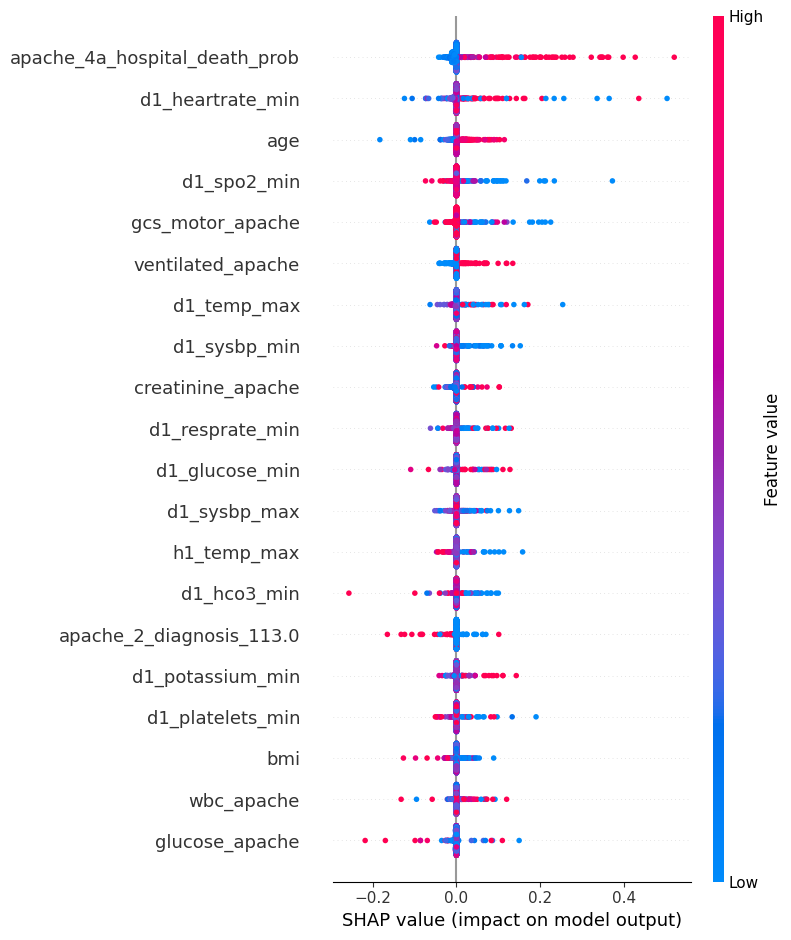

In [65]:
# Beeswarm (features sorted by importance)
shap.summary_plot(shap_values3, X_test_small)

/var/folders/wp/t4hgc9nx4s90xpch3k5c7kqr0000gn/T/ipykernel_63038/3610037109.py:2: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values3, plot_type='bar', feature_names = X_train.columns)


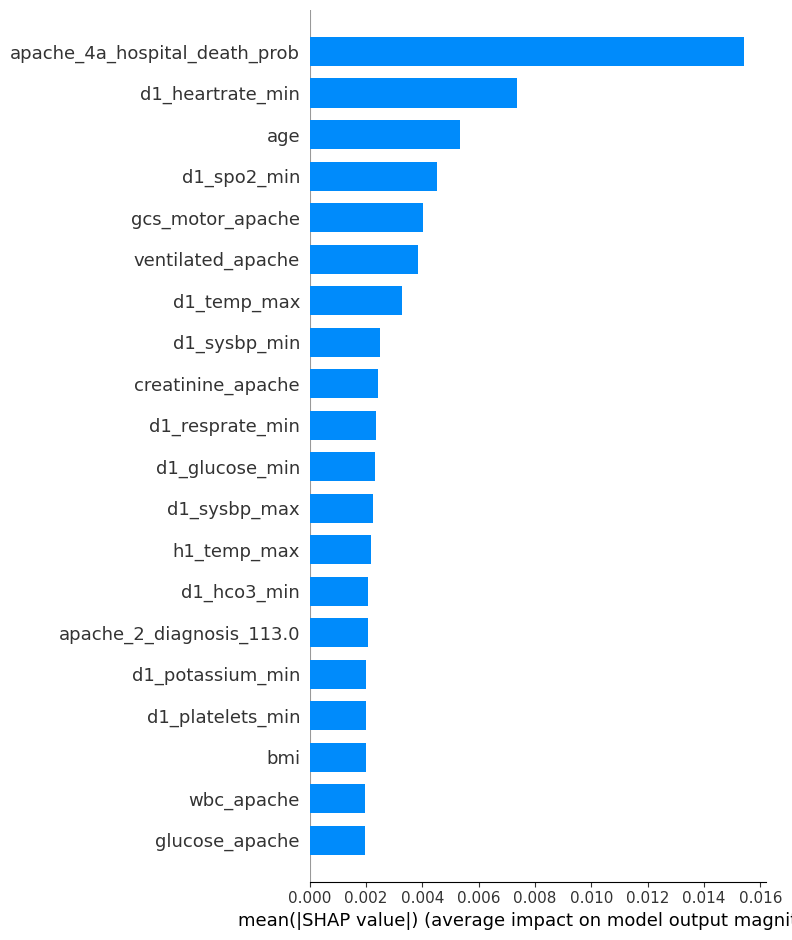

In [66]:
# Bar (mean absolute value per feature)
shap.summary_plot(shap_values3, plot_type='bar', feature_names = X_train.columns)

In [67]:
explainer3.expected_value

0.03957796051790876

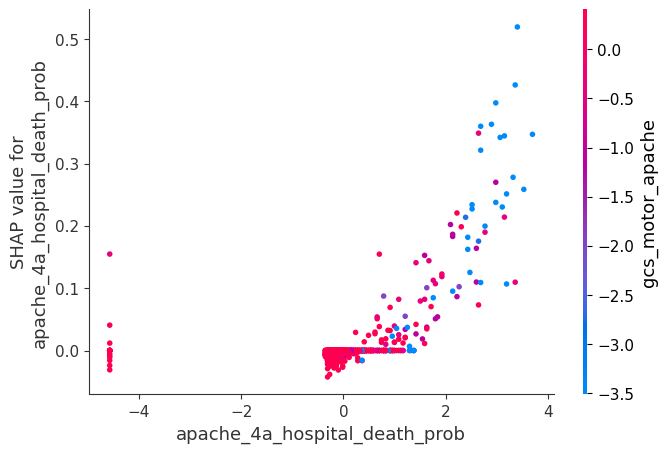

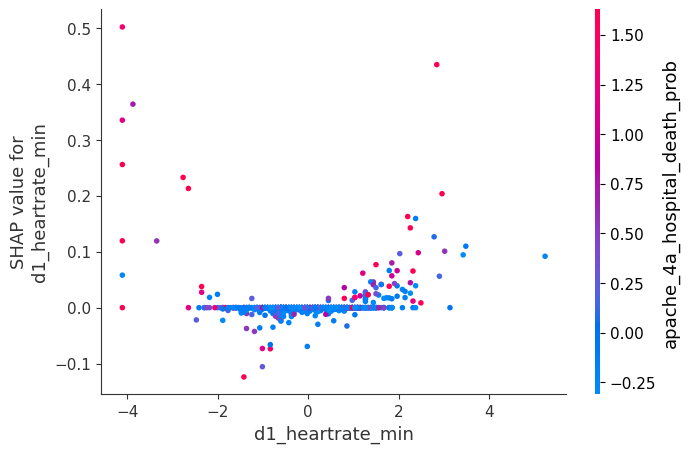

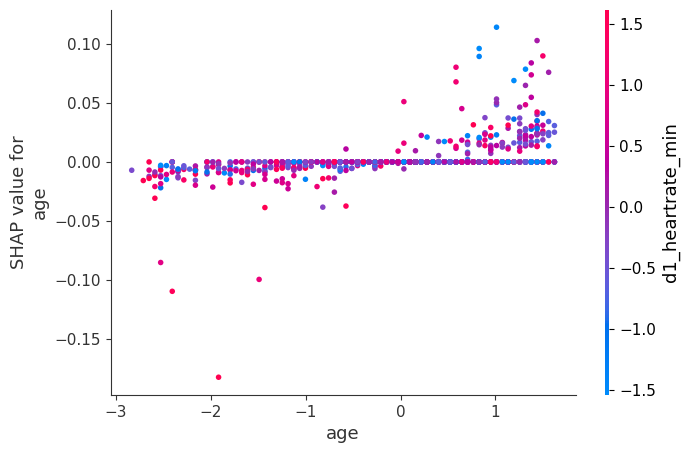

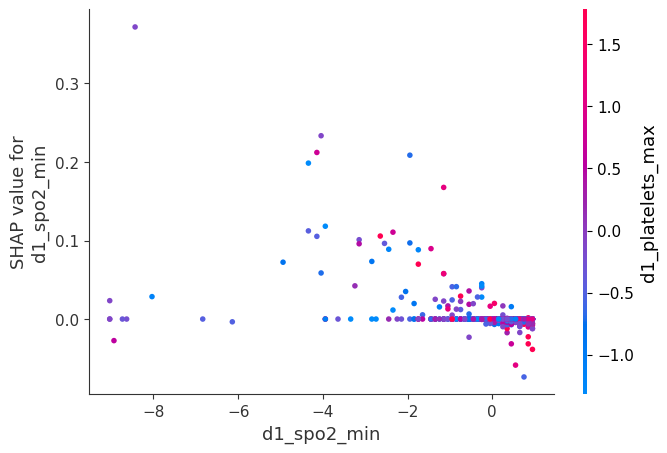

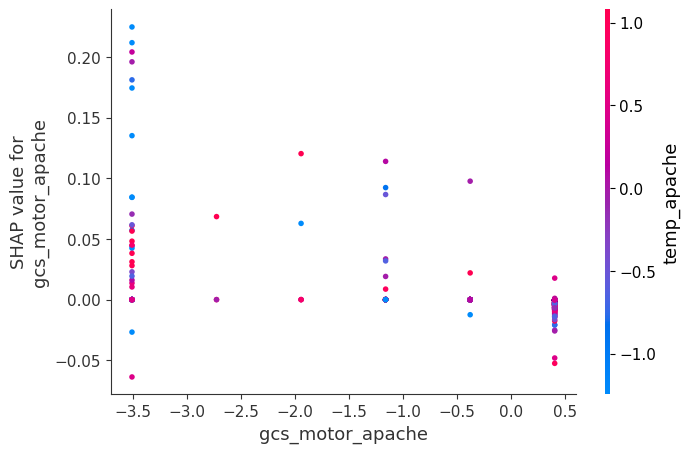

In [68]:
# Dependence plots 
# One per feature. Shows how that feature’s value vs. its SHAP effect, colored by a second feature.
# # Sort features by importance
mean_abs_shap3 = np.abs(shap_values3).mean(axis=0)
top_idx3 = np.argsort(mean_abs_shap3)[::-1]  
top_features3 = X_train.columns[top_idx3[:5]] 
for feat in top_features3:
    shap.dependence_plot(feat, shap_values3, X_test_small)

  0%|                                                                  | 0/100 [00:00<?, ?it/s]

3522/3522 [==============================] - 2s 440us/step


  1%|▌                                                         | 1/100 [00:01<03:13,  1.96s/it]

3522/3522 [==============================] - 2s 469us/step


  2%|█▏                                                        | 2/100 [00:03<03:14,  1.99s/it]

3522/3522 [==============================] - 2s 488us/step


  3%|█▋                                                        | 3/100 [00:06<03:15,  2.02s/it]

3525/3525 [==============================] - 2s 470us/step


  4%|██▎                                                       | 4/100 [00:08<03:16,  2.04s/it]

3522/3522 [==============================] - 2s 466us/step


  5%|██▉                                                       | 5/100 [00:10<03:13,  2.04s/it]

3522/3522 [==============================] - 2s 487us/step


  6%|███▍                                                      | 6/100 [00:12<03:12,  2.05s/it]

3522/3522 [==============================] - 2s 482us/step


  7%|████                                                      | 7/100 [00:14<03:09,  2.04s/it]

3522/3522 [==============================] - 2s 462us/step


  8%|████▋                                                     | 8/100 [00:16<03:07,  2.03s/it]

3525/3525 [==============================] - 2s 465us/step


  9%|█████▏                                                    | 9/100 [00:18<03:03,  2.01s/it]

3522/3522 [==============================] - 2s 498us/step


 10%|█████▋                                                   | 10/100 [00:20<03:04,  2.05s/it]

3522/3522 [==============================] - 2s 508us/step


 11%|██████▎                                                  | 11/100 [00:22<03:07,  2.10s/it]

3522/3522 [==============================] - 2s 520us/step


 12%|██████▊                                                  | 12/100 [00:24<03:07,  2.13s/it]

3522/3522 [==============================] - 2s 498us/step


 13%|███████▍                                                 | 13/100 [00:26<03:04,  2.12s/it]

3522/3522 [==============================] - 2s 499us/step


 14%|███████▉                                                 | 14/100 [00:29<03:03,  2.13s/it]

3525/3525 [==============================] - 2s 519us/step


 15%|████████▌                                                | 15/100 [00:31<03:03,  2.16s/it]

3525/3525 [==============================] - 2s 498us/step


 16%|█████████                                                | 16/100 [00:33<03:01,  2.16s/it]

3522/3522 [==============================] - 2s 475us/step


 17%|█████████▋                                               | 17/100 [00:35<02:56,  2.12s/it]

3525/3525 [==============================] - 2s 485us/step


 18%|██████████▎                                              | 18/100 [00:37<02:52,  2.10s/it]

3522/3522 [==============================] - 2s 479us/step


 19%|██████████▊                                              | 19/100 [00:39<02:49,  2.09s/it]

3525/3525 [==============================] - 2s 520us/step


 20%|███████████▍                                             | 20/100 [00:41<02:49,  2.12s/it]

3522/3522 [==============================] - 2s 466us/step


 21%|███████████▉                                             | 21/100 [00:43<02:45,  2.10s/it]

3522/3522 [==============================] - 2s 532us/step


 22%|████████████▌                                            | 22/100 [00:46<02:47,  2.15s/it]

3522/3522 [==============================] - 2s 503us/step


 23%|█████████████                                            | 23/100 [00:48<02:47,  2.17s/it]

3522/3522 [==============================] - 2s 504us/step


 24%|█████████████▋                                           | 24/100 [00:50<02:43,  2.16s/it]

3522/3522 [==============================] - 2s 509us/step


 25%|██████████████▎                                          | 25/100 [00:52<02:41,  2.16s/it]

3525/3525 [==============================] - 2s 494us/step


 26%|██████████████▊                                          | 26/100 [00:54<02:38,  2.14s/it]

3522/3522 [==============================] - 2s 470us/step


 27%|███████████████▍                                         | 27/100 [00:56<02:33,  2.10s/it]

3525/3525 [==============================] - 2s 490us/step


 28%|███████████████▉                                         | 28/100 [00:58<02:30,  2.09s/it]

3522/3522 [==============================] - 2s 474us/step


 29%|████████████████▌                                        | 29/100 [01:00<02:26,  2.07s/it]

3522/3522 [==============================] - 2s 500us/step


 30%|█████████████████                                        | 30/100 [01:02<02:25,  2.08s/it]

3525/3525 [==============================] - 2s 512us/step


 31%|█████████████████▋                                       | 31/100 [01:05<02:24,  2.10s/it]

3522/3522 [==============================] - 2s 487us/step


 32%|██████████████████▏                                      | 32/100 [01:07<02:23,  2.11s/it]

3522/3522 [==============================] - 2s 497us/step


 33%|██████████████████▊                                      | 33/100 [01:09<02:21,  2.11s/it]

3522/3522 [==============================] - 2s 521us/step


 34%|███████████████████▍                                     | 34/100 [01:11<02:20,  2.13s/it]

3522/3522 [==============================] - 2s 529us/step


 35%|███████████████████▉                                     | 35/100 [01:13<02:20,  2.16s/it]

3522/3522 [==============================] - 2s 522us/step


 36%|████████████████████▌                                    | 36/100 [01:15<02:18,  2.16s/it]

3522/3522 [==============================] - 2s 512us/step


 37%|█████████████████████                                    | 37/100 [01:17<02:15,  2.16s/it]

3522/3522 [==============================] - 2s 523us/step


 38%|█████████████████████▋                                   | 38/100 [01:20<02:14,  2.16s/it]

3522/3522 [==============================] - 2s 483us/step


 39%|██████████████████████▏                                  | 39/100 [01:22<02:11,  2.15s/it]

3522/3522 [==============================] - 2s 490us/step


 40%|██████████████████████▊                                  | 40/100 [01:24<02:08,  2.14s/it]

3522/3522 [==============================] - 2s 497us/step


 41%|███████████████████████▎                                 | 41/100 [01:26<02:05,  2.13s/it]

3522/3522 [==============================] - 2s 487us/step


 42%|███████████████████████▉                                 | 42/100 [01:28<02:02,  2.12s/it]

3525/3525 [==============================] - 2s 490us/step


 43%|████████████████████████▌                                | 43/100 [01:30<01:59,  2.10s/it]

3522/3522 [==============================] - 2s 495us/step


 44%|█████████████████████████                                | 44/100 [01:32<01:57,  2.10s/it]

3522/3522 [==============================] - 2s 506us/step


 45%|█████████████████████████▋                               | 45/100 [01:34<01:56,  2.12s/it]

3522/3522 [==============================] - 2s 490us/step


 46%|██████████████████████████▏                              | 46/100 [01:37<02:01,  2.25s/it]

3525/3525 [==============================] - 2s 484us/step


 47%|██████████████████████████▊                              | 47/100 [01:39<01:55,  2.18s/it]

3522/3522 [==============================] - 2s 494us/step


 48%|███████████████████████████▎                             | 48/100 [01:41<01:51,  2.14s/it]

3525/3525 [==============================] - 2s 499us/step


 49%|███████████████████████████▉                             | 49/100 [01:43<01:48,  2.13s/it]

3525/3525 [==============================] - 2s 509us/step


 50%|████████████████████████████▌                            | 50/100 [01:45<01:46,  2.13s/it]

3522/3522 [==============================] - 2s 511us/step


 51%|█████████████████████████████                            | 51/100 [01:47<01:44,  2.12s/it]

3525/3525 [==============================] - 2s 500us/step


 52%|█████████████████████████████▋                           | 52/100 [01:49<01:41,  2.12s/it]

3522/3522 [==============================] - 2s 468us/step


 53%|██████████████████████████████▏                          | 53/100 [01:51<01:37,  2.08s/it]

3522/3522 [==============================] - 2s 512us/step


 54%|██████████████████████████████▊                          | 54/100 [01:54<01:36,  2.09s/it]

3522/3522 [==============================] - 2s 473us/step


 55%|███████████████████████████████▎                         | 55/100 [01:56<01:33,  2.07s/it]

3529/3529 [==============================] - 2s 521us/step


 56%|███████████████████████████████▉                         | 56/100 [01:58<01:34,  2.14s/it]

3525/3525 [==============================] - 2s 470us/step


 57%|████████████████████████████████▍                        | 57/100 [02:00<01:31,  2.12s/it]

3522/3522 [==============================] - 2s 493us/step


 58%|█████████████████████████████████                        | 58/100 [02:02<01:28,  2.10s/it]

3525/3525 [==============================] - 2s 474us/step


 59%|█████████████████████████████████▋                       | 59/100 [02:04<01:25,  2.08s/it]

3522/3522 [==============================] - 2s 485us/step


 60%|██████████████████████████████████▏                      | 60/100 [02:06<01:23,  2.08s/it]

3522/3522 [==============================] - 2s 482us/step


 61%|██████████████████████████████████▊                      | 61/100 [02:08<01:20,  2.07s/it]

3525/3525 [==============================] - 2s 474us/step


 62%|███████████████████████████████████▎                     | 62/100 [02:10<01:18,  2.06s/it]

3522/3522 [==============================] - 2s 474us/step


 63%|███████████████████████████████████▉                     | 63/100 [02:12<01:16,  2.06s/it]

3525/3525 [==============================] - 2s 475us/step


 64%|████████████████████████████████████▍                    | 64/100 [02:14<01:14,  2.06s/it]

3522/3522 [==============================] - 2s 455us/step


 65%|█████████████████████████████████████                    | 65/100 [02:16<01:11,  2.03s/it]

3522/3522 [==============================] - 2s 473us/step


 66%|█████████████████████████████████████▌                   | 66/100 [02:18<01:09,  2.04s/it]

3522/3522 [==============================] - 2s 494us/step


 67%|██████████████████████████████████████▏                  | 67/100 [02:20<01:07,  2.05s/it]

3525/3525 [==============================] - 2s 468us/step


 68%|██████████████████████████████████████▊                  | 68/100 [02:22<01:05,  2.05s/it]

3525/3525 [==============================] - 2s 501us/step


 69%|███████████████████████████████████████▎                 | 69/100 [02:25<01:04,  2.07s/it]

3522/3522 [==============================] - 2s 470us/step


 70%|███████████████████████████████████████▉                 | 70/100 [02:27<01:01,  2.05s/it]

3522/3522 [==============================] - 2s 488us/step


 71%|████████████████████████████████████████▍                | 71/100 [02:29<00:59,  2.06s/it]

3522/3522 [==============================] - 2s 491us/step


 72%|█████████████████████████████████████████                | 72/100 [02:31<00:58,  2.07s/it]

3522/3522 [==============================] - 2s 483us/step


 73%|█████████████████████████████████████████▌               | 73/100 [02:33<00:55,  2.06s/it]

3522/3522 [==============================] - 2s 515us/step


 74%|██████████████████████████████████████████▏              | 74/100 [02:35<00:54,  2.10s/it]

3522/3522 [==============================] - 2s 488us/step


 75%|██████████████████████████████████████████▊              | 75/100 [02:37<00:53,  2.13s/it]

3522/3522 [==============================] - 2s 511us/step


 76%|███████████████████████████████████████████▎             | 76/100 [02:39<00:51,  2.14s/it]

3525/3525 [==============================] - 2s 481us/step


 77%|███████████████████████████████████████████▉             | 77/100 [02:42<00:49,  2.14s/it]

3522/3522 [==============================] - 2s 509us/step


 78%|████████████████████████████████████████████▍            | 78/100 [02:44<00:47,  2.15s/it]

3522/3522 [==============================] - 2s 495us/step


 79%|█████████████████████████████████████████████            | 79/100 [02:46<00:44,  2.13s/it]

3522/3522 [==============================] - 2s 512us/step


 80%|█████████████████████████████████████████████▌           | 80/100 [02:48<00:42,  2.14s/it]

3522/3522 [==============================] - 2s 517us/step


 81%|██████████████████████████████████████████████▏          | 81/100 [02:50<00:40,  2.15s/it]

3522/3522 [==============================] - 2s 477us/step


 82%|██████████████████████████████████████████████▋          | 82/100 [02:52<00:38,  2.13s/it]

3522/3522 [==============================] - 2s 495us/step


 83%|███████████████████████████████████████████████▎         | 83/100 [02:54<00:36,  2.13s/it]

3525/3525 [==============================] - 2s 552us/step


 84%|███████████████████████████████████████████████▉         | 84/100 [02:57<00:34,  2.18s/it]

3522/3522 [==============================] - 2s 484us/step


 85%|████████████████████████████████████████████████▍        | 85/100 [02:59<00:32,  2.16s/it]

3522/3522 [==============================] - 2s 523us/step


 86%|█████████████████████████████████████████████████        | 86/100 [03:01<00:30,  2.19s/it]

3522/3522 [==============================] - 2s 527us/step


 87%|█████████████████████████████████████████████████▌       | 87/100 [03:03<00:28,  2.22s/it]

3522/3522 [==============================] - 2s 528us/step


 88%|██████████████████████████████████████████████████▏      | 88/100 [03:06<00:26,  2.23s/it]

3522/3522 [==============================] - 2s 491us/step


 89%|██████████████████████████████████████████████████▋      | 89/100 [03:08<00:24,  2.20s/it]

3522/3522 [==============================] - 2s 486us/step


 90%|███████████████████████████████████████████████████▎     | 90/100 [03:10<00:21,  2.16s/it]

3522/3522 [==============================] - 2s 501us/step


 91%|███████████████████████████████████████████████████▊     | 91/100 [03:12<00:19,  2.16s/it]

3525/3525 [==============================] - 2s 516us/step


 92%|████████████████████████████████████████████████████▍    | 92/100 [03:14<00:17,  2.19s/it]

3522/3522 [==============================] - 2s 534us/step


 93%|█████████████████████████████████████████████████████    | 93/100 [03:16<00:15,  2.22s/it]

3522/3522 [==============================] - 2s 502us/step


 94%|█████████████████████████████████████████████████████▌   | 94/100 [03:19<00:13,  2.22s/it]

3522/3522 [==============================] - 2s 549us/step


 95%|██████████████████████████████████████████████████████▏  | 95/100 [03:21<00:11,  2.27s/it]

3522/3522 [==============================] - 2s 502us/step


 96%|██████████████████████████████████████████████████████▋  | 96/100 [03:23<00:08,  2.25s/it]

3522/3522 [==============================] - 2s 511us/step


 97%|███████████████████████████████████████████████████████▎ | 97/100 [03:25<00:06,  2.23s/it]

3525/3525 [==============================] - 2s 503us/step


 98%|███████████████████████████████████████████████████████▊ | 98/100 [03:28<00:04,  2.20s/it]

3522/3522 [==============================] - 2s 501us/step


 99%|████████████████████████████████████████████████████████▍| 99/100 [03:30<00:02,  2.18s/it]

3525/3525 [==============================] - 2s 491us/step


100%|████████████████████████████████████████████████████████| 100/100 [03:32<00:00,  2.12s/it]


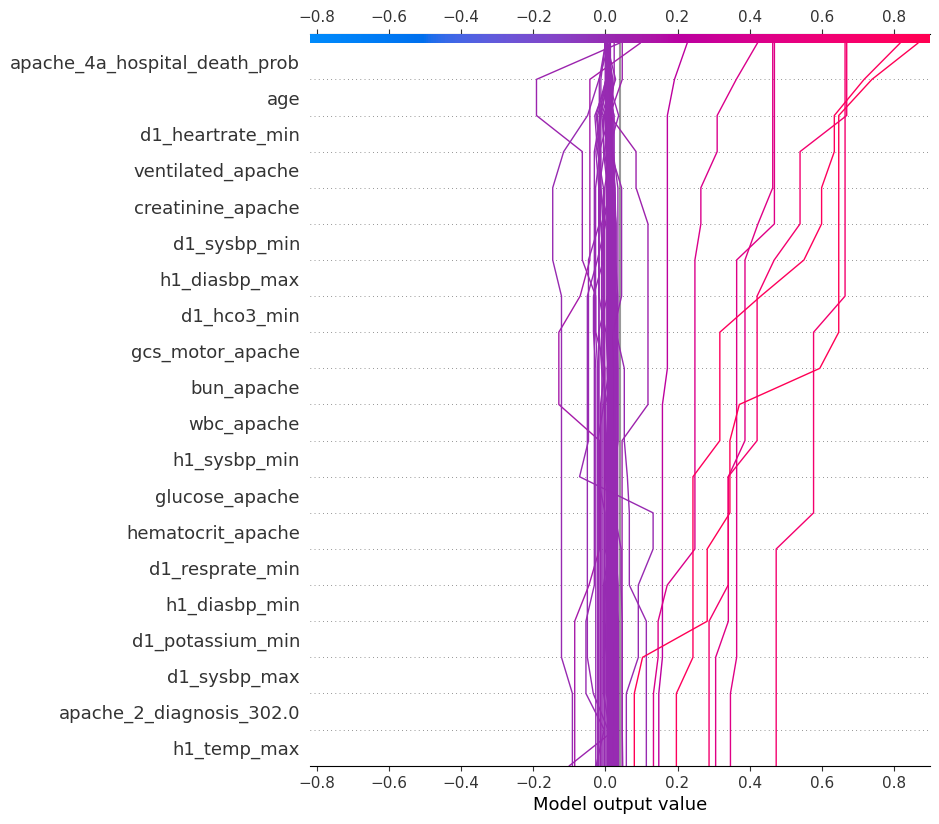

In [69]:
# Decision plot 
# Tracks cumulative impact of features for each sample
# pick 50 random test rows

# use the same X_small as above
X_small_arr = X_small.astype(np.float64).to_numpy()
shap_exp3 = explainer3(X_small_arr)
shap.decision_plot(
    explainer3.expected_value,
    shap_exp3.values,
    X_small,
    ignore_warnings=True     
)

## Logistic Regression - DP

In [78]:
def train_and_return_dp_models(target_epsilon, X_train, y_train, X_test, y_test, RANDOM_SEED=42):
    # Convert inputs properly
    X_train_np = X_train.to_numpy().astype("float32")
    X_test_np = X_test.to_numpy().astype("float32")
    y_train_np = y_train.to_numpy().astype("int32")
    y_test_np = y_test.to_numpy().astype("int32")
    y_train_cat = tf.keras.utils.to_categorical(y_train_np, num_classes=2).astype("float32")

    # Clip norms for DP stability
    row_norms_train = np.linalg.norm(X_train_np, axis=1)
    X_train_clipped_np = X_train_np / np.maximum(1.0, row_norms_train).reshape(-1, 1)

    row_norms_test = np.linalg.norm(X_test_np, axis=1)
    X_test_clipped_np = X_test_np / np.maximum(1.0, row_norms_test).reshape(-1, 1)

    # — Turn clipped arrays back into DataFrames to preserve feature names —
    X_train_clipped = pd.DataFrame(X_train_clipped_np, columns=X_train.columns)
    X_test_clipped = pd.DataFrame(X_test_clipped_np, columns=X_train.columns)

    # DP Logistic Regression
    base_clf = LogisticRegression(
        penalty='l2',
        solver='lbfgs',
        C=1.0,
        max_iter=3000,
        random_state=RANDOM_SEED)
    
    base_clf.fit(X_train_clipped, y_train_np)

    # Output Perturbation (noise on weights)
    sensitivity = 2.0 / (X_train_clipped.shape[0] * 1.0)
    delta = 1e-5
    sigma = sensitivity * np.sqrt(2 * np.log(1.25 / delta)) / target_epsilon

    base_clf.coef_ += np.random.normal(0, sigma, size=base_clf.coef_.shape)
    base_clf.intercept_ += np.random.normal(0, sigma, size=base_clf.intercept_.shape)

    # DP MLP
    noise_multiplier = get_noise_multiplier(target_epsilon)
    batch_size = 256
    epochs = 25

    model_dp = Sequential([
        Dense(512, activation='relu', input_shape=(X_train_np.shape[1],)),
        BatchNormalization(),
        Dropout(0.25),
        Dense(256, activation='relu'),
        BatchNormalization(),
        Dropout(0.25),
        Dense(128, activation='relu'),
        BatchNormalization(),
        Dropout(0.25),
        Dense(64, activation='relu'),
        BatchNormalization(),
        Dropout(0.25),
        Dense(2, activation="softmax")
    ])

    optimizer = DPKerasAdamOptimizer(
        l2_norm_clip=np.percentile(np.linalg.norm(X_train_np, axis=1), 80),
        noise_multiplier=noise_multiplier,
        num_microbatches=1,
        learning_rate=1e-3)

    model_dp.compile(optimizer=optimizer, 
                     loss="categorical_crossentropy", 
                     metrics=["accuracy", tf.keras.metrics.AUC(name="auc")])

    model_dp.fit(X_train_np, y_train_cat, 
                 validation_split=0.15, 
                 epochs=epochs, 
                 batch_size=batch_size,
                 shuffle=False,           # Important: make deterministic
                 verbose=2)

    # Return trained models + processed test sets for consistent prediction
    return base_clf, model_dp, X_test_clipped, X_test_np

dp_logistic_model, dp_mlp_model, X_test_clipped, X_test_np = train_and_return_dp_models(
    target_epsilon=2.0, 
    X_train=X_bal, 
    y_train=y_bal, 
    X_test=X_test, 
    y_test=y_test
)


Epoch 1/25
43/43 - 2s - loss: 1.0176 - accuracy: 0.5242 - auc: 0.5328 - val_loss: 0.6932 - val_accuracy: 0.5537 - val_auc: 0.5591 - 2s/epoch - 41ms/step
Epoch 2/25
43/43 - 0s - loss: 0.9932 - accuracy: 0.5330 - auc: 0.5451 - val_loss: 0.7300 - val_accuracy: 0.5347 - val_auc: 0.5535 - 400ms/epoch - 9ms/step
Epoch 3/25
43/43 - 0s - loss: 0.9770 - accuracy: 0.5434 - auc: 0.5571 - val_loss: 0.7618 - val_accuracy: 0.5368 - val_auc: 0.5562 - 391ms/epoch - 9ms/step
Epoch 4/25
43/43 - 0s - loss: 0.9553 - accuracy: 0.5504 - auc: 0.5665 - val_loss: 0.7862 - val_accuracy: 0.5416 - val_auc: 0.5658 - 386ms/epoch - 9ms/step
Epoch 5/25
43/43 - 0s - loss: 0.9277 - accuracy: 0.5597 - auc: 0.5816 - val_loss: 0.8050 - val_accuracy: 0.5521 - val_auc: 0.5798 - 399ms/epoch - 9ms/step
Epoch 6/25
43/43 - 0s - loss: 0.9276 - accuracy: 0.5570 - auc: 0.5806 - val_loss: 0.8076 - val_accuracy: 0.5611 - val_auc: 0.5979 - 409ms/epoch - 10ms/step
Epoch 7/25
43/43 - 0s - loss: 0.9133 - accuracy: 0.5654 - auc: 0.5945 -

In [79]:
def dp_model_predict(X):
    if not isinstance(X, pd.DataFrame):
        X = pd.DataFrame(X, columns=X_train.columns)
    return dp_logistic_model.predict_proba(X)[:, 1]   # ← use your DP model here

background = shap.sample(X_train, 50, random_state=2080)
explainer4 = shap.KernelExplainer(dp_model_predict, background)

X_test_small = shap.sample(X_test, 1000, random_state=2080)
shap_values4 = explainer4.shap_values(X_test_small, nsamples=200)

100%|██████████████████████████████████████████████████████| 1000/1000 [00:49<00:00, 20.17it/s]


/var/folders/wp/t4hgc9nx4s90xpch3k5c7kqr0000gn/T/ipykernel_63038/3204191433.py:2: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values4, X_test_small)


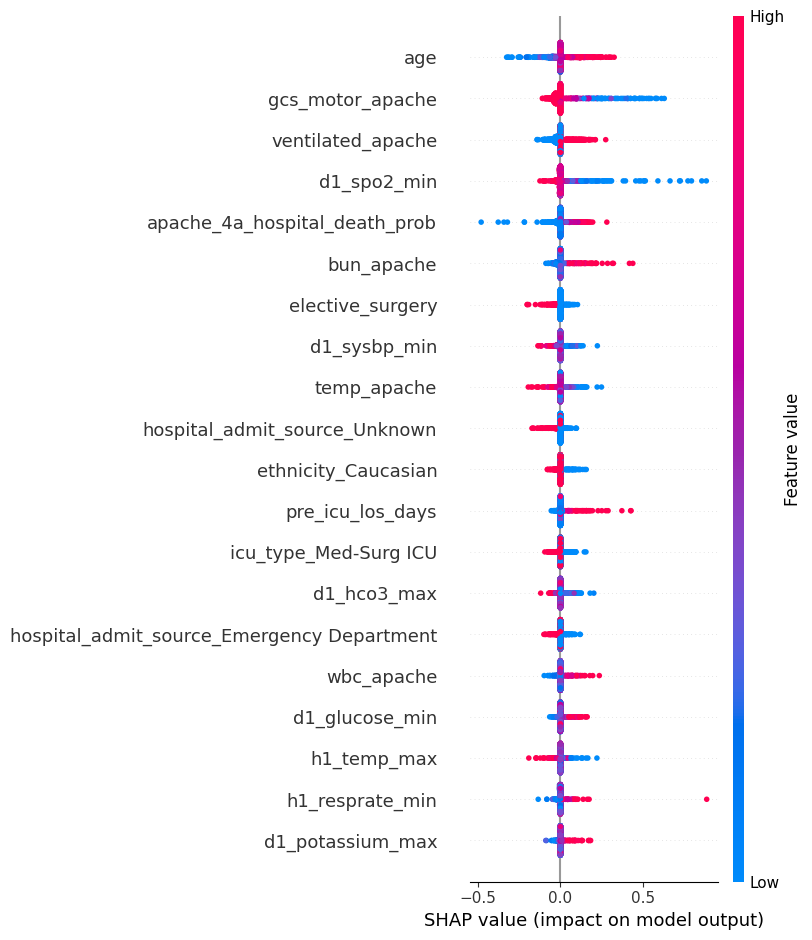

In [80]:
# Plot Beeswarm (sorted by feature importance)
shap.summary_plot(shap_values4, X_test_small)

/var/folders/wp/t4hgc9nx4s90xpch3k5c7kqr0000gn/T/ipykernel_63038/3761649143.py:2: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values4, plot_type='bar', feature_names=X_train.columns)


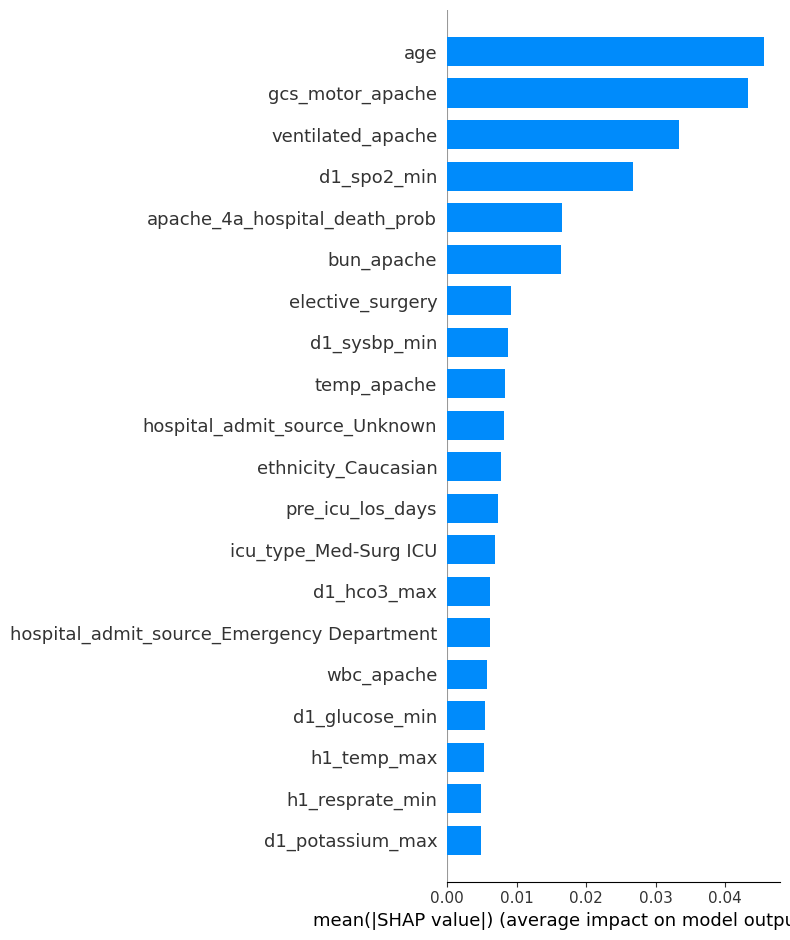

In [81]:
# Plot Bar (mean absolute value per feature)
shap.summary_plot(shap_values4, plot_type='bar', feature_names=X_train.columns)

In [82]:
explainer4.expected_value

0.20673317556050505

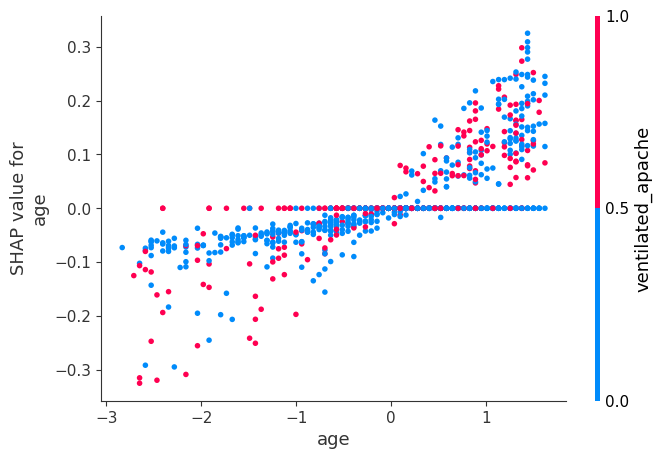

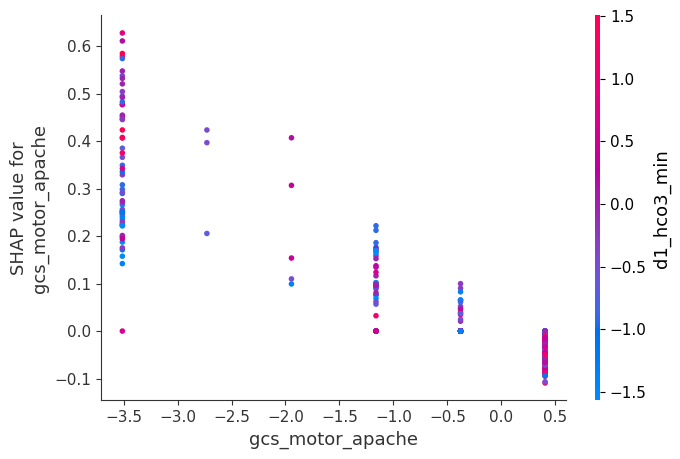

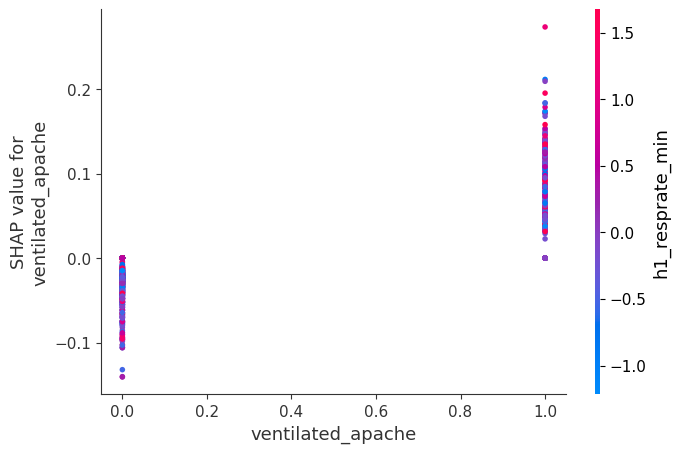

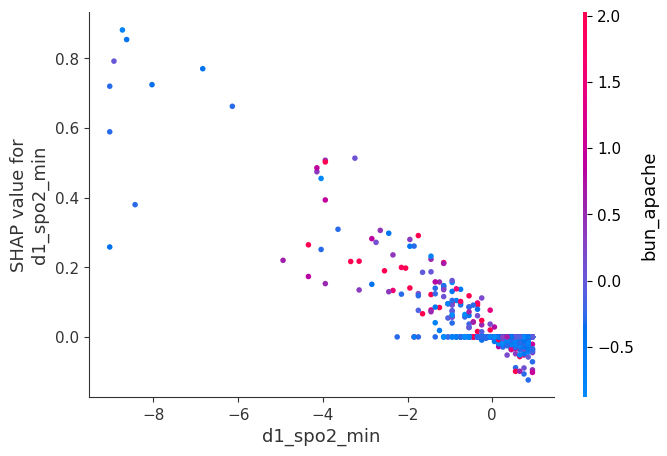

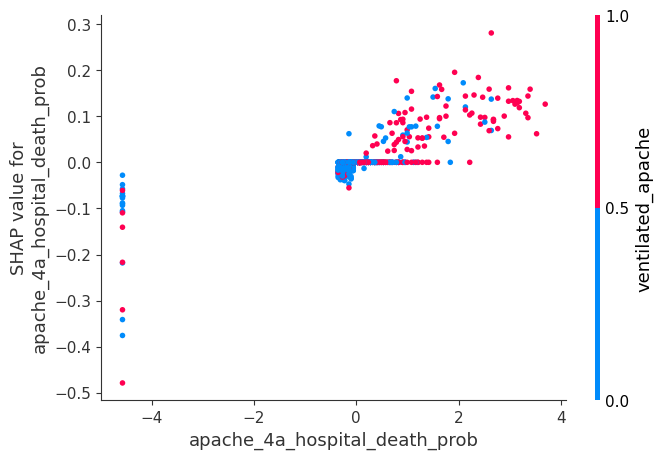

In [83]:
# Dependence plots 
# One per feature. Shows how that feature’s value vs. its SHAP effect, colored by a second feature.
# # Sort features by importance
mean_abs_shap4 = np.abs(shap_values4).mean(axis=0)
top_idx4 = np.argsort(mean_abs_shap4)[::-1]  
top_features4 = X_train.columns[top_idx4[:5]] 
for feat in top_features4:
    shap.dependence_plot(feat, shap_values4, X_test_small)

100%|████████████████████████████████████████████████████████| 100/100 [00:41<00:00,  2.43it/s]


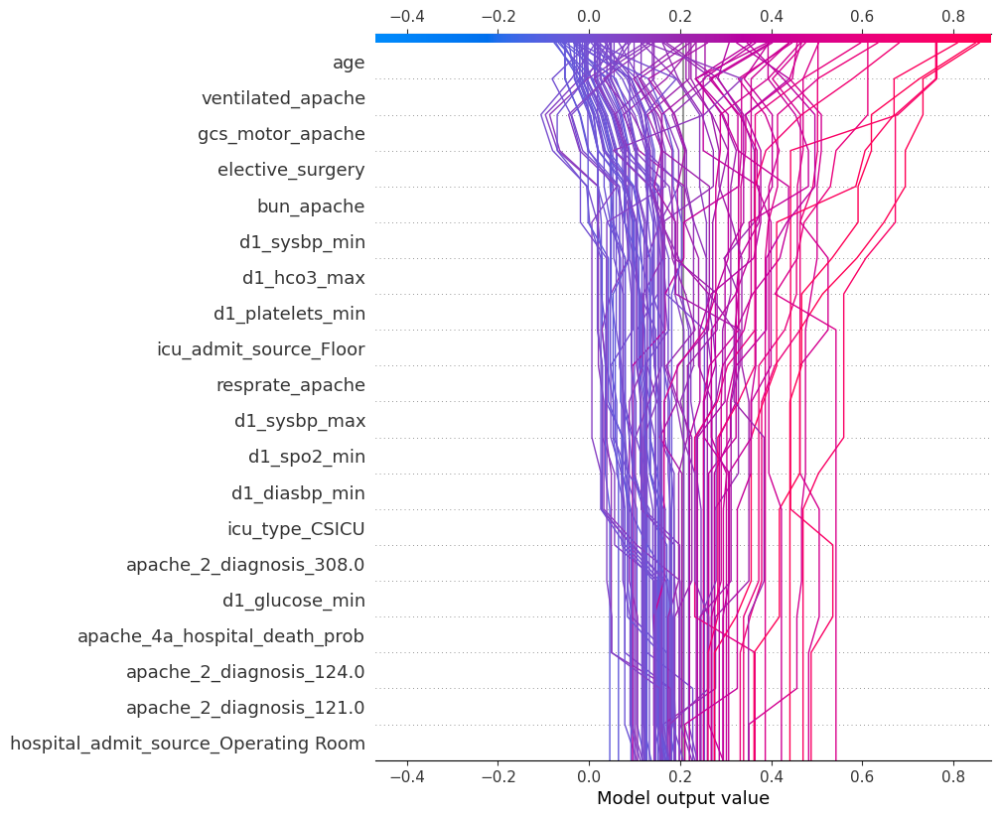

In [84]:
# Decision plot 
# Tracks cumulative impact of features for each sample
# pick 50 random test rows
X_small = shap.sample(X_test_small, 100, random_state=2080)

shap_exp4 = explainer(X_small)
shap.decision_plot(
    explainer4.expected_value,
    shap_exp4.values,
    X_small,
    ignore_warnings=True     
)

## MLP - DP

In [86]:
bg_array = background.to_numpy(dtype=float)
test_array = X_test_small.to_numpy(dtype=float)

def predict_fn_dp_mlp(X):
    if not hasattr(X, "columns"):
        X = pd.DataFrame(X, columns=X_train.columns)
    probs = dp_mlp_model.predict(X, batch_size=256)
   
    if probs.ndim == 2 and probs.shape[1] == 2:
        # softmax: second column is P(class=1)
        return probs[:, 1]
    elif probs.ndim == 2 and probs.shape[1] == 1:
        # sigmoid: single-column output is P(class=1)
        return probs[:, 0]
    else:
        raise ValueError("Unexpected output shape from MLP model.")

# 3. Create explainer
explainer5 = shap.KernelExplainer(predict_fn_dp_mlp, bg_array)

# 4. Compute SHAP values
shap_values5 = explainer5.shap_values(test_array, nsamples=200)

1/1 [==============================] - 0s 10ms/step


  0%|                                                                 | 0/1000 [00:00<?, ?it/s]

40/40 [==============================] - 0s 2ms/step


  0%|                                                         | 1/1000 [00:00<02:01,  8.25it/s]

40/40 [==============================] - 0s 4ms/step


  0%|                                                         | 2/1000 [00:00<03:39,  4.55it/s]

40/40 [==============================] - 0s 5ms/step


  0%|▏                                                        | 3/1000 [00:00<04:09,  3.99it/s]

40/40 [==============================] - 0s 5ms/step


  0%|▏                                                        | 4/1000 [00:00<04:22,  3.80it/s]

40/40 [==============================] - 0s 5ms/step


  0%|▎                                                        | 5/1000 [00:01<04:30,  3.67it/s]

40/40 [==============================] - 0s 5ms/step


  1%|▎                                                        | 6/1000 [00:01<04:35,  3.61it/s]

40/40 [==============================] - 0s 5ms/step


  1%|▍                                                        | 7/1000 [00:01<04:39,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


  1%|▍                                                        | 8/1000 [00:02<04:39,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


  1%|▌                                                        | 9/1000 [00:02<04:39,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


  1%|▌                                                       | 10/1000 [00:02<04:35,  3.59it/s]

40/40 [==============================] - 0s 5ms/step


  1%|▌                                                       | 11/1000 [00:02<04:35,  3.60it/s]

40/40 [==============================] - 0s 5ms/step


  1%|▋                                                       | 12/1000 [00:03<04:34,  3.59it/s]

40/40 [==============================] - 0s 5ms/step


  1%|▋                                                       | 13/1000 [00:03<04:39,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


  1%|▊                                                       | 14/1000 [00:03<04:39,  3.53it/s]

40/40 [==============================] - 0s 4ms/step


  2%|▊                                                       | 15/1000 [00:04<04:42,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


  2%|▉                                                       | 16/1000 [00:04<04:37,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


  2%|▉                                                       | 17/1000 [00:04<04:37,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


  2%|█                                                       | 18/1000 [00:04<04:33,  3.59it/s]

40/40 [==============================] - 0s 5ms/step


  2%|█                                                       | 19/1000 [00:05<04:45,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


  2%|█                                                       | 20/1000 [00:05<04:39,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


  2%|█▏                                                      | 21/1000 [00:05<04:40,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


  2%|█▏                                                      | 22/1000 [00:06<04:32,  3.59it/s]

40/40 [==============================] - 0s 5ms/step


  2%|█▎                                                      | 23/1000 [00:06<04:31,  3.59it/s]

40/40 [==============================] - 0s 5ms/step


  2%|█▎                                                      | 24/1000 [00:06<04:44,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


  2%|█▍                                                      | 25/1000 [00:06<04:41,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


  3%|█▍                                                      | 26/1000 [00:07<04:41,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


  3%|█▌                                                      | 27/1000 [00:07<04:40,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


  3%|█▌                                                      | 28/1000 [00:07<04:41,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


  3%|█▌                                                      | 29/1000 [00:08<04:38,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


  3%|█▋                                                      | 30/1000 [00:08<04:36,  3.51it/s]

40/40 [==============================] - 0s 4ms/step


  3%|█▋                                                      | 31/1000 [00:08<04:24,  3.66it/s]

40/40 [==============================] - 0s 5ms/step


  3%|█▊                                                      | 32/1000 [00:08<04:23,  3.67it/s]

40/40 [==============================] - 0s 5ms/step


  3%|█▊                                                      | 33/1000 [00:09<04:26,  3.62it/s]

40/40 [==============================] - 0s 5ms/step


  3%|█▉                                                      | 34/1000 [00:09<04:30,  3.57it/s]

40/40 [==============================] - 0s 5ms/step


  4%|█▉                                                      | 35/1000 [00:09<04:27,  3.60it/s]

40/40 [==============================] - 0s 5ms/step


  4%|██                                                      | 36/1000 [00:10<04:27,  3.60it/s]

40/40 [==============================] - 0s 5ms/step


  4%|██                                                      | 37/1000 [00:10<04:30,  3.57it/s]

40/40 [==============================] - 0s 5ms/step


  4%|██▏                                                     | 38/1000 [00:10<04:30,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


  4%|██▏                                                     | 39/1000 [00:10<04:28,  3.58it/s]

40/40 [==============================] - 0s 5ms/step


  4%|██▏                                                     | 40/1000 [00:11<04:30,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


  4%|██▎                                                     | 41/1000 [00:11<04:28,  3.57it/s]

40/40 [==============================] - 0s 5ms/step


  4%|██▎                                                     | 42/1000 [00:11<04:25,  3.60it/s]

40/40 [==============================] - 0s 5ms/step


  4%|██▍                                                     | 43/1000 [00:12<04:35,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


  4%|██▍                                                     | 44/1000 [00:12<04:25,  3.61it/s]

40/40 [==============================] - 0s 5ms/step


  4%|██▌                                                     | 45/1000 [00:12<04:25,  3.60it/s]

40/40 [==============================] - 0s 5ms/step


  5%|██▌                                                     | 46/1000 [00:12<04:29,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


  5%|██▋                                                     | 47/1000 [00:13<04:27,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


  5%|██▋                                                     | 48/1000 [00:13<04:26,  3.58it/s]

40/40 [==============================] - 0s 5ms/step


  5%|██▋                                                     | 49/1000 [00:13<04:21,  3.64it/s]

40/40 [==============================] - 0s 5ms/step


  5%|██▊                                                     | 50/1000 [00:13<04:21,  3.63it/s]

40/40 [==============================] - 0s 5ms/step


  5%|██▊                                                     | 51/1000 [00:14<04:19,  3.66it/s]

40/40 [==============================] - 0s 5ms/step


  5%|██▉                                                     | 52/1000 [00:14<04:22,  3.62it/s]

40/40 [==============================] - 0s 5ms/step


  5%|██▉                                                     | 53/1000 [00:14<04:31,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


  5%|███                                                     | 54/1000 [00:15<04:26,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


  6%|███                                                     | 55/1000 [00:15<04:24,  3.58it/s]

40/40 [==============================] - 0s 5ms/step


  6%|███▏                                                    | 56/1000 [00:15<04:32,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


  6%|███▏                                                    | 57/1000 [00:15<04:27,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


  6%|███▏                                                    | 58/1000 [00:16<04:26,  3.54it/s]

40/40 [==============================] - 0s 6ms/step


  6%|███▎                                                    | 59/1000 [00:16<04:34,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


  6%|███▎                                                    | 60/1000 [00:16<04:31,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


  6%|███▍                                                    | 61/1000 [00:17<04:26,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


  6%|███▍                                                    | 62/1000 [00:17<04:21,  3.58it/s]

40/40 [==============================] - 0s 5ms/step


  6%|███▌                                                    | 63/1000 [00:17<04:23,  3.55it/s]

40/40 [==============================] - 0s 4ms/step


  6%|███▌                                                    | 64/1000 [00:17<04:23,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


  6%|███▋                                                    | 65/1000 [00:18<04:25,  3.52it/s]

40/40 [==============================] - 0s 4ms/step


  7%|███▋                                                    | 66/1000 [00:18<04:25,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


  7%|███▊                                                    | 67/1000 [00:18<04:23,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


  7%|███▊                                                    | 68/1000 [00:19<04:22,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


  7%|███▊                                                    | 69/1000 [00:19<04:24,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


  7%|███▉                                                    | 70/1000 [00:19<04:22,  3.54it/s]

40/40 [==============================] - 0s 4ms/step


  7%|███▉                                                    | 71/1000 [00:19<04:23,  3.53it/s]

40/40 [==============================] - 0s 4ms/step


  7%|████                                                    | 72/1000 [00:20<04:21,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


  7%|████                                                    | 73/1000 [00:20<04:23,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


  7%|████▏                                                   | 74/1000 [00:20<04:18,  3.58it/s]

40/40 [==============================] - 0s 5ms/step


  8%|████▏                                                   | 75/1000 [00:21<04:22,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


  8%|████▎                                                   | 76/1000 [00:21<04:18,  3.57it/s]

40/40 [==============================] - 0s 5ms/step


  8%|████▎                                                   | 77/1000 [00:21<04:28,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


  8%|████▎                                                   | 78/1000 [00:21<04:20,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


  8%|████▍                                                   | 79/1000 [00:22<04:22,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


  8%|████▍                                                   | 80/1000 [00:22<04:24,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


  8%|████▌                                                   | 81/1000 [00:22<04:18,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


  8%|████▌                                                   | 82/1000 [00:23<04:16,  3.58it/s]

40/40 [==============================] - 0s 5ms/step


  8%|████▋                                                   | 83/1000 [00:23<04:17,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


  8%|████▋                                                   | 84/1000 [00:23<04:19,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


  8%|████▊                                                   | 85/1000 [00:23<04:26,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


  9%|████▊                                                   | 86/1000 [00:24<04:24,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


  9%|████▊                                                   | 87/1000 [00:24<04:18,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


  9%|████▉                                                   | 88/1000 [00:24<04:21,  3.49it/s]

40/40 [==============================] - 0s 4ms/step


  9%|████▉                                                   | 89/1000 [00:25<04:22,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


  9%|█████                                                   | 90/1000 [00:25<04:25,  3.43it/s]

40/40 [==============================] - 0s 6ms/step


  9%|█████                                                   | 91/1000 [00:25<04:33,  3.32it/s]

40/40 [==============================] - 0s 5ms/step


  9%|█████▏                                                  | 92/1000 [00:25<04:29,  3.36it/s]

40/40 [==============================] - 0s 4ms/step


  9%|█████▏                                                  | 93/1000 [00:26<04:30,  3.35it/s]

40/40 [==============================] - 0s 4ms/step


  9%|█████▎                                                  | 94/1000 [00:26<04:29,  3.36it/s]

40/40 [==============================] - 0s 5ms/step


 10%|█████▎                                                  | 95/1000 [00:26<04:21,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 10%|█████▍                                                  | 96/1000 [00:27<04:17,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 10%|█████▍                                                  | 97/1000 [00:27<04:12,  3.58it/s]

40/40 [==============================] - 0s 5ms/step


 10%|█████▍                                                  | 98/1000 [00:27<04:13,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


 10%|█████▌                                                  | 99/1000 [00:27<04:12,  3.57it/s]

40/40 [==============================] - 0s 11ms/step


 10%|█████▌                                                 | 100/1000 [00:28<05:16,  2.85it/s]

40/40 [==============================] - 0s 5ms/step


 10%|█████▌                                                 | 101/1000 [00:28<04:59,  3.00it/s]

40/40 [==============================] - 0s 5ms/step


 10%|█████▌                                                 | 102/1000 [00:29<04:46,  3.14it/s]

40/40 [==============================] - 0s 5ms/step


 10%|█████▋                                                 | 103/1000 [00:29<04:36,  3.24it/s]

40/40 [==============================] - 0s 5ms/step


 10%|█████▋                                                 | 104/1000 [00:29<04:31,  3.30it/s]

40/40 [==============================] - 0s 5ms/step


 10%|█████▊                                                 | 105/1000 [00:29<04:25,  3.37it/s]

40/40 [==============================] - 0s 5ms/step


 11%|█████▊                                                 | 106/1000 [00:30<04:22,  3.41it/s]

40/40 [==============================] - 0s 5ms/step


 11%|█████▉                                                 | 107/1000 [00:30<04:16,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 11%|█████▉                                                 | 108/1000 [00:30<04:09,  3.57it/s]

40/40 [==============================] - 0s 5ms/step


 11%|█████▉                                                 | 109/1000 [00:30<04:10,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


 11%|██████                                                 | 110/1000 [00:31<04:10,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


 11%|██████                                                 | 111/1000 [00:31<04:07,  3.59it/s]

40/40 [==============================] - 0s 5ms/step


 11%|██████▏                                                | 112/1000 [00:31<04:09,  3.57it/s]

40/40 [==============================] - 0s 5ms/step


 11%|██████▏                                                | 113/1000 [00:32<04:06,  3.59it/s]

40/40 [==============================] - 0s 5ms/step


 11%|██████▎                                                | 114/1000 [00:32<04:09,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


 12%|██████▎                                                | 115/1000 [00:32<04:07,  3.58it/s]

40/40 [==============================] - 0s 5ms/step


 12%|██████▍                                                | 116/1000 [00:32<04:03,  3.62it/s]

40/40 [==============================] - 0s 5ms/step


 12%|██████▍                                                | 117/1000 [00:33<04:02,  3.65it/s]

40/40 [==============================] - 0s 5ms/step


 12%|██████▍                                                | 118/1000 [00:33<04:03,  3.63it/s]

40/40 [==============================] - 0s 4ms/step


 12%|██████▌                                                | 119/1000 [00:33<04:04,  3.60it/s]

40/40 [==============================] - 0s 4ms/step


 12%|██████▌                                                | 120/1000 [00:34<04:06,  3.57it/s]

40/40 [==============================] - 0s 5ms/step


 12%|██████▋                                                | 121/1000 [00:34<04:02,  3.63it/s]

40/40 [==============================] - 0s 5ms/step


 12%|██████▋                                                | 122/1000 [00:34<04:04,  3.60it/s]

40/40 [==============================] - 0s 5ms/step


 12%|██████▊                                                | 123/1000 [00:34<04:14,  3.44it/s]

40/40 [==============================] - 0s 4ms/step


 12%|██████▊                                                | 124/1000 [00:35<04:17,  3.41it/s]

40/40 [==============================] - 0s 5ms/step


 12%|██████▉                                                | 125/1000 [00:35<04:16,  3.41it/s]

40/40 [==============================] - 0s 5ms/step


 13%|██████▉                                                | 126/1000 [00:35<04:18,  3.39it/s]

40/40 [==============================] - 0s 4ms/step


 13%|██████▉                                                | 127/1000 [00:36<04:15,  3.42it/s]

40/40 [==============================] - 0s 5ms/step


 13%|███████                                                | 128/1000 [00:36<04:11,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 13%|███████                                                | 129/1000 [00:36<04:11,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 13%|███████▏                                               | 130/1000 [00:36<04:09,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 13%|███████▏                                               | 131/1000 [00:37<04:09,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 13%|███████▎                                               | 132/1000 [00:37<04:15,  3.40it/s]

40/40 [==============================] - 0s 4ms/step


 13%|███████▎                                               | 133/1000 [00:37<04:12,  3.43it/s]

40/40 [==============================] - 0s 6ms/step


 13%|███████▎                                               | 134/1000 [00:38<04:14,  3.40it/s]

40/40 [==============================] - 0s 5ms/step


 14%|███████▍                                               | 135/1000 [00:38<04:18,  3.35it/s]

40/40 [==============================] - 0s 5ms/step


 14%|███████▍                                               | 136/1000 [00:38<04:13,  3.41it/s]

40/40 [==============================] - 0s 5ms/step


 14%|███████▌                                               | 137/1000 [00:38<04:07,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 14%|███████▌                                               | 138/1000 [00:39<04:06,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 14%|███████▋                                               | 139/1000 [00:39<04:06,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 14%|███████▋                                               | 140/1000 [00:39<04:02,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 14%|███████▊                                               | 141/1000 [00:40<04:03,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 14%|███████▊                                               | 142/1000 [00:40<04:01,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


 14%|███████▊                                               | 143/1000 [00:40<04:01,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 14%|███████▉                                               | 144/1000 [00:40<04:08,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 14%|███████▉                                               | 145/1000 [00:41<04:07,  3.46it/s]

40/40 [==============================] - 0s 6ms/step


 15%|████████                                               | 146/1000 [00:41<04:09,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 15%|████████                                               | 147/1000 [00:41<04:00,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


 15%|████████▏                                              | 148/1000 [00:42<04:00,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


 15%|████████▏                                              | 149/1000 [00:42<04:00,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 15%|████████▎                                              | 150/1000 [00:42<03:54,  3.63it/s]

40/40 [==============================] - 0s 5ms/step


 15%|████████▎                                              | 151/1000 [00:42<03:54,  3.63it/s]

40/40 [==============================] - 0s 4ms/step


 15%|████████▎                                              | 152/1000 [00:43<03:50,  3.67it/s]

40/40 [==============================] - 0s 5ms/step


 15%|████████▍                                              | 153/1000 [00:43<03:51,  3.66it/s]

40/40 [==============================] - 0s 5ms/step


 15%|████████▍                                              | 154/1000 [00:43<03:50,  3.67it/s]

40/40 [==============================] - 0s 5ms/step


 16%|████████▌                                              | 155/1000 [00:44<03:53,  3.61it/s]

40/40 [==============================] - 0s 5ms/step


 16%|████████▌                                              | 156/1000 [00:44<03:55,  3.58it/s]

40/40 [==============================] - 0s 5ms/step


 16%|████████▋                                              | 157/1000 [00:44<03:54,  3.59it/s]

40/40 [==============================] - 0s 5ms/step


 16%|████████▋                                              | 158/1000 [00:44<03:49,  3.67it/s]

40/40 [==============================] - 0s 5ms/step


 16%|████████▋                                              | 159/1000 [00:45<03:48,  3.68it/s]

40/40 [==============================] - 0s 5ms/step


 16%|████████▊                                              | 160/1000 [00:45<03:51,  3.63it/s]

40/40 [==============================] - 0s 5ms/step


 16%|████████▊                                              | 161/1000 [00:45<03:51,  3.62it/s]

40/40 [==============================] - 0s 4ms/step


 16%|████████▉                                              | 162/1000 [00:45<03:48,  3.67it/s]

40/40 [==============================] - 0s 5ms/step


 16%|████████▉                                              | 163/1000 [00:46<03:49,  3.64it/s]

40/40 [==============================] - 0s 4ms/step


 16%|█████████                                              | 164/1000 [00:46<03:56,  3.54it/s]

40/40 [==============================] - 0s 4ms/step


 16%|█████████                                              | 165/1000 [00:46<04:01,  3.45it/s]

40/40 [==============================] - 0s 6ms/step


 17%|█████████▏                                             | 166/1000 [00:47<04:01,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 17%|█████████▏                                             | 167/1000 [00:47<04:08,  3.35it/s]

40/40 [==============================] - 0s 4ms/step


 17%|█████████▏                                             | 168/1000 [00:47<04:06,  3.38it/s]

40/40 [==============================] - 0s 5ms/step


 17%|█████████▎                                             | 169/1000 [00:47<04:00,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 17%|█████████▎                                             | 170/1000 [00:48<03:55,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 17%|█████████▍                                             | 171/1000 [00:48<03:54,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 17%|█████████▍                                             | 172/1000 [00:48<03:50,  3.59it/s]

40/40 [==============================] - 0s 5ms/step


 17%|█████████▌                                             | 173/1000 [00:49<03:48,  3.63it/s]

40/40 [==============================] - 0s 5ms/step


 17%|█████████▌                                             | 174/1000 [00:49<03:46,  3.65it/s]

40/40 [==============================] - 0s 5ms/step


 18%|█████████▋                                             | 175/1000 [00:49<03:46,  3.64it/s]

40/40 [==============================] - 0s 5ms/step


 18%|█████████▋                                             | 176/1000 [00:49<03:46,  3.65it/s]

40/40 [==============================] - 0s 5ms/step


 18%|█████████▋                                             | 177/1000 [00:50<03:43,  3.69it/s]

40/40 [==============================] - 0s 5ms/step


 18%|█████████▊                                             | 178/1000 [00:50<03:41,  3.71it/s]

40/40 [==============================] - 0s 5ms/step


 18%|█████████▊                                             | 179/1000 [00:50<03:40,  3.73it/s]

40/40 [==============================] - 0s 5ms/step


 18%|█████████▉                                             | 180/1000 [00:50<03:39,  3.73it/s]

40/40 [==============================] - 0s 5ms/step


 18%|█████████▉                                             | 181/1000 [00:51<03:40,  3.72it/s]

40/40 [==============================] - 0s 5ms/step


 18%|██████████                                             | 182/1000 [00:51<03:53,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 18%|██████████                                             | 183/1000 [00:51<03:51,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 18%|██████████                                             | 184/1000 [00:52<03:48,  3.57it/s]

40/40 [==============================] - 0s 5ms/step


 18%|██████████▏                                            | 185/1000 [00:52<03:43,  3.64it/s]

40/40 [==============================] - 0s 5ms/step


 19%|██████████▏                                            | 186/1000 [00:52<03:38,  3.72it/s]

40/40 [==============================] - 0s 5ms/step


 19%|██████████▎                                            | 187/1000 [00:52<03:37,  3.75it/s]

40/40 [==============================] - 0s 4ms/step


 19%|██████████▎                                            | 188/1000 [00:53<03:38,  3.71it/s]

40/40 [==============================] - 0s 5ms/step


 19%|██████████▍                                            | 189/1000 [00:53<03:39,  3.70it/s]

40/40 [==============================] - 0s 4ms/step


 19%|██████████▍                                            | 190/1000 [00:53<03:38,  3.71it/s]

40/40 [==============================] - 0s 5ms/step


 19%|██████████▌                                            | 191/1000 [00:53<03:38,  3.71it/s]

40/40 [==============================] - 0s 5ms/step


 19%|██████████▌                                            | 192/1000 [00:54<03:37,  3.71it/s]

40/40 [==============================] - 0s 5ms/step


 19%|██████████▌                                            | 193/1000 [00:54<03:37,  3.71it/s]

40/40 [==============================] - 0s 5ms/step


 19%|██████████▋                                            | 194/1000 [00:54<03:38,  3.68it/s]

40/40 [==============================] - 0s 4ms/step


 20%|██████████▋                                            | 195/1000 [00:55<03:31,  3.80it/s]

40/40 [==============================] - 0s 4ms/step


 20%|██████████▊                                            | 196/1000 [00:55<03:28,  3.85it/s]

40/40 [==============================] - 0s 5ms/step


 20%|██████████▊                                            | 197/1000 [00:55<03:30,  3.82it/s]

40/40 [==============================] - 0s 5ms/step


 20%|██████████▉                                            | 198/1000 [00:55<03:28,  3.84it/s]

40/40 [==============================] - 0s 4ms/step


 20%|██████████▉                                            | 199/1000 [00:56<03:29,  3.83it/s]

40/40 [==============================] - 0s 5ms/step


 20%|███████████                                            | 200/1000 [00:56<03:30,  3.80it/s]

40/40 [==============================] - 0s 5ms/step


 20%|███████████                                            | 201/1000 [00:56<03:31,  3.77it/s]

40/40 [==============================] - 0s 4ms/step


 20%|███████████                                            | 202/1000 [00:56<03:27,  3.84it/s]

40/40 [==============================] - 0s 5ms/step


 20%|███████████▏                                           | 203/1000 [00:57<03:29,  3.80it/s]

40/40 [==============================] - 0s 5ms/step


 20%|███████████▏                                           | 204/1000 [00:57<03:28,  3.81it/s]

40/40 [==============================] - 0s 5ms/step


 20%|███████████▎                                           | 205/1000 [00:57<03:32,  3.74it/s]

40/40 [==============================] - 0s 5ms/step


 21%|███████████▎                                           | 206/1000 [00:57<03:33,  3.73it/s]

40/40 [==============================] - 0s 4ms/step


 21%|███████████▍                                           | 207/1000 [00:58<03:35,  3.69it/s]

40/40 [==============================] - 0s 5ms/step


 21%|███████████▍                                           | 208/1000 [00:58<03:35,  3.68it/s]

40/40 [==============================] - 0s 5ms/step


 21%|███████████▍                                           | 209/1000 [00:58<03:37,  3.64it/s]

40/40 [==============================] - 0s 4ms/step


 21%|███████████▌                                           | 210/1000 [00:59<03:31,  3.74it/s]

40/40 [==============================] - 0s 5ms/step


 21%|███████████▌                                           | 211/1000 [00:59<03:34,  3.67it/s]

40/40 [==============================] - 0s 5ms/step


 21%|███████████▋                                           | 212/1000 [00:59<03:35,  3.65it/s]

40/40 [==============================] - 0s 5ms/step


 21%|███████████▋                                           | 213/1000 [00:59<03:36,  3.64it/s]

40/40 [==============================] - 0s 5ms/step


 21%|███████████▊                                           | 214/1000 [01:00<03:37,  3.61it/s]

40/40 [==============================] - 0s 4ms/step


 22%|███████████▊                                           | 215/1000 [01:00<03:32,  3.69it/s]

40/40 [==============================] - 0s 5ms/step


 22%|███████████▉                                           | 216/1000 [01:00<03:32,  3.69it/s]

40/40 [==============================] - 0s 5ms/step


 22%|███████████▉                                           | 217/1000 [01:00<03:36,  3.61it/s]

40/40 [==============================] - 0s 4ms/step


 22%|███████████▉                                           | 218/1000 [01:01<03:36,  3.61it/s]

40/40 [==============================] - 0s 5ms/step


 22%|████████████                                           | 219/1000 [01:01<03:37,  3.59it/s]

40/40 [==============================] - 0s 5ms/step


 22%|████████████                                           | 220/1000 [01:01<03:36,  3.60it/s]

40/40 [==============================] - 0s 5ms/step


 22%|████████████▏                                          | 221/1000 [01:02<03:33,  3.65it/s]

40/40 [==============================] - 0s 5ms/step


 22%|████████████▏                                          | 222/1000 [01:02<03:30,  3.69it/s]

40/40 [==============================] - 0s 5ms/step


 22%|████████████▎                                          | 223/1000 [01:02<03:37,  3.58it/s]

40/40 [==============================] - 0s 5ms/step


 22%|████████████▎                                          | 224/1000 [01:02<03:44,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 22%|████████████▍                                          | 225/1000 [01:03<03:52,  3.34it/s]

40/40 [==============================] - 0s 5ms/step


 23%|████████████▍                                          | 226/1000 [01:03<03:46,  3.42it/s]

40/40 [==============================] - 0s 5ms/step


 23%|████████████▍                                          | 227/1000 [01:03<03:48,  3.39it/s]

40/40 [==============================] - 0s 5ms/step


 23%|████████████▌                                          | 228/1000 [01:04<03:51,  3.33it/s]

40/40 [==============================] - 0s 4ms/step


 23%|████████████▌                                          | 229/1000 [01:04<03:56,  3.26it/s]

40/40 [==============================] - 0s 5ms/step


 23%|████████████▋                                          | 230/1000 [01:04<04:00,  3.21it/s]

40/40 [==============================] - 0s 5ms/step


 23%|████████████▋                                          | 231/1000 [01:05<04:07,  3.11it/s]

40/40 [==============================] - 0s 5ms/step


 23%|████████████▊                                          | 232/1000 [01:05<04:03,  3.15it/s]

40/40 [==============================] - 0s 4ms/step


 23%|████████████▊                                          | 233/1000 [01:05<04:02,  3.16it/s]

40/40 [==============================] - 0s 5ms/step


 23%|████████████▊                                          | 234/1000 [01:06<04:09,  3.07it/s]

40/40 [==============================] - 0s 5ms/step


 24%|████████████▉                                          | 235/1000 [01:06<04:06,  3.10it/s]

40/40 [==============================] - 0s 5ms/step


 24%|████████████▉                                          | 236/1000 [01:06<03:58,  3.20it/s]

40/40 [==============================] - 0s 5ms/step


 24%|█████████████                                          | 237/1000 [01:06<03:51,  3.30it/s]

40/40 [==============================] - 0s 5ms/step


 24%|█████████████                                          | 238/1000 [01:07<03:45,  3.38it/s]

40/40 [==============================] - 0s 5ms/step


 24%|█████████████▏                                         | 239/1000 [01:07<03:41,  3.43it/s]

40/40 [==============================] - 0s 4ms/step


 24%|█████████████▏                                         | 240/1000 [01:07<03:39,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 24%|█████████████▎                                         | 241/1000 [01:08<03:39,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 24%|█████████████▎                                         | 242/1000 [01:08<03:38,  3.47it/s]

40/40 [==============================] - 0s 4ms/step


 24%|█████████████▎                                         | 243/1000 [01:08<03:36,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 24%|█████████████▍                                         | 244/1000 [01:08<03:35,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 24%|█████████████▍                                         | 245/1000 [01:09<03:36,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 25%|█████████████▌                                         | 246/1000 [01:09<03:48,  3.30it/s]

40/40 [==============================] - 0s 3ms/step


 25%|█████████████▌                                         | 247/1000 [01:09<03:57,  3.17it/s]

40/40 [==============================] - 0s 4ms/step


 25%|█████████████▋                                         | 248/1000 [01:10<03:53,  3.22it/s]

40/40 [==============================] - 0s 4ms/step


 25%|█████████████▋                                         | 249/1000 [01:10<03:56,  3.18it/s]

40/40 [==============================] - 0s 5ms/step


 25%|█████████████▊                                         | 250/1000 [01:10<03:58,  3.15it/s]

40/40 [==============================] - 0s 6ms/step


 25%|█████████████▊                                         | 251/1000 [01:11<03:59,  3.13it/s]

40/40 [==============================] - 0s 4ms/step


 25%|█████████████▊                                         | 252/1000 [01:11<03:57,  3.15it/s]

40/40 [==============================] - 0s 5ms/step


 25%|█████████████▉                                         | 253/1000 [01:11<03:53,  3.20it/s]

40/40 [==============================] - 0s 5ms/step


 25%|█████████████▉                                         | 254/1000 [01:12<03:43,  3.33it/s]

40/40 [==============================] - 0s 5ms/step


 26%|██████████████                                         | 255/1000 [01:12<03:37,  3.42it/s]

40/40 [==============================] - 0s 5ms/step


 26%|██████████████                                         | 256/1000 [01:12<03:34,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 26%|██████████████▏                                        | 257/1000 [01:12<03:32,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 26%|██████████████▏                                        | 258/1000 [01:13<03:30,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 26%|██████████████▏                                        | 259/1000 [01:13<03:31,  3.50it/s]

40/40 [==============================] - 0s 4ms/step


 26%|██████████████▎                                        | 260/1000 [01:13<03:35,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 26%|██████████████▎                                        | 261/1000 [01:14<03:34,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 26%|██████████████▍                                        | 262/1000 [01:14<03:40,  3.35it/s]

40/40 [==============================] - 0s 5ms/step


 26%|██████████████▍                                        | 263/1000 [01:14<03:47,  3.24it/s]

40/40 [==============================] - 0s 5ms/step


 26%|██████████████▌                                        | 264/1000 [01:15<03:52,  3.16it/s]

40/40 [==============================] - 0s 4ms/step


 26%|██████████████▌                                        | 265/1000 [01:15<03:48,  3.22it/s]

40/40 [==============================] - 0s 4ms/step


 27%|██████████████▋                                        | 266/1000 [01:15<03:42,  3.30it/s]

40/40 [==============================] - 0s 4ms/step


 27%|██████████████▋                                        | 267/1000 [01:15<03:39,  3.34it/s]

40/40 [==============================] - 0s 5ms/step


 27%|██████████████▋                                        | 268/1000 [01:16<03:44,  3.26it/s]

40/40 [==============================] - 0s 5ms/step


 27%|██████████████▊                                        | 269/1000 [01:16<03:46,  3.23it/s]

40/40 [==============================] - 0s 4ms/step


 27%|██████████████▊                                        | 270/1000 [01:16<03:47,  3.20it/s]

40/40 [==============================] - 0s 5ms/step


 27%|██████████████▉                                        | 271/1000 [01:17<03:45,  3.23it/s]

40/40 [==============================] - 0s 6ms/step


 27%|██████████████▉                                        | 272/1000 [01:17<03:48,  3.18it/s]

40/40 [==============================] - 0s 5ms/step


 27%|███████████████                                        | 273/1000 [01:17<03:44,  3.24it/s]

40/40 [==============================] - 0s 5ms/step


 27%|███████████████                                        | 274/1000 [01:18<03:37,  3.34it/s]

40/40 [==============================] - 0s 5ms/step


 28%|███████████████▏                                       | 275/1000 [01:18<03:44,  3.23it/s]

40/40 [==============================] - 0s 5ms/step


 28%|███████████████▏                                       | 276/1000 [01:18<03:38,  3.32it/s]

40/40 [==============================] - 0s 5ms/step


 28%|███████████████▏                                       | 277/1000 [01:19<03:34,  3.37it/s]

40/40 [==============================] - 0s 5ms/step


 28%|███████████████▎                                       | 278/1000 [01:19<03:31,  3.41it/s]

40/40 [==============================] - 0s 5ms/step


 28%|███████████████▎                                       | 279/1000 [01:19<03:30,  3.42it/s]

40/40 [==============================] - 0s 5ms/step


 28%|███████████████▍                                       | 280/1000 [01:19<03:27,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 28%|███████████████▍                                       | 281/1000 [01:20<03:26,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 28%|███████████████▌                                       | 282/1000 [01:20<03:24,  3.51it/s]

40/40 [==============================] - 0s 4ms/step


 28%|███████████████▌                                       | 283/1000 [01:20<03:23,  3.52it/s]

40/40 [==============================] - 0s 4ms/step


 28%|███████████████▌                                       | 284/1000 [01:20<03:22,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 28%|███████████████▋                                       | 285/1000 [01:21<03:20,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


 29%|███████████████▋                                       | 286/1000 [01:21<03:29,  3.40it/s]

40/40 [==============================] - 0s 4ms/step


 29%|███████████████▊                                       | 287/1000 [01:21<03:28,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 29%|███████████████▊                                       | 288/1000 [01:22<03:25,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 29%|███████████████▉                                       | 289/1000 [01:22<03:22,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 29%|███████████████▉                                       | 290/1000 [01:22<03:25,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 29%|████████████████                                       | 291/1000 [01:23<03:28,  3.40it/s]

40/40 [==============================] - 0s 5ms/step


 29%|████████████████                                       | 292/1000 [01:23<03:25,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 29%|████████████████                                       | 293/1000 [01:23<03:24,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 29%|████████████████▏                                      | 294/1000 [01:23<03:23,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 30%|████████████████▏                                      | 295/1000 [01:24<03:23,  3.46it/s]

40/40 [==============================] - 0s 4ms/step


 30%|████████████████▎                                      | 296/1000 [01:24<03:26,  3.41it/s]

40/40 [==============================] - 0s 5ms/step


 30%|████████████████▎                                      | 297/1000 [01:24<03:24,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 30%|████████████████▍                                      | 298/1000 [01:25<03:23,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 30%|████████████████▍                                      | 299/1000 [01:25<03:22,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 30%|████████████████▌                                      | 300/1000 [01:25<03:19,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 30%|████████████████▌                                      | 301/1000 [01:25<03:20,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 30%|████████████████▌                                      | 302/1000 [01:26<03:14,  3.59it/s]

40/40 [==============================] - 0s 5ms/step


 30%|████████████████▋                                      | 303/1000 [01:26<03:14,  3.59it/s]

40/40 [==============================] - 0s 5ms/step


 30%|████████████████▋                                      | 304/1000 [01:26<03:12,  3.61it/s]

40/40 [==============================] - 0s 5ms/step


 30%|████████████████▊                                      | 305/1000 [01:27<03:14,  3.57it/s]

40/40 [==============================] - 0s 5ms/step


 31%|████████████████▊                                      | 306/1000 [01:27<03:19,  3.48it/s]

40/40 [==============================] - 0s 4ms/step


 31%|████████████████▉                                      | 307/1000 [01:27<03:17,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 31%|████████████████▉                                      | 308/1000 [01:27<03:12,  3.59it/s]

40/40 [==============================] - 0s 5ms/step


 31%|████████████████▉                                      | 309/1000 [01:28<03:09,  3.64it/s]

40/40 [==============================] - 0s 5ms/step


 31%|█████████████████                                      | 310/1000 [01:28<03:11,  3.60it/s]

40/40 [==============================] - 0s 5ms/step


 31%|█████████████████                                      | 311/1000 [01:28<03:10,  3.61it/s]

40/40 [==============================] - 0s 5ms/step


 31%|█████████████████▏                                     | 312/1000 [01:28<03:11,  3.60it/s]

40/40 [==============================] - 0s 5ms/step


 31%|█████████████████▏                                     | 313/1000 [01:29<03:18,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 31%|█████████████████▎                                     | 314/1000 [01:29<03:17,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 32%|█████████████████▎                                     | 315/1000 [01:29<03:18,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 32%|█████████████████▍                                     | 316/1000 [01:30<03:17,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 32%|█████████████████▍                                     | 317/1000 [01:30<03:14,  3.52it/s]

40/40 [==============================] - 0s 4ms/step


 32%|█████████████████▍                                     | 318/1000 [01:30<03:15,  3.50it/s]

40/40 [==============================] - 0s 4ms/step


 32%|█████████████████▌                                     | 319/1000 [01:30<03:15,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 32%|█████████████████▌                                     | 320/1000 [01:31<03:13,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 32%|█████████████████▋                                     | 321/1000 [01:31<03:11,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 32%|█████████████████▋                                     | 322/1000 [01:31<03:13,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 32%|█████████████████▊                                     | 323/1000 [01:32<03:12,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 32%|█████████████████▊                                     | 324/1000 [01:32<03:09,  3.57it/s]

40/40 [==============================] - 0s 5ms/step


 32%|█████████████████▉                                     | 325/1000 [01:32<03:10,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 33%|█████████████████▉                                     | 326/1000 [01:32<03:14,  3.46it/s]

40/40 [==============================] - 0s 4ms/step


 33%|█████████████████▉                                     | 327/1000 [01:33<03:16,  3.43it/s]

40/40 [==============================] - 0s 4ms/step


 33%|██████████████████                                     | 328/1000 [01:33<03:16,  3.42it/s]

40/40 [==============================] - 0s 5ms/step


 33%|██████████████████                                     | 329/1000 [01:33<03:22,  3.31it/s]

40/40 [==============================] - 0s 4ms/step


 33%|██████████████████▏                                    | 330/1000 [01:34<03:18,  3.37it/s]

40/40 [==============================] - 0s 4ms/step


 33%|██████████████████▏                                    | 331/1000 [01:34<03:19,  3.35it/s]

40/40 [==============================] - 0s 5ms/step


 33%|██████████████████▎                                    | 332/1000 [01:34<03:20,  3.33it/s]

40/40 [==============================] - 0s 4ms/step


 33%|██████████████████▎                                    | 333/1000 [01:35<03:16,  3.40it/s]

40/40 [==============================] - 0s 5ms/step


 33%|██████████████████▎                                    | 334/1000 [01:35<03:14,  3.42it/s]

40/40 [==============================] - 0s 5ms/step


 34%|██████████████████▍                                    | 335/1000 [01:35<03:12,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 34%|██████████████████▍                                    | 336/1000 [01:35<03:12,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 34%|██████████████████▌                                    | 337/1000 [01:36<03:12,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 34%|██████████████████▌                                    | 338/1000 [01:36<03:14,  3.40it/s]

40/40 [==============================] - 0s 5ms/step


 34%|██████████████████▋                                    | 339/1000 [01:36<03:11,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 34%|██████████████████▋                                    | 340/1000 [01:37<03:11,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 34%|██████████████████▊                                    | 341/1000 [01:37<03:04,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


 34%|██████████████████▊                                    | 342/1000 [01:37<03:04,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


 34%|██████████████████▊                                    | 343/1000 [01:37<03:04,  3.55it/s]

40/40 [==============================] - 0s 4ms/step


 34%|██████████████████▉                                    | 344/1000 [01:38<02:52,  3.81it/s]

40/40 [==============================] - 0s 5ms/step


 34%|██████████████████▉                                    | 345/1000 [01:38<02:55,  3.74it/s]

40/40 [==============================] - 0s 4ms/step


 35%|███████████████████                                    | 346/1000 [01:38<02:54,  3.75it/s]

40/40 [==============================] - 0s 5ms/step


 35%|███████████████████                                    | 347/1000 [01:38<02:58,  3.67it/s]

40/40 [==============================] - 0s 5ms/step


 35%|███████████████████▏                                   | 348/1000 [01:39<02:59,  3.63it/s]

40/40 [==============================] - 0s 5ms/step


 35%|███████████████████▏                                   | 349/1000 [01:39<03:00,  3.60it/s]

40/40 [==============================] - 0s 5ms/step


 35%|███████████████████▎                                   | 350/1000 [01:39<03:02,  3.57it/s]

40/40 [==============================] - 0s 5ms/step


 35%|███████████████████▎                                   | 351/1000 [01:40<03:01,  3.57it/s]

40/40 [==============================] - 0s 5ms/step


 35%|███████████████████▎                                   | 352/1000 [01:40<03:04,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 35%|███████████████████▍                                   | 353/1000 [01:40<03:06,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 35%|███████████████████▍                                   | 354/1000 [01:40<03:04,  3.49it/s]

40/40 [==============================] - 0s 4ms/step


 36%|███████████████████▌                                   | 355/1000 [01:41<03:04,  3.49it/s]

40/40 [==============================] - 0s 4ms/step


 36%|███████████████████▌                                   | 356/1000 [01:41<03:06,  3.46it/s]

40/40 [==============================] - 0s 4ms/step


 36%|███████████████████▋                                   | 357/1000 [01:41<03:04,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 36%|███████████████████▋                                   | 358/1000 [01:42<03:04,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 36%|███████████████████▋                                   | 359/1000 [01:42<03:02,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 36%|███████████████████▊                                   | 360/1000 [01:42<03:02,  3.50it/s]

40/40 [==============================] - 0s 4ms/step


 36%|███████████████████▊                                   | 361/1000 [01:42<03:04,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 36%|███████████████████▉                                   | 362/1000 [01:43<03:01,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 36%|███████████████████▉                                   | 363/1000 [01:43<03:00,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 36%|████████████████████                                   | 364/1000 [01:43<02:56,  3.60it/s]

40/40 [==============================] - 0s 5ms/step


 36%|████████████████████                                   | 365/1000 [01:44<02:55,  3.61it/s]

40/40 [==============================] - 0s 5ms/step


 37%|████████████████████▏                                  | 366/1000 [01:44<02:55,  3.62it/s]

40/40 [==============================] - 0s 5ms/step


 37%|████████████████████▏                                  | 367/1000 [01:44<02:54,  3.62it/s]

40/40 [==============================] - 0s 5ms/step


 37%|████████████████████▏                                  | 368/1000 [01:44<02:53,  3.64it/s]

40/40 [==============================] - 0s 5ms/step


 37%|████████████████████▎                                  | 369/1000 [01:45<02:54,  3.62it/s]

40/40 [==============================] - 0s 5ms/step


 37%|████████████████████▎                                  | 370/1000 [01:45<02:54,  3.60it/s]

40/40 [==============================] - 0s 5ms/step


 37%|████████████████████▍                                  | 371/1000 [01:45<02:55,  3.59it/s]

40/40 [==============================] - 0s 5ms/step


 37%|████████████████████▍                                  | 372/1000 [01:46<02:56,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


 37%|████████████████████▌                                  | 373/1000 [01:46<02:56,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


 37%|████████████████████▌                                  | 374/1000 [01:46<03:02,  3.42it/s]

40/40 [==============================] - 0s 4ms/step


 38%|████████████████████▋                                  | 375/1000 [01:46<03:01,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 38%|████████████████████▋                                  | 376/1000 [01:47<02:59,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 38%|████████████████████▋                                  | 377/1000 [01:47<02:59,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 38%|████████████████████▊                                  | 378/1000 [01:47<02:58,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 38%|████████████████████▊                                  | 379/1000 [01:48<03:02,  3.40it/s]

40/40 [==============================] - 0s 4ms/step


 38%|████████████████████▉                                  | 380/1000 [01:48<03:01,  3.42it/s]

40/40 [==============================] - 0s 3ms/step


 38%|████████████████████▉                                  | 381/1000 [01:48<03:06,  3.33it/s]

40/40 [==============================] - 0s 4ms/step


 38%|█████████████████████                                  | 382/1000 [01:48<03:01,  3.40it/s]

40/40 [==============================] - 0s 5ms/step


 38%|█████████████████████                                  | 383/1000 [01:49<02:59,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 38%|█████████████████████                                  | 384/1000 [01:49<02:59,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 38%|█████████████████████▏                                 | 385/1000 [01:49<02:58,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 39%|█████████████████████▏                                 | 386/1000 [01:50<02:58,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 39%|█████████████████████▎                                 | 387/1000 [01:50<02:55,  3.49it/s]

40/40 [==============================] - 0s 4ms/step


 39%|█████████████████████▎                                 | 388/1000 [01:50<02:57,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 39%|█████████████████████▍                                 | 389/1000 [01:51<03:05,  3.30it/s]

40/40 [==============================] - 0s 5ms/step


 39%|█████████████████████▍                                 | 390/1000 [01:51<03:06,  3.27it/s]

40/40 [==============================] - 0s 5ms/step


 39%|█████████████████████▌                                 | 391/1000 [01:51<03:10,  3.20it/s]

40/40 [==============================] - 0s 4ms/step


 39%|█████████████████████▌                                 | 392/1000 [01:51<03:05,  3.28it/s]

40/40 [==============================] - 0s 5ms/step


 39%|█████████████████████▌                                 | 393/1000 [01:52<03:00,  3.37it/s]

40/40 [==============================] - 0s 5ms/step


 39%|█████████████████████▋                                 | 394/1000 [01:52<02:57,  3.42it/s]

40/40 [==============================] - 0s 5ms/step


 40%|█████████████████████▋                                 | 395/1000 [01:52<03:02,  3.31it/s]

40/40 [==============================] - 0s 5ms/step


 40%|█████████████████████▊                                 | 396/1000 [01:53<02:57,  3.41it/s]

40/40 [==============================] - 0s 5ms/step


 40%|█████████████████████▊                                 | 397/1000 [01:53<02:55,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 40%|█████████████████████▉                                 | 398/1000 [01:53<02:51,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 40%|█████████████████████▉                                 | 399/1000 [01:53<02:49,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 40%|██████████████████████                                 | 400/1000 [01:54<02:48,  3.57it/s]

40/40 [==============================] - 0s 5ms/step


 40%|██████████████████████                                 | 401/1000 [01:54<02:52,  3.47it/s]

40/40 [==============================] - 0s 4ms/step


 40%|██████████████████████                                 | 402/1000 [01:54<02:51,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 40%|██████████████████████▏                                | 403/1000 [01:55<02:59,  3.32it/s]

40/40 [==============================] - 0s 5ms/step


 40%|██████████████████████▏                                | 404/1000 [01:55<02:56,  3.38it/s]

40/40 [==============================] - 0s 5ms/step


 40%|██████████████████████▎                                | 405/1000 [01:55<02:55,  3.39it/s]

40/40 [==============================] - 0s 5ms/step


 41%|██████████████████████▎                                | 406/1000 [01:56<02:54,  3.40it/s]

40/40 [==============================] - 0s 5ms/step


 41%|██████████████████████▍                                | 407/1000 [01:56<02:52,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 41%|██████████████████████▍                                | 408/1000 [01:56<02:50,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 41%|██████████████████████▍                                | 409/1000 [01:56<02:54,  3.38it/s]

40/40 [==============================] - 0s 5ms/step


 41%|██████████████████████▌                                | 410/1000 [01:57<02:52,  3.41it/s]

40/40 [==============================] - 0s 5ms/step


 41%|██████████████████████▌                                | 411/1000 [01:57<02:59,  3.29it/s]

40/40 [==============================] - 0s 4ms/step


 41%|██████████████████████▋                                | 412/1000 [01:57<02:58,  3.29it/s]

40/40 [==============================] - 0s 5ms/step


 41%|██████████████████████▋                                | 413/1000 [01:58<02:55,  3.34it/s]

40/40 [==============================] - 0s 5ms/step


 41%|██████████████████████▊                                | 414/1000 [01:58<02:50,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 42%|██████████████████████▊                                | 415/1000 [01:58<02:49,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 42%|██████████████████████▉                                | 416/1000 [01:58<02:47,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 42%|██████████████████████▉                                | 417/1000 [01:59<02:46,  3.50it/s]

40/40 [==============================] - 0s 4ms/step


 42%|██████████████████████▉                                | 418/1000 [01:59<02:46,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 42%|███████████████████████                                | 419/1000 [01:59<02:45,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 42%|███████████████████████                                | 420/1000 [02:00<02:43,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 42%|███████████████████████▏                               | 421/1000 [02:00<02:43,  3.53it/s]

40/40 [==============================] - 0s 4ms/step


 42%|███████████████████████▏                               | 422/1000 [02:00<02:45,  3.49it/s]

40/40 [==============================] - 0s 4ms/step


 42%|███████████████████████▎                               | 423/1000 [02:00<02:45,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 42%|███████████████████████▎                               | 424/1000 [02:01<02:43,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 42%|███████████████████████▍                               | 425/1000 [02:01<02:43,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 43%|███████████████████████▍                               | 426/1000 [02:01<02:42,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 43%|███████████████████████▍                               | 427/1000 [02:02<02:41,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 43%|███████████████████████▌                               | 428/1000 [02:02<02:42,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 43%|███████████████████████▌                               | 429/1000 [02:02<02:40,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


 43%|███████████████████████▋                               | 430/1000 [02:02<02:40,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 43%|███████████████████████▋                               | 431/1000 [02:03<02:40,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 43%|███████████████████████▊                               | 432/1000 [02:03<02:41,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 43%|███████████████████████▊                               | 433/1000 [02:03<02:40,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 43%|███████████████████████▊                               | 434/1000 [02:04<02:38,  3.57it/s]

40/40 [==============================] - 0s 5ms/step


 44%|███████████████████████▉                               | 435/1000 [02:04<02:39,  3.54it/s]

40/40 [==============================] - 0s 4ms/step


 44%|███████████████████████▉                               | 436/1000 [02:04<02:40,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 44%|████████████████████████                               | 437/1000 [02:04<02:40,  3.50it/s]

40/40 [==============================] - 0s 4ms/step


 44%|████████████████████████                               | 438/1000 [02:05<02:45,  3.40it/s]

40/40 [==============================] - 0s 5ms/step


 44%|████████████████████████▏                              | 439/1000 [02:05<02:48,  3.33it/s]

40/40 [==============================] - 0s 4ms/step


 44%|████████████████████████▏                              | 440/1000 [02:05<02:47,  3.34it/s]

40/40 [==============================] - 0s 5ms/step


 44%|████████████████████████▎                              | 441/1000 [02:06<02:48,  3.31it/s]

40/40 [==============================] - 0s 5ms/step


 44%|████████████████████████▎                              | 442/1000 [02:06<02:44,  3.39it/s]

40/40 [==============================] - 0s 4ms/step


 44%|████████████████████████▎                              | 443/1000 [02:06<02:42,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 44%|████████████████████████▍                              | 444/1000 [02:07<02:44,  3.38it/s]

40/40 [==============================] - 0s 4ms/step


 44%|████████████████████████▍                              | 445/1000 [02:07<02:48,  3.29it/s]

40/40 [==============================] - 0s 5ms/step


 45%|████████████████████████▌                              | 446/1000 [02:07<02:49,  3.27it/s]

40/40 [==============================] - 0s 6ms/step


 45%|████████████████████████▌                              | 447/1000 [02:07<02:51,  3.23it/s]

40/40 [==============================] - 0s 4ms/step


 45%|████████████████████████▋                              | 448/1000 [02:08<02:54,  3.16it/s]

40/40 [==============================] - 0s 4ms/step


 45%|████████████████████████▋                              | 449/1000 [02:08<02:55,  3.14it/s]

40/40 [==============================] - 0s 5ms/step


 45%|████████████████████████▊                              | 450/1000 [02:08<02:53,  3.17it/s]

40/40 [==============================] - 0s 4ms/step


 45%|████████████████████████▊                              | 451/1000 [02:09<02:50,  3.21it/s]

40/40 [==============================] - 0s 6ms/step


 45%|████████████████████████▊                              | 452/1000 [02:09<02:50,  3.21it/s]

40/40 [==============================] - 0s 4ms/step


 45%|████████████████████████▉                              | 453/1000 [02:09<02:50,  3.21it/s]

40/40 [==============================] - 0s 5ms/step


 45%|████████████████████████▉                              | 454/1000 [02:10<02:53,  3.14it/s]

40/40 [==============================] - 0s 4ms/step


 46%|█████████████████████████                              | 455/1000 [02:10<02:56,  3.09it/s]

40/40 [==============================] - 0s 2ms/step


 46%|█████████████████████████                              | 456/1000 [02:10<03:02,  2.98it/s]

40/40 [==============================] - 0s 5ms/step


 46%|█████████████████████████▏                             | 457/1000 [02:11<02:59,  3.03it/s]

40/40 [==============================] - 0s 4ms/step


 46%|█████████████████████████▏                             | 458/1000 [02:11<02:58,  3.03it/s]

40/40 [==============================] - 0s 5ms/step


 46%|█████████████████████████▏                             | 459/1000 [02:11<02:53,  3.12it/s]

40/40 [==============================] - 0s 5ms/step


 46%|█████████████████████████▎                             | 460/1000 [02:12<02:56,  3.05it/s]

40/40 [==============================] - 0s 4ms/step


 46%|█████████████████████████▎                             | 461/1000 [02:12<02:54,  3.10it/s]

40/40 [==============================] - 0s 5ms/step


 46%|█████████████████████████▍                             | 462/1000 [02:12<02:54,  3.09it/s]

40/40 [==============================] - 0s 4ms/step


 46%|█████████████████████████▍                             | 463/1000 [02:13<02:47,  3.21it/s]

40/40 [==============================] - 0s 5ms/step


 46%|█████████████████████████▌                             | 464/1000 [02:13<02:43,  3.27it/s]

40/40 [==============================] - 0s 4ms/step


 46%|█████████████████████████▌                             | 465/1000 [02:13<02:34,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 47%|█████████████████████████▋                             | 466/1000 [02:13<02:34,  3.45it/s]

40/40 [==============================] - 0s 4ms/step


 47%|█████████████████████████▋                             | 467/1000 [02:14<02:33,  3.46it/s]

40/40 [==============================] - 0s 6ms/step


 47%|█████████████████████████▋                             | 468/1000 [02:14<02:35,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 47%|█████████████████████████▊                             | 469/1000 [02:14<02:31,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 47%|█████████████████████████▊                             | 470/1000 [02:15<02:29,  3.54it/s]

40/40 [==============================] - 0s 4ms/step


 47%|█████████████████████████▉                             | 471/1000 [02:15<02:31,  3.49it/s]

40/40 [==============================] - 0s 4ms/step


 47%|█████████████████████████▉                             | 472/1000 [02:15<02:31,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 47%|██████████████████████████                             | 473/1000 [02:15<02:28,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


 47%|██████████████████████████                             | 474/1000 [02:16<02:28,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


 48%|██████████████████████████▏                            | 475/1000 [02:16<02:32,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 48%|██████████████████████████▏                            | 476/1000 [02:16<02:30,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 48%|██████████████████████████▏                            | 477/1000 [02:17<02:28,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 48%|██████████████████████████▎                            | 478/1000 [02:17<02:28,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 48%|██████████████████████████▎                            | 479/1000 [02:17<02:27,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 48%|██████████████████████████▍                            | 480/1000 [02:17<02:27,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 48%|██████████████████████████▍                            | 481/1000 [02:18<02:27,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 48%|██████████████████████████▌                            | 482/1000 [02:18<02:29,  3.47it/s]

40/40 [==============================] - 0s 4ms/step


 48%|██████████████████████████▌                            | 483/1000 [02:18<02:31,  3.40it/s]

40/40 [==============================] - 0s 4ms/step


 48%|██████████████████████████▌                            | 484/1000 [02:19<02:32,  3.38it/s]

40/40 [==============================] - 0s 5ms/step


 48%|██████████████████████████▋                            | 485/1000 [02:19<02:32,  3.38it/s]

40/40 [==============================] - 0s 5ms/step


 49%|██████████████████████████▋                            | 486/1000 [02:19<02:29,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 49%|██████████████████████████▊                            | 487/1000 [02:19<02:29,  3.44it/s]

40/40 [==============================] - 0s 4ms/step


 49%|██████████████████████████▊                            | 488/1000 [02:20<02:27,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 49%|██████████████████████████▉                            | 489/1000 [02:20<02:27,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 49%|██████████████████████████▉                            | 490/1000 [02:20<02:30,  3.38it/s]

40/40 [==============================] - 0s 4ms/step


 49%|███████████████████████████                            | 491/1000 [02:21<02:31,  3.36it/s]

40/40 [==============================] - 0s 4ms/step


 49%|███████████████████████████                            | 492/1000 [02:21<02:33,  3.31it/s]

40/40 [==============================] - 0s 4ms/step


 49%|███████████████████████████                            | 493/1000 [02:21<02:33,  3.30it/s]

40/40 [==============================] - 0s 5ms/step


 49%|███████████████████████████▏                           | 494/1000 [02:22<02:31,  3.33it/s]

40/40 [==============================] - 0s 4ms/step


 50%|███████████████████████████▏                           | 495/1000 [02:22<02:32,  3.30it/s]

40/40 [==============================] - 0s 5ms/step


 50%|███████████████████████████▎                           | 496/1000 [02:22<02:33,  3.28it/s]

40/40 [==============================] - 0s 5ms/step


 50%|███████████████████████████▎                           | 497/1000 [02:22<02:30,  3.34it/s]

40/40 [==============================] - 0s 5ms/step


 50%|███████████████████████████▍                           | 498/1000 [02:23<02:30,  3.33it/s]

40/40 [==============================] - 0s 5ms/step


 50%|███████████████████████████▍                           | 499/1000 [02:23<02:27,  3.41it/s]

40/40 [==============================] - 0s 4ms/step


 50%|███████████████████████████▌                           | 500/1000 [02:23<02:26,  3.42it/s]

40/40 [==============================] - 0s 5ms/step


 50%|███████████████████████████▌                           | 501/1000 [02:24<02:28,  3.35it/s]

40/40 [==============================] - 0s 4ms/step


 50%|███████████████████████████▌                           | 502/1000 [02:24<02:26,  3.39it/s]

40/40 [==============================] - 0s 5ms/step


 50%|███████████████████████████▋                           | 503/1000 [02:24<02:27,  3.38it/s]

40/40 [==============================] - 0s 5ms/step


 50%|███████████████████████████▋                           | 504/1000 [02:25<02:33,  3.24it/s]

40/40 [==============================] - 0s 4ms/step


 50%|███████████████████████████▊                           | 505/1000 [02:25<02:30,  3.29it/s]

40/40 [==============================] - 0s 5ms/step


 51%|███████████████████████████▊                           | 506/1000 [02:25<02:27,  3.35it/s]

40/40 [==============================] - 0s 5ms/step


 51%|███████████████████████████▉                           | 507/1000 [02:25<02:26,  3.36it/s]

40/40 [==============================] - 0s 5ms/step


 51%|███████████████████████████▉                           | 508/1000 [02:26<02:24,  3.41it/s]

40/40 [==============================] - 0s 5ms/step


 51%|███████████████████████████▉                           | 509/1000 [02:26<02:23,  3.41it/s]

40/40 [==============================] - 0s 6ms/step


 51%|████████████████████████████                           | 510/1000 [02:26<02:27,  3.33it/s]

40/40 [==============================] - 0s 4ms/step


 51%|████████████████████████████                           | 511/1000 [02:27<02:24,  3.38it/s]

40/40 [==============================] - 0s 5ms/step


 51%|████████████████████████████▏                          | 512/1000 [02:27<02:27,  3.32it/s]

40/40 [==============================] - 0s 6ms/step


 51%|████████████████████████████▏                          | 513/1000 [02:27<02:28,  3.29it/s]

40/40 [==============================] - 0s 5ms/step


 51%|████████████████████████████▎                          | 514/1000 [02:28<02:24,  3.36it/s]

40/40 [==============================] - 0s 5ms/step


 52%|████████████████████████████▎                          | 515/1000 [02:28<02:21,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 52%|████████████████████████████▍                          | 516/1000 [02:28<02:20,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 52%|████████████████████████████▍                          | 517/1000 [02:28<02:21,  3.41it/s]

40/40 [==============================] - 0s 5ms/step


 52%|████████████████████████████▍                          | 518/1000 [02:29<02:18,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 52%|████████████████████████████▌                          | 519/1000 [02:29<02:18,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 52%|████████████████████████████▌                          | 520/1000 [02:29<02:17,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 52%|████████████████████████████▋                          | 521/1000 [02:30<02:16,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 52%|████████████████████████████▋                          | 522/1000 [02:30<02:16,  3.51it/s]

40/40 [==============================] - 0s 4ms/step


 52%|████████████████████████████▊                          | 523/1000 [02:30<02:19,  3.42it/s]

40/40 [==============================] - 0s 4ms/step


 52%|████████████████████████████▊                          | 524/1000 [02:30<02:17,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 52%|████████████████████████████▉                          | 525/1000 [02:31<02:13,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


 53%|████████████████████████████▉                          | 526/1000 [02:31<02:13,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


 53%|████████████████████████████▉                          | 527/1000 [02:31<02:13,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 53%|█████████████████████████████                          | 528/1000 [02:32<02:12,  3.57it/s]

40/40 [==============================] - 0s 5ms/step


 53%|█████████████████████████████                          | 529/1000 [02:32<02:12,  3.54it/s]

40/40 [==============================] - 0s 2ms/step


 53%|█████████████████████████████▏                         | 530/1000 [02:32<02:21,  3.32it/s]

40/40 [==============================] - 0s 4ms/step


 53%|█████████████████████████████▏                         | 531/1000 [02:32<02:20,  3.33it/s]

40/40 [==============================] - 0s 4ms/step


 53%|█████████████████████████████▎                         | 532/1000 [02:33<02:21,  3.32it/s]

40/40 [==============================] - 0s 5ms/step


 53%|█████████████████████████████▎                         | 533/1000 [02:33<02:18,  3.38it/s]

40/40 [==============================] - 0s 5ms/step


 53%|█████████████████████████████▎                         | 534/1000 [02:33<02:15,  3.44it/s]

40/40 [==============================] - 0s 4ms/step


 54%|█████████████████████████████▍                         | 535/1000 [02:34<02:14,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 54%|█████████████████████████████▍                         | 536/1000 [02:34<02:13,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 54%|█████████████████████████████▌                         | 537/1000 [02:34<02:12,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 54%|█████████████████████████████▌                         | 538/1000 [02:34<02:11,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 54%|█████████████████████████████▋                         | 539/1000 [02:35<02:10,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 54%|█████████████████████████████▋                         | 540/1000 [02:35<02:12,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 54%|█████████████████████████████▊                         | 541/1000 [02:35<02:14,  3.41it/s]

40/40 [==============================] - 0s 5ms/step


 54%|█████████████████████████████▊                         | 542/1000 [02:36<02:12,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 54%|█████████████████████████████▊                         | 543/1000 [02:36<02:12,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 54%|█████████████████████████████▉                         | 544/1000 [02:36<02:14,  3.39it/s]

40/40 [==============================] - 0s 5ms/step


 55%|█████████████████████████████▉                         | 545/1000 [02:37<02:17,  3.31it/s]

40/40 [==============================] - 0s 5ms/step


 55%|██████████████████████████████                         | 546/1000 [02:37<02:14,  3.37it/s]

40/40 [==============================] - 0s 5ms/step


 55%|██████████████████████████████                         | 547/1000 [02:37<02:13,  3.39it/s]

40/40 [==============================] - 0s 5ms/step


 55%|██████████████████████████████▏                        | 548/1000 [02:37<02:10,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 55%|██████████████████████████████▏                        | 549/1000 [02:38<02:11,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 55%|██████████████████████████████▎                        | 550/1000 [02:38<02:10,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 55%|██████████████████████████████▎                        | 551/1000 [02:38<02:10,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 55%|██████████████████████████████▎                        | 552/1000 [02:39<02:09,  3.45it/s]

40/40 [==============================] - 0s 4ms/step


 55%|██████████████████████████████▍                        | 553/1000 [02:39<02:01,  3.68it/s]

40/40 [==============================] - 0s 4ms/step


 55%|██████████████████████████████▍                        | 554/1000 [02:39<02:00,  3.69it/s]

40/40 [==============================] - 0s 5ms/step


 56%|██████████████████████████████▌                        | 555/1000 [02:39<02:04,  3.56it/s]

40/40 [==============================] - 0s 3ms/step


 56%|██████████████████████████████▌                        | 556/1000 [02:40<02:11,  3.38it/s]

40/40 [==============================] - 0s 5ms/step


 56%|██████████████████████████████▋                        | 557/1000 [02:40<02:09,  3.41it/s]

40/40 [==============================] - 0s 4ms/step


 56%|██████████████████████████████▋                        | 558/1000 [02:40<02:10,  3.38it/s]

40/40 [==============================] - 0s 5ms/step


 56%|██████████████████████████████▋                        | 559/1000 [02:41<02:08,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 56%|██████████████████████████████▊                        | 560/1000 [02:41<02:12,  3.32it/s]

40/40 [==============================] - 0s 4ms/step


 56%|██████████████████████████████▊                        | 561/1000 [02:41<02:10,  3.36it/s]

40/40 [==============================] - 0s 5ms/step


 56%|██████████████████████████████▉                        | 562/1000 [02:41<02:08,  3.40it/s]

40/40 [==============================] - 0s 5ms/step


 56%|██████████████████████████████▉                        | 563/1000 [02:42<02:04,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 56%|███████████████████████████████                        | 564/1000 [02:42<02:04,  3.51it/s]

40/40 [==============================] - 0s 4ms/step


 56%|███████████████████████████████                        | 565/1000 [02:42<02:05,  3.46it/s]

40/40 [==============================] - 0s 4ms/step


 57%|███████████████████████████████▏                       | 566/1000 [02:43<02:06,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 57%|███████████████████████████████▏                       | 567/1000 [02:43<02:06,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 57%|███████████████████████████████▏                       | 568/1000 [02:43<02:04,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 57%|███████████████████████████████▎                       | 569/1000 [02:43<02:04,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 57%|███████████████████████████████▎                       | 570/1000 [02:44<02:08,  3.34it/s]

40/40 [==============================] - 0s 5ms/step


 57%|███████████████████████████████▍                       | 571/1000 [02:44<02:07,  3.36it/s]

40/40 [==============================] - 0s 5ms/step


 57%|███████████████████████████████▍                       | 572/1000 [02:44<02:05,  3.41it/s]

40/40 [==============================] - 0s 5ms/step


 57%|███████████████████████████████▌                       | 573/1000 [02:45<02:04,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 57%|███████████████████████████████▌                       | 574/1000 [02:45<02:04,  3.42it/s]

40/40 [==============================] - 0s 5ms/step


 57%|███████████████████████████████▌                       | 575/1000 [02:45<02:02,  3.47it/s]

40/40 [==============================] - 0s 4ms/step


 58%|███████████████████████████████▋                       | 576/1000 [02:46<02:04,  3.41it/s]

40/40 [==============================] - 0s 5ms/step


 58%|███████████████████████████████▋                       | 577/1000 [02:46<02:02,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 58%|███████████████████████████████▊                       | 578/1000 [02:46<02:01,  3.46it/s]

40/40 [==============================] - 0s 4ms/step


 58%|███████████████████████████████▊                       | 579/1000 [02:46<02:01,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 58%|███████████████████████████████▉                       | 580/1000 [02:47<01:59,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 58%|███████████████████████████████▉                       | 581/1000 [02:47<01:57,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


 58%|████████████████████████████████                       | 582/1000 [02:47<02:00,  3.48it/s]

40/40 [==============================] - 0s 4ms/step


 58%|████████████████████████████████                       | 583/1000 [02:47<01:59,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 58%|████████████████████████████████                       | 584/1000 [02:48<01:59,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 58%|████████████████████████████████▏                      | 585/1000 [02:48<01:58,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 59%|████████████████████████████████▏                      | 586/1000 [02:48<02:01,  3.41it/s]

40/40 [==============================] - 0s 5ms/step


 59%|████████████████████████████████▎                      | 587/1000 [02:49<01:59,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 59%|████████████████████████████████▎                      | 588/1000 [02:49<02:00,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 59%|████████████████████████████████▍                      | 589/1000 [02:49<01:57,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 59%|████████████████████████████████▍                      | 590/1000 [02:50<01:57,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 59%|████████████████████████████████▌                      | 591/1000 [02:50<01:56,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 59%|████████████████████████████████▌                      | 592/1000 [02:50<01:56,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 59%|████████████████████████████████▌                      | 593/1000 [02:50<01:56,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 59%|████████████████████████████████▋                      | 594/1000 [02:51<01:57,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 60%|████████████████████████████████▋                      | 595/1000 [02:51<01:58,  3.41it/s]

40/40 [==============================] - 0s 5ms/step


 60%|████████████████████████████████▊                      | 596/1000 [02:51<01:55,  3.50it/s]

40/40 [==============================] - 0s 4ms/step


 60%|████████████████████████████████▊                      | 597/1000 [02:52<01:55,  3.48it/s]

40/40 [==============================] - 0s 4ms/step


 60%|████████████████████████████████▉                      | 598/1000 [02:52<01:51,  3.61it/s]

40/40 [==============================] - 0s 5ms/step


 60%|████████████████████████████████▉                      | 599/1000 [02:52<01:50,  3.63it/s]

40/40 [==============================] - 0s 5ms/step


 60%|█████████████████████████████████                      | 600/1000 [02:52<01:50,  3.62it/s]

40/40 [==============================] - 0s 5ms/step


 60%|█████████████████████████████████                      | 601/1000 [02:53<01:50,  3.61it/s]

40/40 [==============================] - 0s 4ms/step


 60%|█████████████████████████████████                      | 602/1000 [02:53<01:53,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 60%|█████████████████████████████████▏                     | 603/1000 [02:53<01:52,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 60%|█████████████████████████████████▏                     | 604/1000 [02:53<01:51,  3.54it/s]

40/40 [==============================] - 0s 4ms/step


 60%|█████████████████████████████████▎                     | 605/1000 [02:54<01:51,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 61%|█████████████████████████████████▎                     | 606/1000 [02:54<01:51,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 61%|█████████████████████████████████▍                     | 607/1000 [02:54<01:51,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 61%|█████████████████████████████████▍                     | 608/1000 [02:55<01:50,  3.54it/s]

40/40 [==============================] - 0s 4ms/step


 61%|█████████████████████████████████▍                     | 609/1000 [02:55<01:51,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 61%|█████████████████████████████████▌                     | 610/1000 [02:55<01:50,  3.52it/s]

40/40 [==============================] - 0s 4ms/step


 61%|█████████████████████████████████▌                     | 611/1000 [02:55<01:51,  3.49it/s]

40/40 [==============================] - 0s 4ms/step


 61%|█████████████████████████████████▋                     | 612/1000 [02:56<01:51,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 61%|█████████████████████████████████▋                     | 613/1000 [02:56<01:49,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 61%|█████████████████████████████████▊                     | 614/1000 [02:56<01:49,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 62%|█████████████████████████████████▊                     | 615/1000 [02:57<01:48,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


 62%|█████████████████████████████████▉                     | 616/1000 [02:57<01:48,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


 62%|█████████████████████████████████▉                     | 617/1000 [02:57<01:47,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


 62%|█████████████████████████████████▉                     | 618/1000 [02:57<01:47,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


 62%|██████████████████████████████████                     | 619/1000 [02:58<01:46,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


 62%|██████████████████████████████████                     | 620/1000 [02:58<01:45,  3.60it/s]

40/40 [==============================] - 0s 5ms/step


 62%|██████████████████████████████████▏                    | 621/1000 [02:58<01:46,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


 62%|██████████████████████████████████▏                    | 622/1000 [02:59<01:46,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


 62%|██████████████████████████████████▎                    | 623/1000 [02:59<01:46,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 62%|██████████████████████████████████▎                    | 624/1000 [02:59<01:47,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 62%|██████████████████████████████████▍                    | 625/1000 [02:59<01:45,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 63%|██████████████████████████████████▍                    | 626/1000 [03:00<01:45,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 63%|██████████████████████████████████▍                    | 627/1000 [03:00<01:45,  3.55it/s]

40/40 [==============================] - 0s 4ms/step


 63%|██████████████████████████████████▌                    | 628/1000 [03:00<01:45,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 63%|██████████████████████████████████▌                    | 629/1000 [03:01<01:48,  3.40it/s]

40/40 [==============================] - 0s 5ms/step


 63%|██████████████████████████████████▋                    | 630/1000 [03:01<01:49,  3.37it/s]

40/40 [==============================] - 0s 5ms/step


 63%|██████████████████████████████████▋                    | 631/1000 [03:01<01:47,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 63%|██████████████████████████████████▊                    | 632/1000 [03:01<01:45,  3.47it/s]

40/40 [==============================] - 0s 4ms/step


 63%|██████████████████████████████████▊                    | 633/1000 [03:02<01:44,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 63%|██████████████████████████████████▊                    | 634/1000 [03:02<01:44,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 64%|██████████████████████████████████▉                    | 635/1000 [03:02<01:42,  3.58it/s]

40/40 [==============================] - 0s 5ms/step


 64%|██████████████████████████████████▉                    | 636/1000 [03:03<01:42,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 64%|███████████████████████████████████                    | 637/1000 [03:03<01:40,  3.60it/s]

40/40 [==============================] - 0s 5ms/step


 64%|███████████████████████████████████                    | 638/1000 [03:03<01:41,  3.58it/s]

40/40 [==============================] - 0s 4ms/step


 64%|███████████████████████████████████▏                   | 639/1000 [03:03<01:43,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 64%|███████████████████████████████████▏                   | 640/1000 [03:04<01:44,  3.45it/s]

40/40 [==============================] - 0s 4ms/step


 64%|███████████████████████████████████▎                   | 641/1000 [03:04<01:44,  3.45it/s]

40/40 [==============================] - 0s 4ms/step


 64%|███████████████████████████████████▎                   | 642/1000 [03:04<01:43,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 64%|███████████████████████████████████▎                   | 643/1000 [03:05<01:43,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 64%|███████████████████████████████████▍                   | 644/1000 [03:05<01:44,  3.42it/s]

40/40 [==============================] - 0s 5ms/step


 64%|███████████████████████████████████▍                   | 645/1000 [03:05<01:43,  3.42it/s]

40/40 [==============================] - 0s 5ms/step


 65%|███████████████████████████████████▌                   | 646/1000 [03:05<01:42,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 65%|███████████████████████████████████▌                   | 647/1000 [03:06<01:43,  3.41it/s]

40/40 [==============================] - 0s 5ms/step


 65%|███████████████████████████████████▋                   | 648/1000 [03:06<01:43,  3.41it/s]

40/40 [==============================] - 0s 4ms/step


 65%|███████████████████████████████████▋                   | 649/1000 [03:06<01:43,  3.39it/s]

40/40 [==============================] - 0s 5ms/step


 65%|███████████████████████████████████▊                   | 650/1000 [03:07<01:43,  3.39it/s]

40/40 [==============================] - 0s 4ms/step


 65%|███████████████████████████████████▊                   | 651/1000 [03:07<01:44,  3.34it/s]

40/40 [==============================] - 0s 5ms/step


 65%|███████████████████████████████████▊                   | 652/1000 [03:07<01:42,  3.39it/s]

40/40 [==============================] - 0s 4ms/step


 65%|███████████████████████████████████▉                   | 653/1000 [03:08<01:43,  3.36it/s]

40/40 [==============================] - 0s 5ms/step


 65%|███████████████████████████████████▉                   | 654/1000 [03:08<01:42,  3.38it/s]

40/40 [==============================] - 0s 5ms/step


 66%|████████████████████████████████████                   | 655/1000 [03:08<01:40,  3.42it/s]

40/40 [==============================] - 0s 4ms/step


 66%|████████████████████████████████████                   | 656/1000 [03:08<01:39,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 66%|████████████████████████████████████▏                  | 657/1000 [03:09<01:39,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 66%|████████████████████████████████████▏                  | 658/1000 [03:09<01:39,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 66%|████████████████████████████████████▏                  | 659/1000 [03:09<01:40,  3.39it/s]

40/40 [==============================] - 0s 4ms/step


 66%|████████████████████████████████████▎                  | 660/1000 [03:10<01:39,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 66%|████████████████████████████████████▎                  | 661/1000 [03:10<01:36,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 66%|████████████████████████████████████▍                  | 662/1000 [03:10<01:39,  3.39it/s]

40/40 [==============================] - 0s 5ms/step


 66%|████████████████████████████████████▍                  | 663/1000 [03:10<01:38,  3.41it/s]

40/40 [==============================] - 0s 5ms/step


 66%|████████████████████████████████████▌                  | 664/1000 [03:11<01:35,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 66%|████████████████████████████████████▌                  | 665/1000 [03:11<01:35,  3.50it/s]

40/40 [==============================] - 0s 4ms/step


 67%|████████████████████████████████████▋                  | 666/1000 [03:11<01:35,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 67%|████████████████████████████████████▋                  | 667/1000 [03:12<01:35,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 67%|████████████████████████████████████▋                  | 668/1000 [03:12<01:35,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 67%|████████████████████████████████████▊                  | 669/1000 [03:12<01:32,  3.58it/s]

40/40 [==============================] - 0s 5ms/step


 67%|████████████████████████████████████▊                  | 670/1000 [03:12<01:31,  3.59it/s]

40/40 [==============================] - 0s 5ms/step


 67%|████████████████████████████████████▉                  | 671/1000 [03:13<01:31,  3.59it/s]

40/40 [==============================] - 0s 5ms/step


 67%|████████████████████████████████████▉                  | 672/1000 [03:13<01:32,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 67%|█████████████████████████████████████                  | 673/1000 [03:13<01:34,  3.46it/s]

40/40 [==============================] - 0s 4ms/step


 67%|█████████████████████████████████████                  | 674/1000 [03:14<01:30,  3.60it/s]

40/40 [==============================] - 0s 5ms/step


 68%|█████████████████████████████████████▏                 | 675/1000 [03:14<01:32,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 68%|█████████████████████████████████████▏                 | 676/1000 [03:14<01:32,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 68%|█████████████████████████████████████▏                 | 677/1000 [03:14<01:32,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 68%|█████████████████████████████████████▎                 | 678/1000 [03:15<01:33,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 68%|█████████████████████████████████████▎                 | 679/1000 [03:15<01:32,  3.45it/s]

40/40 [==============================] - 0s 4ms/step


 68%|█████████████████████████████████████▍                 | 680/1000 [03:15<01:33,  3.41it/s]

40/40 [==============================] - 0s 4ms/step


 68%|█████████████████████████████████████▍                 | 681/1000 [03:16<01:32,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 68%|█████████████████████████████████████▌                 | 682/1000 [03:16<01:33,  3.39it/s]

40/40 [==============================] - 0s 5ms/step


 68%|█████████████████████████████████████▌                 | 683/1000 [03:16<01:34,  3.36it/s]

40/40 [==============================] - 0s 5ms/step


 68%|█████████████████████████████████████▌                 | 684/1000 [03:16<01:33,  3.39it/s]

40/40 [==============================] - 0s 5ms/step


 68%|█████████████████████████████████████▋                 | 685/1000 [03:17<01:33,  3.38it/s]

40/40 [==============================] - 0s 5ms/step


 69%|█████████████████████████████████████▋                 | 686/1000 [03:17<01:33,  3.34it/s]

40/40 [==============================] - 0s 5ms/step


 69%|█████████████████████████████████████▊                 | 687/1000 [03:17<01:31,  3.42it/s]

40/40 [==============================] - 0s 4ms/step


 69%|█████████████████████████████████████▊                 | 688/1000 [03:18<01:28,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 69%|█████████████████████████████████████▉                 | 689/1000 [03:18<01:28,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 69%|█████████████████████████████████████▉                 | 690/1000 [03:18<01:29,  3.45it/s]

40/40 [==============================] - 0s 4ms/step


 69%|██████████████████████████████████████                 | 691/1000 [03:18<01:27,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 69%|██████████████████████████████████████                 | 692/1000 [03:19<01:26,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


 69%|██████████████████████████████████████                 | 693/1000 [03:19<01:26,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 69%|██████████████████████████████████████▏                | 694/1000 [03:19<01:32,  3.30it/s]

40/40 [==============================] - 0s 4ms/step


 70%|██████████████████████████████████████▏                | 695/1000 [03:20<01:31,  3.33it/s]

40/40 [==============================] - 0s 5ms/step


 70%|██████████████████████████████████████▎                | 696/1000 [03:20<01:31,  3.34it/s]

40/40 [==============================] - 0s 5ms/step


 70%|██████████████████████████████████████▎                | 697/1000 [03:20<01:29,  3.39it/s]

40/40 [==============================] - 0s 5ms/step


 70%|██████████████████████████████████████▍                | 698/1000 [03:21<01:29,  3.38it/s]

40/40 [==============================] - 0s 5ms/step


 70%|██████████████████████████████████████▍                | 699/1000 [03:21<01:27,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 70%|██████████████████████████████████████▌                | 700/1000 [03:21<01:27,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 70%|██████████████████████████████████████▌                | 701/1000 [03:21<01:26,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 70%|██████████████████████████████████████▌                | 702/1000 [03:22<01:26,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 70%|██████████████████████████████████████▋                | 703/1000 [03:22<01:26,  3.43it/s]

40/40 [==============================] - 0s 4ms/step


 70%|██████████████████████████████████████▋                | 704/1000 [03:22<01:27,  3.40it/s]

40/40 [==============================] - 0s 5ms/step


 70%|██████████████████████████████████████▊                | 705/1000 [03:23<01:26,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 71%|██████████████████████████████████████▊                | 706/1000 [03:23<01:24,  3.47it/s]

40/40 [==============================] - 0s 4ms/step


 71%|██████████████████████████████████████▉                | 707/1000 [03:23<01:24,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 71%|██████████████████████████████████████▉                | 708/1000 [03:23<01:24,  3.47it/s]

40/40 [==============================] - 0s 4ms/step


 71%|██████████████████████████████████████▉                | 709/1000 [03:24<01:23,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 71%|███████████████████████████████████████                | 710/1000 [03:24<01:23,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 71%|███████████████████████████████████████                | 711/1000 [03:24<01:23,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 71%|███████████████████████████████████████▏               | 712/1000 [03:25<01:22,  3.50it/s]

40/40 [==============================] - 0s 3ms/step


 71%|███████████████████████████████████████▏               | 713/1000 [03:25<01:21,  3.53it/s]

40/40 [==============================] - 0s 4ms/step


 71%|███████████████████████████████████████▎               | 714/1000 [03:25<01:21,  3.51it/s]

40/40 [==============================] - 0s 4ms/step


 72%|███████████████████████████████████████▎               | 715/1000 [03:25<01:21,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 72%|███████████████████████████████████████▍               | 716/1000 [03:26<01:20,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 72%|███████████████████████████████████████▍               | 717/1000 [03:26<01:20,  3.50it/s]

40/40 [==============================] - 0s 4ms/step


 72%|███████████████████████████████████████▍               | 718/1000 [03:26<01:20,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 72%|███████████████████████████████████████▌               | 719/1000 [03:27<01:21,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 72%|███████████████████████████████████████▌               | 720/1000 [03:27<01:21,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 72%|███████████████████████████████████████▋               | 721/1000 [03:27<01:21,  3.41it/s]

40/40 [==============================] - 0s 5ms/step


 72%|███████████████████████████████████████▋               | 722/1000 [03:27<01:22,  3.38it/s]

40/40 [==============================] - 0s 4ms/step


 72%|███████████████████████████████████████▊               | 723/1000 [03:28<01:21,  3.38it/s]

40/40 [==============================] - 0s 5ms/step


 72%|███████████████████████████████████████▊               | 724/1000 [03:28<01:19,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 72%|███████████████████████████████████████▉               | 725/1000 [03:28<01:18,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 73%|███████████████████████████████████████▉               | 726/1000 [03:29<01:17,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 73%|███████████████████████████████████████▉               | 727/1000 [03:29<01:17,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 73%|████████████████████████████████████████               | 728/1000 [03:29<01:17,  3.53it/s]

40/40 [==============================] - 0s 4ms/step


 73%|████████████████████████████████████████               | 729/1000 [03:29<01:16,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


 73%|████████████████████████████████████████▏              | 730/1000 [03:30<01:14,  3.62it/s]

40/40 [==============================] - 0s 5ms/step


 73%|████████████████████████████████████████▏              | 731/1000 [03:30<01:15,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


 73%|████████████████████████████████████████▎              | 732/1000 [03:30<01:15,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


 73%|████████████████████████████████████████▎              | 733/1000 [03:31<01:18,  3.39it/s]

40/40 [==============================] - 0s 4ms/step


 73%|████████████████████████████████████████▎              | 734/1000 [03:31<01:18,  3.38it/s]

40/40 [==============================] - 0s 5ms/step


 74%|████████████████████████████████████████▍              | 735/1000 [03:31<01:16,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 74%|████████████████████████████████████████▍              | 736/1000 [03:31<01:16,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 74%|████████████████████████████████████████▌              | 737/1000 [03:32<01:16,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 74%|████████████████████████████████████████▌              | 738/1000 [03:32<01:14,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 74%|████████████████████████████████████████▋              | 739/1000 [03:32<01:13,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 74%|████████████████████████████████████████▋              | 740/1000 [03:33<01:13,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 74%|████████████████████████████████████████▊              | 741/1000 [03:33<01:12,  3.57it/s]

40/40 [==============================] - 0s 5ms/step


 74%|████████████████████████████████████████▊              | 742/1000 [03:33<01:12,  3.58it/s]

40/40 [==============================] - 0s 5ms/step


 74%|████████████████████████████████████████▊              | 743/1000 [03:33<01:12,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 74%|████████████████████████████████████████▉              | 744/1000 [03:34<01:13,  3.48it/s]

40/40 [==============================] - 0s 4ms/step


 74%|████████████████████████████████████████▉              | 745/1000 [03:34<01:13,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 75%|█████████████████████████████████████████              | 746/1000 [03:34<01:11,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 75%|█████████████████████████████████████████              | 747/1000 [03:35<01:12,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 75%|█████████████████████████████████████████▏             | 748/1000 [03:35<01:11,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 75%|█████████████████████████████████████████▏             | 749/1000 [03:35<01:11,  3.51it/s]

40/40 [==============================] - 0s 4ms/step


 75%|█████████████████████████████████████████▎             | 750/1000 [03:35<01:09,  3.58it/s]

40/40 [==============================] - 0s 5ms/step


 75%|█████████████████████████████████████████▎             | 751/1000 [03:36<01:09,  3.58it/s]

40/40 [==============================] - 0s 5ms/step


 75%|█████████████████████████████████████████▎             | 752/1000 [03:36<01:09,  3.59it/s]

40/40 [==============================] - 0s 5ms/step


 75%|█████████████████████████████████████████▍             | 753/1000 [03:36<01:08,  3.61it/s]

40/40 [==============================] - 0s 5ms/step


 75%|█████████████████████████████████████████▍             | 754/1000 [03:37<01:07,  3.64it/s]

40/40 [==============================] - 0s 5ms/step


 76%|█████████████████████████████████████████▌             | 755/1000 [03:37<01:07,  3.65it/s]

40/40 [==============================] - 0s 4ms/step


 76%|█████████████████████████████████████████▌             | 756/1000 [03:37<01:06,  3.68it/s]

40/40 [==============================] - 0s 5ms/step


 76%|█████████████████████████████████████████▋             | 757/1000 [03:37<01:06,  3.68it/s]

40/40 [==============================] - 0s 5ms/step


 76%|█████████████████████████████████████████▋             | 758/1000 [03:38<01:07,  3.60it/s]

40/40 [==============================] - 0s 4ms/step


 76%|█████████████████████████████████████████▋             | 759/1000 [03:38<01:07,  3.57it/s]

40/40 [==============================] - 0s 5ms/step


 76%|█████████████████████████████████████████▊             | 760/1000 [03:38<01:06,  3.64it/s]

40/40 [==============================] - 0s 5ms/step


 76%|█████████████████████████████████████████▊             | 761/1000 [03:38<01:06,  3.60it/s]

40/40 [==============================] - 0s 4ms/step


 76%|█████████████████████████████████████████▉             | 762/1000 [03:39<01:04,  3.71it/s]

40/40 [==============================] - 0s 5ms/step


 76%|█████████████████████████████████████████▉             | 763/1000 [03:39<01:04,  3.65it/s]

40/40 [==============================] - 0s 5ms/step


 76%|██████████████████████████████████████████             | 764/1000 [03:39<01:04,  3.66it/s]

40/40 [==============================] - 0s 4ms/step


 76%|██████████████████████████████████████████             | 765/1000 [03:40<01:04,  3.64it/s]

40/40 [==============================] - 0s 5ms/step


 77%|██████████████████████████████████████████▏            | 766/1000 [03:40<01:04,  3.62it/s]

40/40 [==============================] - 0s 5ms/step


 77%|██████████████████████████████████████████▏            | 767/1000 [03:40<01:04,  3.61it/s]

40/40 [==============================] - 0s 5ms/step


 77%|██████████████████████████████████████████▏            | 768/1000 [03:40<01:03,  3.63it/s]

40/40 [==============================] - 0s 5ms/step


 77%|██████████████████████████████████████████▎            | 769/1000 [03:41<01:03,  3.66it/s]

40/40 [==============================] - 0s 5ms/step


 77%|██████████████████████████████████████████▎            | 770/1000 [03:41<01:03,  3.62it/s]

40/40 [==============================] - 0s 5ms/step


 77%|██████████████████████████████████████████▍            | 771/1000 [03:41<01:03,  3.62it/s]

40/40 [==============================] - 0s 5ms/step


 77%|██████████████████████████████████████████▍            | 772/1000 [03:41<01:02,  3.63it/s]

40/40 [==============================] - 0s 5ms/step


 77%|██████████████████████████████████████████▌            | 773/1000 [03:42<01:01,  3.71it/s]

40/40 [==============================] - 0s 5ms/step


 77%|██████████████████████████████████████████▌            | 774/1000 [03:42<01:00,  3.75it/s]

40/40 [==============================] - 0s 5ms/step


 78%|██████████████████████████████████████████▋            | 775/1000 [03:42<00:58,  3.82it/s]

40/40 [==============================] - 0s 4ms/step


 78%|██████████████████████████████████████████▋            | 776/1000 [03:43<01:01,  3.61it/s]

40/40 [==============================] - 0s 4ms/step


 78%|██████████████████████████████████████████▋            | 777/1000 [03:43<01:02,  3.59it/s]

40/40 [==============================] - 0s 5ms/step


 78%|██████████████████████████████████████████▊            | 778/1000 [03:43<01:02,  3.57it/s]

40/40 [==============================] - 0s 4ms/step


 78%|██████████████████████████████████████████▊            | 779/1000 [03:43<00:59,  3.70it/s]

40/40 [==============================] - 0s 5ms/step


 78%|██████████████████████████████████████████▉            | 780/1000 [03:44<01:00,  3.66it/s]

40/40 [==============================] - 0s 4ms/step


 78%|██████████████████████████████████████████▉            | 781/1000 [03:44<01:00,  3.61it/s]

40/40 [==============================] - 0s 5ms/step


 78%|███████████████████████████████████████████            | 782/1000 [03:44<01:00,  3.61it/s]

40/40 [==============================] - 0s 6ms/step


 78%|███████████████████████████████████████████            | 783/1000 [03:45<01:02,  3.48it/s]

40/40 [==============================] - 0s 4ms/step


 78%|███████████████████████████████████████████            | 784/1000 [03:45<01:01,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 78%|███████████████████████████████████████████▏           | 785/1000 [03:45<01:02,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 79%|███████████████████████████████████████████▏           | 786/1000 [03:45<01:00,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 79%|███████████████████████████████████████████▎           | 787/1000 [03:46<01:00,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 79%|███████████████████████████████████████████▎           | 788/1000 [03:46<01:00,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 79%|███████████████████████████████████████████▍           | 789/1000 [03:46<00:59,  3.52it/s]

40/40 [==============================] - 0s 6ms/step


 79%|███████████████████████████████████████████▍           | 790/1000 [03:47<01:00,  3.47it/s]

40/40 [==============================] - 0s 4ms/step


 79%|███████████████████████████████████████████▌           | 791/1000 [03:47<00:59,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 79%|███████████████████████████████████████████▌           | 792/1000 [03:47<00:59,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 79%|███████████████████████████████████████████▌           | 793/1000 [03:47<00:58,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 79%|███████████████████████████████████████████▋           | 794/1000 [03:48<00:57,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


 80%|███████████████████████████████████████████▋           | 795/1000 [03:48<00:57,  3.57it/s]

40/40 [==============================] - 0s 5ms/step


 80%|███████████████████████████████████████████▊           | 796/1000 [03:48<00:57,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 80%|███████████████████████████████████████████▊           | 797/1000 [03:48<00:56,  3.58it/s]

40/40 [==============================] - 0s 5ms/step


 80%|███████████████████████████████████████████▉           | 798/1000 [03:49<00:54,  3.67it/s]

40/40 [==============================] - 0s 5ms/step


 80%|███████████████████████████████████████████▉           | 799/1000 [03:49<00:54,  3.66it/s]

40/40 [==============================] - 0s 5ms/step


 80%|████████████████████████████████████████████           | 800/1000 [03:49<00:54,  3.66it/s]

40/40 [==============================] - 0s 5ms/step


 80%|████████████████████████████████████████████           | 801/1000 [03:50<00:55,  3.58it/s]

40/40 [==============================] - 0s 5ms/step


 80%|████████████████████████████████████████████           | 802/1000 [03:50<00:55,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


 80%|████████████████████████████████████████████▏          | 803/1000 [03:50<00:55,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 80%|████████████████████████████████████████████▏          | 804/1000 [03:50<00:55,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


 80%|████████████████████████████████████████████▎          | 805/1000 [03:51<00:55,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 81%|████████████████████████████████████████████▎          | 806/1000 [03:51<00:55,  3.47it/s]

40/40 [==============================] - 0s 4ms/step


 81%|████████████████████████████████████████████▍          | 807/1000 [03:51<00:54,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 81%|████████████████████████████████████████████▍          | 808/1000 [03:52<00:55,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 81%|████████████████████████████████████████████▍          | 809/1000 [03:52<00:54,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 81%|████████████████████████████████████████████▌          | 810/1000 [03:52<00:53,  3.55it/s]

40/40 [==============================] - 0s 4ms/step


 81%|████████████████████████████████████████████▌          | 811/1000 [03:52<00:54,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 81%|████████████████████████████████████████████▋          | 812/1000 [03:53<00:53,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 81%|████████████████████████████████████████████▋          | 813/1000 [03:53<00:53,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 81%|████████████████████████████████████████████▊          | 814/1000 [03:53<00:53,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 82%|████████████████████████████████████████████▊          | 815/1000 [03:54<00:52,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


 82%|████████████████████████████████████████████▉          | 816/1000 [03:54<00:51,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 82%|████████████████████████████████████████████▉          | 817/1000 [03:54<00:52,  3.49it/s]

40/40 [==============================] - 0s 4ms/step


 82%|████████████████████████████████████████████▉          | 818/1000 [03:54<00:52,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 82%|█████████████████████████████████████████████          | 819/1000 [03:55<00:51,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 82%|█████████████████████████████████████████████          | 820/1000 [03:55<00:51,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 82%|█████████████████████████████████████████████▏         | 821/1000 [03:55<00:53,  3.37it/s]

40/40 [==============================] - 0s 4ms/step


 82%|█████████████████████████████████████████████▏         | 822/1000 [03:56<00:52,  3.38it/s]

40/40 [==============================] - 0s 5ms/step


 82%|█████████████████████████████████████████████▎         | 823/1000 [03:56<00:50,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 82%|█████████████████████████████████████████████▎         | 824/1000 [03:56<00:50,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 82%|█████████████████████████████████████████████▍         | 825/1000 [03:56<00:50,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 83%|█████████████████████████████████████████████▍         | 826/1000 [03:57<00:50,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 83%|█████████████████████████████████████████████▍         | 827/1000 [03:57<00:50,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 83%|█████████████████████████████████████████████▌         | 828/1000 [03:57<00:49,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 83%|█████████████████████████████████████████████▌         | 829/1000 [03:58<00:49,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 83%|█████████████████████████████████████████████▋         | 830/1000 [03:58<00:48,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 83%|█████████████████████████████████████████████▋         | 831/1000 [03:58<00:48,  3.46it/s]

40/40 [==============================] - 0s 4ms/step


 83%|█████████████████████████████████████████████▊         | 832/1000 [03:59<00:49,  3.42it/s]

40/40 [==============================] - 0s 5ms/step


 83%|█████████████████████████████████████████████▊         | 833/1000 [03:59<00:48,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 83%|█████████████████████████████████████████████▊         | 834/1000 [03:59<00:47,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 84%|█████████████████████████████████████████████▉         | 835/1000 [03:59<00:47,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 84%|█████████████████████████████████████████████▉         | 836/1000 [04:00<00:47,  3.48it/s]

40/40 [==============================] - 0s 4ms/step


 84%|██████████████████████████████████████████████         | 837/1000 [04:00<00:48,  3.37it/s]

40/40 [==============================] - 0s 5ms/step


 84%|██████████████████████████████████████████████         | 838/1000 [04:00<00:47,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 84%|██████████████████████████████████████████████▏        | 839/1000 [04:01<00:46,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 84%|██████████████████████████████████████████████▏        | 840/1000 [04:01<00:46,  3.45it/s]

40/40 [==============================] - 0s 5ms/step


 84%|██████████████████████████████████████████████▎        | 841/1000 [04:01<00:45,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 84%|██████████████████████████████████████████████▎        | 842/1000 [04:01<00:45,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 84%|██████████████████████████████████████████████▎        | 843/1000 [04:02<00:44,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 84%|██████████████████████████████████████████████▍        | 844/1000 [04:02<00:44,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 84%|██████████████████████████████████████████████▍        | 845/1000 [04:02<00:43,  3.53it/s]

40/40 [==============================] - 0s 4ms/step


 85%|██████████████████████████████████████████████▌        | 846/1000 [04:03<00:44,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 85%|██████████████████████████████████████████████▌        | 847/1000 [04:03<00:44,  3.46it/s]

40/40 [==============================] - 0s 4ms/step


 85%|██████████████████████████████████████████████▋        | 848/1000 [04:03<00:43,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 85%|██████████████████████████████████████████████▋        | 849/1000 [04:03<00:43,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 85%|██████████████████████████████████████████████▊        | 850/1000 [04:04<00:42,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 85%|██████████████████████████████████████████████▊        | 851/1000 [04:04<00:42,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 85%|██████████████████████████████████████████████▊        | 852/1000 [04:04<00:41,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 85%|██████████████████████████████████████████████▉        | 853/1000 [04:05<00:41,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 85%|██████████████████████████████████████████████▉        | 854/1000 [04:05<00:41,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 86%|███████████████████████████████████████████████        | 855/1000 [04:05<00:40,  3.54it/s]

40/40 [==============================] - 0s 5ms/step


 86%|███████████████████████████████████████████████        | 856/1000 [04:05<00:41,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 86%|███████████████████████████████████████████████▏       | 857/1000 [04:06<00:40,  3.51it/s]

40/40 [==============================] - 0s 4ms/step


 86%|███████████████████████████████████████████████▏       | 858/1000 [04:06<00:40,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 86%|███████████████████████████████████████████████▏       | 859/1000 [04:06<00:40,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 86%|███████████████████████████████████████████████▎       | 860/1000 [04:07<00:39,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 86%|███████████████████████████████████████████████▎       | 861/1000 [04:07<00:39,  3.52it/s]

40/40 [==============================] - 0s 4ms/step


 86%|███████████████████████████████████████████████▍       | 862/1000 [04:07<00:40,  3.41it/s]

40/40 [==============================] - 0s 5ms/step


 86%|███████████████████████████████████████████████▍       | 863/1000 [04:07<00:40,  3.42it/s]

40/40 [==============================] - 0s 4ms/step


 86%|███████████████████████████████████████████████▌       | 864/1000 [04:08<00:40,  3.36it/s]

40/40 [==============================] - 0s 5ms/step


 86%|███████████████████████████████████████████████▌       | 865/1000 [04:08<00:39,  3.42it/s]

40/40 [==============================] - 0s 5ms/step


 87%|███████████████████████████████████████████████▋       | 866/1000 [04:08<00:38,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 87%|███████████████████████████████████████████████▋       | 867/1000 [04:09<00:37,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 87%|███████████████████████████████████████████████▋       | 868/1000 [04:09<00:37,  3.50it/s]

40/40 [==============================] - 0s 5ms/step


 87%|███████████████████████████████████████████████▊       | 869/1000 [04:09<00:37,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 87%|███████████████████████████████████████████████▊       | 870/1000 [04:09<00:36,  3.52it/s]

40/40 [==============================] - 0s 5ms/step


 87%|███████████████████████████████████████████████▉       | 871/1000 [04:10<00:36,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 87%|███████████████████████████████████████████████▉       | 872/1000 [04:10<00:36,  3.49it/s]

40/40 [==============================] - 0s 5ms/step


 87%|████████████████████████████████████████████████       | 873/1000 [04:10<00:36,  3.48it/s]

40/40 [==============================] - 0s 5ms/step


 87%|████████████████████████████████████████████████       | 874/1000 [04:11<00:35,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 88%|████████████████████████████████████████████████▏      | 875/1000 [04:11<00:35,  3.53it/s]

40/40 [==============================] - 0s 5ms/step


 88%|████████████████████████████████████████████████▏      | 876/1000 [04:11<00:34,  3.56it/s]

40/40 [==============================] - 0s 5ms/step


 88%|████████████████████████████████████████████████▏      | 877/1000 [04:11<00:34,  3.61it/s]

40/40 [==============================] - 0s 5ms/step


 88%|████████████████████████████████████████████████▎      | 878/1000 [04:12<00:33,  3.62it/s]

40/40 [==============================] - 0s 5ms/step


 88%|████████████████████████████████████████████████▎      | 879/1000 [04:12<00:33,  3.65it/s]

40/40 [==============================] - 0s 5ms/step


 88%|████████████████████████████████████████████████▍      | 880/1000 [04:12<00:32,  3.72it/s]

40/40 [==============================] - 0s 5ms/step


 88%|████████████████████████████████████████████████▍      | 881/1000 [04:12<00:32,  3.65it/s]

40/40 [==============================] - 0s 5ms/step


 88%|████████████████████████████████████████████████▌      | 882/1000 [04:13<00:33,  3.51it/s]

40/40 [==============================] - 0s 5ms/step


 88%|████████████████████████████████████████████████▌      | 883/1000 [04:13<00:32,  3.57it/s]

40/40 [==============================] - 0s 5ms/step


 88%|████████████████████████████████████████████████▌      | 884/1000 [04:13<00:33,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 88%|████████████████████████████████████████████████▋      | 885/1000 [04:14<00:33,  3.41it/s]

40/40 [==============================] - 0s 4ms/step


 89%|████████████████████████████████████████████████▋      | 886/1000 [04:14<00:34,  3.29it/s]

40/40 [==============================] - 0s 5ms/step


 89%|████████████████████████████████████████████████▊      | 887/1000 [04:14<00:34,  3.29it/s]

40/40 [==============================] - 0s 6ms/step


 89%|████████████████████████████████████████████████▊      | 888/1000 [04:15<00:34,  3.25it/s]

40/40 [==============================] - 0s 5ms/step


 89%|████████████████████████████████████████████████▉      | 889/1000 [04:15<00:34,  3.23it/s]

40/40 [==============================] - 0s 5ms/step


 89%|████████████████████████████████████████████████▉      | 890/1000 [04:15<00:33,  3.25it/s]

40/40 [==============================] - 0s 4ms/step


 89%|█████████████████████████████████████████████████      | 891/1000 [04:16<00:33,  3.24it/s]

40/40 [==============================] - 0s 5ms/step


 89%|█████████████████████████████████████████████████      | 892/1000 [04:16<00:33,  3.24it/s]

40/40 [==============================] - 0s 5ms/step


 89%|█████████████████████████████████████████████████      | 893/1000 [04:16<00:33,  3.22it/s]

40/40 [==============================] - 0s 5ms/step


 89%|█████████████████████████████████████████████████▏     | 894/1000 [04:16<00:33,  3.19it/s]

40/40 [==============================] - 0s 5ms/step


 90%|█████████████████████████████████████████████████▏     | 895/1000 [04:17<00:33,  3.11it/s]

40/40 [==============================] - 0s 5ms/step


 90%|█████████████████████████████████████████████████▎     | 896/1000 [04:17<00:34,  3.04it/s]

40/40 [==============================] - 0s 5ms/step


 90%|█████████████████████████████████████████████████▎     | 897/1000 [04:18<00:33,  3.03it/s]

40/40 [==============================] - 0s 4ms/step


 90%|█████████████████████████████████████████████████▍     | 898/1000 [04:18<00:33,  3.00it/s]

40/40 [==============================] - 0s 4ms/step


 90%|█████████████████████████████████████████████████▍     | 899/1000 [04:18<00:32,  3.08it/s]

40/40 [==============================] - 0s 4ms/step


 90%|█████████████████████████████████████████████████▌     | 900/1000 [04:18<00:32,  3.11it/s]

40/40 [==============================] - 0s 5ms/step


 90%|█████████████████████████████████████████████████▌     | 901/1000 [04:19<00:32,  3.07it/s]

40/40 [==============================] - 0s 4ms/step


 90%|█████████████████████████████████████████████████▌     | 902/1000 [04:19<00:31,  3.10it/s]

40/40 [==============================] - 0s 5ms/step


 90%|█████████████████████████████████████████████████▋     | 903/1000 [04:19<00:31,  3.10it/s]

40/40 [==============================] - 0s 5ms/step


 90%|█████████████████████████████████████████████████▋     | 904/1000 [04:20<00:31,  3.05it/s]

40/40 [==============================] - 0s 4ms/step


 90%|█████████████████████████████████████████████████▊     | 905/1000 [04:20<00:31,  3.04it/s]

40/40 [==============================] - 0s 4ms/step


 91%|█████████████████████████████████████████████████▊     | 906/1000 [04:20<00:31,  3.00it/s]

40/40 [==============================] - 0s 5ms/step


 91%|█████████████████████████████████████████████████▉     | 907/1000 [04:21<00:31,  3.00it/s]

40/40 [==============================] - 0s 5ms/step


 91%|█████████████████████████████████████████████████▉     | 908/1000 [04:21<00:30,  3.00it/s]

40/40 [==============================] - 0s 3ms/step


 91%|█████████████████████████████████████████████████▉     | 909/1000 [04:21<00:30,  2.98it/s]

40/40 [==============================] - 0s 5ms/step


 91%|██████████████████████████████████████████████████     | 910/1000 [04:22<00:30,  2.95it/s]

40/40 [==============================] - 0s 5ms/step


 91%|██████████████████████████████████████████████████     | 911/1000 [04:22<00:28,  3.13it/s]

40/40 [==============================] - 0s 5ms/step


 91%|██████████████████████████████████████████████████▏    | 912/1000 [04:22<00:27,  3.16it/s]

40/40 [==============================] - 0s 5ms/step


 91%|██████████████████████████████████████████████████▏    | 913/1000 [04:23<00:26,  3.24it/s]

40/40 [==============================] - 0s 5ms/step


 91%|██████████████████████████████████████████████████▎    | 914/1000 [04:23<00:25,  3.36it/s]

40/40 [==============================] - 0s 4ms/step


 92%|██████████████████████████████████████████████████▎    | 915/1000 [04:23<00:25,  3.35it/s]

40/40 [==============================] - 0s 5ms/step


 92%|██████████████████████████████████████████████████▍    | 916/1000 [04:24<00:24,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 92%|██████████████████████████████████████████████████▍    | 917/1000 [04:24<00:24,  3.37it/s]

40/40 [==============================] - 0s 5ms/step


 92%|██████████████████████████████████████████████████▍    | 918/1000 [04:24<00:24,  3.30it/s]

40/40 [==============================] - 0s 4ms/step


 92%|██████████████████████████████████████████████████▌    | 919/1000 [04:24<00:24,  3.31it/s]

40/40 [==============================] - 0s 5ms/step


 92%|██████████████████████████████████████████████████▌    | 920/1000 [04:25<00:24,  3.25it/s]

40/40 [==============================] - 0s 5ms/step


 92%|██████████████████████████████████████████████████▋    | 921/1000 [04:25<00:24,  3.20it/s]

40/40 [==============================] - 0s 4ms/step


 92%|██████████████████████████████████████████████████▋    | 922/1000 [04:25<00:24,  3.19it/s]

40/40 [==============================] - 0s 5ms/step


 92%|██████████████████████████████████████████████████▊    | 923/1000 [04:26<00:23,  3.21it/s]

40/40 [==============================] - 0s 5ms/step


 92%|██████████████████████████████████████████████████▊    | 924/1000 [04:26<00:23,  3.26it/s]

40/40 [==============================] - 0s 5ms/step


 92%|██████████████████████████████████████████████████▉    | 925/1000 [04:26<00:23,  3.24it/s]

40/40 [==============================] - 0s 4ms/step


 93%|██████████████████████████████████████████████████▉    | 926/1000 [04:27<00:22,  3.25it/s]

40/40 [==============================] - 0s 4ms/step


 93%|██████████████████████████████████████████████████▉    | 927/1000 [04:27<00:22,  3.24it/s]

40/40 [==============================] - 0s 5ms/step


 93%|███████████████████████████████████████████████████    | 928/1000 [04:27<00:21,  3.28it/s]

40/40 [==============================] - 0s 5ms/step


 93%|███████████████████████████████████████████████████    | 929/1000 [04:28<00:21,  3.34it/s]

40/40 [==============================] - 0s 5ms/step


 93%|███████████████████████████████████████████████████▏   | 930/1000 [04:28<00:21,  3.32it/s]

40/40 [==============================] - 0s 4ms/step


 93%|███████████████████████████████████████████████████▏   | 931/1000 [04:28<00:21,  3.14it/s]

40/40 [==============================] - 0s 5ms/step


 93%|███████████████████████████████████████████████████▎   | 932/1000 [04:28<00:21,  3.20it/s]

40/40 [==============================] - 0s 5ms/step


 93%|███████████████████████████████████████████████████▎   | 933/1000 [04:29<00:20,  3.24it/s]

40/40 [==============================] - 0s 5ms/step


 93%|███████████████████████████████████████████████████▎   | 934/1000 [04:29<00:19,  3.33it/s]

40/40 [==============================] - 0s 5ms/step


 94%|███████████████████████████████████████████████████▍   | 935/1000 [04:29<00:19,  3.33it/s]

40/40 [==============================] - 0s 5ms/step


 94%|███████████████████████████████████████████████████▍   | 936/1000 [04:30<00:19,  3.36it/s]

40/40 [==============================] - 0s 5ms/step


 94%|███████████████████████████████████████████████████▌   | 937/1000 [04:30<00:18,  3.37it/s]

40/40 [==============================] - 0s 5ms/step


 94%|███████████████████████████████████████████████████▌   | 938/1000 [04:30<00:18,  3.30it/s]

40/40 [==============================] - 0s 5ms/step


 94%|███████████████████████████████████████████████████▋   | 939/1000 [04:31<00:18,  3.34it/s]

40/40 [==============================] - 0s 4ms/step


 94%|███████████████████████████████████████████████████▋   | 940/1000 [04:31<00:17,  3.38it/s]

40/40 [==============================] - 0s 5ms/step


 94%|███████████████████████████████████████████████████▊   | 941/1000 [04:31<00:17,  3.29it/s]

40/40 [==============================] - 0s 6ms/step


 94%|███████████████████████████████████████████████████▊   | 942/1000 [04:32<00:18,  3.22it/s]

40/40 [==============================] - 0s 4ms/step


 94%|███████████████████████████████████████████████████▊   | 943/1000 [04:32<00:17,  3.28it/s]

40/40 [==============================] - 0s 5ms/step


 94%|███████████████████████████████████████████████████▉   | 944/1000 [04:32<00:16,  3.38it/s]

40/40 [==============================] - 0s 5ms/step


 94%|███████████████████████████████████████████████████▉   | 945/1000 [04:32<00:16,  3.41it/s]

40/40 [==============================] - 0s 5ms/step


 95%|████████████████████████████████████████████████████   | 946/1000 [04:33<00:15,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 95%|████████████████████████████████████████████████████   | 947/1000 [04:33<00:15,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 95%|████████████████████████████████████████████████████▏  | 948/1000 [04:33<00:15,  3.46it/s]

40/40 [==============================] - 0s 5ms/step


 95%|████████████████████████████████████████████████████▏  | 949/1000 [04:34<00:14,  3.44it/s]

40/40 [==============================] - 0s 5ms/step


 95%|████████████████████████████████████████████████████▎  | 950/1000 [04:34<00:14,  3.47it/s]

40/40 [==============================] - 0s 5ms/step


 95%|████████████████████████████████████████████████████▎  | 951/1000 [04:34<00:14,  3.42it/s]

40/40 [==============================] - 0s 5ms/step


 95%|████████████████████████████████████████████████████▎  | 952/1000 [04:34<00:14,  3.36it/s]

40/40 [==============================] - 0s 5ms/step


 95%|████████████████████████████████████████████████████▍  | 953/1000 [04:35<00:13,  3.37it/s]

40/40 [==============================] - 0s 4ms/step


 95%|████████████████████████████████████████████████████▍  | 954/1000 [04:35<00:13,  3.35it/s]

40/40 [==============================] - 0s 5ms/step


 96%|████████████████████████████████████████████████████▌  | 955/1000 [04:35<00:13,  3.38it/s]

40/40 [==============================] - 0s 5ms/step


 96%|████████████████████████████████████████████████████▌  | 956/1000 [04:36<00:12,  3.46it/s]

40/40 [==============================] - 0s 6ms/step


 96%|████████████████████████████████████████████████████▋  | 957/1000 [04:36<00:12,  3.33it/s]

40/40 [==============================] - 0s 5ms/step


 96%|████████████████████████████████████████████████████▋  | 958/1000 [04:36<00:12,  3.29it/s]

40/40 [==============================] - 0s 4ms/step


 96%|████████████████████████████████████████████████████▋  | 959/1000 [04:37<00:12,  3.25it/s]

40/40 [==============================] - 0s 4ms/step


 96%|████████████████████████████████████████████████████▊  | 960/1000 [04:37<00:12,  3.28it/s]

40/40 [==============================] - 0s 4ms/step


 96%|████████████████████████████████████████████████████▊  | 961/1000 [04:37<00:11,  3.26it/s]

40/40 [==============================] - 0s 5ms/step


 96%|████████████████████████████████████████████████████▉  | 962/1000 [04:37<00:11,  3.30it/s]

40/40 [==============================] - 0s 5ms/step


 96%|████████████████████████████████████████████████████▉  | 963/1000 [04:38<00:10,  3.37it/s]

40/40 [==============================] - 0s 4ms/step


 96%|█████████████████████████████████████████████████████  | 964/1000 [04:38<00:10,  3.37it/s]

40/40 [==============================] - 0s 5ms/step


 96%|█████████████████████████████████████████████████████  | 965/1000 [04:38<00:10,  3.30it/s]

40/40 [==============================] - 0s 4ms/step


 97%|█████████████████████████████████████████████████████▏ | 966/1000 [04:39<00:10,  3.32it/s]

40/40 [==============================] - 0s 4ms/step


 97%|█████████████████████████████████████████████████████▏ | 967/1000 [04:39<00:09,  3.37it/s]

40/40 [==============================] - 0s 5ms/step


 97%|█████████████████████████████████████████████████████▏ | 968/1000 [04:39<00:09,  3.27it/s]

40/40 [==============================] - 0s 4ms/step


 97%|█████████████████████████████████████████████████████▎ | 969/1000 [04:40<00:09,  3.29it/s]

40/40 [==============================] - 0s 4ms/step


 97%|█████████████████████████████████████████████████████▎ | 970/1000 [04:40<00:09,  3.28it/s]

40/40 [==============================] - 0s 4ms/step


 97%|█████████████████████████████████████████████████████▍ | 971/1000 [04:40<00:08,  3.27it/s]

40/40 [==============================] - 0s 5ms/step


 97%|█████████████████████████████████████████████████████▍ | 972/1000 [04:40<00:08,  3.31it/s]

40/40 [==============================] - 0s 5ms/step


 97%|█████████████████████████████████████████████████████▌ | 973/1000 [04:41<00:08,  3.21it/s]

40/40 [==============================] - 0s 4ms/step


 97%|█████████████████████████████████████████████████████▌ | 974/1000 [04:41<00:08,  3.25it/s]

40/40 [==============================] - 0s 5ms/step


 98%|█████████████████████████████████████████████████████▋ | 975/1000 [04:41<00:07,  3.30it/s]

40/40 [==============================] - 0s 6ms/step


 98%|█████████████████████████████████████████████████████▋ | 976/1000 [04:42<00:07,  3.36it/s]

40/40 [==============================] - 0s 5ms/step


 98%|█████████████████████████████████████████████████████▋ | 977/1000 [04:42<00:06,  3.43it/s]

40/40 [==============================] - 0s 5ms/step


 98%|█████████████████████████████████████████████████████▊ | 978/1000 [04:42<00:06,  3.45it/s]

40/40 [==============================] - 0s 4ms/step


 98%|█████████████████████████████████████████████████████▊ | 979/1000 [04:43<00:06,  3.46it/s]

40/40 [==============================] - 0s 4ms/step


 98%|█████████████████████████████████████████████████████▉ | 980/1000 [04:43<00:05,  3.57it/s]

40/40 [==============================] - 0s 5ms/step


 98%|█████████████████████████████████████████████████████▉ | 981/1000 [04:43<00:05,  3.59it/s]

40/40 [==============================] - 0s 5ms/step


 98%|██████████████████████████████████████████████████████ | 982/1000 [04:43<00:05,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


 98%|██████████████████████████████████████████████████████ | 983/1000 [04:44<00:04,  3.55it/s]

40/40 [==============================] - 0s 5ms/step


 98%|██████████████████████████████████████████████████████ | 984/1000 [04:44<00:04,  3.32it/s]

40/40 [==============================] - 0s 4ms/step


 98%|██████████████████████████████████████████████████████▏| 985/1000 [04:44<00:04,  3.25it/s]

40/40 [==============================] - 0s 5ms/step


 99%|██████████████████████████████████████████████████████▏| 986/1000 [04:45<00:04,  3.34it/s]

40/40 [==============================] - 0s 5ms/step


 99%|██████████████████████████████████████████████████████▎| 987/1000 [04:45<00:03,  3.33it/s]

40/40 [==============================] - 0s 4ms/step


 99%|██████████████████████████████████████████████████████▎| 988/1000 [04:45<00:03,  3.26it/s]

40/40 [==============================] - 0s 5ms/step


 99%|██████████████████████████████████████████████████████▍| 989/1000 [04:45<00:03,  3.25it/s]

40/40 [==============================] - 0s 4ms/step


 99%|██████████████████████████████████████████████████████▍| 990/1000 [04:46<00:03,  3.22it/s]

40/40 [==============================] - 0s 4ms/step


 99%|██████████████████████████████████████████████████████▌| 991/1000 [04:46<00:02,  3.13it/s]

40/40 [==============================] - 0s 4ms/step


 99%|██████████████████████████████████████████████████████▌| 992/1000 [04:46<00:02,  3.05it/s]

40/40 [==============================] - 0s 5ms/step


 99%|██████████████████████████████████████████████████████▌| 993/1000 [04:47<00:02,  3.07it/s]

40/40 [==============================] - 0s 4ms/step


 99%|██████████████████████████████████████████████████████▋| 994/1000 [04:47<00:01,  3.17it/s]

40/40 [==============================] - 0s 5ms/step


100%|██████████████████████████████████████████████████████▋| 995/1000 [04:47<00:01,  3.23it/s]

40/40 [==============================] - 0s 5ms/step


100%|██████████████████████████████████████████████████████▊| 996/1000 [04:48<00:01,  3.25it/s]

40/40 [==============================] - 0s 4ms/step


100%|██████████████████████████████████████████████████████▊| 997/1000 [04:48<00:00,  3.21it/s]

40/40 [==============================] - 0s 5ms/step


100%|██████████████████████████████████████████████████████▉| 998/1000 [04:48<00:00,  3.20it/s]

40/40 [==============================] - 0s 4ms/step


100%|██████████████████████████████████████████████████████▉| 999/1000 [04:49<00:00,  3.17it/s]

40/40 [==============================] - 0s 5ms/step


100%|██████████████████████████████████████████████████████| 1000/1000 [04:49<00:00,  3.45it/s]


/var/folders/wp/t4hgc9nx4s90xpch3k5c7kqr0000gn/T/ipykernel_63038/809850368.py:2: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values5, X_test_small)


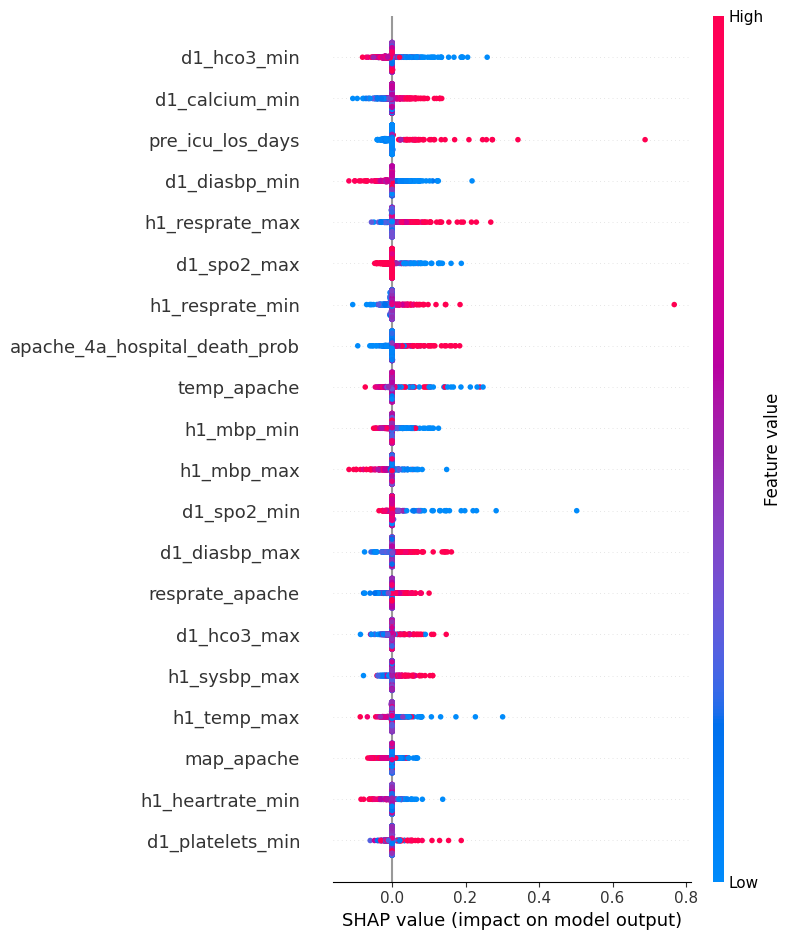

In [87]:
# Beeswarm (features sorted by importance)
shap.summary_plot(shap_values5, X_test_small)

/var/folders/wp/t4hgc9nx4s90xpch3k5c7kqr0000gn/T/ipykernel_63038/3226082652.py:2: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values5, plot_type='bar', feature_names = X_train.columns)


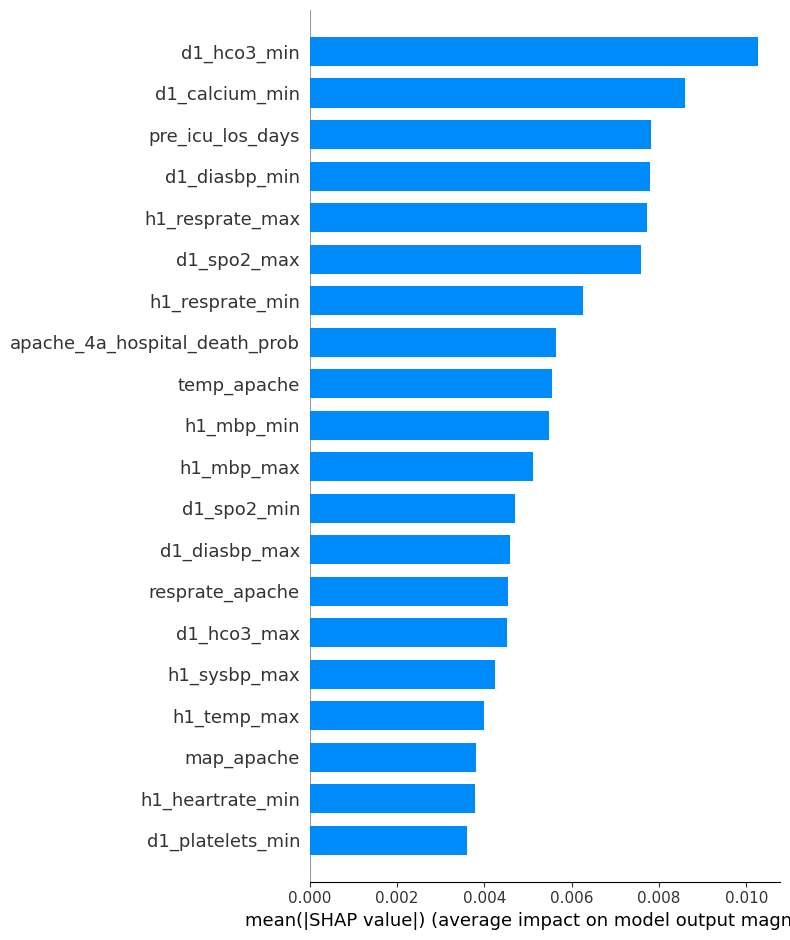

In [88]:
# Bar (mean absolute value per feature)
shap.summary_plot(shap_values5, plot_type='bar', feature_names = X_train.columns)

In [89]:
explainer5.expected_value

0.23171342708170414

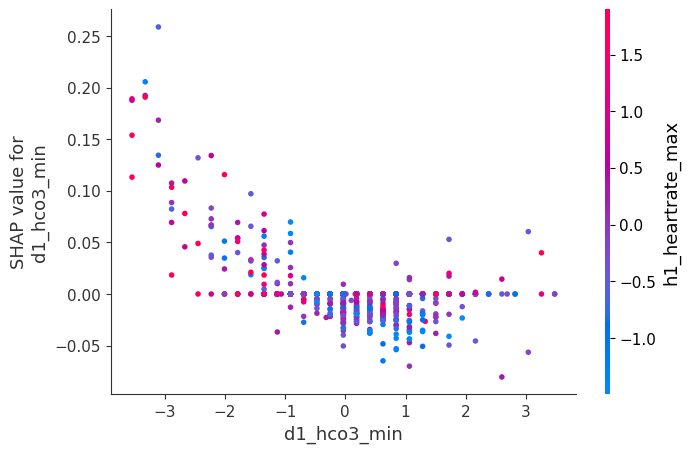

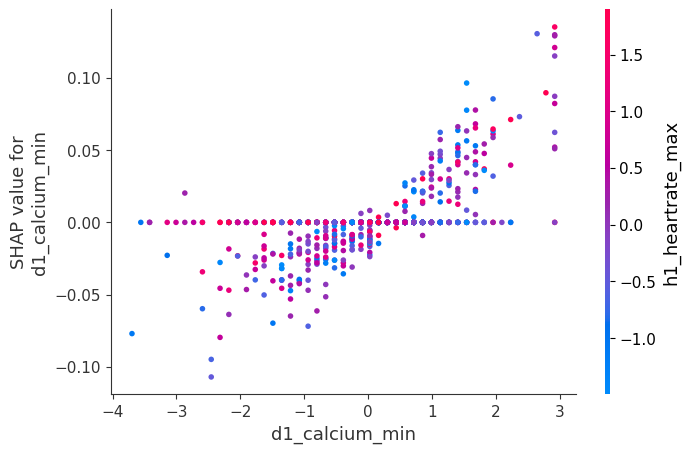

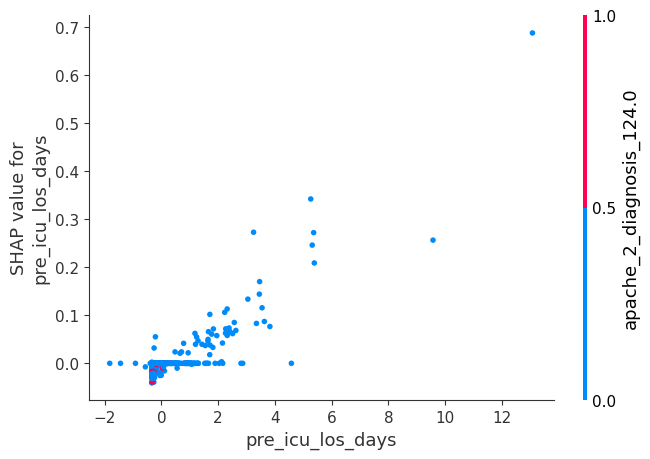

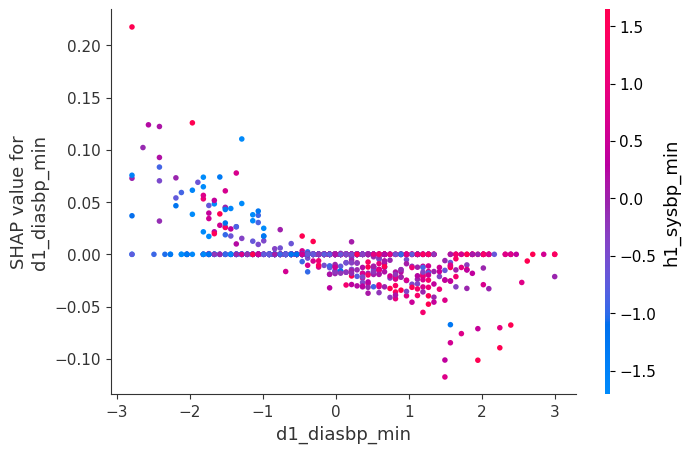

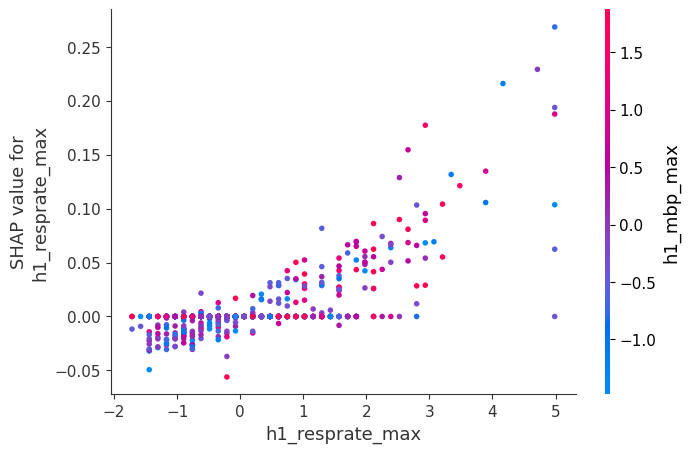

In [90]:
# Dependence plots 
# One per feature. Shows how that feature’s value vs. its SHAP effect, colored by a second feature.
# # Sort features by importance
mean_abs_shap5 = np.abs(shap_values5).mean(axis=0)
top_idx5 = np.argsort(mean_abs_shap5)[::-1]  
top_features5 = X_train.columns[top_idx5[:5]] 
for feat in top_features5:
    shap.dependence_plot(feat, shap_values5, X_test_small)

In [92]:
# Decision plot 
# Tracks cumulative impact of features for each sample
# pick 50 random test rows

# Doesn't work
# use the same X_small as above
# shap_exp5 = explainer5(X_small)
# shap.decision_plot(
#     explainer5.expected_value,
#     shap_exp5.values,
#     X_small,
#     ignore_warnings=True     
# )

# LIME

## Logistic Regression

In [93]:
rng = np.random.RandomState(42)

explainer_l = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns.tolist(),
    class_names=['Class 0', 'Class 1'],
    mode='classification',
    random_state = rng
)

# Explain a prediction (e.g., the 5th sample)
i = 5
exp = explainer_l.explain_instance(X_test.iloc[i].values, log_clf_bal.predict_proba, num_features=10)
exp.show_in_notebook(show_all=False)

/opt/anaconda3/envs/dp-env/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [94]:
exp.save_to_file('lime_lg.html')

## XGBoost

In [95]:
explainer_l2 = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns.tolist(),
    class_names=['Class 0', 'Class 1'],
    mode='classification',
    random_state  = rng
)

# Explain a prediction (e.g., the 5th sample)
i = 5
exp = explainer_l2.explain_instance(X_test.iloc[i].values, xgb_clf.predict_proba, num_features=10)
exp.show_in_notebook(show_all=False)

In [96]:
exp.save_to_file('lime_xgboost.html')

## MLP

In [107]:
def predict_fn_mlp_proba(X):
    # turn anything array-like into a DataFrame so that
    # X_train.columns alignment still works
    if not hasattr(X, "columns"):
        X = pd.DataFrame(X, columns=X_train.columns)
        
    X_np = X.values  # same as np.array(X)
    probs = model_mc(X_np, training=False).numpy()
    
    # now handle the different shapes
    if probs.ndim == 1:
        # e.g. shape (N,) → assume these are P(y=1)
        p1 = probs
        p0 = 1.0 - p1
        out = np.vstack([p0, p1]).T

    elif probs.ndim == 2 and probs.shape[1] == 1:
        # e.g. shape (N,1) → same situation
        p1 = probs[:, 0]
        p0 = 1.0 - p1
        out = np.vstack([p0, p1]).T

    elif probs.ndim == 2 and probs.shape[1] == 2:
        # already (N,2) → [P(y=0), P(y=1)]
        out = probs

    else:
        raise ValueError(f"Unexpected model output shape: {probs.shape}")

    # sanity check
    if out.shape[0] != X.shape[0]:
        raise ValueError(
            f"Mismatch! Got {out.shape[0]} predictions for {X.shape[0]} inputs."
        )

    return out

In [108]:
explainer_l3 = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns.tolist(),
    class_names=['Class 0', 'Class 1'],
    mode='classification',
    random_state  = rng
)

# Explain a prediction (e.g., the 5th sample)
i = 5
exp = explainer_l3.explain_instance(X_test.iloc[i].values, predict_fn_mlp_proba, num_features=10)
exp.show_in_notebook(show_all=False)

In [109]:
exp.save_to_file('lime_mlp.html')

## Logistic Regression - DP

In [110]:
# 1. Set random state
rng = np.random.RandomState(42)

# 2. Create a LIME explainer based on your (non-clipped) training set
explainer_l_dp = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),    # ← Same X_train as before (not clipped version)
    feature_names=X_train.columns.tolist(),
    class_names=['Class 0', 'Class 1'],
    mode='classification',
    random_state=rng
)

# 3. Define a prediction function that uses your DP Logistic model
def dp_logistic_predict_fn(X):
    if not hasattr(X, "columns"):
        X = pd.DataFrame(X, columns=X_train.columns)
    X_clipped = X.copy()
    row_norms = np.linalg.norm(X_clipped.values, axis=1)
    X_clipped.values[:] = X_clipped.values / np.maximum(1.0, row_norms.reshape(-1, 1))
    return dp_logistic_model.predict_proba(X_clipped)

# 4. Explain a prediction
i = 5  # index of the test sample to explain
exp = explainer_l_dp.explain_instance(X_test.iloc[i].values, dp_logistic_predict_fn, num_features=10)

# 5. Show explanation
exp.show_in_notebook(show_all=False)

In [111]:
exp.save_to_file('lime_lg_dp.html')

## MLP - DP

In [113]:
# 1. Random seed for LIME
rng = np.random.RandomState(42)

# 2. Create LIME explainer
explainer_lime_dp_mlp = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns.tolist(),
    class_names=['Class 0', 'Class 1'],
    mode='classification',
    random_state=rng
)

# 3. Define prediction function for DP MLP
def predict_fn_dp_mlp(X):
    if not hasattr(X, "columns"):
        X = pd.DataFrame(X, columns=X_train.columns)
    
    X_np = X.values  # Convert DataFrame to NumPy array
    probs = dp_mlp_model.predict(X_np, batch_size=256)

    if probs.ndim == 1:
        p1 = probs
        p0 = 1.0 - p1
        out = np.vstack([p0, p1]).T
    elif probs.ndim == 2 and probs.shape[1] == 1:
        p1 = probs[:, 0]
        p0 = 1.0 - p1
        out = np.vstack([p0, p1]).T
    elif probs.ndim == 2 and probs.shape[1] == 2:
        out = probs
    else:
        raise ValueError(f"Unexpected model output shape: {probs.shape}")

    if out.shape[0] != X.shape[0]:
        raise ValueError(f"Mismatch! Got {out.shape[0]} predictions for {X.shape[0]} inputs.")

    return out

# 4. Explain one prediction
i = 5  # sample index
exp = explainer_lime_dp_mlp.explain_instance(X_test.iloc[i].values, predict_fn_dp_mlp, num_features=10)

# 5. Show explanation
exp.show_in_notebook(show_all=False)


20/20 [==============================] - 0s 5ms/step


In [114]:
exp.save_to_file('lime_mlp_dp.html')